In [1]:
import os
import os.path
import glob
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold                                                                                                                       
from sklearn.metrics import confusion_matrix,accuracy_score

import matplotlib.pyplot as plt
import matplotlib.cm as colormap
plt.rcParams['image.cmap'] = 'Pastel1'

import numpy as np
np.random.seed(1)

from keras.preprocessing.image import img_to_array
from keras.utils import np_utils
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50
from keras.applications.imagenet_utils import preprocess_input
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential,Model
from keras.layers import Input,Flatten,Dense,Dropout,GlobalAveragePooling2D,Conv2D,MaxPooling2D

Using TensorFlow backend.


In [2]:
imagedir = "retina-dataset"

In [3]:
cur_dir = os.getcwd()
os.chdir(imagedir)  # the parent folder with sub-folders

# Get number of samples per family
list_fams = sorted(os.listdir(os.getcwd()), key=str.lower)  # vector of strings with family names
no_imgs = []  # No. of samples per family
for i in range(len(list_fams)):
    os.chdir(list_fams[i])
    len1 = len(glob.glob('*.png'))  # assuming the images are stored as 'png'
    no_imgs.append(len1)
    os.chdir('..')
num_samples = np.sum(no_imgs)  # total number of all samples

# Compute the labels
y = np.zeros(num_samples)
pos = 0
label = 0
for i in no_imgs:
    print ("Label:%2d\tFamily: %15s\tNumber of images: %d" % (label, list_fams[label], i))
    for j in range(i):
        y[pos] = label
        pos += 1
    label += 1
num_classes = label

# Compute the features
width, height,channels = (224,224,3)
#X = np.zeros((num_samples, width, height, channels))
cnt = 0
#list_paths = [] # List of image paths
print("Processing images ...")
for i in range(len(list_fams)):
    for img_file in glob.glob(list_fams[i]+'/*.png'):
        #print("[%d] Processing image: %s" % (cnt, img_file))
        #list_paths.append(os.path.join(os.getcwd(),img_file))
        #img = image.load_img(img_file, target_size=(224, 224))
        #x = image.img_to_array(img)
        #x = np.expand_dims(x, axis=0)
        #x = preprocess_input(x)
        #X[cnt] = x
        cnt += 1
print("Images processed: %d" %(cnt))

os.chdir(cur_dir)

Label: 0	Family:         Exudate	Number of images: 67600
Label: 1	Family:     Non_Exudate	Number of images: 70043
Processing images ...
Images processed: 137643


In [4]:
#X.shape

In [5]:
# Encoding classes (y) into integers (y_encoded) and then generating one-hot-encoding (Y)
encoder = LabelEncoder()
encoder.fit(y)
y_encoded = encoder.transform(y)
Y = np_utils.to_categorical(y_encoded)

In [6]:
# Creating base_model (ResNet50 notop)
image_shape = (224, 224, 3)                                                                                                                                                                                                                                                                                            
base_model = ResNet50(weights='imagenet', input_shape=image_shape, include_top=False, pooling='avg')

In [7]:
filename = 'retina-resnet50features-avgpool.npy'
if os.path.exists(filename):
    print("Loading ResNet50 extracted features from %s ..." %(filename))
    resnet50features = np.load(filename)
else:
    print("Extracting features from ResNet50 layers ...")
    resnet50features = base_model.predict(X)
    print("Saving ResNet50 extracted features into %s ..." %(filename))
    np.save(filename, resnet50features)

Loading ResNet50 extracted features from retina-resnet50features-avgpool.npy ...


In [8]:
resnet50features.shape

(137643, 2048)

In [9]:
# Create stratified k-fold subsets                                                                                                                                        
kfold = 10  # no. of folds                                                                 
skf = StratifiedKFold(kfold, shuffle=True,random_state=1)
skfind = [None] * kfold  # skfind[i][0] -> train indices, skfind[i][1] -> test indices
cnt = 0                                              
#for index in skf.split(X, y):    
for index in skf.split(resnet50features, y):         
    skfind[cnt] = index                                                 
    cnt += 1 

In [10]:
# Training top_model and saving min training loss weights
num_epochs=20000
history = []
conf_mat = np.zeros((len(list_fams),len(list_fams))) # Initializing the Confusion Matrix
early_stopping = EarlyStopping(verbose=1, patience=20, monitor='val_loss')
checkpointer = ModelCheckpoint(filepath='retina-10fold-topweights-max_val_acc-resnet50-Adam-20000epochs_earlystop.h5', monitor='val_acc', verbose=0, save_best_only=True, save_weights_only=True, mode='max')
callbacks_list = [early_stopping, checkpointer]
for i in range(kfold):
    train_indices = skfind[i][0]
    test_indices = skfind[i][1]
    X_train = resnet50features[train_indices]
    Y_train = Y[train_indices]
    X_test = resnet50features[test_indices]
    Y_test = Y[test_indices]
    y_test = y[test_indices]

    top_input = Input(shape=resnet50features.shape[1:])
    predict = Dense(num_classes, activation='softmax', name='predictions')(top_input)
    top_model = Model(input=top_input, output=predict)                            
    top_model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

    start = time.time()
    h = top_model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=num_epochs, batch_size=X_train.shape[0], verbose=1, callbacks=callbacks_list)
    end = time.time()
    history.append(h)
    
    y_prob = top_model.predict(X_test, verbose=0)  # Testing
    y_pred = np.argmax(y_prob, axis=1)
    print("[%d] Test acurracy: %.4f (%.4f s)" %(i,accuracy_score(y_test,y_pred),end-start))
    cm = confusion_matrix(y_test,y_pred)  # Compute confusion matrix for this fold
    conf_mat = conf_mat + cm  # Compute global confusion matrix

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:19: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("pr..., inputs=Tensor("in...)`


Train on 123878 samples, validate on 13765 samples
Epoch 1/20000
123878/123878 [==============================] - 1s - loss: 0.7912 - acc: 0.4852 - val_loss: 0.6850 - val_acc: 0.5166
Epoch 2/20000
123878/123878 [==============================] - 1s - loss: 0.6871 - acc: 0.5158 - val_loss: 0.6443 - val_acc: 0.6730
Epoch 3/20000
123878/123878 [==============================] - 1s - loss: 0.6465 - acc: 0.6640 - val_loss: 0.6363 - val_acc: 0.6391
Epoch 4/20000
123878/123878 [==============================] - 1s - loss: 0.6386 - acc: 0.6362 - val_loss: 0.6280 - val_acc: 0.6318
Epoch 5/20000
123878/123878 [==============================] - 1s - loss: 0.6303 - acc: 0.6288 - val_loss: 0.6078 - val_acc: 0.6606
Epoch 6/20000
123878/123878 [==============================] - 1s - loss: 0.6101 - acc: 0.6577 - val_loss: 0.5805 - val_acc: 0.7079
Epoch 7/20000
123878/123878 [==============================] - 1s - loss: 0.5827 - acc: 0.7052 - val_loss: 0.5536 - val_acc: 0.7478
Epoch 8/20000
123878/1238

123878/123878 [==============================] - 1s - loss: 0.3788 - acc: 0.8259 - val_loss: 0.3783 - val_acc: 0.8281
Epoch 63/20000
123878/123878 [==============================] - 1s - loss: 0.3776 - acc: 0.8270 - val_loss: 0.3770 - val_acc: 0.8291
Epoch 64/20000
123878/123878 [==============================] - 1s - loss: 0.3763 - acc: 0.8278 - val_loss: 0.3757 - val_acc: 0.8297
Epoch 65/20000
123878/123878 [==============================] - 1s - loss: 0.3750 - acc: 0.8288 - val_loss: 0.3745 - val_acc: 0.8307
Epoch 66/20000
123878/123878 [==============================] - 1s - loss: 0.3738 - acc: 0.8293 - val_loss: 0.3732 - val_acc: 0.8319
Epoch 67/20000
123878/123878 [==============================] - 1s - loss: 0.3726 - acc: 0.8300 - val_loss: 0.3720 - val_acc: 0.8320
Epoch 68/20000
123878/123878 [==============================] - 1s - loss: 0.3714 - acc: 0.8306 - val_loss: 0.3709 - val_acc: 0.8325
Epoch 69/20000
123878/123878 [==============================] - 1s - loss: 0.3702 - 

123878/123878 [==============================] - 1s - loss: 0.3208 - acc: 0.8653 - val_loss: 0.3215 - val_acc: 0.8633
Epoch 124/20000
123878/123878 [==============================] - 1s - loss: 0.3201 - acc: 0.8657 - val_loss: 0.3208 - val_acc: 0.8635
Epoch 125/20000
123878/123878 [==============================] - 1s - loss: 0.3194 - acc: 0.8660 - val_loss: 0.3201 - val_acc: 0.8639
Epoch 126/20000
123878/123878 [==============================] - 1s - loss: 0.3187 - acc: 0.8665 - val_loss: 0.3194 - val_acc: 0.8639
Epoch 127/20000
123878/123878 [==============================] - 1s - loss: 0.3180 - acc: 0.8670 - val_loss: 0.3187 - val_acc: 0.8641
Epoch 128/20000
123878/123878 [==============================] - 1s - loss: 0.3173 - acc: 0.8673 - val_loss: 0.3181 - val_acc: 0.8646
Epoch 129/20000
123878/123878 [==============================] - 1s - loss: 0.3166 - acc: 0.8676 - val_loss: 0.3174 - val_acc: 0.8652
Epoch 130/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2863 - acc: 0.8846 - val_loss: 0.2878 - val_acc: 0.8823
Epoch 185/20000
123878/123878 [==============================] - 1s - loss: 0.2858 - acc: 0.8849 - val_loss: 0.2873 - val_acc: 0.8825
Epoch 186/20000
123878/123878 [==============================] - 1s - loss: 0.2854 - acc: 0.8851 - val_loss: 0.2869 - val_acc: 0.8827
Epoch 187/20000
123878/123878 [==============================] - 1s - loss: 0.2850 - acc: 0.8854 - val_loss: 0.2864 - val_acc: 0.8829
Epoch 188/20000
123878/123878 [==============================] - 1s - loss: 0.2845 - acc: 0.8856 - val_loss: 0.2860 - val_acc: 0.8830
Epoch 189/20000
123878/123878 [==============================] - 1s - loss: 0.2841 - acc: 0.8859 - val_loss: 0.2856 - val_acc: 0.8830
Epoch 190/20000
123878/123878 [==============================] - 1s - loss: 0.2836 - acc: 0.8862 - val_loss: 0.2852 - val_acc: 0.8833
Epoch 191/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2633 - acc: 0.8958 - val_loss: 0.2651 - val_acc: 0.8942
Epoch 246/20000
123878/123878 [==============================] - 1s - loss: 0.2630 - acc: 0.8960 - val_loss: 0.2648 - val_acc: 0.8944
Epoch 247/20000
123878/123878 [==============================] - 1s - loss: 0.2627 - acc: 0.8961 - val_loss: 0.2645 - val_acc: 0.8947
Epoch 248/20000
123878/123878 [==============================] - 1s - loss: 0.2624 - acc: 0.8962 - val_loss: 0.2642 - val_acc: 0.8947
Epoch 249/20000
123878/123878 [==============================] - 1s - loss: 0.2621 - acc: 0.8963 - val_loss: 0.2639 - val_acc: 0.8947
Epoch 250/20000
123878/123878 [==============================] - 1s - loss: 0.2617 - acc: 0.8964 - val_loss: 0.2636 - val_acc: 0.8948
Epoch 251/20000
123878/123878 [==============================] - 1s - loss: 0.2614 - acc: 0.8966 - val_loss: 0.2633 - val_acc: 0.8949
Epoch 252/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2465 - acc: 0.9027 - val_loss: 0.2485 - val_acc: 0.9005
Epoch 307/20000
123878/123878 [==============================] - 1s - loss: 0.2463 - acc: 0.9028 - val_loss: 0.2483 - val_acc: 0.9009
Epoch 308/20000
123878/123878 [==============================] - 1s - loss: 0.2461 - acc: 0.9029 - val_loss: 0.2480 - val_acc: 0.9011
Epoch 309/20000
123878/123878 [==============================] - 1s - loss: 0.2458 - acc: 0.9030 - val_loss: 0.2478 - val_acc: 0.9011
Epoch 310/20000
123878/123878 [==============================] - 1s - loss: 0.2456 - acc: 0.9031 - val_loss: 0.2476 - val_acc: 0.9013
Epoch 311/20000
123878/123878 [==============================] - 1s - loss: 0.2454 - acc: 0.9032 - val_loss: 0.2473 - val_acc: 0.9014
Epoch 312/20000
123878/123878 [==============================] - 1s - loss: 0.2451 - acc: 0.9033 - val_loss: 0.2471 - val_acc: 0.9013
Epoch 313/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2336 - acc: 0.9080 - val_loss: 0.2356 - val_acc: 0.9071
Epoch 368/20000
123878/123878 [==============================] - 1s - loss: 0.2334 - acc: 0.9080 - val_loss: 0.2355 - val_acc: 0.9071
Epoch 369/20000
123878/123878 [==============================] - 1s - loss: 0.2332 - acc: 0.9081 - val_loss: 0.2353 - val_acc: 0.9072
Epoch 370/20000
123878/123878 [==============================] - 1s - loss: 0.2330 - acc: 0.9082 - val_loss: 0.2351 - val_acc: 0.9073
Epoch 371/20000
123878/123878 [==============================] - 1s - loss: 0.2328 - acc: 0.9083 - val_loss: 0.2349 - val_acc: 0.9073
Epoch 372/20000
123878/123878 [==============================] - 1s - loss: 0.2327 - acc: 0.9084 - val_loss: 0.2347 - val_acc: 0.9073
Epoch 373/20000
123878/123878 [==============================] - 1s - loss: 0.2325 - acc: 0.9084 - val_loss: 0.2345 - val_acc: 0.9074
Epoch 374/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2232 - acc: 0.9124 - val_loss: 0.2253 - val_acc: 0.9113
Epoch 429/20000
123878/123878 [==============================] - 1s - loss: 0.2230 - acc: 0.9125 - val_loss: 0.2251 - val_acc: 0.9114
Epoch 430/20000
123878/123878 [==============================] - 1s - loss: 0.2229 - acc: 0.9125 - val_loss: 0.2250 - val_acc: 0.9114
Epoch 431/20000
123878/123878 [==============================] - 1s - loss: 0.2227 - acc: 0.9126 - val_loss: 0.2248 - val_acc: 0.9115
Epoch 432/20000
123878/123878 [==============================] - 1s - loss: 0.2226 - acc: 0.9127 - val_loss: 0.2247 - val_acc: 0.9115
Epoch 433/20000
123878/123878 [==============================] - 1s - loss: 0.2224 - acc: 0.9127 - val_loss: 0.2245 - val_acc: 0.9114
Epoch 434/20000
123878/123878 [==============================] - 1s - loss: 0.2223 - acc: 0.9128 - val_loss: 0.2244 - val_acc: 0.9114
Epoch 435/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2146 - acc: 0.9156 - val_loss: 0.2167 - val_acc: 0.9146
Epoch 490/20000
123878/123878 [==============================] - 1s - loss: 0.2145 - acc: 0.9156 - val_loss: 0.2166 - val_acc: 0.9146
Epoch 491/20000
123878/123878 [==============================] - 1s - loss: 0.2143 - acc: 0.9157 - val_loss: 0.2165 - val_acc: 0.9147
Epoch 492/20000
123878/123878 [==============================] - 1s - loss: 0.2142 - acc: 0.9157 - val_loss: 0.2163 - val_acc: 0.9148
Epoch 493/20000
123878/123878 [==============================] - 1s - loss: 0.2141 - acc: 0.9158 - val_loss: 0.2162 - val_acc: 0.9149
Epoch 494/20000
123878/123878 [==============================] - 1s - loss: 0.2140 - acc: 0.9159 - val_loss: 0.2161 - val_acc: 0.9149
Epoch 495/20000
123878/123878 [==============================] - 1s - loss: 0.2138 - acc: 0.9159 - val_loss: 0.2159 - val_acc: 0.9149
Epoch 496/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2073 - acc: 0.9187 - val_loss: 0.2095 - val_acc: 0.9183
Epoch 551/20000
123878/123878 [==============================] - 1s - loss: 0.2072 - acc: 0.9188 - val_loss: 0.2094 - val_acc: 0.9183
Epoch 552/20000
123878/123878 [==============================] - 1s - loss: 0.2071 - acc: 0.9189 - val_loss: 0.2093 - val_acc: 0.9183
Epoch 553/20000
123878/123878 [==============================] - 1s - loss: 0.2070 - acc: 0.9189 - val_loss: 0.2091 - val_acc: 0.9184
Epoch 554/20000
123878/123878 [==============================] - 1s - loss: 0.2069 - acc: 0.9189 - val_loss: 0.2090 - val_acc: 0.9185
Epoch 555/20000
123878/123878 [==============================] - 1s - loss: 0.2068 - acc: 0.9189 - val_loss: 0.2089 - val_acc: 0.9185
Epoch 556/20000
123878/123878 [==============================] - 1s - loss: 0.2067 - acc: 0.9189 - val_loss: 0.2088 - val_acc: 0.9185
Epoch 557/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2011 - acc: 0.9209 - val_loss: 0.2033 - val_acc: 0.9210
Epoch 612/20000
123878/123878 [==============================] - 1s - loss: 0.2010 - acc: 0.9210 - val_loss: 0.2032 - val_acc: 0.9211
Epoch 613/20000
123878/123878 [==============================] - 1s - loss: 0.2009 - acc: 0.9209 - val_loss: 0.2031 - val_acc: 0.9211
Epoch 614/20000
123878/123878 [==============================] - 1s - loss: 0.2008 - acc: 0.9209 - val_loss: 0.2030 - val_acc: 0.9212
Epoch 615/20000
123878/123878 [==============================] - 1s - loss: 0.2007 - acc: 0.9210 - val_loss: 0.2029 - val_acc: 0.9211
Epoch 616/20000
123878/123878 [==============================] - 1s - loss: 0.2006 - acc: 0.9209 - val_loss: 0.2028 - val_acc: 0.9211
Epoch 617/20000
123878/123878 [==============================] - 1s - loss: 0.2005 - acc: 0.9210 - val_loss: 0.2027 - val_acc: 0.9212
Epoch 618/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1957 - acc: 0.9229 - val_loss: 0.1978 - val_acc: 0.9231
Epoch 673/20000
123878/123878 [==============================] - 1s - loss: 0.1956 - acc: 0.9230 - val_loss: 0.1977 - val_acc: 0.9232
Epoch 674/20000
123878/123878 [==============================] - 1s - loss: 0.1955 - acc: 0.9231 - val_loss: 0.1977 - val_acc: 0.9232
Epoch 675/20000
123878/123878 [==============================] - 1s - loss: 0.1954 - acc: 0.9231 - val_loss: 0.1976 - val_acc: 0.9231
Epoch 676/20000
123878/123878 [==============================] - 1s - loss: 0.1953 - acc: 0.9231 - val_loss: 0.1975 - val_acc: 0.9232
Epoch 677/20000
123878/123878 [==============================] - 1s - loss: 0.1953 - acc: 0.9231 - val_loss: 0.1974 - val_acc: 0.9232
Epoch 678/20000
123878/123878 [==============================] - 1s - loss: 0.1952 - acc: 0.9232 - val_loss: 0.1973 - val_acc: 0.9232
Epoch 679/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1909 - acc: 0.9248 - val_loss: 0.1931 - val_acc: 0.9251
Epoch 734/20000
123878/123878 [==============================] - 1s - loss: 0.1908 - acc: 0.9249 - val_loss: 0.1930 - val_acc: 0.9252
Epoch 735/20000
123878/123878 [==============================] - 1s - loss: 0.1907 - acc: 0.9250 - val_loss: 0.1929 - val_acc: 0.9252
Epoch 736/20000
123878/123878 [==============================] - 1s - loss: 0.1906 - acc: 0.9250 - val_loss: 0.1928 - val_acc: 0.9252
Epoch 737/20000
123878/123878 [==============================] - 1s - loss: 0.1906 - acc: 0.9250 - val_loss: 0.1928 - val_acc: 0.9252
Epoch 738/20000
123878/123878 [==============================] - 1s - loss: 0.1905 - acc: 0.9251 - val_loss: 0.1927 - val_acc: 0.9252
Epoch 739/20000
123878/123878 [==============================] - 1s - loss: 0.1904 - acc: 0.9251 - val_loss: 0.1926 - val_acc: 0.9252
Epoch 740/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1866 - acc: 0.9266 - val_loss: 0.1888 - val_acc: 0.9274
Epoch 795/20000
123878/123878 [==============================] - 1s - loss: 0.1865 - acc: 0.9266 - val_loss: 0.1887 - val_acc: 0.9273
Epoch 796/20000
123878/123878 [==============================] - 1s - loss: 0.1865 - acc: 0.9267 - val_loss: 0.1887 - val_acc: 0.9273
Epoch 797/20000
123878/123878 [==============================] - 1s - loss: 0.1864 - acc: 0.9267 - val_loss: 0.1886 - val_acc: 0.9273
Epoch 798/20000
123878/123878 [==============================] - 1s - loss: 0.1863 - acc: 0.9267 - val_loss: 0.1885 - val_acc: 0.9274
Epoch 799/20000
123878/123878 [==============================] - 1s - loss: 0.1863 - acc: 0.9268 - val_loss: 0.1885 - val_acc: 0.9274
Epoch 800/20000
123878/123878 [==============================] - 1s - loss: 0.1862 - acc: 0.9268 - val_loss: 0.1884 - val_acc: 0.9274
Epoch 801/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1827 - acc: 0.9281 - val_loss: 0.1850 - val_acc: 0.9287
Epoch 856/20000
123878/123878 [==============================] - 1s - loss: 0.1827 - acc: 0.9281 - val_loss: 0.1849 - val_acc: 0.9287
Epoch 857/20000
123878/123878 [==============================] - 1s - loss: 0.1826 - acc: 0.9281 - val_loss: 0.1849 - val_acc: 0.9287
Epoch 858/20000
123878/123878 [==============================] - 1s - loss: 0.1826 - acc: 0.9282 - val_loss: 0.1848 - val_acc: 0.9287
Epoch 859/20000
123878/123878 [==============================] - 1s - loss: 0.1825 - acc: 0.9282 - val_loss: 0.1847 - val_acc: 0.9287
Epoch 860/20000
123878/123878 [==============================] - 1s - loss: 0.1824 - acc: 0.9282 - val_loss: 0.1847 - val_acc: 0.9287
Epoch 861/20000
123878/123878 [==============================] - 1s - loss: 0.1824 - acc: 0.9283 - val_loss: 0.1846 - val_acc: 0.9288
Epoch 862/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1793 - acc: 0.9295 - val_loss: 0.1815 - val_acc: 0.9296
Epoch 917/20000
123878/123878 [==============================] - 1s - loss: 0.1792 - acc: 0.9295 - val_loss: 0.1815 - val_acc: 0.9296
Epoch 918/20000
123878/123878 [==============================] - 1s - loss: 0.1791 - acc: 0.9294 - val_loss: 0.1814 - val_acc: 0.9296
Epoch 919/20000
123878/123878 [==============================] - 1s - loss: 0.1791 - acc: 0.9294 - val_loss: 0.1814 - val_acc: 0.9296
Epoch 920/20000
123878/123878 [==============================] - 1s - loss: 0.1790 - acc: 0.9295 - val_loss: 0.1813 - val_acc: 0.9296
Epoch 921/20000
123878/123878 [==============================] - 1s - loss: 0.1790 - acc: 0.9295 - val_loss: 0.1813 - val_acc: 0.9296
Epoch 922/20000
123878/123878 [==============================] - 1s - loss: 0.1789 - acc: 0.9295 - val_loss: 0.1812 - val_acc: 0.9297
Epoch 923/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1761 - acc: 0.9308 - val_loss: 0.1784 - val_acc: 0.9313
Epoch 978/20000
123878/123878 [==============================] - 1s - loss: 0.1760 - acc: 0.9308 - val_loss: 0.1783 - val_acc: 0.9313
Epoch 979/20000
123878/123878 [==============================] - 1s - loss: 0.1760 - acc: 0.9308 - val_loss: 0.1783 - val_acc: 0.9314
Epoch 980/20000
123878/123878 [==============================] - 1s - loss: 0.1759 - acc: 0.9308 - val_loss: 0.1782 - val_acc: 0.9314
Epoch 981/20000
123878/123878 [==============================] - 1s - loss: 0.1759 - acc: 0.9309 - val_loss: 0.1782 - val_acc: 0.9314
Epoch 982/20000
123878/123878 [==============================] - 1s - loss: 0.1758 - acc: 0.9309 - val_loss: 0.1781 - val_acc: 0.9315
Epoch 983/20000
123878/123878 [==============================] - 1s - loss: 0.1758 - acc: 0.9309 - val_loss: 0.1781 - val_acc: 0.9315
Epoch 984/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1732 - acc: 0.9321 - val_loss: 0.1756 - val_acc: 0.9321
Epoch 1038/20000
123878/123878 [==============================] - 1s - loss: 0.1732 - acc: 0.9321 - val_loss: 0.1755 - val_acc: 0.9321
Epoch 1039/20000
123878/123878 [==============================] - 1s - loss: 0.1731 - acc: 0.9322 - val_loss: 0.1755 - val_acc: 0.9321
Epoch 1040/20000
123878/123878 [==============================] - 1s - loss: 0.1731 - acc: 0.9322 - val_loss: 0.1754 - val_acc: 0.9321
Epoch 1041/20000
123878/123878 [==============================] - 1s - loss: 0.1730 - acc: 0.9322 - val_loss: 0.1754 - val_acc: 0.9320
Epoch 1042/20000
123878/123878 [==============================] - 1s - loss: 0.1730 - acc: 0.9322 - val_loss: 0.1753 - val_acc: 0.9321
Epoch 1043/20000
123878/123878 [==============================] - 1s - loss: 0.1729 - acc: 0.9322 - val_loss: 0.1753 - val_acc: 0.9321
Epoch 1044/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1706 - acc: 0.9331 - val_loss: 0.1729 - val_acc: 0.9331
Epoch 1098/20000
123878/123878 [==============================] - 1s - loss: 0.1705 - acc: 0.9331 - val_loss: 0.1729 - val_acc: 0.9331
Epoch 1099/20000
123878/123878 [==============================] - 1s - loss: 0.1705 - acc: 0.9332 - val_loss: 0.1729 - val_acc: 0.9331
Epoch 1100/20000
123878/123878 [==============================] - 1s - loss: 0.1704 - acc: 0.9332 - val_loss: 0.1728 - val_acc: 0.9332
Epoch 1101/20000
123878/123878 [==============================] - 1s - loss: 0.1704 - acc: 0.9332 - val_loss: 0.1728 - val_acc: 0.9333
Epoch 1102/20000
123878/123878 [==============================] - 1s - loss: 0.1704 - acc: 0.9332 - val_loss: 0.1727 - val_acc: 0.9334
Epoch 1103/20000
123878/123878 [==============================] - 1s - loss: 0.1703 - acc: 0.9333 - val_loss: 0.1727 - val_acc: 0.9334
Epoch 1104/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1681 - acc: 0.9342 - val_loss: 0.1705 - val_acc: 0.9342
Epoch 1158/20000
123878/123878 [==============================] - 1s - loss: 0.1681 - acc: 0.9342 - val_loss: 0.1705 - val_acc: 0.9342
Epoch 1159/20000
123878/123878 [==============================] - 1s - loss: 0.1680 - acc: 0.9342 - val_loss: 0.1705 - val_acc: 0.9343
Epoch 1160/20000
123878/123878 [==============================] - 1s - loss: 0.1680 - acc: 0.9342 - val_loss: 0.1704 - val_acc: 0.9343
Epoch 1161/20000
123878/123878 [==============================] - 1s - loss: 0.1679 - acc: 0.9342 - val_loss: 0.1704 - val_acc: 0.9343
Epoch 1162/20000
123878/123878 [==============================] - 1s - loss: 0.1679 - acc: 0.9343 - val_loss: 0.1703 - val_acc: 0.9343
Epoch 1163/20000
123878/123878 [==============================] - 1s - loss: 0.1679 - acc: 0.9343 - val_loss: 0.1703 - val_acc: 0.9344
Epoch 1164/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1658 - acc: 0.9351 - val_loss: 0.1683 - val_acc: 0.9346
Epoch 1218/20000
123878/123878 [==============================] - 1s - loss: 0.1658 - acc: 0.9351 - val_loss: 0.1682 - val_acc: 0.9346
Epoch 1219/20000
123878/123878 [==============================] - 1s - loss: 0.1657 - acc: 0.9352 - val_loss: 0.1682 - val_acc: 0.9346
Epoch 1220/20000
123878/123878 [==============================] - 1s - loss: 0.1657 - acc: 0.9352 - val_loss: 0.1682 - val_acc: 0.9346
Epoch 1221/20000
123878/123878 [==============================] - 1s - loss: 0.1657 - acc: 0.9352 - val_loss: 0.1681 - val_acc: 0.9346
Epoch 1222/20000
123878/123878 [==============================] - 1s - loss: 0.1656 - acc: 0.9352 - val_loss: 0.1681 - val_acc: 0.9346
Epoch 1223/20000
123878/123878 [==============================] - 1s - loss: 0.1656 - acc: 0.9352 - val_loss: 0.1681 - val_acc: 0.9346
Epoch 1224/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1637 - acc: 0.9359 - val_loss: 0.1662 - val_acc: 0.9353
Epoch 1278/20000
123878/123878 [==============================] - 1s - loss: 0.1637 - acc: 0.9359 - val_loss: 0.1662 - val_acc: 0.9353
Epoch 1279/20000
123878/123878 [==============================] - 1s - loss: 0.1636 - acc: 0.9359 - val_loss: 0.1661 - val_acc: 0.9353
Epoch 1280/20000
123878/123878 [==============================] - 1s - loss: 0.1636 - acc: 0.9359 - val_loss: 0.1661 - val_acc: 0.9353
Epoch 1281/20000
123878/123878 [==============================] - 1s - loss: 0.1635 - acc: 0.9359 - val_loss: 0.1661 - val_acc: 0.9353
Epoch 1282/20000
123878/123878 [==============================] - 1s - loss: 0.1635 - acc: 0.9359 - val_loss: 0.1660 - val_acc: 0.9353
Epoch 1283/20000
123878/123878 [==============================] - 1s - loss: 0.1635 - acc: 0.9359 - val_loss: 0.1660 - val_acc: 0.9353
Epoch 1284/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1617 - acc: 0.9366 - val_loss: 0.1642 - val_acc: 0.9364
Epoch 1338/20000
123878/123878 [==============================] - 1s - loss: 0.1617 - acc: 0.9366 - val_loss: 0.1642 - val_acc: 0.9364
Epoch 1339/20000
123878/123878 [==============================] - 1s - loss: 0.1616 - acc: 0.9366 - val_loss: 0.1642 - val_acc: 0.9364
Epoch 1340/20000
123878/123878 [==============================] - 1s - loss: 0.1616 - acc: 0.9366 - val_loss: 0.1641 - val_acc: 0.9364
Epoch 1341/20000
123878/123878 [==============================] - 1s - loss: 0.1616 - acc: 0.9366 - val_loss: 0.1641 - val_acc: 0.9364
Epoch 1342/20000
123878/123878 [==============================] - 1s - loss: 0.1615 - acc: 0.9366 - val_loss: 0.1641 - val_acc: 0.9364
Epoch 1343/20000
123878/123878 [==============================] - 1s - loss: 0.1615 - acc: 0.9366 - val_loss: 0.1640 - val_acc: 0.9364
Epoch 1344/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1598 - acc: 0.9376 - val_loss: 0.1624 - val_acc: 0.9369
Epoch 1398/20000
123878/123878 [==============================] - 1s - loss: 0.1598 - acc: 0.9376 - val_loss: 0.1624 - val_acc: 0.9369
Epoch 1399/20000
123878/123878 [==============================] - 1s - loss: 0.1597 - acc: 0.9376 - val_loss: 0.1623 - val_acc: 0.9369
Epoch 1400/20000
123878/123878 [==============================] - 1s - loss: 0.1597 - acc: 0.9376 - val_loss: 0.1623 - val_acc: 0.9369
Epoch 1401/20000
123878/123878 [==============================] - 1s - loss: 0.1597 - acc: 0.9377 - val_loss: 0.1623 - val_acc: 0.9369
Epoch 1402/20000
123878/123878 [==============================] - 1s - loss: 0.1597 - acc: 0.9377 - val_loss: 0.1623 - val_acc: 0.9369
Epoch 1403/20000
123878/123878 [==============================] - 1s - loss: 0.1596 - acc: 0.9378 - val_loss: 0.1622 - val_acc: 0.9369
Epoch 1404/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1580 - acc: 0.9383 - val_loss: 0.1607 - val_acc: 0.9371
Epoch 1458/20000
123878/123878 [==============================] - 1s - loss: 0.1580 - acc: 0.9383 - val_loss: 0.1607 - val_acc: 0.9371
Epoch 1459/20000
123878/123878 [==============================] - 1s - loss: 0.1580 - acc: 0.9384 - val_loss: 0.1606 - val_acc: 0.9371
Epoch 1460/20000
123878/123878 [==============================] - 1s - loss: 0.1579 - acc: 0.9384 - val_loss: 0.1606 - val_acc: 0.9371
Epoch 1461/20000
123878/123878 [==============================] - 1s - loss: 0.1579 - acc: 0.9384 - val_loss: 0.1606 - val_acc: 0.9371
Epoch 1462/20000
123878/123878 [==============================] - 1s - loss: 0.1579 - acc: 0.9384 - val_loss: 0.1605 - val_acc: 0.9372
Epoch 1463/20000
123878/123878 [==============================] - 1s - loss: 0.1579 - acc: 0.9384 - val_loss: 0.1605 - val_acc: 0.9372
Epoch 1464/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1564 - acc: 0.9389 - val_loss: 0.1591 - val_acc: 0.9374
Epoch 1518/20000
123878/123878 [==============================] - 1s - loss: 0.1563 - acc: 0.9389 - val_loss: 0.1590 - val_acc: 0.9374
Epoch 1519/20000
123878/123878 [==============================] - 1s - loss: 0.1563 - acc: 0.9389 - val_loss: 0.1590 - val_acc: 0.9374
Epoch 1520/20000
123878/123878 [==============================] - 1s - loss: 0.1563 - acc: 0.9389 - val_loss: 0.1590 - val_acc: 0.9373
Epoch 1521/20000
123878/123878 [==============================] - 1s - loss: 0.1562 - acc: 0.9390 - val_loss: 0.1590 - val_acc: 0.9373
Epoch 1522/20000
123878/123878 [==============================] - 1s - loss: 0.1562 - acc: 0.9390 - val_loss: 0.1589 - val_acc: 0.9373
Epoch 1523/20000
123878/123878 [==============================] - 1s - loss: 0.1562 - acc: 0.9390 - val_loss: 0.1589 - val_acc: 0.9373
Epoch 1524/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1548 - acc: 0.9395 - val_loss: 0.1575 - val_acc: 0.9378
Epoch 1578/20000
123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9395 - val_loss: 0.1575 - val_acc: 0.9378
Epoch 1579/20000
123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9395 - val_loss: 0.1575 - val_acc: 0.9378
Epoch 1580/20000
123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9395 - val_loss: 0.1575 - val_acc: 0.9379
Epoch 1581/20000
123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9395 - val_loss: 0.1574 - val_acc: 0.9379
Epoch 1582/20000
123878/123878 [==============================] - 1s - loss: 0.1546 - acc: 0.9395 - val_loss: 0.1574 - val_acc: 0.9379
Epoch 1583/20000
123878/123878 [==============================] - 1s - loss: 0.1546 - acc: 0.9395 - val_loss: 0.1574 - val_acc: 0.9380
Epoch 1584/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1533 - acc: 0.9401 - val_loss: 0.1561 - val_acc: 0.9388
Epoch 1638/20000
123878/123878 [==============================] - 1s - loss: 0.1532 - acc: 0.9401 - val_loss: 0.1561 - val_acc: 0.9388
Epoch 1639/20000
123878/123878 [==============================] - 1s - loss: 0.1532 - acc: 0.9401 - val_loss: 0.1560 - val_acc: 0.9388
Epoch 1640/20000
123878/123878 [==============================] - 1s - loss: 0.1532 - acc: 0.9401 - val_loss: 0.1560 - val_acc: 0.9388
Epoch 1641/20000
123878/123878 [==============================] - 1s - loss: 0.1532 - acc: 0.9401 - val_loss: 0.1560 - val_acc: 0.9388
Epoch 1642/20000
123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9402 - val_loss: 0.1560 - val_acc: 0.9388
Epoch 1643/20000
123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9402 - val_loss: 0.1559 - val_acc: 0.9388
Epoch 1644/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1547 - val_acc: 0.9390
Epoch 1698/20000
123878/123878 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1547 - val_acc: 0.9390
Epoch 1699/20000
123878/123878 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1547 - val_acc: 0.9390
Epoch 1700/20000
123878/123878 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1546 - val_acc: 0.9390
Epoch 1701/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1546 - val_acc: 0.9390
Epoch 1702/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1546 - val_acc: 0.9391
Epoch 1703/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1546 - val_acc: 0.9391
Epoch 1704/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1505 - acc: 0.9414 - val_loss: 0.1534 - val_acc: 0.9395
Epoch 1758/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1534 - val_acc: 0.9395
Epoch 1759/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1534 - val_acc: 0.9395
Epoch 1760/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1533 - val_acc: 0.9395
Epoch 1761/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1533 - val_acc: 0.9395
Epoch 1762/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1533 - val_acc: 0.9395
Epoch 1763/20000
123878/123878 [==============================] - 1s - loss: 0.1503 - acc: 0.9414 - val_loss: 0.1533 - val_acc: 0.9395
Epoch 1764/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1492 - acc: 0.9417 - val_loss: 0.1522 - val_acc: 0.9405
Epoch 1818/20000
123878/123878 [==============================] - 1s - loss: 0.1491 - acc: 0.9417 - val_loss: 0.1521 - val_acc: 0.9405
Epoch 1819/20000
123878/123878 [==============================] - 1s - loss: 0.1491 - acc: 0.9417 - val_loss: 0.1521 - val_acc: 0.9406
Epoch 1820/20000
123878/123878 [==============================] - 1s - loss: 0.1491 - acc: 0.9418 - val_loss: 0.1521 - val_acc: 0.9406
Epoch 1821/20000
123878/123878 [==============================] - 1s - loss: 0.1491 - acc: 0.9418 - val_loss: 0.1521 - val_acc: 0.9406
Epoch 1822/20000
123878/123878 [==============================] - 1s - loss: 0.1491 - acc: 0.9418 - val_loss: 0.1521 - val_acc: 0.9406
Epoch 1823/20000
123878/123878 [==============================] - 1s - loss: 0.1490 - acc: 0.9418 - val_loss: 0.1520 - val_acc: 0.9406
Epoch 1824/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1479 - acc: 0.9423 - val_loss: 0.1510 - val_acc: 0.9414
Epoch 1878/20000
123878/123878 [==============================] - 1s - loss: 0.1479 - acc: 0.9423 - val_loss: 0.1510 - val_acc: 0.9414
Epoch 1879/20000
123878/123878 [==============================] - 1s - loss: 0.1479 - acc: 0.9423 - val_loss: 0.1509 - val_acc: 0.9414
Epoch 1880/20000
123878/123878 [==============================] - 1s - loss: 0.1479 - acc: 0.9423 - val_loss: 0.1509 - val_acc: 0.9414
Epoch 1881/20000
123878/123878 [==============================] - 1s - loss: 0.1478 - acc: 0.9423 - val_loss: 0.1509 - val_acc: 0.9414
Epoch 1882/20000
123878/123878 [==============================] - 1s - loss: 0.1478 - acc: 0.9423 - val_loss: 0.1509 - val_acc: 0.9415
Epoch 1883/20000
123878/123878 [==============================] - 1s - loss: 0.1478 - acc: 0.9423 - val_loss: 0.1509 - val_acc: 0.9416
Epoch 1884/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1467 - acc: 0.9428 - val_loss: 0.1498 - val_acc: 0.9420
Epoch 1938/20000
123878/123878 [==============================] - 1s - loss: 0.1467 - acc: 0.9428 - val_loss: 0.1498 - val_acc: 0.9420
Epoch 1939/20000
123878/123878 [==============================] - 1s - loss: 0.1467 - acc: 0.9428 - val_loss: 0.1498 - val_acc: 0.9420
Epoch 1940/20000
123878/123878 [==============================] - 1s - loss: 0.1467 - acc: 0.9428 - val_loss: 0.1498 - val_acc: 0.9420
Epoch 1941/20000
123878/123878 [==============================] - 1s - loss: 0.1467 - acc: 0.9428 - val_loss: 0.1498 - val_acc: 0.9420
Epoch 1942/20000
123878/123878 [==============================] - 1s - loss: 0.1466 - acc: 0.9428 - val_loss: 0.1498 - val_acc: 0.9420
Epoch 1943/20000
123878/123878 [==============================] - 1s - loss: 0.1466 - acc: 0.9428 - val_loss: 0.1497 - val_acc: 0.9420
Epoch 1944/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1456 - acc: 0.9433 - val_loss: 0.1488 - val_acc: 0.9425
Epoch 1998/20000
123878/123878 [==============================] - 1s - loss: 0.1456 - acc: 0.9433 - val_loss: 0.1488 - val_acc: 0.9425
Epoch 1999/20000
123878/123878 [==============================] - 1s - loss: 0.1456 - acc: 0.9433 - val_loss: 0.1487 - val_acc: 0.9425
Epoch 2000/20000
123878/123878 [==============================] - 1s - loss: 0.1455 - acc: 0.9433 - val_loss: 0.1487 - val_acc: 0.9425
Epoch 2001/20000
123878/123878 [==============================] - 1s - loss: 0.1455 - acc: 0.9433 - val_loss: 0.1487 - val_acc: 0.9425
Epoch 2002/20000
123878/123878 [==============================] - 1s - loss: 0.1455 - acc: 0.9434 - val_loss: 0.1487 - val_acc: 0.9425
Epoch 2003/20000
123878/123878 [==============================] - 1s - loss: 0.1455 - acc: 0.9433 - val_loss: 0.1487 - val_acc: 0.9425
Epoch 2004/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1445 - acc: 0.9436 - val_loss: 0.1477 - val_acc: 0.9428
Epoch 2058/20000
123878/123878 [==============================] - 1s - loss: 0.1445 - acc: 0.9436 - val_loss: 0.1477 - val_acc: 0.9428
Epoch 2059/20000
123878/123878 [==============================] - 1s - loss: 0.1445 - acc: 0.9436 - val_loss: 0.1477 - val_acc: 0.9428
Epoch 2060/20000
123878/123878 [==============================] - 1s - loss: 0.1445 - acc: 0.9436 - val_loss: 0.1477 - val_acc: 0.9428
Epoch 2061/20000
123878/123878 [==============================] - 1s - loss: 0.1444 - acc: 0.9437 - val_loss: 0.1477 - val_acc: 0.9429
Epoch 2062/20000
123878/123878 [==============================] - 1s - loss: 0.1444 - acc: 0.9437 - val_loss: 0.1477 - val_acc: 0.9429
Epoch 2063/20000
123878/123878 [==============================] - 1s - loss: 0.1444 - acc: 0.9437 - val_loss: 0.1476 - val_acc: 0.9429
Epoch 2064/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1435 - acc: 0.9439 - val_loss: 0.1468 - val_acc: 0.9430
Epoch 2118/20000
123878/123878 [==============================] - 1s - loss: 0.1434 - acc: 0.9439 - val_loss: 0.1467 - val_acc: 0.9430
Epoch 2119/20000
123878/123878 [==============================] - 1s - loss: 0.1434 - acc: 0.9439 - val_loss: 0.1467 - val_acc: 0.9430
Epoch 2120/20000
123878/123878 [==============================] - 1s - loss: 0.1434 - acc: 0.9440 - val_loss: 0.1467 - val_acc: 0.9430
Epoch 2121/20000
123878/123878 [==============================] - 1s - loss: 0.1434 - acc: 0.9440 - val_loss: 0.1467 - val_acc: 0.9430
Epoch 2122/20000
123878/123878 [==============================] - 1s - loss: 0.1434 - acc: 0.9440 - val_loss: 0.1467 - val_acc: 0.9430
Epoch 2123/20000
123878/123878 [==============================] - 1s - loss: 0.1434 - acc: 0.9440 - val_loss: 0.1467 - val_acc: 0.9430
Epoch 2124/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1424 - acc: 0.9444 - val_loss: 0.1458 - val_acc: 0.9431
Epoch 2178/20000
123878/123878 [==============================] - 1s - loss: 0.1424 - acc: 0.9444 - val_loss: 0.1458 - val_acc: 0.9431
Epoch 2179/20000
123878/123878 [==============================] - 1s - loss: 0.1424 - acc: 0.9444 - val_loss: 0.1458 - val_acc: 0.9431
Epoch 2180/20000
123878/123878 [==============================] - 1s - loss: 0.1424 - acc: 0.9444 - val_loss: 0.1458 - val_acc: 0.9431
Epoch 2181/20000
123878/123878 [==============================] - 1s - loss: 0.1424 - acc: 0.9444 - val_loss: 0.1458 - val_acc: 0.9431
Epoch 2182/20000
123878/123878 [==============================] - 1s - loss: 0.1424 - acc: 0.9444 - val_loss: 0.1457 - val_acc: 0.9431
Epoch 2183/20000
123878/123878 [==============================] - 1s - loss: 0.1423 - acc: 0.9444 - val_loss: 0.1457 - val_acc: 0.9430
Epoch 2184/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1415 - acc: 0.9448 - val_loss: 0.1449 - val_acc: 0.9433
Epoch 2238/20000
123878/123878 [==============================] - 1s - loss: 0.1415 - acc: 0.9448 - val_loss: 0.1449 - val_acc: 0.9433
Epoch 2239/20000
123878/123878 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1449 - val_acc: 0.9433
Epoch 2240/20000
123878/123878 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1449 - val_acc: 0.9433
Epoch 2241/20000
123878/123878 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1449 - val_acc: 0.9433
Epoch 2242/20000
123878/123878 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1448 - val_acc: 0.9433
Epoch 2243/20000
123878/123878 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1448 - val_acc: 0.9433
Epoch 2244/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1405 - acc: 0.9451 - val_loss: 0.1440 - val_acc: 0.9439
Epoch 2298/20000
123878/123878 [==============================] - 1s - loss: 0.1405 - acc: 0.9451 - val_loss: 0.1440 - val_acc: 0.9439
Epoch 2299/20000
123878/123878 [==============================] - 1s - loss: 0.1405 - acc: 0.9451 - val_loss: 0.1440 - val_acc: 0.9438
Epoch 2300/20000
123878/123878 [==============================] - 1s - loss: 0.1405 - acc: 0.9451 - val_loss: 0.1440 - val_acc: 0.9438
Epoch 2301/20000
123878/123878 [==============================] - 1s - loss: 0.1405 - acc: 0.9451 - val_loss: 0.1440 - val_acc: 0.9438
Epoch 2302/20000
123878/123878 [==============================] - 1s - loss: 0.1405 - acc: 0.9451 - val_loss: 0.1440 - val_acc: 0.9438
Epoch 2303/20000
123878/123878 [==============================] - 1s - loss: 0.1404 - acc: 0.9452 - val_loss: 0.1440 - val_acc: 0.9438
Epoch 2304/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1396 - acc: 0.9455 - val_loss: 0.1432 - val_acc: 0.9443
Epoch 2358/20000
123878/123878 [==============================] - 1s - loss: 0.1396 - acc: 0.9455 - val_loss: 0.1432 - val_acc: 0.9444
Epoch 2359/20000
123878/123878 [==============================] - 1s - loss: 0.1396 - acc: 0.9455 - val_loss: 0.1432 - val_acc: 0.9444
Epoch 2360/20000
123878/123878 [==============================] - 1s - loss: 0.1396 - acc: 0.9455 - val_loss: 0.1432 - val_acc: 0.9444
Epoch 2361/20000
123878/123878 [==============================] - 1s - loss: 0.1396 - acc: 0.9455 - val_loss: 0.1432 - val_acc: 0.9444
Epoch 2362/20000
123878/123878 [==============================] - 1s - loss: 0.1396 - acc: 0.9455 - val_loss: 0.1431 - val_acc: 0.9444
Epoch 2363/20000
123878/123878 [==============================] - 1s - loss: 0.1396 - acc: 0.9455 - val_loss: 0.1431 - val_acc: 0.9444
Epoch 2364/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1388 - acc: 0.9459 - val_loss: 0.1424 - val_acc: 0.9448
Epoch 2418/20000
123878/123878 [==============================] - 1s - loss: 0.1388 - acc: 0.9459 - val_loss: 0.1424 - val_acc: 0.9449
Epoch 2419/20000
123878/123878 [==============================] - 1s - loss: 0.1387 - acc: 0.9459 - val_loss: 0.1424 - val_acc: 0.9449
Epoch 2420/20000
123878/123878 [==============================] - 1s - loss: 0.1387 - acc: 0.9459 - val_loss: 0.1424 - val_acc: 0.9449
Epoch 2421/20000
123878/123878 [==============================] - 1s - loss: 0.1387 - acc: 0.9459 - val_loss: 0.1423 - val_acc: 0.9449
Epoch 2422/20000
123878/123878 [==============================] - 1s - loss: 0.1387 - acc: 0.9459 - val_loss: 0.1423 - val_acc: 0.9449
Epoch 2423/20000
123878/123878 [==============================] - 1s - loss: 0.1387 - acc: 0.9460 - val_loss: 0.1423 - val_acc: 0.9449
Epoch 2424/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9463 - val_loss: 0.1416 - val_acc: 0.9453
Epoch 2478/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1416 - val_acc: 0.9453
Epoch 2479/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1416 - val_acc: 0.9453
Epoch 2480/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1416 - val_acc: 0.9453
Epoch 2481/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1416 - val_acc: 0.9453
Epoch 2482/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1416 - val_acc: 0.9453
Epoch 2483/20000
123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9464 - val_loss: 0.1416 - val_acc: 0.9453
Epoch 2484/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9468 - val_loss: 0.1409 - val_acc: 0.9455
Epoch 2538/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9468 - val_loss: 0.1409 - val_acc: 0.9455
Epoch 2539/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9468 - val_loss: 0.1409 - val_acc: 0.9455
Epoch 2540/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9468 - val_loss: 0.1408 - val_acc: 0.9455
Epoch 2541/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9468 - val_loss: 0.1408 - val_acc: 0.9455
Epoch 2542/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9468 - val_loss: 0.1408 - val_acc: 0.9455
Epoch 2543/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9468 - val_loss: 0.1408 - val_acc: 0.9455
Epoch 2544/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9471 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2598/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9471 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2599/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9471 - val_loss: 0.1401 - val_acc: 0.9457
Epoch 2600/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9471 - val_loss: 0.1401 - val_acc: 0.9457
Epoch 2601/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9471 - val_loss: 0.1401 - val_acc: 0.9457
Epoch 2602/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9471 - val_loss: 0.1401 - val_acc: 0.9457
Epoch 2603/20000
123878/123878 [==============================] - 1s - loss: 0.1362 - acc: 0.9471 - val_loss: 0.1401 - val_acc: 0.9457
Epoch 2604/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9474 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2658/20000
123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9474 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2659/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9474 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 2660/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9474 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 2661/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9474 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 2662/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9474 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 2663/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9474 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 2664/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1348 - acc: 0.9476 - val_loss: 0.1388 - val_acc: 0.9461
Epoch 2718/20000
123878/123878 [==============================] - 1s - loss: 0.1348 - acc: 0.9476 - val_loss: 0.1388 - val_acc: 0.9461
Epoch 2719/20000
123878/123878 [==============================] - 1s - loss: 0.1348 - acc: 0.9476 - val_loss: 0.1388 - val_acc: 0.9461
Epoch 2720/20000
123878/123878 [==============================] - 1s - loss: 0.1348 - acc: 0.9476 - val_loss: 0.1388 - val_acc: 0.9461
Epoch 2721/20000
123878/123878 [==============================] - 1s - loss: 0.1348 - acc: 0.9476 - val_loss: 0.1388 - val_acc: 0.9461
Epoch 2722/20000
123878/123878 [==============================] - 1s - loss: 0.1348 - acc: 0.9476 - val_loss: 0.1387 - val_acc: 0.9461
Epoch 2723/20000
123878/123878 [==============================] - 1s - loss: 0.1348 - acc: 0.9477 - val_loss: 0.1387 - val_acc: 0.9461
Epoch 2724/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1382 - val_acc: 0.9463
Epoch 2778/20000
123878/123878 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1381 - val_acc: 0.9462
Epoch 2779/20000
123878/123878 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1381 - val_acc: 0.9462
Epoch 2780/20000
123878/123878 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1381 - val_acc: 0.9462
Epoch 2781/20000
123878/123878 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1381 - val_acc: 0.9462
Epoch 2782/20000
123878/123878 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2783/20000
123878/123878 [==============================] - 1s - loss: 0.1340 - acc: 0.9478 - val_loss: 0.1381 - val_acc: 0.9463
Epoch 2784/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1334 - acc: 0.9480 - val_loss: 0.1375 - val_acc: 0.9459
Epoch 2838/20000
123878/123878 [==============================] - 1s - loss: 0.1334 - acc: 0.9480 - val_loss: 0.1375 - val_acc: 0.9459
Epoch 2839/20000
123878/123878 [==============================] - 1s - loss: 0.1334 - acc: 0.9480 - val_loss: 0.1375 - val_acc: 0.9459
Epoch 2840/20000
123878/123878 [==============================] - 1s - loss: 0.1334 - acc: 0.9480 - val_loss: 0.1375 - val_acc: 0.9459
Epoch 2841/20000
123878/123878 [==============================] - 1s - loss: 0.1334 - acc: 0.9480 - val_loss: 0.1375 - val_acc: 0.9460
Epoch 2842/20000
123878/123878 [==============================] - 1s - loss: 0.1334 - acc: 0.9480 - val_loss: 0.1375 - val_acc: 0.9460
Epoch 2843/20000
123878/123878 [==============================] - 1s - loss: 0.1334 - acc: 0.9480 - val_loss: 0.1375 - val_acc: 0.9460
Epoch 2844/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 2898/20000
123878/123878 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 2899/20000
123878/123878 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 2900/20000
123878/123878 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 2901/20000
123878/123878 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 2902/20000
123878/123878 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 2903/20000
123878/123878 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 2904/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1363 - val_acc: 0.9460
Epoch 2958/20000
123878/123878 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1363 - val_acc: 0.9460
Epoch 2959/20000
123878/123878 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1363 - val_acc: 0.9460
Epoch 2960/20000
123878/123878 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1363 - val_acc: 0.9460
Epoch 2961/20000
123878/123878 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1363 - val_acc: 0.9460
Epoch 2962/20000
123878/123878 [==============================] - 1s - loss: 0.1320 - acc: 0.9485 - val_loss: 0.1363 - val_acc: 0.9460
Epoch 2963/20000
123878/123878 [==============================] - 1s - loss: 0.1320 - acc: 0.9485 - val_loss: 0.1363 - val_acc: 0.9460
Epoch 2964/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1358 - val_acc: 0.9462
Epoch 3018/20000
123878/123878 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1358 - val_acc: 0.9463
Epoch 3019/20000
123878/123878 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1358 - val_acc: 0.9463
Epoch 3020/20000
123878/123878 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1357 - val_acc: 0.9463
Epoch 3021/20000
123878/123878 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1357 - val_acc: 0.9463
Epoch 3022/20000
123878/123878 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1357 - val_acc: 0.9463
Epoch 3023/20000
123878/123878 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1357 - val_acc: 0.9463
Epoch 3024/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1352 - val_acc: 0.9465
Epoch 3078/20000
123878/123878 [==============================] - 1s - loss: 0.1308 - acc: 0.9490 - val_loss: 0.1352 - val_acc: 0.9465
Epoch 3079/20000
123878/123878 [==============================] - 1s - loss: 0.1308 - acc: 0.9490 - val_loss: 0.1352 - val_acc: 0.9465
Epoch 3080/20000
123878/123878 [==============================] - 1s - loss: 0.1308 - acc: 0.9490 - val_loss: 0.1352 - val_acc: 0.9465
Epoch 3081/20000
123878/123878 [==============================] - 1s - loss: 0.1308 - acc: 0.9490 - val_loss: 0.1352 - val_acc: 0.9465
Epoch 3082/20000
123878/123878 [==============================] - 1s - loss: 0.1308 - acc: 0.9490 - val_loss: 0.1352 - val_acc: 0.9465
Epoch 3083/20000
123878/123878 [==============================] - 1s - loss: 0.1308 - acc: 0.9490 - val_loss: 0.1352 - val_acc: 0.9465
Epoch 3084/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1302 - acc: 0.9493 - val_loss: 0.1347 - val_acc: 0.9466
Epoch 3138/20000
123878/123878 [==============================] - 1s - loss: 0.1302 - acc: 0.9493 - val_loss: 0.1347 - val_acc: 0.9466
Epoch 3139/20000
123878/123878 [==============================] - 1s - loss: 0.1302 - acc: 0.9493 - val_loss: 0.1347 - val_acc: 0.9466
Epoch 3140/20000
123878/123878 [==============================] - 1s - loss: 0.1302 - acc: 0.9493 - val_loss: 0.1347 - val_acc: 0.9466
Epoch 3141/20000
123878/123878 [==============================] - 1s - loss: 0.1302 - acc: 0.9493 - val_loss: 0.1347 - val_acc: 0.9466
Epoch 3142/20000
123878/123878 [==============================] - 1s - loss: 0.1302 - acc: 0.9493 - val_loss: 0.1346 - val_acc: 0.9466
Epoch 3143/20000
123878/123878 [==============================] - 1s - loss: 0.1302 - acc: 0.9493 - val_loss: 0.1346 - val_acc: 0.9466
Epoch 3144/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1297 - acc: 0.9495 - val_loss: 0.1342 - val_acc: 0.9467
Epoch 3198/20000
123878/123878 [==============================] - 1s - loss: 0.1297 - acc: 0.9495 - val_loss: 0.1342 - val_acc: 0.9467
Epoch 3199/20000
123878/123878 [==============================] - 1s - loss: 0.1296 - acc: 0.9495 - val_loss: 0.1342 - val_acc: 0.9467
Epoch 3200/20000
123878/123878 [==============================] - 1s - loss: 0.1296 - acc: 0.9495 - val_loss: 0.1341 - val_acc: 0.9467
Epoch 3201/20000
123878/123878 [==============================] - 1s - loss: 0.1296 - acc: 0.9495 - val_loss: 0.1341 - val_acc: 0.9467
Epoch 3202/20000
123878/123878 [==============================] - 1s - loss: 0.1296 - acc: 0.9495 - val_loss: 0.1341 - val_acc: 0.9467
Epoch 3203/20000
123878/123878 [==============================] - 1s - loss: 0.1296 - acc: 0.9495 - val_loss: 0.1341 - val_acc: 0.9467
Epoch 3204/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1291 - acc: 0.9497 - val_loss: 0.1337 - val_acc: 0.9466
Epoch 3258/20000
123878/123878 [==============================] - 1s - loss: 0.1291 - acc: 0.9497 - val_loss: 0.1337 - val_acc: 0.9465
Epoch 3259/20000
123878/123878 [==============================] - 1s - loss: 0.1291 - acc: 0.9497 - val_loss: 0.1337 - val_acc: 0.9465
Epoch 3260/20000
123878/123878 [==============================] - 1s - loss: 0.1291 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9466
Epoch 3261/20000
123878/123878 [==============================] - 1s - loss: 0.1291 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9466
Epoch 3262/20000
123878/123878 [==============================] - 1s - loss: 0.1291 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9466
Epoch 3263/20000
123878/123878 [==============================] - 1s - loss: 0.1290 - acc: 0.9497 - val_loss: 0.1336 - val_acc: 0.9465
Epoch 3264/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1285 - acc: 0.9498 - val_loss: 0.1332 - val_acc: 0.9465
Epoch 3318/20000
123878/123878 [==============================] - 1s - loss: 0.1285 - acc: 0.9498 - val_loss: 0.1332 - val_acc: 0.9465
Epoch 3319/20000
123878/123878 [==============================] - 1s - loss: 0.1285 - acc: 0.9498 - val_loss: 0.1332 - val_acc: 0.9465
Epoch 3320/20000
123878/123878 [==============================] - 1s - loss: 0.1285 - acc: 0.9499 - val_loss: 0.1332 - val_acc: 0.9465
Epoch 3321/20000
123878/123878 [==============================] - 1s - loss: 0.1285 - acc: 0.9499 - val_loss: 0.1332 - val_acc: 0.9465
Epoch 3322/20000
123878/123878 [==============================] - 1s - loss: 0.1285 - acc: 0.9498 - val_loss: 0.1331 - val_acc: 0.9465
Epoch 3323/20000
123878/123878 [==============================] - 1s - loss: 0.1285 - acc: 0.9499 - val_loss: 0.1331 - val_acc: 0.9465
Epoch 3324/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1327 - val_acc: 0.9463
Epoch 3378/20000
123878/123878 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1327 - val_acc: 0.9463
Epoch 3379/20000
123878/123878 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1327 - val_acc: 0.9463
Epoch 3380/20000
123878/123878 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1327 - val_acc: 0.9463
Epoch 3381/20000
123878/123878 [==============================] - 1s - loss: 0.1280 - acc: 0.9500 - val_loss: 0.1327 - val_acc: 0.9463
Epoch 3382/20000
123878/123878 [==============================] - 1s - loss: 0.1280 - acc: 0.9501 - val_loss: 0.1327 - val_acc: 0.9463
Epoch 3383/20000
123878/123878 [==============================] - 1s - loss: 0.1280 - acc: 0.9501 - val_loss: 0.1327 - val_acc: 0.9463
Epoch 3384/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1275 - acc: 0.9503 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3438/20000
123878/123878 [==============================] - 1s - loss: 0.1275 - acc: 0.9503 - val_loss: 0.1322 - val_acc: 0.9463
Epoch 3439/20000
123878/123878 [==============================] - 1s - loss: 0.1275 - acc: 0.9503 - val_loss: 0.1322 - val_acc: 0.9463
Epoch 3440/20000
123878/123878 [==============================] - 1s - loss: 0.1275 - acc: 0.9502 - val_loss: 0.1322 - val_acc: 0.9463
Epoch 3441/20000
123878/123878 [==============================] - 1s - loss: 0.1275 - acc: 0.9502 - val_loss: 0.1322 - val_acc: 0.9464
Epoch 3442/20000
123878/123878 [==============================] - 1s - loss: 0.1274 - acc: 0.9502 - val_loss: 0.1322 - val_acc: 0.9464
Epoch 3443/20000
123878/123878 [==============================] - 1s - loss: 0.1274 - acc: 0.9502 - val_loss: 0.1322 - val_acc: 0.9464
Epoch 3444/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9466
Epoch 3498/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9466
Epoch 3499/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9466
Epoch 3500/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9466
Epoch 3501/20000
123878/123878 [==============================] - 1s - loss: 0.1269 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9466
Epoch 3502/20000
123878/123878 [==============================] - 1s - loss: 0.1269 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9466
Epoch 3503/20000
123878/123878 [==============================] - 1s - loss: 0.1269 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9466
Epoch 3504/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9506 - val_loss: 0.1314 - val_acc: 0.9466
Epoch 3558/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9506 - val_loss: 0.1314 - val_acc: 0.9465
Epoch 3559/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9506 - val_loss: 0.1314 - val_acc: 0.9465
Epoch 3560/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9506 - val_loss: 0.1314 - val_acc: 0.9465
Epoch 3561/20000
123878/123878 [==============================] - 1s - loss: 0.1264 - acc: 0.9506 - val_loss: 0.1313 - val_acc: 0.9465
Epoch 3562/20000
123878/123878 [==============================] - 1s - loss: 0.1264 - acc: 0.9506 - val_loss: 0.1313 - val_acc: 0.9465
Epoch 3563/20000
123878/123878 [==============================] - 1s - loss: 0.1264 - acc: 0.9506 - val_loss: 0.1313 - val_acc: 0.9465
Epoch 3564/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1310 - val_acc: 0.9464
Epoch 3618/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1310 - val_acc: 0.9464
Epoch 3619/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9508 - val_loss: 0.1309 - val_acc: 0.9464
Epoch 3620/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9508 - val_loss: 0.1309 - val_acc: 0.9464
Epoch 3621/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1309 - val_acc: 0.9464
Epoch 3622/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9508 - val_loss: 0.1309 - val_acc: 0.9464
Epoch 3623/20000
123878/123878 [==============================] - 1s - loss: 0.1259 - acc: 0.9508 - val_loss: 0.1309 - val_acc: 0.9464
Epoch 3624/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9509 - val_loss: 0.1306 - val_acc: 0.9462
Epoch 3678/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9509 - val_loss: 0.1305 - val_acc: 0.9462
Epoch 3679/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9509 - val_loss: 0.1305 - val_acc: 0.9461
Epoch 3680/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9509 - val_loss: 0.1305 - val_acc: 0.9461
Epoch 3681/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9509 - val_loss: 0.1305 - val_acc: 0.9461
Epoch 3682/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9509 - val_loss: 0.1305 - val_acc: 0.9461
Epoch 3683/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9509 - val_loss: 0.1305 - val_acc: 0.9461
Epoch 3684/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1251 - acc: 0.9510 - val_loss: 0.1302 - val_acc: 0.9462
Epoch 3738/20000
123878/123878 [==============================] - 1s - loss: 0.1251 - acc: 0.9510 - val_loss: 0.1301 - val_acc: 0.9463
Epoch 3739/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1301 - val_acc: 0.9463
Epoch 3740/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1301 - val_acc: 0.9463
Epoch 3741/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1301 - val_acc: 0.9463
Epoch 3742/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1301 - val_acc: 0.9463
Epoch 3743/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1301 - val_acc: 0.9464
Epoch 3744/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1298 - val_acc: 0.9465
Epoch 3798/20000
123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1298 - val_acc: 0.9465
Epoch 3799/20000
123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1298 - val_acc: 0.9465
Epoch 3800/20000
123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1298 - val_acc: 0.9465
Epoch 3801/20000
123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1297 - val_acc: 0.9465
Epoch 3802/20000
123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1297 - val_acc: 0.9465
Epoch 3803/20000
123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1297 - val_acc: 0.9465
Epoch 3804/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1242 - acc: 0.9512 - val_loss: 0.1294 - val_acc: 0.9464
Epoch 3858/20000
123878/123878 [==============================] - 1s - loss: 0.1242 - acc: 0.9512 - val_loss: 0.1294 - val_acc: 0.9464
Epoch 3859/20000
123878/123878 [==============================] - 1s - loss: 0.1242 - acc: 0.9512 - val_loss: 0.1294 - val_acc: 0.9464
Epoch 3860/20000
123878/123878 [==============================] - 1s - loss: 0.1242 - acc: 0.9512 - val_loss: 0.1294 - val_acc: 0.9464
Epoch 3861/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9512 - val_loss: 0.1294 - val_acc: 0.9464
Epoch 3862/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9512 - val_loss: 0.1294 - val_acc: 0.9464
Epoch 3863/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9512 - val_loss: 0.1294 - val_acc: 0.9464
Epoch 3864/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1290 - val_acc: 0.9465
Epoch 3918/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1290 - val_acc: 0.9465
Epoch 3919/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1290 - val_acc: 0.9465
Epoch 3920/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1290 - val_acc: 0.9465
Epoch 3921/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1290 - val_acc: 0.9465
Epoch 3922/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1290 - val_acc: 0.9465
Epoch 3923/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1290 - val_acc: 0.9465
Epoch 3924/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1287 - val_acc: 0.9465
Epoch 3978/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1287 - val_acc: 0.9465
Epoch 3979/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1287 - val_acc: 0.9465
Epoch 3980/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1287 - val_acc: 0.9465
Epoch 3981/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1287 - val_acc: 0.9465
Epoch 3982/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1287 - val_acc: 0.9465
Epoch 3983/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9465
Epoch 3984/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9516 - val_loss: 0.1283 - val_acc: 0.9469
Epoch 4038/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9516 - val_loss: 0.1283 - val_acc: 0.9469
Epoch 4039/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9516 - val_loss: 0.1283 - val_acc: 0.9469
Epoch 4040/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9516 - val_loss: 0.1283 - val_acc: 0.9469
Epoch 4041/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9516 - val_loss: 0.1283 - val_acc: 0.9470
Epoch 4042/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9470
Epoch 4043/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9470
Epoch 4044/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9517 - val_loss: 0.1280 - val_acc: 0.9470
Epoch 4098/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9517 - val_loss: 0.1280 - val_acc: 0.9470
Epoch 4099/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9517 - val_loss: 0.1280 - val_acc: 0.9470
Epoch 4100/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9517 - val_loss: 0.1280 - val_acc: 0.9470
Epoch 4101/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9517 - val_loss: 0.1280 - val_acc: 0.9470
Epoch 4102/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9517 - val_loss: 0.1280 - val_acc: 0.9470
Epoch 4103/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9517 - val_loss: 0.1280 - val_acc: 0.9470
Epoch 4104/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9519 - val_loss: 0.1277 - val_acc: 0.9472
Epoch 4158/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9519 - val_loss: 0.1277 - val_acc: 0.9472
Epoch 4159/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9519 - val_loss: 0.1277 - val_acc: 0.9472
Epoch 4160/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9519 - val_loss: 0.1277 - val_acc: 0.9472
Epoch 4161/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9519 - val_loss: 0.1277 - val_acc: 0.9472
Epoch 4162/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9519 - val_loss: 0.1277 - val_acc: 0.9472
Epoch 4163/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9519 - val_loss: 0.1277 - val_acc: 0.9472
Epoch 4164/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1218 - acc: 0.9520 - val_loss: 0.1274 - val_acc: 0.9472
Epoch 4218/20000
123878/123878 [==============================] - 1s - loss: 0.1218 - acc: 0.9520 - val_loss: 0.1274 - val_acc: 0.9472
Epoch 4219/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9520 - val_loss: 0.1274 - val_acc: 0.9472
Epoch 4220/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9520 - val_loss: 0.1274 - val_acc: 0.9472
Epoch 4221/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9520 - val_loss: 0.1274 - val_acc: 0.9472
Epoch 4222/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9520 - val_loss: 0.1273 - val_acc: 0.9472
Epoch 4223/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9520 - val_loss: 0.1273 - val_acc: 0.9472
Epoch 4224/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9521 - val_loss: 0.1271 - val_acc: 0.9473
Epoch 4278/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9521 - val_loss: 0.1271 - val_acc: 0.9473
Epoch 4279/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9521 - val_loss: 0.1271 - val_acc: 0.9473
Epoch 4280/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1271 - val_acc: 0.9474
Epoch 4281/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1270 - val_acc: 0.9474
Epoch 4282/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1270 - val_acc: 0.9474
Epoch 4283/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1270 - val_acc: 0.9474
Epoch 4284/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1268 - val_acc: 0.9479
Epoch 4338/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1268 - val_acc: 0.9479
Epoch 4339/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1268 - val_acc: 0.9479
Epoch 4340/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1268 - val_acc: 0.9479
Epoch 4341/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1268 - val_acc: 0.9479
Epoch 4342/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1268 - val_acc: 0.9479
Epoch 4343/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1267 - val_acc: 0.9479
Epoch 4344/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1265 - val_acc: 0.9481
Epoch 4398/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1265 - val_acc: 0.9481
Epoch 4399/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1265 - val_acc: 0.9481
Epoch 4400/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1265 - val_acc: 0.9481
Epoch 4401/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1265 - val_acc: 0.9481
Epoch 4402/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1265 - val_acc: 0.9481
Epoch 4403/20000
123878/123878 [==============================] - 1s - loss: 0.1206 - acc: 0.9525 - val_loss: 0.1265 - val_acc: 0.9482
Epoch 4404/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1262 - val_acc: 0.9483
Epoch 4458/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1262 - val_acc: 0.9483
Epoch 4459/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1262 - val_acc: 0.9483
Epoch 4460/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1262 - val_acc: 0.9483
Epoch 4461/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1262 - val_acc: 0.9483
Epoch 4462/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1262 - val_acc: 0.9483
Epoch 4463/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1262 - val_acc: 0.9483
Epoch 4464/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1259 - val_acc: 0.9485
Epoch 4518/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1259 - val_acc: 0.9485
Epoch 4519/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1259 - val_acc: 0.9485
Epoch 4520/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1259 - val_acc: 0.9485
Epoch 4521/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1259 - val_acc: 0.9485
Epoch 4522/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1259 - val_acc: 0.9485
Epoch 4523/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1259 - val_acc: 0.9485
Epoch 4524/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1257 - val_acc: 0.9488
Epoch 4578/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1257 - val_acc: 0.9488
Epoch 4579/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1257 - val_acc: 0.9489
Epoch 4580/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9529 - val_loss: 0.1257 - val_acc: 0.9489
Epoch 4581/20000
123878/123878 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1257 - val_acc: 0.9489
Epoch 4582/20000
123878/123878 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1257 - val_acc: 0.9489
Epoch 4583/20000
123878/123878 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1257 - val_acc: 0.9489
Epoch 4584/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1254 - val_acc: 0.9489
Epoch 4638/20000
123878/123878 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1254 - val_acc: 0.9489
Epoch 4639/20000
123878/123878 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1254 - val_acc: 0.9489
Epoch 4640/20000
123878/123878 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1254 - val_acc: 0.9489
Epoch 4641/20000
123878/123878 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1254 - val_acc: 0.9489
Epoch 4642/20000
123878/123878 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1254 - val_acc: 0.9489
Epoch 4643/20000
123878/123878 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1254 - val_acc: 0.9489
Epoch 4644/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1252 - val_acc: 0.9491
Epoch 4698/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1252 - val_acc: 0.9491
Epoch 4699/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1252 - val_acc: 0.9491
Epoch 4700/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1252 - val_acc: 0.9491
Epoch 4701/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1252 - val_acc: 0.9491
Epoch 4702/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1252 - val_acc: 0.9491
Epoch 4703/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1252 - val_acc: 0.9491
Epoch 4704/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1249 - val_acc: 0.9492
Epoch 4758/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1249 - val_acc: 0.9492
Epoch 4759/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1249 - val_acc: 0.9492
Epoch 4760/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1249 - val_acc: 0.9492
Epoch 4761/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1249 - val_acc: 0.9492
Epoch 4762/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1249 - val_acc: 0.9492
Epoch 4763/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1249 - val_acc: 0.9493
Epoch 4764/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1247 - val_acc: 0.9493
Epoch 4818/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1247 - val_acc: 0.9493
Epoch 4819/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1247 - val_acc: 0.9493
Epoch 4820/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1247 - val_acc: 0.9493
Epoch 4821/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1247 - val_acc: 0.9493
Epoch 4822/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1247 - val_acc: 0.9493
Epoch 4823/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1247 - val_acc: 0.9493
Epoch 4824/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1245 - val_acc: 0.9493
Epoch 4878/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1245 - val_acc: 0.9493
Epoch 4879/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1245 - val_acc: 0.9494
Epoch 4880/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1245 - val_acc: 0.9494
Epoch 4881/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1245 - val_acc: 0.9494
Epoch 4882/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1245 - val_acc: 0.9494
Epoch 4883/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1245 - val_acc: 0.9494
Epoch 4884/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9531 - val_loss: 0.1243 - val_acc: 0.9496
Epoch 4938/20000
123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9532 - val_loss: 0.1243 - val_acc: 0.9496
Epoch 4939/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9532 - val_loss: 0.1243 - val_acc: 0.9496
Epoch 4940/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9532 - val_loss: 0.1243 - val_acc: 0.9496
Epoch 4941/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9532 - val_loss: 0.1243 - val_acc: 0.9496
Epoch 4942/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9532 - val_loss: 0.1243 - val_acc: 0.9496
Epoch 4943/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9532 - val_loss: 0.1243 - val_acc: 0.9496
Epoch 4944/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1241 - val_acc: 0.9496
Epoch 4998/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1241 - val_acc: 0.9496
Epoch 4999/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1241 - val_acc: 0.9496
Epoch 5000/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1241 - val_acc: 0.9496
Epoch 5001/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1241 - val_acc: 0.9496
Epoch 5002/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1240 - val_acc: 0.9496
Epoch 5003/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1240 - val_acc: 0.9496
Epoch 5004/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1239 - val_acc: 0.9495
Epoch 5058/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1239 - val_acc: 0.9495
Epoch 5059/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1239 - val_acc: 0.9495
Epoch 5060/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1239 - val_acc: 0.9495
Epoch 5061/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1239 - val_acc: 0.9495
Epoch 5062/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1238 - val_acc: 0.9495
Epoch 5063/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1238 - val_acc: 0.9495
Epoch 5064/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1170 - acc: 0.9538 - val_loss: 0.1237 - val_acc: 0.9494
Epoch 5118/20000
123878/123878 [==============================] - 1s - loss: 0.1170 - acc: 0.9538 - val_loss: 0.1237 - val_acc: 0.9494
Epoch 5119/20000
123878/123878 [==============================] - 1s - loss: 0.1170 - acc: 0.9538 - val_loss: 0.1237 - val_acc: 0.9495
Epoch 5120/20000
123878/123878 [==============================] - 1s - loss: 0.1170 - acc: 0.9538 - val_loss: 0.1237 - val_acc: 0.9495
Epoch 5121/20000
123878/123878 [==============================] - 1s - loss: 0.1170 - acc: 0.9538 - val_loss: 0.1237 - val_acc: 0.9495
Epoch 5122/20000
123878/123878 [==============================] - 1s - loss: 0.1170 - acc: 0.9537 - val_loss: 0.1237 - val_acc: 0.9496
Epoch 5123/20000
123878/123878 [==============================] - 1s - loss: 0.1170 - acc: 0.9538 - val_loss: 0.1236 - val_acc: 0.9496
Epoch 5124/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1235 - val_acc: 0.9496
Epoch 5178/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1235 - val_acc: 0.9496
Epoch 5179/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1235 - val_acc: 0.9496
Epoch 5180/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1235 - val_acc: 0.9496
Epoch 5181/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1235 - val_acc: 0.9496
Epoch 5182/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1235 - val_acc: 0.9496
Epoch 5183/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1235 - val_acc: 0.9496
Epoch 5184/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9541 - val_loss: 0.1233 - val_acc: 0.9494
Epoch 5238/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9541 - val_loss: 0.1233 - val_acc: 0.9494
Epoch 5239/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9541 - val_loss: 0.1233 - val_acc: 0.9494
Epoch 5240/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9541 - val_loss: 0.1233 - val_acc: 0.9494
Epoch 5241/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9541 - val_loss: 0.1233 - val_acc: 0.9494
Epoch 5242/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9541 - val_loss: 0.1233 - val_acc: 0.9494
Epoch 5243/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9541 - val_loss: 0.1233 - val_acc: 0.9494
Epoch 5244/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9496
Epoch 5298/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9496
Epoch 5299/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9496
Epoch 5300/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9496
Epoch 5301/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9496
Epoch 5302/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9496
Epoch 5303/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9496
Epoch 5304/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1160 - acc: 0.9543 - val_loss: 0.1230 - val_acc: 0.9496
Epoch 5358/20000
123878/123878 [==============================] - 1s - loss: 0.1160 - acc: 0.9543 - val_loss: 0.1230 - val_acc: 0.9496
Epoch 5359/20000
123878/123878 [==============================] - 1s - loss: 0.1160 - acc: 0.9543 - val_loss: 0.1229 - val_acc: 0.9496
Epoch 5360/20000
123878/123878 [==============================] - 1s - loss: 0.1160 - acc: 0.9543 - val_loss: 0.1229 - val_acc: 0.9496
Epoch 5361/20000
123878/123878 [==============================] - 1s - loss: 0.1160 - acc: 0.9544 - val_loss: 0.1229 - val_acc: 0.9496
Epoch 5362/20000
123878/123878 [==============================] - 1s - loss: 0.1160 - acc: 0.9543 - val_loss: 0.1229 - val_acc: 0.9496
Epoch 5363/20000
123878/123878 [==============================] - 1s - loss: 0.1160 - acc: 0.9543 - val_loss: 0.1229 - val_acc: 0.9496
Epoch 5364/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9544 - val_loss: 0.1228 - val_acc: 0.9497
Epoch 5418/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9544 - val_loss: 0.1228 - val_acc: 0.9497
Epoch 5419/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9544 - val_loss: 0.1228 - val_acc: 0.9497
Epoch 5420/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9544 - val_loss: 0.1228 - val_acc: 0.9497
Epoch 5421/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9544 - val_loss: 0.1228 - val_acc: 0.9497
Epoch 5422/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9544 - val_loss: 0.1228 - val_acc: 0.9497
Epoch 5423/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9544 - val_loss: 0.1228 - val_acc: 0.9497
Epoch 5424/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9546 - val_loss: 0.1226 - val_acc: 0.9497
Epoch 5478/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9546 - val_loss: 0.1226 - val_acc: 0.9498
Epoch 5479/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9546 - val_loss: 0.1226 - val_acc: 0.9498
Epoch 5480/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9546 - val_loss: 0.1226 - val_acc: 0.9498
Epoch 5481/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9546 - val_loss: 0.1226 - val_acc: 0.9498
Epoch 5482/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9546 - val_loss: 0.1226 - val_acc: 0.9498
Epoch 5483/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9546 - val_loss: 0.1226 - val_acc: 0.9498
Epoch 5484/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9547 - val_loss: 0.1225 - val_acc: 0.9499
Epoch 5538/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9499
Epoch 5539/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9500
Epoch 5540/20000
123878/123878 [==============================] - 1s - loss: 0.1153 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9500
Epoch 5541/20000
123878/123878 [==============================] - 1s - loss: 0.1153 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9500
Epoch 5542/20000
123878/123878 [==============================] - 1s - loss: 0.1153 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9500
Epoch 5543/20000
123878/123878 [==============================] - 1s - loss: 0.1153 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9500
Epoch 5544/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9548 - val_loss: 0.1223 - val_acc: 0.9499
Epoch 5598/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9548 - val_loss: 0.1223 - val_acc: 0.9499
Epoch 5599/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9548 - val_loss: 0.1223 - val_acc: 0.9499
Epoch 5600/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9548 - val_loss: 0.1223 - val_acc: 0.9499
Epoch 5601/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9548 - val_loss: 0.1223 - val_acc: 0.9499
Epoch 5602/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9548 - val_loss: 0.1223 - val_acc: 0.9499
Epoch 5603/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9548 - val_loss: 0.1223 - val_acc: 0.9499
Epoch 5604/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9548 - val_loss: 0.1222 - val_acc: 0.9501
Epoch 5658/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9548 - val_loss: 0.1222 - val_acc: 0.9501
Epoch 5659/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9548 - val_loss: 0.1222 - val_acc: 0.9502
Epoch 5660/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9548 - val_loss: 0.1222 - val_acc: 0.9502
Epoch 5661/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9548 - val_loss: 0.1222 - val_acc: 0.9502
Epoch 5662/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9548 - val_loss: 0.1222 - val_acc: 0.9502
Epoch 5663/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9548 - val_loss: 0.1222 - val_acc: 0.9502
Epoch 5664/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9549 - val_loss: 0.1221 - val_acc: 0.9503
Epoch 5718/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9549 - val_loss: 0.1221 - val_acc: 0.9503
Epoch 5719/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9549 - val_loss: 0.1221 - val_acc: 0.9503
Epoch 5720/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9549 - val_loss: 0.1221 - val_acc: 0.9502
Epoch 5721/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9549 - val_loss: 0.1221 - val_acc: 0.9502
Epoch 5722/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9549 - val_loss: 0.1221 - val_acc: 0.9502
Epoch 5723/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9549 - val_loss: 0.1220 - val_acc: 0.9502
Epoch 5724/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9549 - val_loss: 0.1219 - val_acc: 0.9502
Epoch 5778/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9549 - val_loss: 0.1219 - val_acc: 0.9502
Epoch 5779/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9549 - val_loss: 0.1219 - val_acc: 0.9502
Epoch 5780/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9549 - val_loss: 0.1219 - val_acc: 0.9502
Epoch 5781/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9549 - val_loss: 0.1219 - val_acc: 0.9502
Epoch 5782/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9549 - val_loss: 0.1219 - val_acc: 0.9504
Epoch 5783/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9549 - val_loss: 0.1219 - val_acc: 0.9504
Epoch 5784/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1218 - val_acc: 0.9505
Epoch 5838/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1218 - val_acc: 0.9505
Epoch 5839/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1218 - val_acc: 0.9505
Epoch 5840/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1218 - val_acc: 0.9505
Epoch 5841/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1218 - val_acc: 0.9505
Epoch 5842/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1218 - val_acc: 0.9505
Epoch 5843/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9550 - val_loss: 0.1218 - val_acc: 0.9505
Epoch 5844/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1217 - val_acc: 0.9506
Epoch 5898/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1217 - val_acc: 0.9506
Epoch 5899/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1217 - val_acc: 0.9506
Epoch 5900/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1217 - val_acc: 0.9506
Epoch 5901/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1217 - val_acc: 0.9506
Epoch 5902/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1217 - val_acc: 0.9506
Epoch 5903/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9550 - val_loss: 0.1217 - val_acc: 0.9506
Epoch 5904/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1216 - val_acc: 0.9507
Epoch 5958/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1216 - val_acc: 0.9507
Epoch 5959/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1216 - val_acc: 0.9507
Epoch 5960/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1216 - val_acc: 0.9507
Epoch 5961/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1216 - val_acc: 0.9507
Epoch 5962/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1216 - val_acc: 0.9507
Epoch 5963/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1216 - val_acc: 0.9507
Epoch 5964/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1138 - acc: 0.9551 - val_loss: 0.1215 - val_acc: 0.9506
Epoch 6018/20000
123878/123878 [==============================] - 1s - loss: 0.1138 - acc: 0.9551 - val_loss: 0.1215 - val_acc: 0.9506
Epoch 6019/20000
123878/123878 [==============================] - 1s - loss: 0.1138 - acc: 0.9551 - val_loss: 0.1215 - val_acc: 0.9506
Epoch 6020/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1215 - val_acc: 0.9506
Epoch 6021/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1215 - val_acc: 0.9506
Epoch 6022/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1215 - val_acc: 0.9506
Epoch 6023/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9552 - val_loss: 0.1215 - val_acc: 0.9506
Epoch 6024/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9552 - val_loss: 0.1214 - val_acc: 0.9506
Epoch 6078/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9552 - val_loss: 0.1214 - val_acc: 0.9506
Epoch 6079/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9552 - val_loss: 0.1214 - val_acc: 0.9507
Epoch 6080/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9552 - val_loss: 0.1214 - val_acc: 0.9507
Epoch 6081/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9552 - val_loss: 0.1214 - val_acc: 0.9507
Epoch 6082/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9552 - val_loss: 0.1214 - val_acc: 0.9507
Epoch 6083/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9552 - val_loss: 0.1214 - val_acc: 0.9507
Epoch 6084/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9553 - val_loss: 0.1213 - val_acc: 0.9505
Epoch 6138/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9553 - val_loss: 0.1213 - val_acc: 0.9505
Epoch 6139/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9553 - val_loss: 0.1213 - val_acc: 0.9505
Epoch 6140/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9553 - val_loss: 0.1213 - val_acc: 0.9505
Epoch 6141/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9553 - val_loss: 0.1213 - val_acc: 0.9505
Epoch 6142/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9553 - val_loss: 0.1213 - val_acc: 0.9505
Epoch 6143/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9553 - val_loss: 0.1213 - val_acc: 0.9505
Epoch 6144/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9554 - val_loss: 0.1212 - val_acc: 0.9505
Epoch 6198/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9554 - val_loss: 0.1212 - val_acc: 0.9505
Epoch 6199/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9554 - val_loss: 0.1212 - val_acc: 0.9505
Epoch 6200/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9554 - val_loss: 0.1212 - val_acc: 0.9505
Epoch 6201/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9554 - val_loss: 0.1212 - val_acc: 0.9505
Epoch 6202/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9554 - val_loss: 0.1212 - val_acc: 0.9505
Epoch 6203/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9554 - val_loss: 0.1212 - val_acc: 0.9505
Epoch 6204/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1211 - val_acc: 0.9507
Epoch 6258/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1211 - val_acc: 0.9507
Epoch 6259/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1211 - val_acc: 0.9507
Epoch 6260/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1211 - val_acc: 0.9507
Epoch 6261/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1211 - val_acc: 0.9507
Epoch 6262/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1211 - val_acc: 0.9507
Epoch 6263/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9554 - val_loss: 0.1211 - val_acc: 0.9506
Epoch 6264/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9555 - val_loss: 0.1210 - val_acc: 0.9506
Epoch 6318/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9555 - val_loss: 0.1210 - val_acc: 0.9506
Epoch 6319/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9555 - val_loss: 0.1210 - val_acc: 0.9506
Epoch 6320/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9555 - val_loss: 0.1210 - val_acc: 0.9506
Epoch 6321/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9555 - val_loss: 0.1210 - val_acc: 0.9506
Epoch 6322/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9555 - val_loss: 0.1210 - val_acc: 0.9506
Epoch 6323/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9555 - val_loss: 0.1210 - val_acc: 0.9506
Epoch 6324/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9555 - val_loss: 0.1209 - val_acc: 0.9506
Epoch 6378/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9556 - val_loss: 0.1209 - val_acc: 0.9504
Epoch 6379/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9555 - val_loss: 0.1209 - val_acc: 0.9507
Epoch 6380/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9556 - val_loss: 0.1209 - val_acc: 0.9505
Epoch 6381/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9555 - val_loss: 0.1209 - val_acc: 0.9507
Epoch 6382/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9556 - val_loss: 0.1209 - val_acc: 0.9505
Epoch 6383/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9555 - val_loss: 0.1209 - val_acc: 0.9507
Epoch 6384/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1209 - val_acc: 0.9506
Epoch 6438/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1208 - val_acc: 0.9505
Epoch 6439/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1208 - val_acc: 0.9505
Epoch 6440/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1208 - val_acc: 0.9506
Epoch 6441/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6442/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1208 - val_acc: 0.9506
Epoch 6443/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9556 - val_loss: 0.1208 - val_acc: 0.9505
Epoch 6444/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1125 - acc: 0.9557 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6498/20000
123878/123878 [==============================] - 1s - loss: 0.1125 - acc: 0.9557 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6499/20000
123878/123878 [==============================] - 1s - loss: 0.1125 - acc: 0.9557 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6500/20000
123878/123878 [==============================] - 1s - loss: 0.1125 - acc: 0.9557 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6501/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9557 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6502/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9557 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6503/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9557 - val_loss: 0.1208 - val_acc: 0.9507
Epoch 6504/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9508
Epoch 6558/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9508
Epoch 6559/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9508
Epoch 6560/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9508
Epoch 6561/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9507
Epoch 6562/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9507
Epoch 6563/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9507
Epoch 6564/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1122 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9509
Epoch 6618/20000
123878/123878 [==============================] - 1s - loss: 0.1122 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9509
Epoch 6619/20000
123878/123878 [==============================] - 1s - loss: 0.1122 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9509
Epoch 6620/20000
123878/123878 [==============================] - 1s - loss: 0.1122 - acc: 0.9556 - val_loss: 0.1207 - val_acc: 0.9509
Epoch 6621/20000
123878/123878 [==============================] - 1s - loss: 0.1122 - acc: 0.9557 - val_loss: 0.1207 - val_acc: 0.9509
Epoch 6622/20000
123878/123878 [==============================] - 1s - loss: 0.1122 - acc: 0.9557 - val_loss: 0.1207 - val_acc: 0.9509
Epoch 6623/20000
123878/123878 [==============================] - 1s - loss: 0.1122 - acc: 0.9557 - val_loss: 0.1207 - val_acc: 0.9509
Epoch 6624/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9508
Epoch 6678/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9512
Epoch 6679/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9558 - val_loss: 0.1206 - val_acc: 0.9509
Epoch 6680/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9510
Epoch 6681/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9508
Epoch 6682/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1206 - val_acc: 0.9508
Epoch 6683/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1206 - val_acc: 0.9509
Epoch 6684/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9509
Epoch 6738/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9509
Epoch 6739/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9508
Epoch 6740/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9509
Epoch 6741/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9508
Epoch 6742/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9509
Epoch 6743/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9557 - val_loss: 0.1206 - val_acc: 0.9509
Epoch 6744/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9509
Epoch 6798/20000
123878/123878 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9509
Epoch 6799/20000
123878/123878 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9509
Epoch 6800/20000
123878/123878 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9509
Epoch 6801/20000
123878/123878 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9509
Epoch 6802/20000
123878/123878 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9509
Epoch 6803/20000
123878/123878 [==============================] - 1s - loss: 0.1118 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9509
Epoch 6804/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6858/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6859/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6860/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6861/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6862/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6863/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9557 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6864/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9558 - val_loss: 0.1205 - val_acc: 0.9511
Epoch 6918/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9511
Epoch 6919/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9559 - val_loss: 0.1205 - val_acc: 0.9510
Epoch 6920/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9510
Epoch 6921/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9559 - val_loss: 0.1204 - val_acc: 0.9511
Epoch 6922/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1204 - val_acc: 0.9513
Epoch 6923/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9510
Epoch 6924/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9514
Epoch 6978/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9513
Epoch 6979/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9513
Epoch 6980/20000
123878/123878 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9514
Epoch 6981/20000
123878/123878 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9512
Epoch 6982/20000
123878/123878 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9514
Epoch 6983/20000
123878/123878 [==============================] - 1s - loss: 0.1114 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9512
Epoch 6984/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9511
Epoch 7038/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9511
Epoch 7039/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9511
Epoch 7040/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9510
Epoch 7041/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9510
Epoch 7042/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9510
Epoch 7043/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9558 - val_loss: 0.1204 - val_acc: 0.9510
Epoch 7044/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7098/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7099/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7100/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7101/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7102/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7103/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7104/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9513
Epoch 7158/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9513
Epoch 7159/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9558 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7160/20000
123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7161/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9560 - val_loss: 0.1204 - val_acc: 0.9508
Epoch 7162/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9514
Epoch 7163/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9561 - val_loss: 0.1204 - val_acc: 0.9510
Epoch 7164/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7218/20000
123878/123878 [==============================] - 1s - loss: 0.1110 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9513
Epoch 7219/20000
123878/123878 [==============================] - 1s - loss: 0.1110 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7220/20000
123878/123878 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7221/20000
123878/123878 [==============================] - 1s - loss: 0.1110 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7222/20000
123878/123878 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7223/20000
123878/123878 [==============================] - 1s - loss: 0.1110 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9513
Epoch 7224/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7278/20000
123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7279/20000
123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7280/20000
123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7281/20000
123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7282/20000
123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7283/20000
123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9511
Epoch 7284/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7338/20000
123878/123878 [==============================] - 1s - loss: 0.1109 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7339/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7340/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7341/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7342/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7343/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9560 - val_loss: 0.1203 - val_acc: 0.9510
Epoch 7344/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9511
Epoch 7398/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9511
Epoch 7399/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9511
Epoch 7400/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9511
Epoch 7401/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9511
Epoch 7402/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9511
Epoch 7403/20000
123878/123878 [==============================] - 1s - loss: 0.1108 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9511
Epoch 7404/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1107 - acc: 0.9560 - val_loss: 0.1202 - val_acc: 0.9509
Epoch 7458/20000
123878/123878 [==============================] - 1s - loss: 0.1107 - acc: 0.9563 - val_loss: 0.1203 - val_acc: 0.9513
Epoch 7459/20000
123878/123878 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9508
Epoch 7460/20000
123878/123878 [==============================] - 1s - loss: 0.1107 - acc: 0.9562 - val_loss: 0.1203 - val_acc: 0.9513
Epoch 7461/20000
123878/123878 [==============================] - 1s - loss: 0.1107 - acc: 0.9560 - val_loss: 0.1202 - val_acc: 0.9510
Epoch 7462/20000
123878/123878 [==============================] - 1s - loss: 0.1107 - acc: 0.9561 - val_loss: 0.1202 - val_acc: 0.9509
Epoch 7463/20000
123878/123878 [==============================] - 1s - loss: 0.1107 - acc: 0.9562 - val_loss: 0.1203 - val_acc: 0.9513
Epoch 7464/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.4623 - acc: 0.7961 - val_loss: 0.4565 - val_acc: 0.7960
Epoch 26/20000
123878/123878 [==============================] - 1s - loss: 0.4572 - acc: 0.7958 - val_loss: 0.4514 - val_acc: 0.7966
Epoch 27/20000
123878/123878 [==============================] - 1s - loss: 0.4525 - acc: 0.7952 - val_loss: 0.4472 - val_acc: 0.7963
Epoch 28/20000
123878/123878 [==============================] - 1s - loss: 0.4486 - acc: 0.7932 - val_loss: 0.4439 - val_acc: 0.7934
Epoch 29/20000
123878/123878 [==============================] - 1s - loss: 0.4457 - acc: 0.7912 - val_loss: 0.4414 - val_acc: 0.7910
Epoch 30/20000
123878/123878 [==============================] - 1s - loss: 0.4434 - acc: 0.7900 - val_loss: 0.4392 - val_acc: 0.7909
Epoch 31/20000
123878/123878 [==============================] - 1s - loss: 0.4416 - acc: 0.7889 - val_loss: 0.4373 - val_acc: 0.7909
Epoch 32/20000
123878/123878 [==============================] - 1s - loss: 0.4397 - 

123878/123878 [==============================] - 1s - loss: 0.3655 - acc: 0.8355 - val_loss: 0.3624 - val_acc: 0.8365
Epoch 87/20000
123878/123878 [==============================] - 1s - loss: 0.3645 - acc: 0.8364 - val_loss: 0.3614 - val_acc: 0.8371
Epoch 88/20000
123878/123878 [==============================] - 1s - loss: 0.3635 - acc: 0.8373 - val_loss: 0.3605 - val_acc: 0.8379
Epoch 89/20000
123878/123878 [==============================] - 1s - loss: 0.3626 - acc: 0.8381 - val_loss: 0.3595 - val_acc: 0.8391
Epoch 90/20000
123878/123878 [==============================] - 1s - loss: 0.3616 - acc: 0.8387 - val_loss: 0.3586 - val_acc: 0.8398
Epoch 91/20000
123878/123878 [==============================] - 1s - loss: 0.3606 - acc: 0.8395 - val_loss: 0.3576 - val_acc: 0.8404
Epoch 92/20000
123878/123878 [==============================] - 1s - loss: 0.3597 - acc: 0.8402 - val_loss: 0.3567 - val_acc: 0.8412
Epoch 93/20000
123878/123878 [==============================] - 1s - loss: 0.3587 - 

123878/123878 [==============================] - 1s - loss: 0.3183 - acc: 0.8661 - val_loss: 0.3157 - val_acc: 0.8664
Epoch 148/20000
123878/123878 [==============================] - 1s - loss: 0.3177 - acc: 0.8665 - val_loss: 0.3151 - val_acc: 0.8668
Epoch 149/20000
123878/123878 [==============================] - 1s - loss: 0.3171 - acc: 0.8669 - val_loss: 0.3145 - val_acc: 0.8671
Epoch 150/20000
123878/123878 [==============================] - 1s - loss: 0.3165 - acc: 0.8672 - val_loss: 0.3139 - val_acc: 0.8678
Epoch 151/20000
123878/123878 [==============================] - 1s - loss: 0.3159 - acc: 0.8677 - val_loss: 0.3133 - val_acc: 0.8681
Epoch 152/20000
123878/123878 [==============================] - 1s - loss: 0.3153 - acc: 0.8680 - val_loss: 0.3128 - val_acc: 0.8686
Epoch 153/20000
123878/123878 [==============================] - 1s - loss: 0.3148 - acc: 0.8683 - val_loss: 0.3122 - val_acc: 0.8690
Epoch 154/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2885 - acc: 0.8827 - val_loss: 0.2862 - val_acc: 0.8845
Epoch 209/20000
123878/123878 [==============================] - 1s - loss: 0.2881 - acc: 0.8829 - val_loss: 0.2858 - val_acc: 0.8846
Epoch 210/20000
123878/123878 [==============================] - 1s - loss: 0.2877 - acc: 0.8831 - val_loss: 0.2854 - val_acc: 0.8846
Epoch 211/20000
123878/123878 [==============================] - 1s - loss: 0.2873 - acc: 0.8833 - val_loss: 0.2850 - val_acc: 0.8848
Epoch 212/20000
123878/123878 [==============================] - 1s - loss: 0.2869 - acc: 0.8835 - val_loss: 0.2846 - val_acc: 0.8850
Epoch 213/20000
123878/123878 [==============================] - 1s - loss: 0.2865 - acc: 0.8837 - val_loss: 0.2842 - val_acc: 0.8850
Epoch 214/20000
123878/123878 [==============================] - 1s - loss: 0.2861 - acc: 0.8840 - val_loss: 0.2839 - val_acc: 0.8853
Epoch 215/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2676 - acc: 0.8930 - val_loss: 0.2656 - val_acc: 0.8922
Epoch 270/20000
123878/123878 [==============================] - 1s - loss: 0.2673 - acc: 0.8932 - val_loss: 0.2653 - val_acc: 0.8923
Epoch 271/20000
123878/123878 [==============================] - 1s - loss: 0.2670 - acc: 0.8934 - val_loss: 0.2650 - val_acc: 0.8926
Epoch 272/20000
123878/123878 [==============================] - 1s - loss: 0.2668 - acc: 0.8936 - val_loss: 0.2647 - val_acc: 0.8928
Epoch 273/20000
123878/123878 [==============================] - 1s - loss: 0.2665 - acc: 0.8937 - val_loss: 0.2644 - val_acc: 0.8929
Epoch 274/20000
123878/123878 [==============================] - 1s - loss: 0.2662 - acc: 0.8939 - val_loss: 0.2642 - val_acc: 0.8930
Epoch 275/20000
123878/123878 [==============================] - 1s - loss: 0.2659 - acc: 0.8939 - val_loss: 0.2639 - val_acc: 0.8932
Epoch 276/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2519 - acc: 0.9001 - val_loss: 0.2500 - val_acc: 0.8997
Epoch 331/20000
123878/123878 [==============================] - 1s - loss: 0.2517 - acc: 0.9001 - val_loss: 0.2498 - val_acc: 0.8999
Epoch 332/20000
123878/123878 [==============================] - 1s - loss: 0.2515 - acc: 0.9003 - val_loss: 0.2496 - val_acc: 0.9000
Epoch 333/20000
123878/123878 [==============================] - 1s - loss: 0.2513 - acc: 0.9004 - val_loss: 0.2494 - val_acc: 0.9000
Epoch 334/20000
123878/123878 [==============================] - 1s - loss: 0.2510 - acc: 0.9005 - val_loss: 0.2492 - val_acc: 0.9002
Epoch 335/20000
123878/123878 [==============================] - 1s - loss: 0.2508 - acc: 0.9006 - val_loss: 0.2489 - val_acc: 0.9004
Epoch 336/20000
123878/123878 [==============================] - 1s - loss: 0.2506 - acc: 0.9007 - val_loss: 0.2487 - val_acc: 0.9004
Epoch 337/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2395 - acc: 0.9057 - val_loss: 0.2377 - val_acc: 0.9064
Epoch 392/20000
123878/123878 [==============================] - 1s - loss: 0.2393 - acc: 0.9058 - val_loss: 0.2376 - val_acc: 0.9064
Epoch 393/20000
123878/123878 [==============================] - 1s - loss: 0.2392 - acc: 0.9059 - val_loss: 0.2374 - val_acc: 0.9065
Epoch 394/20000
123878/123878 [==============================] - 1s - loss: 0.2390 - acc: 0.9059 - val_loss: 0.2372 - val_acc: 0.9065
Epoch 395/20000
123878/123878 [==============================] - 1s - loss: 0.2388 - acc: 0.9059 - val_loss: 0.2370 - val_acc: 0.9066
Epoch 396/20000
123878/123878 [==============================] - 1s - loss: 0.2386 - acc: 0.9061 - val_loss: 0.2368 - val_acc: 0.9066
Epoch 397/20000
123878/123878 [==============================] - 1s - loss: 0.2384 - acc: 0.9062 - val_loss: 0.2367 - val_acc: 0.9067
Epoch 398/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2294 - acc: 0.9101 - val_loss: 0.2277 - val_acc: 0.9088
Epoch 453/20000
123878/123878 [==============================] - 1s - loss: 0.2292 - acc: 0.9102 - val_loss: 0.2275 - val_acc: 0.9090
Epoch 454/20000
123878/123878 [==============================] - 1s - loss: 0.2291 - acc: 0.9102 - val_loss: 0.2274 - val_acc: 0.9092
Epoch 455/20000
123878/123878 [==============================] - 1s - loss: 0.2289 - acc: 0.9103 - val_loss: 0.2272 - val_acc: 0.9093
Epoch 456/20000
123878/123878 [==============================] - 1s - loss: 0.2288 - acc: 0.9103 - val_loss: 0.2271 - val_acc: 0.9094
Epoch 457/20000
123878/123878 [==============================] - 1s - loss: 0.2286 - acc: 0.9104 - val_loss: 0.2269 - val_acc: 0.9095
Epoch 458/20000
123878/123878 [==============================] - 1s - loss: 0.2285 - acc: 0.9104 - val_loss: 0.2268 - val_acc: 0.9096
Epoch 459/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2209 - acc: 0.9136 - val_loss: 0.2192 - val_acc: 0.9122
Epoch 514/20000
123878/123878 [==============================] - 1s - loss: 0.2207 - acc: 0.9137 - val_loss: 0.2191 - val_acc: 0.9125
Epoch 515/20000
123878/123878 [==============================] - 1s - loss: 0.2206 - acc: 0.9137 - val_loss: 0.2190 - val_acc: 0.9126
Epoch 516/20000
123878/123878 [==============================] - 1s - loss: 0.2205 - acc: 0.9138 - val_loss: 0.2188 - val_acc: 0.9127
Epoch 517/20000
123878/123878 [==============================] - 1s - loss: 0.2204 - acc: 0.9138 - val_loss: 0.2187 - val_acc: 0.9127
Epoch 518/20000
123878/123878 [==============================] - 1s - loss: 0.2202 - acc: 0.9139 - val_loss: 0.2186 - val_acc: 0.9127
Epoch 519/20000
123878/123878 [==============================] - 1s - loss: 0.2201 - acc: 0.9139 - val_loss: 0.2184 - val_acc: 0.9127
Epoch 520/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2136 - acc: 0.9164 - val_loss: 0.2120 - val_acc: 0.9149
Epoch 575/20000
123878/123878 [==============================] - 1s - loss: 0.2135 - acc: 0.9164 - val_loss: 0.2119 - val_acc: 0.9149
Epoch 576/20000
123878/123878 [==============================] - 1s - loss: 0.2134 - acc: 0.9165 - val_loss: 0.2118 - val_acc: 0.9149
Epoch 577/20000
123878/123878 [==============================] - 1s - loss: 0.2133 - acc: 0.9166 - val_loss: 0.2117 - val_acc: 0.9150
Epoch 578/20000
123878/123878 [==============================] - 1s - loss: 0.2131 - acc: 0.9166 - val_loss: 0.2115 - val_acc: 0.9150
Epoch 579/20000
123878/123878 [==============================] - 1s - loss: 0.2130 - acc: 0.9167 - val_loss: 0.2114 - val_acc: 0.9151
Epoch 580/20000
123878/123878 [==============================] - 1s - loss: 0.2129 - acc: 0.9167 - val_loss: 0.2113 - val_acc: 0.9151
Epoch 581/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2073 - acc: 0.9187 - val_loss: 0.2057 - val_acc: 0.9179
Epoch 636/20000
123878/123878 [==============================] - 1s - loss: 0.2072 - acc: 0.9187 - val_loss: 0.2056 - val_acc: 0.9178
Epoch 637/20000
123878/123878 [==============================] - 1s - loss: 0.2071 - acc: 0.9187 - val_loss: 0.2055 - val_acc: 0.9179
Epoch 638/20000
123878/123878 [==============================] - 1s - loss: 0.2070 - acc: 0.9187 - val_loss: 0.2054 - val_acc: 0.9180
Epoch 639/20000
123878/123878 [==============================] - 1s - loss: 0.2069 - acc: 0.9187 - val_loss: 0.2053 - val_acc: 0.9181
Epoch 640/20000
123878/123878 [==============================] - 1s - loss: 0.2068 - acc: 0.9188 - val_loss: 0.2052 - val_acc: 0.9181
Epoch 641/20000
123878/123878 [==============================] - 1s - loss: 0.2067 - acc: 0.9188 - val_loss: 0.2052 - val_acc: 0.9183
Epoch 642/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2017 - acc: 0.9210 - val_loss: 0.2002 - val_acc: 0.9207
Epoch 697/20000
123878/123878 [==============================] - 1s - loss: 0.2016 - acc: 0.9210 - val_loss: 0.2002 - val_acc: 0.9207
Epoch 698/20000
123878/123878 [==============================] - 1s - loss: 0.2016 - acc: 0.9211 - val_loss: 0.2001 - val_acc: 0.9207
Epoch 699/20000
123878/123878 [==============================] - 1s - loss: 0.2015 - acc: 0.9211 - val_loss: 0.2000 - val_acc: 0.9207
Epoch 700/20000
123878/123878 [==============================] - 1s - loss: 0.2014 - acc: 0.9211 - val_loss: 0.1999 - val_acc: 0.9207
Epoch 701/20000
123878/123878 [==============================] - 1s - loss: 0.2013 - acc: 0.9211 - val_loss: 0.1998 - val_acc: 0.9207
Epoch 702/20000
123878/123878 [==============================] - 1s - loss: 0.2012 - acc: 0.9211 - val_loss: 0.1997 - val_acc: 0.9207
Epoch 703/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1968 - acc: 0.9226 - val_loss: 0.1954 - val_acc: 0.9228
Epoch 758/20000
123878/123878 [==============================] - 1s - loss: 0.1967 - acc: 0.9226 - val_loss: 0.1953 - val_acc: 0.9228
Epoch 759/20000
123878/123878 [==============================] - 1s - loss: 0.1966 - acc: 0.9226 - val_loss: 0.1952 - val_acc: 0.9228
Epoch 760/20000
123878/123878 [==============================] - 1s - loss: 0.1966 - acc: 0.9226 - val_loss: 0.1952 - val_acc: 0.9228
Epoch 761/20000
123878/123878 [==============================] - 1s - loss: 0.1965 - acc: 0.9227 - val_loss: 0.1951 - val_acc: 0.9228
Epoch 762/20000
123878/123878 [==============================] - 1s - loss: 0.1964 - acc: 0.9227 - val_loss: 0.1950 - val_acc: 0.9228
Epoch 763/20000
123878/123878 [==============================] - 1s - loss: 0.1963 - acc: 0.9227 - val_loss: 0.1949 - val_acc: 0.9228
Epoch 764/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1924 - acc: 0.9244 - val_loss: 0.1910 - val_acc: 0.9244
Epoch 819/20000
123878/123878 [==============================] - 1s - loss: 0.1923 - acc: 0.9244 - val_loss: 0.1910 - val_acc: 0.9244
Epoch 820/20000
123878/123878 [==============================] - 1s - loss: 0.1922 - acc: 0.9245 - val_loss: 0.1909 - val_acc: 0.9244
Epoch 821/20000
123878/123878 [==============================] - 1s - loss: 0.1922 - acc: 0.9245 - val_loss: 0.1908 - val_acc: 0.9244
Epoch 822/20000
123878/123878 [==============================] - 1s - loss: 0.1921 - acc: 0.9245 - val_loss: 0.1908 - val_acc: 0.9244
Epoch 823/20000
123878/123878 [==============================] - 1s - loss: 0.1920 - acc: 0.9245 - val_loss: 0.1907 - val_acc: 0.9244
Epoch 824/20000
123878/123878 [==============================] - 1s - loss: 0.1920 - acc: 0.9245 - val_loss: 0.1906 - val_acc: 0.9245
Epoch 825/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1884 - acc: 0.9259 - val_loss: 0.1871 - val_acc: 0.9259
Epoch 880/20000
123878/123878 [==============================] - 1s - loss: 0.1883 - acc: 0.9259 - val_loss: 0.1871 - val_acc: 0.9259
Epoch 881/20000
123878/123878 [==============================] - 1s - loss: 0.1883 - acc: 0.9260 - val_loss: 0.1870 - val_acc: 0.9259
Epoch 882/20000
123878/123878 [==============================] - 1s - loss: 0.1882 - acc: 0.9260 - val_loss: 0.1870 - val_acc: 0.9259
Epoch 883/20000
123878/123878 [==============================] - 1s - loss: 0.1881 - acc: 0.9261 - val_loss: 0.1869 - val_acc: 0.9259
Epoch 884/20000
123878/123878 [==============================] - 1s - loss: 0.1881 - acc: 0.9261 - val_loss: 0.1868 - val_acc: 0.9259
Epoch 885/20000
123878/123878 [==============================] - 1s - loss: 0.1880 - acc: 0.9261 - val_loss: 0.1868 - val_acc: 0.9259
Epoch 886/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1848 - acc: 0.9274 - val_loss: 0.1836 - val_acc: 0.9276
Epoch 941/20000
123878/123878 [==============================] - 1s - loss: 0.1847 - acc: 0.9274 - val_loss: 0.1835 - val_acc: 0.9277
Epoch 942/20000
123878/123878 [==============================] - 1s - loss: 0.1847 - acc: 0.9275 - val_loss: 0.1835 - val_acc: 0.9279
Epoch 943/20000
123878/123878 [==============================] - 1s - loss: 0.1846 - acc: 0.9275 - val_loss: 0.1834 - val_acc: 0.9279
Epoch 944/20000
123878/123878 [==============================] - 1s - loss: 0.1845 - acc: 0.9275 - val_loss: 0.1834 - val_acc: 0.9280
Epoch 945/20000
123878/123878 [==============================] - 1s - loss: 0.1845 - acc: 0.9276 - val_loss: 0.1833 - val_acc: 0.9281
Epoch 946/20000
123878/123878 [==============================] - 1s - loss: 0.1844 - acc: 0.9276 - val_loss: 0.1833 - val_acc: 0.9281
Epoch 947/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1815 - acc: 0.9289 - val_loss: 0.1804 - val_acc: 0.9297
Epoch 1002/20000
123878/123878 [==============================] - 1s - loss: 0.1814 - acc: 0.9289 - val_loss: 0.1803 - val_acc: 0.9297
Epoch 1003/20000
123878/123878 [==============================] - 1s - loss: 0.1813 - acc: 0.9290 - val_loss: 0.1803 - val_acc: 0.9297
Epoch 1004/20000
123878/123878 [==============================] - 1s - loss: 0.1813 - acc: 0.9290 - val_loss: 0.1802 - val_acc: 0.9297
Epoch 1005/20000
123878/123878 [==============================] - 1s - loss: 0.1812 - acc: 0.9290 - val_loss: 0.1802 - val_acc: 0.9297
Epoch 1006/20000
123878/123878 [==============================] - 1s - loss: 0.1812 - acc: 0.9290 - val_loss: 0.1801 - val_acc: 0.9297
Epoch 1007/20000
123878/123878 [==============================] - 1s - loss: 0.1811 - acc: 0.9290 - val_loss: 0.1801 - val_acc: 0.9297
Epoch 1008/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1784 - acc: 0.9301 - val_loss: 0.1775 - val_acc: 0.9313
Epoch 1062/20000
123878/123878 [==============================] - 1s - loss: 0.1784 - acc: 0.9302 - val_loss: 0.1774 - val_acc: 0.9313
Epoch 1063/20000
123878/123878 [==============================] - 1s - loss: 0.1784 - acc: 0.9302 - val_loss: 0.1774 - val_acc: 0.9313
Epoch 1064/20000
123878/123878 [==============================] - 1s - loss: 0.1783 - acc: 0.9302 - val_loss: 0.1774 - val_acc: 0.9313
Epoch 1065/20000
123878/123878 [==============================] - 1s - loss: 0.1783 - acc: 0.9302 - val_loss: 0.1773 - val_acc: 0.9313
Epoch 1066/20000
123878/123878 [==============================] - 1s - loss: 0.1782 - acc: 0.9303 - val_loss: 0.1773 - val_acc: 0.9313
Epoch 1067/20000
123878/123878 [==============================] - 1s - loss: 0.1782 - acc: 0.9303 - val_loss: 0.1772 - val_acc: 0.9313
Epoch 1068/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1757 - acc: 0.9314 - val_loss: 0.1748 - val_acc: 0.9325
Epoch 1122/20000
123878/123878 [==============================] - 1s - loss: 0.1756 - acc: 0.9315 - val_loss: 0.1748 - val_acc: 0.9324
Epoch 1123/20000
123878/123878 [==============================] - 1s - loss: 0.1756 - acc: 0.9315 - val_loss: 0.1747 - val_acc: 0.9324
Epoch 1124/20000
123878/123878 [==============================] - 1s - loss: 0.1755 - acc: 0.9315 - val_loss: 0.1747 - val_acc: 0.9324
Epoch 1125/20000
123878/123878 [==============================] - 1s - loss: 0.1755 - acc: 0.9316 - val_loss: 0.1747 - val_acc: 0.9324
Epoch 1126/20000
123878/123878 [==============================] - 1s - loss: 0.1755 - acc: 0.9316 - val_loss: 0.1746 - val_acc: 0.9324
Epoch 1127/20000
123878/123878 [==============================] - 1s - loss: 0.1754 - acc: 0.9316 - val_loss: 0.1746 - val_acc: 0.9325
Epoch 1128/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1731 - acc: 0.9326 - val_loss: 0.1724 - val_acc: 0.9337
Epoch 1182/20000
123878/123878 [==============================] - 1s - loss: 0.1731 - acc: 0.9326 - val_loss: 0.1723 - val_acc: 0.9337
Epoch 1183/20000
123878/123878 [==============================] - 1s - loss: 0.1730 - acc: 0.9327 - val_loss: 0.1723 - val_acc: 0.9337
Epoch 1184/20000
123878/123878 [==============================] - 1s - loss: 0.1730 - acc: 0.9327 - val_loss: 0.1723 - val_acc: 0.9337
Epoch 1185/20000
123878/123878 [==============================] - 1s - loss: 0.1729 - acc: 0.9327 - val_loss: 0.1722 - val_acc: 0.9337
Epoch 1186/20000
123878/123878 [==============================] - 1s - loss: 0.1729 - acc: 0.9327 - val_loss: 0.1722 - val_acc: 0.9337
Epoch 1187/20000
123878/123878 [==============================] - 1s - loss: 0.1728 - acc: 0.9327 - val_loss: 0.1721 - val_acc: 0.9336
Epoch 1188/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1707 - acc: 0.9336 - val_loss: 0.1701 - val_acc: 0.9349
Epoch 1242/20000
123878/123878 [==============================] - 1s - loss: 0.1707 - acc: 0.9336 - val_loss: 0.1701 - val_acc: 0.9349
Epoch 1243/20000
123878/123878 [==============================] - 1s - loss: 0.1706 - acc: 0.9336 - val_loss: 0.1700 - val_acc: 0.9349
Epoch 1244/20000
123878/123878 [==============================] - 1s - loss: 0.1706 - acc: 0.9336 - val_loss: 0.1700 - val_acc: 0.9349
Epoch 1245/20000
123878/123878 [==============================] - 1s - loss: 0.1705 - acc: 0.9336 - val_loss: 0.1699 - val_acc: 0.9349
Epoch 1246/20000
123878/123878 [==============================] - 1s - loss: 0.1705 - acc: 0.9336 - val_loss: 0.1699 - val_acc: 0.9349
Epoch 1247/20000
123878/123878 [==============================] - 1s - loss: 0.1705 - acc: 0.9337 - val_loss: 0.1699 - val_acc: 0.9349
Epoch 1248/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1684 - acc: 0.9343 - val_loss: 0.1680 - val_acc: 0.9351
Epoch 1302/20000
123878/123878 [==============================] - 1s - loss: 0.1684 - acc: 0.9343 - val_loss: 0.1679 - val_acc: 0.9350
Epoch 1303/20000
123878/123878 [==============================] - 1s - loss: 0.1684 - acc: 0.9343 - val_loss: 0.1679 - val_acc: 0.9350
Epoch 1304/20000
123878/123878 [==============================] - 1s - loss: 0.1683 - acc: 0.9344 - val_loss: 0.1679 - val_acc: 0.9350
Epoch 1305/20000
123878/123878 [==============================] - 1s - loss: 0.1683 - acc: 0.9344 - val_loss: 0.1678 - val_acc: 0.9350
Epoch 1306/20000
123878/123878 [==============================] - 1s - loss: 0.1683 - acc: 0.9344 - val_loss: 0.1678 - val_acc: 0.9350
Epoch 1307/20000
123878/123878 [==============================] - 1s - loss: 0.1682 - acc: 0.9344 - val_loss: 0.1678 - val_acc: 0.9350
Epoch 1308/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1663 - acc: 0.9352 - val_loss: 0.1660 - val_acc: 0.9358
Epoch 1362/20000
123878/123878 [==============================] - 1s - loss: 0.1663 - acc: 0.9352 - val_loss: 0.1660 - val_acc: 0.9359
Epoch 1363/20000
123878/123878 [==============================] - 1s - loss: 0.1663 - acc: 0.9353 - val_loss: 0.1659 - val_acc: 0.9359
Epoch 1364/20000
123878/123878 [==============================] - 1s - loss: 0.1662 - acc: 0.9353 - val_loss: 0.1659 - val_acc: 0.9360
Epoch 1365/20000
123878/123878 [==============================] - 1s - loss: 0.1662 - acc: 0.9353 - val_loss: 0.1659 - val_acc: 0.9361
Epoch 1366/20000
123878/123878 [==============================] - 1s - loss: 0.1662 - acc: 0.9353 - val_loss: 0.1658 - val_acc: 0.9361
Epoch 1367/20000
123878/123878 [==============================] - 1s - loss: 0.1661 - acc: 0.9353 - val_loss: 0.1658 - val_acc: 0.9361
Epoch 1368/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1643 - acc: 0.9360 - val_loss: 0.1641 - val_acc: 0.9367
Epoch 1422/20000
123878/123878 [==============================] - 1s - loss: 0.1643 - acc: 0.9360 - val_loss: 0.1641 - val_acc: 0.9367
Epoch 1423/20000
123878/123878 [==============================] - 1s - loss: 0.1643 - acc: 0.9360 - val_loss: 0.1641 - val_acc: 0.9367
Epoch 1424/20000
123878/123878 [==============================] - 1s - loss: 0.1643 - acc: 0.9360 - val_loss: 0.1641 - val_acc: 0.9367
Epoch 1425/20000
123878/123878 [==============================] - 1s - loss: 0.1642 - acc: 0.9361 - val_loss: 0.1640 - val_acc: 0.9367
Epoch 1426/20000
123878/123878 [==============================] - 1s - loss: 0.1642 - acc: 0.9361 - val_loss: 0.1640 - val_acc: 0.9368
Epoch 1427/20000
123878/123878 [==============================] - 1s - loss: 0.1642 - acc: 0.9361 - val_loss: 0.1640 - val_acc: 0.9368
Epoch 1428/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1625 - acc: 0.9368 - val_loss: 0.1624 - val_acc: 0.9375
Epoch 1482/20000
123878/123878 [==============================] - 1s - loss: 0.1624 - acc: 0.9368 - val_loss: 0.1624 - val_acc: 0.9375
Epoch 1483/20000
123878/123878 [==============================] - 1s - loss: 0.1624 - acc: 0.9368 - val_loss: 0.1624 - val_acc: 0.9375
Epoch 1484/20000
123878/123878 [==============================] - 1s - loss: 0.1624 - acc: 0.9368 - val_loss: 0.1623 - val_acc: 0.9375
Epoch 1485/20000
123878/123878 [==============================] - 1s - loss: 0.1624 - acc: 0.9368 - val_loss: 0.1623 - val_acc: 0.9375
Epoch 1486/20000
123878/123878 [==============================] - 1s - loss: 0.1623 - acc: 0.9368 - val_loss: 0.1623 - val_acc: 0.9375
Epoch 1487/20000
123878/123878 [==============================] - 1s - loss: 0.1623 - acc: 0.9368 - val_loss: 0.1622 - val_acc: 0.9375
Epoch 1488/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1607 - acc: 0.9372 - val_loss: 0.1608 - val_acc: 0.9380
Epoch 1542/20000
123878/123878 [==============================] - 1s - loss: 0.1607 - acc: 0.9372 - val_loss: 0.1608 - val_acc: 0.9380
Epoch 1543/20000
123878/123878 [==============================] - 1s - loss: 0.1606 - acc: 0.9372 - val_loss: 0.1607 - val_acc: 0.9380
Epoch 1544/20000
123878/123878 [==============================] - 1s - loss: 0.1606 - acc: 0.9372 - val_loss: 0.1607 - val_acc: 0.9380
Epoch 1545/20000
123878/123878 [==============================] - 1s - loss: 0.1606 - acc: 0.9372 - val_loss: 0.1607 - val_acc: 0.9380
Epoch 1546/20000
123878/123878 [==============================] - 1s - loss: 0.1606 - acc: 0.9372 - val_loss: 0.1606 - val_acc: 0.9380
Epoch 1547/20000
123878/123878 [==============================] - 1s - loss: 0.1605 - acc: 0.9372 - val_loss: 0.1606 - val_acc: 0.9380
Epoch 1548/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1590 - acc: 0.9379 - val_loss: 0.1592 - val_acc: 0.9389
Epoch 1602/20000
123878/123878 [==============================] - 1s - loss: 0.1590 - acc: 0.9379 - val_loss: 0.1592 - val_acc: 0.9390
Epoch 1603/20000
123878/123878 [==============================] - 1s - loss: 0.1590 - acc: 0.9379 - val_loss: 0.1592 - val_acc: 0.9390
Epoch 1604/20000
123878/123878 [==============================] - 1s - loss: 0.1589 - acc: 0.9379 - val_loss: 0.1592 - val_acc: 0.9390
Epoch 1605/20000
123878/123878 [==============================] - 1s - loss: 0.1589 - acc: 0.9379 - val_loss: 0.1591 - val_acc: 0.9390
Epoch 1606/20000
123878/123878 [==============================] - 1s - loss: 0.1589 - acc: 0.9379 - val_loss: 0.1591 - val_acc: 0.9390
Epoch 1607/20000
123878/123878 [==============================] - 1s - loss: 0.1589 - acc: 0.9379 - val_loss: 0.1591 - val_acc: 0.9389
Epoch 1608/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1574 - acc: 0.9383 - val_loss: 0.1578 - val_acc: 0.9397
Epoch 1662/20000
123878/123878 [==============================] - 1s - loss: 0.1574 - acc: 0.9383 - val_loss: 0.1578 - val_acc: 0.9397
Epoch 1663/20000
123878/123878 [==============================] - 1s - loss: 0.1574 - acc: 0.9383 - val_loss: 0.1577 - val_acc: 0.9397
Epoch 1664/20000
123878/123878 [==============================] - 1s - loss: 0.1574 - acc: 0.9383 - val_loss: 0.1577 - val_acc: 0.9397
Epoch 1665/20000
123878/123878 [==============================] - 1s - loss: 0.1573 - acc: 0.9383 - val_loss: 0.1577 - val_acc: 0.9397
Epoch 1666/20000
123878/123878 [==============================] - 1s - loss: 0.1573 - acc: 0.9384 - val_loss: 0.1577 - val_acc: 0.9397
Epoch 1667/20000
123878/123878 [==============================] - 1s - loss: 0.1573 - acc: 0.9384 - val_loss: 0.1577 - val_acc: 0.9397
Epoch 1668/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1559 - acc: 0.9389 - val_loss: 0.1564 - val_acc: 0.9402
Epoch 1722/20000
123878/123878 [==============================] - 1s - loss: 0.1559 - acc: 0.9389 - val_loss: 0.1564 - val_acc: 0.9402
Epoch 1723/20000
123878/123878 [==============================] - 1s - loss: 0.1559 - acc: 0.9389 - val_loss: 0.1564 - val_acc: 0.9402
Epoch 1724/20000
123878/123878 [==============================] - 1s - loss: 0.1558 - acc: 0.9389 - val_loss: 0.1564 - val_acc: 0.9402
Epoch 1725/20000
123878/123878 [==============================] - 1s - loss: 0.1558 - acc: 0.9390 - val_loss: 0.1563 - val_acc: 0.9403
Epoch 1726/20000
123878/123878 [==============================] - 1s - loss: 0.1558 - acc: 0.9390 - val_loss: 0.1563 - val_acc: 0.9403
Epoch 1727/20000
123878/123878 [==============================] - 1s - loss: 0.1558 - acc: 0.9390 - val_loss: 0.1563 - val_acc: 0.9404
Epoch 1728/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1545 - acc: 0.9395 - val_loss: 0.1551 - val_acc: 0.9409
Epoch 1782/20000
123878/123878 [==============================] - 1s - loss: 0.1545 - acc: 0.9396 - val_loss: 0.1551 - val_acc: 0.9409
Epoch 1783/20000
123878/123878 [==============================] - 1s - loss: 0.1544 - acc: 0.9396 - val_loss: 0.1551 - val_acc: 0.9409
Epoch 1784/20000
123878/123878 [==============================] - 1s - loss: 0.1544 - acc: 0.9396 - val_loss: 0.1551 - val_acc: 0.9409
Epoch 1785/20000
123878/123878 [==============================] - 1s - loss: 0.1544 - acc: 0.9397 - val_loss: 0.1550 - val_acc: 0.9409
Epoch 1786/20000
123878/123878 [==============================] - 1s - loss: 0.1544 - acc: 0.9397 - val_loss: 0.1550 - val_acc: 0.9409
Epoch 1787/20000
123878/123878 [==============================] - 1s - loss: 0.1543 - acc: 0.9397 - val_loss: 0.1550 - val_acc: 0.9409
Epoch 1788/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9402 - val_loss: 0.1539 - val_acc: 0.9406
Epoch 1842/20000
123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9402 - val_loss: 0.1539 - val_acc: 0.9406
Epoch 1843/20000
123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9402 - val_loss: 0.1538 - val_acc: 0.9407
Epoch 1844/20000
123878/123878 [==============================] - 1s - loss: 0.1530 - acc: 0.9402 - val_loss: 0.1538 - val_acc: 0.9407
Epoch 1845/20000
123878/123878 [==============================] - 1s - loss: 0.1530 - acc: 0.9402 - val_loss: 0.1538 - val_acc: 0.9408
Epoch 1846/20000
123878/123878 [==============================] - 1s - loss: 0.1530 - acc: 0.9402 - val_loss: 0.1538 - val_acc: 0.9408
Epoch 1847/20000
123878/123878 [==============================] - 1s - loss: 0.1530 - acc: 0.9402 - val_loss: 0.1538 - val_acc: 0.9408
Epoch 1848/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1527 - val_acc: 0.9413
Epoch 1902/20000
123878/123878 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1527 - val_acc: 0.9413
Epoch 1903/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1527 - val_acc: 0.9413
Epoch 1904/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1527 - val_acc: 0.9413
Epoch 1905/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1526 - val_acc: 0.9413
Epoch 1906/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1526 - val_acc: 0.9412
Epoch 1907/20000
123878/123878 [==============================] - 1s - loss: 0.1517 - acc: 0.9410 - val_loss: 0.1526 - val_acc: 0.9414
Epoch 1908/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1505 - acc: 0.9413 - val_loss: 0.1516 - val_acc: 0.9415
Epoch 1962/20000
123878/123878 [==============================] - 1s - loss: 0.1505 - acc: 0.9413 - val_loss: 0.1516 - val_acc: 0.9415
Epoch 1963/20000
123878/123878 [==============================] - 1s - loss: 0.1505 - acc: 0.9413 - val_loss: 0.1516 - val_acc: 0.9415
Epoch 1964/20000
123878/123878 [==============================] - 1s - loss: 0.1505 - acc: 0.9413 - val_loss: 0.1515 - val_acc: 0.9415
Epoch 1965/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1515 - val_acc: 0.9415
Epoch 1966/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1515 - val_acc: 0.9414
Epoch 1967/20000
123878/123878 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1515 - val_acc: 0.9414
Epoch 1968/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1493 - acc: 0.9418 - val_loss: 0.1505 - val_acc: 0.9417
Epoch 2022/20000
123878/123878 [==============================] - 1s - loss: 0.1493 - acc: 0.9418 - val_loss: 0.1505 - val_acc: 0.9417
Epoch 2023/20000
123878/123878 [==============================] - 1s - loss: 0.1493 - acc: 0.9418 - val_loss: 0.1505 - val_acc: 0.9417
Epoch 2024/20000
123878/123878 [==============================] - 1s - loss: 0.1493 - acc: 0.9418 - val_loss: 0.1505 - val_acc: 0.9417
Epoch 2025/20000
123878/123878 [==============================] - 1s - loss: 0.1492 - acc: 0.9418 - val_loss: 0.1505 - val_acc: 0.9418
Epoch 2026/20000
123878/123878 [==============================] - 1s - loss: 0.1492 - acc: 0.9418 - val_loss: 0.1505 - val_acc: 0.9419
Epoch 2027/20000
123878/123878 [==============================] - 1s - loss: 0.1492 - acc: 0.9419 - val_loss: 0.1504 - val_acc: 0.9420
Epoch 2028/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1482 - acc: 0.9424 - val_loss: 0.1495 - val_acc: 0.9420
Epoch 2082/20000
123878/123878 [==============================] - 1s - loss: 0.1481 - acc: 0.9424 - val_loss: 0.1495 - val_acc: 0.9420
Epoch 2083/20000
123878/123878 [==============================] - 1s - loss: 0.1481 - acc: 0.9424 - val_loss: 0.1495 - val_acc: 0.9420
Epoch 2084/20000
123878/123878 [==============================] - 1s - loss: 0.1481 - acc: 0.9424 - val_loss: 0.1495 - val_acc: 0.9420
Epoch 2085/20000
123878/123878 [==============================] - 1s - loss: 0.1481 - acc: 0.9424 - val_loss: 0.1495 - val_acc: 0.9420
Epoch 2086/20000
123878/123878 [==============================] - 1s - loss: 0.1481 - acc: 0.9424 - val_loss: 0.1494 - val_acc: 0.9421
Epoch 2087/20000
123878/123878 [==============================] - 1s - loss: 0.1480 - acc: 0.9424 - val_loss: 0.1494 - val_acc: 0.9421
Epoch 2088/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1470 - acc: 0.9429 - val_loss: 0.1486 - val_acc: 0.9425
Epoch 2142/20000
123878/123878 [==============================] - 1s - loss: 0.1470 - acc: 0.9429 - val_loss: 0.1485 - val_acc: 0.9425
Epoch 2143/20000
123878/123878 [==============================] - 1s - loss: 0.1470 - acc: 0.9429 - val_loss: 0.1485 - val_acc: 0.9425
Epoch 2144/20000
123878/123878 [==============================] - 1s - loss: 0.1470 - acc: 0.9430 - val_loss: 0.1485 - val_acc: 0.9425
Epoch 2145/20000
123878/123878 [==============================] - 1s - loss: 0.1470 - acc: 0.9430 - val_loss: 0.1485 - val_acc: 0.9425
Epoch 2146/20000
123878/123878 [==============================] - 1s - loss: 0.1469 - acc: 0.9430 - val_loss: 0.1485 - val_acc: 0.9425
Epoch 2147/20000
123878/123878 [==============================] - 1s - loss: 0.1469 - acc: 0.9430 - val_loss: 0.1485 - val_acc: 0.9426
Epoch 2148/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1460 - acc: 0.9433 - val_loss: 0.1476 - val_acc: 0.9430
Epoch 2202/20000
123878/123878 [==============================] - 1s - loss: 0.1459 - acc: 0.9433 - val_loss: 0.1476 - val_acc: 0.9430
Epoch 2203/20000
123878/123878 [==============================] - 1s - loss: 0.1459 - acc: 0.9433 - val_loss: 0.1476 - val_acc: 0.9430
Epoch 2204/20000
123878/123878 [==============================] - 1s - loss: 0.1459 - acc: 0.9433 - val_loss: 0.1476 - val_acc: 0.9430
Epoch 2205/20000
123878/123878 [==============================] - 1s - loss: 0.1459 - acc: 0.9434 - val_loss: 0.1476 - val_acc: 0.9430
Epoch 2206/20000
123878/123878 [==============================] - 1s - loss: 0.1459 - acc: 0.9434 - val_loss: 0.1476 - val_acc: 0.9430
Epoch 2207/20000
123878/123878 [==============================] - 1s - loss: 0.1459 - acc: 0.9434 - val_loss: 0.1475 - val_acc: 0.9430
Epoch 2208/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1449 - acc: 0.9436 - val_loss: 0.1467 - val_acc: 0.9433
Epoch 2262/20000
123878/123878 [==============================] - 1s - loss: 0.1449 - acc: 0.9436 - val_loss: 0.1467 - val_acc: 0.9433
Epoch 2263/20000
123878/123878 [==============================] - 1s - loss: 0.1449 - acc: 0.9436 - val_loss: 0.1467 - val_acc: 0.9433
Epoch 2264/20000
123878/123878 [==============================] - 1s - loss: 0.1449 - acc: 0.9436 - val_loss: 0.1467 - val_acc: 0.9433
Epoch 2265/20000
123878/123878 [==============================] - 1s - loss: 0.1449 - acc: 0.9436 - val_loss: 0.1467 - val_acc: 0.9433
Epoch 2266/20000
123878/123878 [==============================] - 1s - loss: 0.1448 - acc: 0.9436 - val_loss: 0.1467 - val_acc: 0.9433
Epoch 2267/20000
123878/123878 [==============================] - 1s - loss: 0.1448 - acc: 0.9436 - val_loss: 0.1467 - val_acc: 0.9433
Epoch 2268/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9441 - val_loss: 0.1459 - val_acc: 0.9435
Epoch 2322/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9441 - val_loss: 0.1459 - val_acc: 0.9435
Epoch 2323/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9441 - val_loss: 0.1459 - val_acc: 0.9435
Epoch 2324/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9441 - val_loss: 0.1459 - val_acc: 0.9435
Epoch 2325/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9441 - val_loss: 0.1458 - val_acc: 0.9436
Epoch 2326/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9441 - val_loss: 0.1458 - val_acc: 0.9436
Epoch 2327/20000
123878/123878 [==============================] - 1s - loss: 0.1438 - acc: 0.9441 - val_loss: 0.1458 - val_acc: 0.9436
Epoch 2328/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1430 - acc: 0.9445 - val_loss: 0.1451 - val_acc: 0.9438
Epoch 2382/20000
123878/123878 [==============================] - 1s - loss: 0.1430 - acc: 0.9445 - val_loss: 0.1451 - val_acc: 0.9438
Epoch 2383/20000
123878/123878 [==============================] - 1s - loss: 0.1429 - acc: 0.9445 - val_loss: 0.1451 - val_acc: 0.9438
Epoch 2384/20000
123878/123878 [==============================] - 1s - loss: 0.1429 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9438
Epoch 2385/20000
123878/123878 [==============================] - 1s - loss: 0.1429 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9438
Epoch 2386/20000
123878/123878 [==============================] - 1s - loss: 0.1429 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9438
Epoch 2387/20000
123878/123878 [==============================] - 1s - loss: 0.1429 - acc: 0.9445 - val_loss: 0.1450 - val_acc: 0.9438
Epoch 2388/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1420 - acc: 0.9448 - val_loss: 0.1443 - val_acc: 0.9442
Epoch 2442/20000
123878/123878 [==============================] - 1s - loss: 0.1420 - acc: 0.9448 - val_loss: 0.1443 - val_acc: 0.9442
Epoch 2443/20000
123878/123878 [==============================] - 1s - loss: 0.1420 - acc: 0.9448 - val_loss: 0.1443 - val_acc: 0.9442
Epoch 2444/20000
123878/123878 [==============================] - 1s - loss: 0.1420 - acc: 0.9448 - val_loss: 0.1443 - val_acc: 0.9442
Epoch 2445/20000
123878/123878 [==============================] - 1s - loss: 0.1420 - acc: 0.9448 - val_loss: 0.1442 - val_acc: 0.9442
Epoch 2446/20000
123878/123878 [==============================] - 1s - loss: 0.1420 - acc: 0.9448 - val_loss: 0.1442 - val_acc: 0.9443
Epoch 2447/20000
123878/123878 [==============================] - 1s - loss: 0.1420 - acc: 0.9448 - val_loss: 0.1442 - val_acc: 0.9443
Epoch 2448/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1412 - acc: 0.9449 - val_loss: 0.1435 - val_acc: 0.9446
Epoch 2502/20000
123878/123878 [==============================] - 1s - loss: 0.1411 - acc: 0.9449 - val_loss: 0.1435 - val_acc: 0.9446
Epoch 2503/20000
123878/123878 [==============================] - 1s - loss: 0.1411 - acc: 0.9449 - val_loss: 0.1435 - val_acc: 0.9446
Epoch 2504/20000
123878/123878 [==============================] - 1s - loss: 0.1411 - acc: 0.9449 - val_loss: 0.1435 - val_acc: 0.9446
Epoch 2505/20000
123878/123878 [==============================] - 1s - loss: 0.1411 - acc: 0.9449 - val_loss: 0.1435 - val_acc: 0.9446
Epoch 2506/20000
123878/123878 [==============================] - 1s - loss: 0.1411 - acc: 0.9449 - val_loss: 0.1435 - val_acc: 0.9446
Epoch 2507/20000
123878/123878 [==============================] - 1s - loss: 0.1411 - acc: 0.9449 - val_loss: 0.1435 - val_acc: 0.9446
Epoch 2508/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1403 - acc: 0.9451 - val_loss: 0.1428 - val_acc: 0.9445
Epoch 2562/20000
123878/123878 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9445
Epoch 2563/20000
123878/123878 [==============================] - 1s - loss: 0.1403 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9445
Epoch 2564/20000
123878/123878 [==============================] - 1s - loss: 0.1402 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9445
Epoch 2565/20000
123878/123878 [==============================] - 1s - loss: 0.1402 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9445
Epoch 2566/20000
123878/123878 [==============================] - 1s - loss: 0.1402 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9444
Epoch 2567/20000
123878/123878 [==============================] - 1s - loss: 0.1402 - acc: 0.9452 - val_loss: 0.1427 - val_acc: 0.9444
Epoch 2568/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1394 - acc: 0.9456 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2622/20000
123878/123878 [==============================] - 1s - loss: 0.1394 - acc: 0.9456 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2623/20000
123878/123878 [==============================] - 1s - loss: 0.1394 - acc: 0.9456 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2624/20000
123878/123878 [==============================] - 1s - loss: 0.1394 - acc: 0.9456 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2625/20000
123878/123878 [==============================] - 1s - loss: 0.1394 - acc: 0.9456 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2626/20000
123878/123878 [==============================] - 1s - loss: 0.1394 - acc: 0.9456 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2627/20000
123878/123878 [==============================] - 1s - loss: 0.1394 - acc: 0.9456 - val_loss: 0.1421 - val_acc: 0.9447
Epoch 2628/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1386 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9449
Epoch 2682/20000
123878/123878 [==============================] - 1s - loss: 0.1386 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9449
Epoch 2683/20000
123878/123878 [==============================] - 1s - loss: 0.1386 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9449
Epoch 2684/20000
123878/123878 [==============================] - 1s - loss: 0.1386 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9449
Epoch 2685/20000
123878/123878 [==============================] - 1s - loss: 0.1386 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9449
Epoch 2686/20000
123878/123878 [==============================] - 1s - loss: 0.1386 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9449
Epoch 2687/20000
123878/123878 [==============================] - 1s - loss: 0.1386 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9450
Epoch 2688/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9462 - val_loss: 0.1408 - val_acc: 0.9454
Epoch 2742/20000
123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9462 - val_loss: 0.1408 - val_acc: 0.9454
Epoch 2743/20000
123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9462 - val_loss: 0.1408 - val_acc: 0.9454
Epoch 2744/20000
123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9462 - val_loss: 0.1408 - val_acc: 0.9454
Epoch 2745/20000
123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9462 - val_loss: 0.1408 - val_acc: 0.9453
Epoch 2746/20000
123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9462 - val_loss: 0.1407 - val_acc: 0.9453
Epoch 2747/20000
123878/123878 [==============================] - 1s - loss: 0.1378 - acc: 0.9462 - val_loss: 0.1407 - val_acc: 0.9454
Epoch 2748/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9466 - val_loss: 0.1402 - val_acc: 0.9456
Epoch 2802/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9466 - val_loss: 0.1402 - val_acc: 0.9456
Epoch 2803/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9466 - val_loss: 0.1402 - val_acc: 0.9456
Epoch 2804/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9466 - val_loss: 0.1401 - val_acc: 0.9456
Epoch 2805/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9466 - val_loss: 0.1401 - val_acc: 0.9456
Epoch 2806/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9466 - val_loss: 0.1401 - val_acc: 0.9456
Epoch 2807/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9466 - val_loss: 0.1401 - val_acc: 0.9456
Epoch 2808/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9469 - val_loss: 0.1396 - val_acc: 0.9461
Epoch 2862/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9469 - val_loss: 0.1396 - val_acc: 0.9460
Epoch 2863/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9469 - val_loss: 0.1396 - val_acc: 0.9460
Epoch 2864/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9469 - val_loss: 0.1395 - val_acc: 0.9460
Epoch 2865/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9469 - val_loss: 0.1395 - val_acc: 0.9460
Epoch 2866/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9470 - val_loss: 0.1395 - val_acc: 0.9460
Epoch 2867/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9470 - val_loss: 0.1395 - val_acc: 0.9460
Epoch 2868/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1390 - val_acc: 0.9463
Epoch 2922/20000
123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1390 - val_acc: 0.9463
Epoch 2923/20000
123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1390 - val_acc: 0.9463
Epoch 2924/20000
123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1390 - val_acc: 0.9463
Epoch 2925/20000
123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1390 - val_acc: 0.9463
Epoch 2926/20000
123878/123878 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1389 - val_acc: 0.9463
Epoch 2927/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9471 - val_loss: 0.1389 - val_acc: 0.9463
Epoch 2928/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2982/20000
123878/123878 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2983/20000
123878/123878 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2984/20000
123878/123878 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2985/20000
123878/123878 [==============================] - 1s - loss: 0.1349 - acc: 0.9474 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2986/20000
123878/123878 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2987/20000
123878/123878 [==============================] - 1s - loss: 0.1349 - acc: 0.9473 - val_loss: 0.1384 - val_acc: 0.9467
Epoch 2988/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1342 - acc: 0.9475 - val_loss: 0.1379 - val_acc: 0.9468
Epoch 3042/20000
123878/123878 [==============================] - 1s - loss: 0.1342 - acc: 0.9475 - val_loss: 0.1379 - val_acc: 0.9468
Epoch 3043/20000
123878/123878 [==============================] - 1s - loss: 0.1342 - acc: 0.9475 - val_loss: 0.1379 - val_acc: 0.9467
Epoch 3044/20000
123878/123878 [==============================] - 1s - loss: 0.1342 - acc: 0.9475 - val_loss: 0.1379 - val_acc: 0.9467
Epoch 3045/20000
123878/123878 [==============================] - 1s - loss: 0.1342 - acc: 0.9475 - val_loss: 0.1378 - val_acc: 0.9467
Epoch 3046/20000
123878/123878 [==============================] - 1s - loss: 0.1342 - acc: 0.9475 - val_loss: 0.1378 - val_acc: 0.9467
Epoch 3047/20000
123878/123878 [==============================] - 1s - loss: 0.1342 - acc: 0.9475 - val_loss: 0.1378 - val_acc: 0.9467
Epoch 3048/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1336 - acc: 0.9476 - val_loss: 0.1374 - val_acc: 0.9469
Epoch 3102/20000
123878/123878 [==============================] - 1s - loss: 0.1336 - acc: 0.9476 - val_loss: 0.1373 - val_acc: 0.9469
Epoch 3103/20000
123878/123878 [==============================] - 1s - loss: 0.1336 - acc: 0.9476 - val_loss: 0.1373 - val_acc: 0.9468
Epoch 3104/20000
123878/123878 [==============================] - 1s - loss: 0.1335 - acc: 0.9476 - val_loss: 0.1373 - val_acc: 0.9468
Epoch 3105/20000
123878/123878 [==============================] - 1s - loss: 0.1335 - acc: 0.9476 - val_loss: 0.1373 - val_acc: 0.9468
Epoch 3106/20000
123878/123878 [==============================] - 1s - loss: 0.1335 - acc: 0.9476 - val_loss: 0.1373 - val_acc: 0.9468
Epoch 3107/20000
123878/123878 [==============================] - 1s - loss: 0.1335 - acc: 0.9476 - val_loss: 0.1373 - val_acc: 0.9468
Epoch 3108/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1329 - acc: 0.9478 - val_loss: 0.1368 - val_acc: 0.9470
Epoch 3162/20000
123878/123878 [==============================] - 1s - loss: 0.1329 - acc: 0.9478 - val_loss: 0.1368 - val_acc: 0.9470
Epoch 3163/20000
123878/123878 [==============================] - 1s - loss: 0.1329 - acc: 0.9478 - val_loss: 0.1368 - val_acc: 0.9470
Epoch 3164/20000
123878/123878 [==============================] - 1s - loss: 0.1329 - acc: 0.9478 - val_loss: 0.1368 - val_acc: 0.9470
Epoch 3165/20000
123878/123878 [==============================] - 1s - loss: 0.1329 - acc: 0.9478 - val_loss: 0.1368 - val_acc: 0.9470
Epoch 3166/20000
123878/123878 [==============================] - 1s - loss: 0.1329 - acc: 0.9478 - val_loss: 0.1368 - val_acc: 0.9470
Epoch 3167/20000
123878/123878 [==============================] - 1s - loss: 0.1329 - acc: 0.9478 - val_loss: 0.1368 - val_acc: 0.9469
Epoch 3168/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1364 - val_acc: 0.9472
Epoch 3222/20000
123878/123878 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1363 - val_acc: 0.9472
Epoch 3223/20000
123878/123878 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1363 - val_acc: 0.9472
Epoch 3224/20000
123878/123878 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1363 - val_acc: 0.9472
Epoch 3225/20000
123878/123878 [==============================] - 1s - loss: 0.1323 - acc: 0.9482 - val_loss: 0.1363 - val_acc: 0.9472
Epoch 3226/20000
123878/123878 [==============================] - 1s - loss: 0.1323 - acc: 0.9482 - val_loss: 0.1363 - val_acc: 0.9472
Epoch 3227/20000
123878/123878 [==============================] - 1s - loss: 0.1322 - acc: 0.9482 - val_loss: 0.1363 - val_acc: 0.9472
Epoch 3228/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1317 - acc: 0.9484 - val_loss: 0.1359 - val_acc: 0.9473
Epoch 3282/20000
123878/123878 [==============================] - 1s - loss: 0.1317 - acc: 0.9484 - val_loss: 0.1359 - val_acc: 0.9473
Epoch 3283/20000
123878/123878 [==============================] - 1s - loss: 0.1317 - acc: 0.9484 - val_loss: 0.1359 - val_acc: 0.9473
Epoch 3284/20000
123878/123878 [==============================] - 1s - loss: 0.1317 - acc: 0.9484 - val_loss: 0.1359 - val_acc: 0.9473
Epoch 3285/20000
123878/123878 [==============================] - 1s - loss: 0.1317 - acc: 0.9484 - val_loss: 0.1358 - val_acc: 0.9473
Epoch 3286/20000
123878/123878 [==============================] - 1s - loss: 0.1316 - acc: 0.9484 - val_loss: 0.1358 - val_acc: 0.9473
Epoch 3287/20000
123878/123878 [==============================] - 1s - loss: 0.1316 - acc: 0.9484 - val_loss: 0.1358 - val_acc: 0.9473
Epoch 3288/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9485 - val_loss: 0.1354 - val_acc: 0.9473
Epoch 3342/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9485 - val_loss: 0.1354 - val_acc: 0.9473
Epoch 3343/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9485 - val_loss: 0.1354 - val_acc: 0.9473
Epoch 3344/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9473
Epoch 3345/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9473
Epoch 3346/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9473
Epoch 3347/20000
123878/123878 [==============================] - 1s - loss: 0.1310 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9473
Epoch 3348/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9487 - val_loss: 0.1350 - val_acc: 0.9475
Epoch 3402/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9488 - val_loss: 0.1350 - val_acc: 0.9476
Epoch 3403/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9488 - val_loss: 0.1350 - val_acc: 0.9477
Epoch 3404/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9488 - val_loss: 0.1349 - val_acc: 0.9477
Epoch 3405/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9488 - val_loss: 0.1349 - val_acc: 0.9477
Epoch 3406/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9477
Epoch 3407/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9477
Epoch 3408/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1300 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9478
Epoch 3462/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9478
Epoch 3463/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9478
Epoch 3464/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9478
Epoch 3465/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9478
Epoch 3466/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9478
Epoch 3467/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9478
Epoch 3468/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1294 - acc: 0.9491 - val_loss: 0.1341 - val_acc: 0.9480
Epoch 3522/20000
123878/123878 [==============================] - 1s - loss: 0.1294 - acc: 0.9491 - val_loss: 0.1341 - val_acc: 0.9480
Epoch 3523/20000
123878/123878 [==============================] - 1s - loss: 0.1294 - acc: 0.9491 - val_loss: 0.1341 - val_acc: 0.9480
Epoch 3524/20000
123878/123878 [==============================] - 1s - loss: 0.1294 - acc: 0.9491 - val_loss: 0.1341 - val_acc: 0.9480
Epoch 3525/20000
123878/123878 [==============================] - 1s - loss: 0.1294 - acc: 0.9491 - val_loss: 0.1341 - val_acc: 0.9480
Epoch 3526/20000
123878/123878 [==============================] - 1s - loss: 0.1294 - acc: 0.9491 - val_loss: 0.1341 - val_acc: 0.9480
Epoch 3527/20000
123878/123878 [==============================] - 1s - loss: 0.1294 - acc: 0.9491 - val_loss: 0.1341 - val_acc: 0.9480
Epoch 3528/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1289 - acc: 0.9493 - val_loss: 0.1337 - val_acc: 0.9480
Epoch 3582/20000
123878/123878 [==============================] - 1s - loss: 0.1289 - acc: 0.9493 - val_loss: 0.1337 - val_acc: 0.9480
Epoch 3583/20000
123878/123878 [==============================] - 1s - loss: 0.1288 - acc: 0.9493 - val_loss: 0.1337 - val_acc: 0.9480
Epoch 3584/20000
123878/123878 [==============================] - 1s - loss: 0.1288 - acc: 0.9493 - val_loss: 0.1337 - val_acc: 0.9480
Epoch 3585/20000
123878/123878 [==============================] - 1s - loss: 0.1288 - acc: 0.9493 - val_loss: 0.1337 - val_acc: 0.9480
Epoch 3586/20000
123878/123878 [==============================] - 1s - loss: 0.1288 - acc: 0.9493 - val_loss: 0.1337 - val_acc: 0.9479
Epoch 3587/20000
123878/123878 [==============================] - 1s - loss: 0.1288 - acc: 0.9493 - val_loss: 0.1337 - val_acc: 0.9479
Epoch 3588/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1283 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 3642/20000
123878/123878 [==============================] - 1s - loss: 0.1283 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 3643/20000
123878/123878 [==============================] - 1s - loss: 0.1283 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 3644/20000
123878/123878 [==============================] - 1s - loss: 0.1283 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 3645/20000
123878/123878 [==============================] - 1s - loss: 0.1283 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 3646/20000
123878/123878 [==============================] - 1s - loss: 0.1283 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 3647/20000
123878/123878 [==============================] - 1s - loss: 0.1283 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 3648/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1278 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9484
Epoch 3702/20000
123878/123878 [==============================] - 1s - loss: 0.1278 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9484
Epoch 3703/20000
123878/123878 [==============================] - 1s - loss: 0.1278 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9484
Epoch 3704/20000
123878/123878 [==============================] - 1s - loss: 0.1278 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9484
Epoch 3705/20000
123878/123878 [==============================] - 1s - loss: 0.1278 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9484
Epoch 3706/20000
123878/123878 [==============================] - 1s - loss: 0.1278 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9484
Epoch 3707/20000
123878/123878 [==============================] - 1s - loss: 0.1278 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9484
Epoch 3708/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1273 - acc: 0.9499 - val_loss: 0.1326 - val_acc: 0.9486
Epoch 3762/20000
123878/123878 [==============================] - 1s - loss: 0.1273 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9486
Epoch 3763/20000
123878/123878 [==============================] - 1s - loss: 0.1273 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9486
Epoch 3764/20000
123878/123878 [==============================] - 1s - loss: 0.1273 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9486
Epoch 3765/20000
123878/123878 [==============================] - 1s - loss: 0.1273 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9486
Epoch 3766/20000
123878/123878 [==============================] - 1s - loss: 0.1273 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9486
Epoch 3767/20000
123878/123878 [==============================] - 1s - loss: 0.1273 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9486
Epoch 3768/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1268 - acc: 0.9501 - val_loss: 0.1322 - val_acc: 0.9488
Epoch 3822/20000
123878/123878 [==============================] - 1s - loss: 0.1268 - acc: 0.9501 - val_loss: 0.1322 - val_acc: 0.9488
Epoch 3823/20000
123878/123878 [==============================] - 1s - loss: 0.1268 - acc: 0.9501 - val_loss: 0.1322 - val_acc: 0.9488
Epoch 3824/20000
123878/123878 [==============================] - 1s - loss: 0.1268 - acc: 0.9501 - val_loss: 0.1322 - val_acc: 0.9488
Epoch 3825/20000
123878/123878 [==============================] - 1s - loss: 0.1268 - acc: 0.9501 - val_loss: 0.1322 - val_acc: 0.9489
Epoch 3826/20000
123878/123878 [==============================] - 1s - loss: 0.1268 - acc: 0.9501 - val_loss: 0.1322 - val_acc: 0.9489
Epoch 3827/20000
123878/123878 [==============================] - 1s - loss: 0.1268 - acc: 0.9501 - val_loss: 0.1322 - val_acc: 0.9489
Epoch 3828/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1264 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9488
Epoch 3882/20000
123878/123878 [==============================] - 1s - loss: 0.1264 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9488
Epoch 3883/20000
123878/123878 [==============================] - 1s - loss: 0.1263 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9488
Epoch 3884/20000
123878/123878 [==============================] - 1s - loss: 0.1263 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9488
Epoch 3885/20000
123878/123878 [==============================] - 1s - loss: 0.1263 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9488
Epoch 3886/20000
123878/123878 [==============================] - 1s - loss: 0.1263 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9488
Epoch 3887/20000
123878/123878 [==============================] - 1s - loss: 0.1263 - acc: 0.9504 - val_loss: 0.1318 - val_acc: 0.9488
Epoch 3888/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9489
Epoch 3942/20000
123878/123878 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9489
Epoch 3943/20000
123878/123878 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9489
Epoch 3944/20000
123878/123878 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9489
Epoch 3945/20000
123878/123878 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9489
Epoch 3946/20000
123878/123878 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9489
Epoch 3947/20000
123878/123878 [==============================] - 1s - loss: 0.1258 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9489
Epoch 3948/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1312 - val_acc: 0.9491
Epoch 4002/20000
123878/123878 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1312 - val_acc: 0.9491
Epoch 4003/20000
123878/123878 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1312 - val_acc: 0.9491
Epoch 4004/20000
123878/123878 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1312 - val_acc: 0.9491
Epoch 4005/20000
123878/123878 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1312 - val_acc: 0.9491
Epoch 4006/20000
123878/123878 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1311 - val_acc: 0.9491
Epoch 4007/20000
123878/123878 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1311 - val_acc: 0.9491
Epoch 4008/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1309 - val_acc: 0.9491
Epoch 4062/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 4063/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 4064/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1308 - val_acc: 0.9492
Epoch 4065/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 4066/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 4067/20000
123878/123878 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1308 - val_acc: 0.9493
Epoch 4068/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1305 - val_acc: 0.9493
Epoch 4122/20000
123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1305 - val_acc: 0.9493
Epoch 4123/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1305 - val_acc: 0.9493
Epoch 4124/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1305 - val_acc: 0.9493
Epoch 4125/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1305 - val_acc: 0.9493
Epoch 4126/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1305 - val_acc: 0.9493
Epoch 4127/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1305 - val_acc: 0.9493
Epoch 4128/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1302 - val_acc: 0.9494
Epoch 4182/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1302 - val_acc: 0.9494
Epoch 4183/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1302 - val_acc: 0.9493
Epoch 4184/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1302 - val_acc: 0.9493
Epoch 4185/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1302 - val_acc: 0.9493
Epoch 4186/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1302 - val_acc: 0.9493
Epoch 4187/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1302 - val_acc: 0.9493
Epoch 4188/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1299 - val_acc: 0.9494
Epoch 4242/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1299 - val_acc: 0.9494
Epoch 4243/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1299 - val_acc: 0.9494
Epoch 4244/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1299 - val_acc: 0.9494
Epoch 4245/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1299 - val_acc: 0.9494
Epoch 4246/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1299 - val_acc: 0.9494
Epoch 4247/20000
123878/123878 [==============================] - 1s - loss: 0.1237 - acc: 0.9515 - val_loss: 0.1299 - val_acc: 0.9494
Epoch 4248/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9493
Epoch 4302/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9493
Epoch 4303/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9493
Epoch 4304/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1297 - val_acc: 0.9493
Epoch 4305/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1296 - val_acc: 0.9493
Epoch 4306/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1296 - val_acc: 0.9493
Epoch 4307/20000
123878/123878 [==============================] - 1s - loss: 0.1233 - acc: 0.9516 - val_loss: 0.1296 - val_acc: 0.9493
Epoch 4308/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1294 - val_acc: 0.9493
Epoch 4362/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1294 - val_acc: 0.9493
Epoch 4363/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9518 - val_loss: 0.1294 - val_acc: 0.9493
Epoch 4364/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9518 - val_loss: 0.1294 - val_acc: 0.9493
Epoch 4365/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9518 - val_loss: 0.1294 - val_acc: 0.9493
Epoch 4366/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9518 - val_loss: 0.1294 - val_acc: 0.9493
Epoch 4367/20000
123878/123878 [==============================] - 1s - loss: 0.1229 - acc: 0.9518 - val_loss: 0.1294 - val_acc: 0.9493
Epoch 4368/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9518 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4422/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4423/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4424/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4425/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4426/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4427/20000
123878/123878 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1291 - val_acc: 0.9491
Epoch 4428/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1289 - val_acc: 0.9492
Epoch 4482/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1289 - val_acc: 0.9492
Epoch 4483/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1289 - val_acc: 0.9492
Epoch 4484/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1289 - val_acc: 0.9492
Epoch 4485/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1289 - val_acc: 0.9492
Epoch 4486/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1288 - val_acc: 0.9492
Epoch 4487/20000
123878/123878 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1288 - val_acc: 0.9492
Epoch 4488/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1286 - val_acc: 0.9494
Epoch 4542/20000
123878/123878 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1286 - val_acc: 0.9494
Epoch 4543/20000
123878/123878 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1286 - val_acc: 0.9494
Epoch 4544/20000
123878/123878 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1286 - val_acc: 0.9494
Epoch 4545/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9521 - val_loss: 0.1286 - val_acc: 0.9494
Epoch 4546/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9521 - val_loss: 0.1286 - val_acc: 0.9495
Epoch 4547/20000
123878/123878 [==============================] - 1s - loss: 0.1217 - acc: 0.9521 - val_loss: 0.1286 - val_acc: 0.9495
Epoch 4548/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1284 - val_acc: 0.9496
Epoch 4602/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1284 - val_acc: 0.9496
Epoch 4603/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9521 - val_loss: 0.1284 - val_acc: 0.9496
Epoch 4604/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9521 - val_loss: 0.1284 - val_acc: 0.9497
Epoch 4605/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1284 - val_acc: 0.9497
Epoch 4606/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1284 - val_acc: 0.9496
Epoch 4607/20000
123878/123878 [==============================] - 1s - loss: 0.1214 - acc: 0.9522 - val_loss: 0.1284 - val_acc: 0.9496
Epoch 4608/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1281 - val_acc: 0.9497
Epoch 4662/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1281 - val_acc: 0.9497
Epoch 4663/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1281 - val_acc: 0.9497
Epoch 4664/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1281 - val_acc: 0.9497
Epoch 4665/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1281 - val_acc: 0.9497
Epoch 4666/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1281 - val_acc: 0.9497
Epoch 4667/20000
123878/123878 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1281 - val_acc: 0.9497
Epoch 4668/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9523 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 4722/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9523 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 4723/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9523 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 4724/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9523 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 4725/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9523 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 4726/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9523 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 4727/20000
123878/123878 [==============================] - 1s - loss: 0.1207 - acc: 0.9523 - val_loss: 0.1279 - val_acc: 0.9497
Epoch 4728/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9525 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4782/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9525 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4783/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9525 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4784/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4785/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4786/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4787/20000
123878/123878 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4788/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4842/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4843/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4844/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4845/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4846/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4847/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4848/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1273 - val_acc: 0.9501
Epoch 4902/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1273 - val_acc: 0.9501
Epoch 4903/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 4904/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 4905/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 4906/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 4907/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1273 - val_acc: 0.9500
Epoch 4908/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 4962/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 4963/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 4964/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 4965/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 4966/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 4967/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1271 - val_acc: 0.9504
Epoch 4968/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5022/20000
123878/123878 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5023/20000
123878/123878 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5024/20000
123878/123878 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5025/20000
123878/123878 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5026/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5027/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1269 - val_acc: 0.9503
Epoch 5028/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5082/20000
123878/123878 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5083/20000
123878/123878 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5084/20000
123878/123878 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5085/20000
123878/123878 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5086/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5087/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1267 - val_acc: 0.9504
Epoch 5088/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5142/20000
123878/123878 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 5143/20000
123878/123878 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 5144/20000
123878/123878 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 5145/20000
123878/123878 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 5146/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 5147/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 5148/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5202/20000
123878/123878 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5203/20000
123878/123878 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5204/20000
123878/123878 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5205/20000
123878/123878 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5206/20000
123878/123878 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5207/20000
123878/123878 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1263 - val_acc: 0.9503
Epoch 5208/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 5262/20000
123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 5263/20000
123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 5264/20000
123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 5265/20000
123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 5266/20000
123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 5267/20000
123878/123878 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1262 - val_acc: 0.9502
Epoch 5268/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9535 - val_loss: 0.1260 - val_acc: 0.9502
Epoch 5322/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9535 - val_loss: 0.1260 - val_acc: 0.9502
Epoch 5323/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9535 - val_loss: 0.1260 - val_acc: 0.9502
Epoch 5324/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9535 - val_loss: 0.1260 - val_acc: 0.9502
Epoch 5325/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9535 - val_loss: 0.1260 - val_acc: 0.9502
Epoch 5326/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9535 - val_loss: 0.1260 - val_acc: 0.9502
Epoch 5327/20000
123878/123878 [==============================] - 1s - loss: 0.1176 - acc: 0.9535 - val_loss: 0.1260 - val_acc: 0.9502
Epoch 5328/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 5382/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 5383/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 5384/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 5385/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 5386/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 5387/20000
123878/123878 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 5388/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 5442/20000
123878/123878 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 5443/20000
123878/123878 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 5444/20000
123878/123878 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 5445/20000
123878/123878 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 5446/20000
123878/123878 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 5447/20000
123878/123878 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1257 - val_acc: 0.9505
Epoch 5448/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1255 - val_acc: 0.9504
Epoch 5502/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1255 - val_acc: 0.9504
Epoch 5503/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1255 - val_acc: 0.9504
Epoch 5504/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1255 - val_acc: 0.9504
Epoch 5505/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1255 - val_acc: 0.9505
Epoch 5506/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9539 - val_loss: 0.1255 - val_acc: 0.9505
Epoch 5507/20000
123878/123878 [==============================] - 1s - loss: 0.1168 - acc: 0.9539 - val_loss: 0.1255 - val_acc: 0.9505
Epoch 5508/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 5562/20000
123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1254 - val_acc: 0.9506
Epoch 5563/20000
123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 5564/20000
123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 5565/20000
123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 5566/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 5567/20000
123878/123878 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 5568/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1253 - val_acc: 0.9503
Epoch 5622/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1253 - val_acc: 0.9503
Epoch 5623/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1253 - val_acc: 0.9503
Epoch 5624/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1253 - val_acc: 0.9504
Epoch 5625/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1253 - val_acc: 0.9504
Epoch 5626/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1253 - val_acc: 0.9504
Epoch 5627/20000
123878/123878 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1253 - val_acc: 0.9504
Epoch 5628/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9540 - val_loss: 0.1251 - val_acc: 0.9505
Epoch 5682/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9540 - val_loss: 0.1251 - val_acc: 0.9505
Epoch 5683/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9540 - val_loss: 0.1251 - val_acc: 0.9505
Epoch 5684/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9540 - val_loss: 0.1251 - val_acc: 0.9505
Epoch 5685/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9540 - val_loss: 0.1251 - val_acc: 0.9505
Epoch 5686/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9540 - val_loss: 0.1251 - val_acc: 0.9505
Epoch 5687/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9540 - val_loss: 0.1251 - val_acc: 0.9505
Epoch 5688/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9541 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 5742/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9541 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 5743/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9541 - val_loss: 0.1250 - val_acc: 0.9506
Epoch 5744/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9541 - val_loss: 0.1250 - val_acc: 0.9506
Epoch 5745/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9541 - val_loss: 0.1250 - val_acc: 0.9506
Epoch 5746/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9541 - val_loss: 0.1250 - val_acc: 0.9506
Epoch 5747/20000
123878/123878 [==============================] - 1s - loss: 0.1158 - acc: 0.9541 - val_loss: 0.1250 - val_acc: 0.9506
Epoch 5748/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1249 - val_acc: 0.9507
Epoch 5802/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1249 - val_acc: 0.9507
Epoch 5803/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1249 - val_acc: 0.9507
Epoch 5804/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1249 - val_acc: 0.9507
Epoch 5805/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1249 - val_acc: 0.9507
Epoch 5806/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1249 - val_acc: 0.9507
Epoch 5807/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1249 - val_acc: 0.9507
Epoch 5808/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9542 - val_loss: 0.1248 - val_acc: 0.9510
Epoch 5862/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9542 - val_loss: 0.1248 - val_acc: 0.9510
Epoch 5863/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9542 - val_loss: 0.1248 - val_acc: 0.9510
Epoch 5864/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9542 - val_loss: 0.1248 - val_acc: 0.9510
Epoch 5865/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9542 - val_loss: 0.1248 - val_acc: 0.9510
Epoch 5866/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9542 - val_loss: 0.1248 - val_acc: 0.9510
Epoch 5867/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9542 - val_loss: 0.1248 - val_acc: 0.9510
Epoch 5868/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1247 - val_acc: 0.9510
Epoch 5922/20000
123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1247 - val_acc: 0.9510
Epoch 5923/20000
123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1247 - val_acc: 0.9510
Epoch 5924/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9543 - val_loss: 0.1247 - val_acc: 0.9510
Epoch 5925/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9543 - val_loss: 0.1247 - val_acc: 0.9510
Epoch 5926/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9543 - val_loss: 0.1247 - val_acc: 0.9510
Epoch 5927/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9543 - val_loss: 0.1247 - val_acc: 0.9510
Epoch 5928/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9543 - val_loss: 0.1246 - val_acc: 0.9510
Epoch 5982/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9543 - val_loss: 0.1246 - val_acc: 0.9511
Epoch 5983/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9543 - val_loss: 0.1246 - val_acc: 0.9511
Epoch 5984/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9543 - val_loss: 0.1246 - val_acc: 0.9511
Epoch 5985/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9543 - val_loss: 0.1246 - val_acc: 0.9511
Epoch 5986/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9543 - val_loss: 0.1246 - val_acc: 0.9511
Epoch 5987/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9543 - val_loss: 0.1245 - val_acc: 0.9511
Epoch 5988/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 6042/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 6043/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 6044/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 6045/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1245 - val_acc: 0.9513
Epoch 6046/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9513
Epoch 6047/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9513
Epoch 6048/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9513
Epoch 6102/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9512
Epoch 6103/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9512
Epoch 6104/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9512
Epoch 6105/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9512
Epoch 6106/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1244 - val_acc: 0.9512
Epoch 6107/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1243 - val_acc: 0.9512
Epoch 6108/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1243 - val_acc: 0.9515
Epoch 6162/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1243 - val_acc: 0.9515
Epoch 6163/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1243 - val_acc: 0.9515
Epoch 6164/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1243 - val_acc: 0.9515
Epoch 6165/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1243 - val_acc: 0.9515
Epoch 6166/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1243 - val_acc: 0.9515
Epoch 6167/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1243 - val_acc: 0.9515
Epoch 6168/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 6222/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 6223/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 6224/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 6225/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 6226/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 6227/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1242 - val_acc: 0.9515
Epoch 6228/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9547 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 6282/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 6283/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 6284/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 6285/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 6286/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9547 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 6287/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9547 - val_loss: 0.1241 - val_acc: 0.9515
Epoch 6288/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 6342/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9548 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 6343/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9548 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 6344/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9548 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 6345/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9548 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 6346/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9548 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 6347/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9548 - val_loss: 0.1240 - val_acc: 0.9515
Epoch 6348/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 6402/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 6403/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 6404/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 6405/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 6406/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 6407/20000
123878/123878 [==============================] - 1s - loss: 0.1136 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9515
Epoch 6408/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 6462/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 6463/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 6464/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 6465/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 6466/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9514
Epoch 6467/20000
123878/123878 [==============================] - 1s - loss: 0.1134 - acc: 0.9548 - val_loss: 0.1239 - val_acc: 0.9513
Epoch 6468/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1238 - val_acc: 0.9512
Epoch 6522/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1238 - val_acc: 0.9512
Epoch 6523/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1238 - val_acc: 0.9512
Epoch 6524/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1238 - val_acc: 0.9512
Epoch 6525/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1238 - val_acc: 0.9512
Epoch 6526/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1238 - val_acc: 0.9513
Epoch 6527/20000
123878/123878 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1238 - val_acc: 0.9513
Epoch 6528/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 6582/20000
123878/123878 [==============================] - 1s - loss: 0.1130 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 6583/20000
123878/123878 [==============================] - 1s - loss: 0.1130 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 6584/20000
123878/123878 [==============================] - 1s - loss: 0.1130 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 6585/20000
123878/123878 [==============================] - 1s - loss: 0.1130 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 6586/20000
123878/123878 [==============================] - 1s - loss: 0.1130 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 6587/20000
123878/123878 [==============================] - 1s - loss: 0.1130 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 6588/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9510
Epoch 6642/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9510
Epoch 6643/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9510
Epoch 6644/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9510
Epoch 6645/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9510
Epoch 6646/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9510
Epoch 6647/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9550 - val_loss: 0.1237 - val_acc: 0.9510
Epoch 6648/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6702/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6703/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6704/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6705/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6706/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6707/20000
123878/123878 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6708/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9512
Epoch 6762/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9512
Epoch 6763/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9512
Epoch 6764/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9512
Epoch 6765/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9512
Epoch 6766/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9512
Epoch 6767/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9512
Epoch 6768/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9551 - val_loss: 0.1235 - val_acc: 0.9513
Epoch 6822/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9553 - val_loss: 0.1236 - val_acc: 0.9511
Epoch 6823/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9551 - val_loss: 0.1234 - val_acc: 0.9516
Epoch 6824/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9553 - val_loss: 0.1236 - val_acc: 0.9512
Epoch 6825/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9551 - val_loss: 0.1234 - val_acc: 0.9516
Epoch 6826/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9553 - val_loss: 0.1237 - val_acc: 0.9512
Epoch 6827/20000
123878/123878 [==============================] - 1s - loss: 0.1125 - acc: 0.9551 - val_loss: 0.1234 - val_acc: 0.9519
Epoch 6828/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.4363 - acc: 0.7909 - val_loss: 0.4325 - val_acc: 0.7938
Epoch 25/20000
123878/123878 [==============================] - 1s - loss: 0.4337 - acc: 0.7929 - val_loss: 0.4306 - val_acc: 0.7951
Epoch 26/20000
123878/123878 [==============================] - 1s - loss: 0.4318 - acc: 0.7955 - val_loss: 0.4289 - val_acc: 0.7970
Epoch 27/20000
123878/123878 [==============================] - 1s - loss: 0.4302 - acc: 0.7969 - val_loss: 0.4271 - val_acc: 0.7980
Epoch 28/20000
123878/123878 [==============================] - 1s - loss: 0.4285 - acc: 0.7980 - val_loss: 0.4250 - val_acc: 0.7983
Epoch 29/20000
123878/123878 [==============================] - 1s - loss: 0.4263 - acc: 0.7987 - val_loss: 0.4225 - val_acc: 0.8006
Epoch 30/20000
123878/123878 [==============================] - 1s - loss: 0.4239 - acc: 0.7993 - val_loss: 0.4199 - val_acc: 0.8004
Epoch 31/20000
123878/123878 [==============================] - 1s - loss: 0.4214 - 

123878/123878 [==============================] - 1s - loss: 0.3444 - acc: 0.8502 - val_loss: 0.3409 - val_acc: 0.8528
Epoch 86/20000
123878/123878 [==============================] - 1s - loss: 0.3434 - acc: 0.8510 - val_loss: 0.3399 - val_acc: 0.8535
Epoch 87/20000
123878/123878 [==============================] - 1s - loss: 0.3424 - acc: 0.8520 - val_loss: 0.3389 - val_acc: 0.8539
Epoch 88/20000
123878/123878 [==============================] - 1s - loss: 0.3414 - acc: 0.8526 - val_loss: 0.3379 - val_acc: 0.8542
Epoch 89/20000
123878/123878 [==============================] - 1s - loss: 0.3404 - acc: 0.8531 - val_loss: 0.3369 - val_acc: 0.8552
Epoch 90/20000
123878/123878 [==============================] - 1s - loss: 0.3395 - acc: 0.8536 - val_loss: 0.3359 - val_acc: 0.8561
Epoch 91/20000
123878/123878 [==============================] - 1s - loss: 0.3385 - acc: 0.8542 - val_loss: 0.3350 - val_acc: 0.8562
Epoch 92/20000
123878/123878 [==============================] - 1s - loss: 0.3376 - 

123878/123878 [==============================] - 1s - loss: 0.2984 - acc: 0.8782 - val_loss: 0.2947 - val_acc: 0.8793
Epoch 147/20000
123878/123878 [==============================] - 1s - loss: 0.2978 - acc: 0.8785 - val_loss: 0.2942 - val_acc: 0.8798
Epoch 148/20000
123878/123878 [==============================] - 1s - loss: 0.2972 - acc: 0.8789 - val_loss: 0.2936 - val_acc: 0.8801
Epoch 149/20000
123878/123878 [==============================] - 1s - loss: 0.2967 - acc: 0.8793 - val_loss: 0.2930 - val_acc: 0.8806
Epoch 150/20000
123878/123878 [==============================] - 1s - loss: 0.2961 - acc: 0.8797 - val_loss: 0.2925 - val_acc: 0.8811
Epoch 151/20000
123878/123878 [==============================] - 1s - loss: 0.2956 - acc: 0.8799 - val_loss: 0.2920 - val_acc: 0.8814
Epoch 152/20000
123878/123878 [==============================] - 1s - loss: 0.2950 - acc: 0.8801 - val_loss: 0.2914 - val_acc: 0.8821
Epoch 153/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2704 - acc: 0.8919 - val_loss: 0.2670 - val_acc: 0.8944
Epoch 208/20000
123878/123878 [==============================] - 1s - loss: 0.2701 - acc: 0.8921 - val_loss: 0.2666 - val_acc: 0.8946
Epoch 209/20000
123878/123878 [==============================] - 1s - loss: 0.2697 - acc: 0.8922 - val_loss: 0.2663 - val_acc: 0.8945
Epoch 210/20000
123878/123878 [==============================] - 1s - loss: 0.2693 - acc: 0.8924 - val_loss: 0.2659 - val_acc: 0.8947
Epoch 211/20000
123878/123878 [==============================] - 1s - loss: 0.2690 - acc: 0.8925 - val_loss: 0.2655 - val_acc: 0.8949
Epoch 212/20000
123878/123878 [==============================] - 1s - loss: 0.2686 - acc: 0.8927 - val_loss: 0.2652 - val_acc: 0.8949
Epoch 213/20000
123878/123878 [==============================] - 1s - loss: 0.2682 - acc: 0.8929 - val_loss: 0.2648 - val_acc: 0.8951
Epoch 214/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2511 - acc: 0.9005 - val_loss: 0.2479 - val_acc: 0.9027
Epoch 269/20000
123878/123878 [==============================] - 1s - loss: 0.2508 - acc: 0.9007 - val_loss: 0.2476 - val_acc: 0.9028
Epoch 270/20000
123878/123878 [==============================] - 1s - loss: 0.2505 - acc: 0.9008 - val_loss: 0.2474 - val_acc: 0.9029
Epoch 271/20000
123878/123878 [==============================] - 1s - loss: 0.2503 - acc: 0.9010 - val_loss: 0.2471 - val_acc: 0.9028
Epoch 272/20000
123878/123878 [==============================] - 1s - loss: 0.2500 - acc: 0.9011 - val_loss: 0.2468 - val_acc: 0.9032
Epoch 273/20000
123878/123878 [==============================] - 1s - loss: 0.2497 - acc: 0.9013 - val_loss: 0.2466 - val_acc: 0.9032
Epoch 274/20000
123878/123878 [==============================] - 1s - loss: 0.2495 - acc: 0.9014 - val_loss: 0.2463 - val_acc: 0.9034
Epoch 275/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2365 - acc: 0.9064 - val_loss: 0.2336 - val_acc: 0.9085
Epoch 330/20000
123878/123878 [==============================] - 1s - loss: 0.2363 - acc: 0.9064 - val_loss: 0.2334 - val_acc: 0.9086
Epoch 331/20000
123878/123878 [==============================] - 1s - loss: 0.2361 - acc: 0.9065 - val_loss: 0.2332 - val_acc: 0.9087
Epoch 332/20000
123878/123878 [==============================] - 1s - loss: 0.2359 - acc: 0.9066 - val_loss: 0.2330 - val_acc: 0.9087
Epoch 333/20000
123878/123878 [==============================] - 1s - loss: 0.2357 - acc: 0.9068 - val_loss: 0.2328 - val_acc: 0.9088
Epoch 334/20000
123878/123878 [==============================] - 1s - loss: 0.2355 - acc: 0.9068 - val_loss: 0.2326 - val_acc: 0.9088
Epoch 335/20000
123878/123878 [==============================] - 1s - loss: 0.2353 - acc: 0.9069 - val_loss: 0.2324 - val_acc: 0.9088
Epoch 336/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2251 - acc: 0.9107 - val_loss: 0.2224 - val_acc: 0.9134
Epoch 391/20000
123878/123878 [==============================] - 1s - loss: 0.2249 - acc: 0.9108 - val_loss: 0.2223 - val_acc: 0.9135
Epoch 392/20000
123878/123878 [==============================] - 1s - loss: 0.2248 - acc: 0.9109 - val_loss: 0.2221 - val_acc: 0.9136
Epoch 393/20000
123878/123878 [==============================] - 1s - loss: 0.2246 - acc: 0.9110 - val_loss: 0.2219 - val_acc: 0.9136
Epoch 394/20000
123878/123878 [==============================] - 1s - loss: 0.2244 - acc: 0.9110 - val_loss: 0.2218 - val_acc: 0.9139
Epoch 395/20000
123878/123878 [==============================] - 1s - loss: 0.2243 - acc: 0.9110 - val_loss: 0.2216 - val_acc: 0.9140
Epoch 396/20000
123878/123878 [==============================] - 1s - loss: 0.2241 - acc: 0.9110 - val_loss: 0.2215 - val_acc: 0.9141
Epoch 397/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2157 - acc: 0.9143 - val_loss: 0.2133 - val_acc: 0.9185
Epoch 452/20000
123878/123878 [==============================] - 1s - loss: 0.2156 - acc: 0.9144 - val_loss: 0.2132 - val_acc: 0.9186
Epoch 453/20000
123878/123878 [==============================] - 1s - loss: 0.2155 - acc: 0.9145 - val_loss: 0.2131 - val_acc: 0.9186
Epoch 454/20000
123878/123878 [==============================] - 1s - loss: 0.2153 - acc: 0.9145 - val_loss: 0.2129 - val_acc: 0.9188
Epoch 455/20000
123878/123878 [==============================] - 1s - loss: 0.2152 - acc: 0.9146 - val_loss: 0.2128 - val_acc: 0.9188
Epoch 456/20000
123878/123878 [==============================] - 1s - loss: 0.2151 - acc: 0.9146 - val_loss: 0.2127 - val_acc: 0.9188
Epoch 457/20000
123878/123878 [==============================] - 1s - loss: 0.2149 - acc: 0.9147 - val_loss: 0.2125 - val_acc: 0.9187
Epoch 458/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2079 - acc: 0.9179 - val_loss: 0.2058 - val_acc: 0.9218
Epoch 513/20000
123878/123878 [==============================] - 1s - loss: 0.2078 - acc: 0.9179 - val_loss: 0.2057 - val_acc: 0.9218
Epoch 514/20000
123878/123878 [==============================] - 1s - loss: 0.2077 - acc: 0.9180 - val_loss: 0.2055 - val_acc: 0.9218
Epoch 515/20000
123878/123878 [==============================] - 1s - loss: 0.2076 - acc: 0.9181 - val_loss: 0.2054 - val_acc: 0.9219
Epoch 516/20000
123878/123878 [==============================] - 1s - loss: 0.2075 - acc: 0.9182 - val_loss: 0.2053 - val_acc: 0.9219
Epoch 517/20000
123878/123878 [==============================] - 1s - loss: 0.2073 - acc: 0.9183 - val_loss: 0.2052 - val_acc: 0.9219
Epoch 518/20000
123878/123878 [==============================] - 1s - loss: 0.2072 - acc: 0.9184 - val_loss: 0.2051 - val_acc: 0.9220
Epoch 519/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.2013 - acc: 0.9203 - val_loss: 0.1993 - val_acc: 0.9244
Epoch 574/20000
123878/123878 [==============================] - 1s - loss: 0.2012 - acc: 0.9204 - val_loss: 0.1992 - val_acc: 0.9244
Epoch 575/20000
123878/123878 [==============================] - 1s - loss: 0.2011 - acc: 0.9204 - val_loss: 0.1991 - val_acc: 0.9246
Epoch 576/20000
123878/123878 [==============================] - 1s - loss: 0.2010 - acc: 0.9204 - val_loss: 0.1990 - val_acc: 0.9247
Epoch 577/20000
123878/123878 [==============================] - 1s - loss: 0.2009 - acc: 0.9205 - val_loss: 0.1990 - val_acc: 0.9247
Epoch 578/20000
123878/123878 [==============================] - 1s - loss: 0.2008 - acc: 0.9205 - val_loss: 0.1989 - val_acc: 0.9247
Epoch 579/20000
123878/123878 [==============================] - 1s - loss: 0.2007 - acc: 0.9205 - val_loss: 0.1988 - val_acc: 0.9247
Epoch 580/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1955 - acc: 0.9227 - val_loss: 0.1938 - val_acc: 0.9259
Epoch 635/20000
123878/123878 [==============================] - 1s - loss: 0.1954 - acc: 0.9228 - val_loss: 0.1937 - val_acc: 0.9259
Epoch 636/20000
123878/123878 [==============================] - 1s - loss: 0.1953 - acc: 0.9228 - val_loss: 0.1936 - val_acc: 0.9259
Epoch 637/20000
123878/123878 [==============================] - 1s - loss: 0.1952 - acc: 0.9229 - val_loss: 0.1935 - val_acc: 0.9259
Epoch 638/20000
123878/123878 [==============================] - 1s - loss: 0.1952 - acc: 0.9229 - val_loss: 0.1935 - val_acc: 0.9259
Epoch 639/20000
123878/123878 [==============================] - 1s - loss: 0.1951 - acc: 0.9229 - val_loss: 0.1934 - val_acc: 0.9260
Epoch 640/20000
123878/123878 [==============================] - 1s - loss: 0.1950 - acc: 0.9230 - val_loss: 0.1933 - val_acc: 0.9261
Epoch 641/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1904 - acc: 0.9249 - val_loss: 0.1889 - val_acc: 0.9281
Epoch 696/20000
123878/123878 [==============================] - 1s - loss: 0.1904 - acc: 0.9249 - val_loss: 0.1889 - val_acc: 0.9280
Epoch 697/20000
123878/123878 [==============================] - 1s - loss: 0.1903 - acc: 0.9249 - val_loss: 0.1888 - val_acc: 0.9281
Epoch 698/20000
123878/123878 [==============================] - 1s - loss: 0.1902 - acc: 0.9249 - val_loss: 0.1887 - val_acc: 0.9281
Epoch 699/20000
123878/123878 [==============================] - 1s - loss: 0.1901 - acc: 0.9250 - val_loss: 0.1886 - val_acc: 0.9282
Epoch 700/20000
123878/123878 [==============================] - 1s - loss: 0.1901 - acc: 0.9250 - val_loss: 0.1886 - val_acc: 0.9282
Epoch 701/20000
123878/123878 [==============================] - 1s - loss: 0.1900 - acc: 0.9251 - val_loss: 0.1885 - val_acc: 0.9283
Epoch 702/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1859 - acc: 0.9268 - val_loss: 0.1846 - val_acc: 0.9290
Epoch 757/20000
123878/123878 [==============================] - 1s - loss: 0.1859 - acc: 0.9268 - val_loss: 0.1846 - val_acc: 0.9290
Epoch 758/20000
123878/123878 [==============================] - 1s - loss: 0.1858 - acc: 0.9269 - val_loss: 0.1845 - val_acc: 0.9290
Epoch 759/20000
123878/123878 [==============================] - 1s - loss: 0.1857 - acc: 0.9269 - val_loss: 0.1844 - val_acc: 0.9290
Epoch 760/20000
123878/123878 [==============================] - 1s - loss: 0.1857 - acc: 0.9270 - val_loss: 0.1844 - val_acc: 0.9290
Epoch 761/20000
123878/123878 [==============================] - 1s - loss: 0.1856 - acc: 0.9270 - val_loss: 0.1843 - val_acc: 0.9292
Epoch 762/20000
123878/123878 [==============================] - 1s - loss: 0.1855 - acc: 0.9270 - val_loss: 0.1842 - val_acc: 0.9292
Epoch 763/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1819 - acc: 0.9284 - val_loss: 0.1808 - val_acc: 0.9303
Epoch 818/20000
123878/123878 [==============================] - 1s - loss: 0.1819 - acc: 0.9285 - val_loss: 0.1808 - val_acc: 0.9303
Epoch 819/20000
123878/123878 [==============================] - 1s - loss: 0.1818 - acc: 0.9285 - val_loss: 0.1807 - val_acc: 0.9304
Epoch 820/20000
123878/123878 [==============================] - 1s - loss: 0.1817 - acc: 0.9285 - val_loss: 0.1806 - val_acc: 0.9305
Epoch 821/20000
123878/123878 [==============================] - 1s - loss: 0.1817 - acc: 0.9285 - val_loss: 0.1806 - val_acc: 0.9306
Epoch 822/20000
123878/123878 [==============================] - 1s - loss: 0.1816 - acc: 0.9286 - val_loss: 0.1805 - val_acc: 0.9306
Epoch 823/20000
123878/123878 [==============================] - 1s - loss: 0.1816 - acc: 0.9286 - val_loss: 0.1805 - val_acc: 0.9305
Epoch 824/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1783 - acc: 0.9300 - val_loss: 0.1774 - val_acc: 0.9322
Epoch 879/20000
123878/123878 [==============================] - 1s - loss: 0.1782 - acc: 0.9300 - val_loss: 0.1773 - val_acc: 0.9322
Epoch 880/20000
123878/123878 [==============================] - 1s - loss: 0.1782 - acc: 0.9300 - val_loss: 0.1773 - val_acc: 0.9322
Epoch 881/20000
123878/123878 [==============================] - 1s - loss: 0.1781 - acc: 0.9300 - val_loss: 0.1772 - val_acc: 0.9323
Epoch 882/20000
123878/123878 [==============================] - 1s - loss: 0.1781 - acc: 0.9300 - val_loss: 0.1772 - val_acc: 0.9323
Epoch 883/20000
123878/123878 [==============================] - 1s - loss: 0.1780 - acc: 0.9301 - val_loss: 0.1771 - val_acc: 0.9324
Epoch 884/20000
123878/123878 [==============================] - 1s - loss: 0.1780 - acc: 0.9301 - val_loss: 0.1771 - val_acc: 0.9324
Epoch 885/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1750 - acc: 0.9312 - val_loss: 0.1743 - val_acc: 0.9340
Epoch 940/20000
123878/123878 [==============================] - 1s - loss: 0.1749 - acc: 0.9312 - val_loss: 0.1742 - val_acc: 0.9340
Epoch 941/20000
123878/123878 [==============================] - 1s - loss: 0.1749 - acc: 0.9312 - val_loss: 0.1742 - val_acc: 0.9340
Epoch 942/20000
123878/123878 [==============================] - 1s - loss: 0.1748 - acc: 0.9312 - val_loss: 0.1741 - val_acc: 0.9340
Epoch 943/20000
123878/123878 [==============================] - 1s - loss: 0.1748 - acc: 0.9312 - val_loss: 0.1741 - val_acc: 0.9340
Epoch 944/20000
123878/123878 [==============================] - 1s - loss: 0.1747 - acc: 0.9313 - val_loss: 0.1740 - val_acc: 0.9340
Epoch 945/20000
123878/123878 [==============================] - 1s - loss: 0.1747 - acc: 0.9313 - val_loss: 0.1740 - val_acc: 0.9340
Epoch 946/20000
123878/123878 [==============================] - 1s - loss: 0.

123878/123878 [==============================] - 1s - loss: 0.1720 - acc: 0.9323 - val_loss: 0.1714 - val_acc: 0.9354
Epoch 1001/20000
123878/123878 [==============================] - 1s - loss: 0.1719 - acc: 0.9323 - val_loss: 0.1714 - val_acc: 0.9354
Epoch 1002/20000
123878/123878 [==============================] - 1s - loss: 0.1719 - acc: 0.9324 - val_loss: 0.1713 - val_acc: 0.9354
Epoch 1003/20000
123878/123878 [==============================] - 1s - loss: 0.1718 - acc: 0.9324 - val_loss: 0.1713 - val_acc: 0.9354
Epoch 1004/20000
123878/123878 [==============================] - 1s - loss: 0.1718 - acc: 0.9324 - val_loss: 0.1713 - val_acc: 0.9355
Epoch 1005/20000
123878/123878 [==============================] - 1s - loss: 0.1717 - acc: 0.9324 - val_loss: 0.1712 - val_acc: 0.9354
Epoch 1006/20000
123878/123878 [==============================] - 1s - loss: 0.1717 - acc: 0.9324 - val_loss: 0.1712 - val_acc: 0.9354
Epoch 1007/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1693 - acc: 0.9333 - val_loss: 0.1689 - val_acc: 0.9365
Epoch 1061/20000
123878/123878 [==============================] - 1s - loss: 0.1692 - acc: 0.9333 - val_loss: 0.1688 - val_acc: 0.9365
Epoch 1062/20000
123878/123878 [==============================] - 1s - loss: 0.1692 - acc: 0.9334 - val_loss: 0.1688 - val_acc: 0.9365
Epoch 1063/20000
123878/123878 [==============================] - 1s - loss: 0.1691 - acc: 0.9334 - val_loss: 0.1688 - val_acc: 0.9365
Epoch 1064/20000
123878/123878 [==============================] - 1s - loss: 0.1691 - acc: 0.9334 - val_loss: 0.1687 - val_acc: 0.9365
Epoch 1065/20000
123878/123878 [==============================] - 1s - loss: 0.1690 - acc: 0.9334 - val_loss: 0.1687 - val_acc: 0.9365
Epoch 1066/20000
123878/123878 [==============================] - 1s - loss: 0.1690 - acc: 0.9334 - val_loss: 0.1686 - val_acc: 0.9366
Epoch 1067/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1667 - acc: 0.9344 - val_loss: 0.1665 - val_acc: 0.9372
Epoch 1121/20000
123878/123878 [==============================] - 1s - loss: 0.1667 - acc: 0.9344 - val_loss: 0.1665 - val_acc: 0.9372
Epoch 1122/20000
123878/123878 [==============================] - 1s - loss: 0.1666 - acc: 0.9344 - val_loss: 0.1665 - val_acc: 0.9372
Epoch 1123/20000
123878/123878 [==============================] - 1s - loss: 0.1666 - acc: 0.9344 - val_loss: 0.1664 - val_acc: 0.9372
Epoch 1124/20000
123878/123878 [==============================] - 1s - loss: 0.1666 - acc: 0.9345 - val_loss: 0.1664 - val_acc: 0.9372
Epoch 1125/20000
123878/123878 [==============================] - 1s - loss: 0.1665 - acc: 0.9345 - val_loss: 0.1663 - val_acc: 0.9372
Epoch 1126/20000
123878/123878 [==============================] - 1s - loss: 0.1665 - acc: 0.9345 - val_loss: 0.1663 - val_acc: 0.9372
Epoch 1127/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1644 - acc: 0.9352 - val_loss: 0.1644 - val_acc: 0.9380
Epoch 1181/20000
123878/123878 [==============================] - 1s - loss: 0.1643 - acc: 0.9352 - val_loss: 0.1643 - val_acc: 0.9380
Epoch 1182/20000
123878/123878 [==============================] - 1s - loss: 0.1643 - acc: 0.9352 - val_loss: 0.1643 - val_acc: 0.9380
Epoch 1183/20000
123878/123878 [==============================] - 1s - loss: 0.1643 - acc: 0.9352 - val_loss: 0.1642 - val_acc: 0.9380
Epoch 1184/20000
123878/123878 [==============================] - 1s - loss: 0.1642 - acc: 0.9352 - val_loss: 0.1642 - val_acc: 0.9380
Epoch 1185/20000
123878/123878 [==============================] - 1s - loss: 0.1642 - acc: 0.9353 - val_loss: 0.1642 - val_acc: 0.9380
Epoch 1186/20000
123878/123878 [==============================] - 1s - loss: 0.1642 - acc: 0.9353 - val_loss: 0.1641 - val_acc: 0.9380
Epoch 1187/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1622 - acc: 0.9361 - val_loss: 0.1623 - val_acc: 0.9388
Epoch 1241/20000
123878/123878 [==============================] - 1s - loss: 0.1622 - acc: 0.9361 - val_loss: 0.1623 - val_acc: 0.9388
Epoch 1242/20000
123878/123878 [==============================] - 1s - loss: 0.1621 - acc: 0.9361 - val_loss: 0.1623 - val_acc: 0.9388
Epoch 1243/20000
123878/123878 [==============================] - 1s - loss: 0.1621 - acc: 0.9361 - val_loss: 0.1622 - val_acc: 0.9388
Epoch 1244/20000
123878/123878 [==============================] - 1s - loss: 0.1621 - acc: 0.9361 - val_loss: 0.1622 - val_acc: 0.9388
Epoch 1245/20000
123878/123878 [==============================] - 1s - loss: 0.1620 - acc: 0.9362 - val_loss: 0.1622 - val_acc: 0.9388
Epoch 1246/20000
123878/123878 [==============================] - 1s - loss: 0.1620 - acc: 0.9362 - val_loss: 0.1621 - val_acc: 0.9388
Epoch 1247/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1602 - acc: 0.9368 - val_loss: 0.1605 - val_acc: 0.9393
Epoch 1301/20000
123878/123878 [==============================] - 1s - loss: 0.1601 - acc: 0.9369 - val_loss: 0.1604 - val_acc: 0.9394
Epoch 1302/20000
123878/123878 [==============================] - 1s - loss: 0.1601 - acc: 0.9369 - val_loss: 0.1604 - val_acc: 0.9394
Epoch 1303/20000
123878/123878 [==============================] - 1s - loss: 0.1601 - acc: 0.9369 - val_loss: 0.1604 - val_acc: 0.9395
Epoch 1304/20000
123878/123878 [==============================] - 1s - loss: 0.1600 - acc: 0.9369 - val_loss: 0.1603 - val_acc: 0.9395
Epoch 1305/20000
123878/123878 [==============================] - 1s - loss: 0.1600 - acc: 0.9369 - val_loss: 0.1603 - val_acc: 0.9395
Epoch 1306/20000
123878/123878 [==============================] - 1s - loss: 0.1600 - acc: 0.9369 - val_loss: 0.1603 - val_acc: 0.9395
Epoch 1307/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1582 - acc: 0.9378 - val_loss: 0.1587 - val_acc: 0.9399
Epoch 1361/20000
123878/123878 [==============================] - 1s - loss: 0.1582 - acc: 0.9378 - val_loss: 0.1587 - val_acc: 0.9399
Epoch 1362/20000
123878/123878 [==============================] - 1s - loss: 0.1582 - acc: 0.9378 - val_loss: 0.1586 - val_acc: 0.9399
Epoch 1363/20000
123878/123878 [==============================] - 1s - loss: 0.1582 - acc: 0.9378 - val_loss: 0.1586 - val_acc: 0.9399
Epoch 1364/20000
123878/123878 [==============================] - 1s - loss: 0.1581 - acc: 0.9378 - val_loss: 0.1586 - val_acc: 0.9399
Epoch 1365/20000
123878/123878 [==============================] - 1s - loss: 0.1581 - acc: 0.9378 - val_loss: 0.1586 - val_acc: 0.9401
Epoch 1366/20000
123878/123878 [==============================] - 1s - loss: 0.1581 - acc: 0.9379 - val_loss: 0.1585 - val_acc: 0.9401
Epoch 1367/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1564 - acc: 0.9384 - val_loss: 0.1571 - val_acc: 0.9401
Epoch 1421/20000
123878/123878 [==============================] - 1s - loss: 0.1564 - acc: 0.9384 - val_loss: 0.1570 - val_acc: 0.9402
Epoch 1422/20000
123878/123878 [==============================] - 1s - loss: 0.1564 - acc: 0.9384 - val_loss: 0.1570 - val_acc: 0.9402
Epoch 1423/20000
123878/123878 [==============================] - 1s - loss: 0.1564 - acc: 0.9384 - val_loss: 0.1570 - val_acc: 0.9402
Epoch 1424/20000
123878/123878 [==============================] - 1s - loss: 0.1563 - acc: 0.9384 - val_loss: 0.1569 - val_acc: 0.9402
Epoch 1425/20000
123878/123878 [==============================] - 1s - loss: 0.1563 - acc: 0.9385 - val_loss: 0.1569 - val_acc: 0.9402
Epoch 1426/20000
123878/123878 [==============================] - 1s - loss: 0.1563 - acc: 0.9385 - val_loss: 0.1569 - val_acc: 0.9402
Epoch 1427/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9394 - val_loss: 0.1555 - val_acc: 0.9409
Epoch 1481/20000
123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9394 - val_loss: 0.1555 - val_acc: 0.9411
Epoch 1482/20000
123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9394 - val_loss: 0.1555 - val_acc: 0.9411
Epoch 1483/20000
123878/123878 [==============================] - 1s - loss: 0.1547 - acc: 0.9395 - val_loss: 0.1554 - val_acc: 0.9411
Epoch 1484/20000
123878/123878 [==============================] - 1s - loss: 0.1546 - acc: 0.9395 - val_loss: 0.1554 - val_acc: 0.9411
Epoch 1485/20000
123878/123878 [==============================] - 1s - loss: 0.1546 - acc: 0.9395 - val_loss: 0.1554 - val_acc: 0.9412
Epoch 1486/20000
123878/123878 [==============================] - 1s - loss: 0.1546 - acc: 0.9395 - val_loss: 0.1554 - val_acc: 0.9412
Epoch 1487/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9400 - val_loss: 0.1540 - val_acc: 0.9416
Epoch 1541/20000
123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9400 - val_loss: 0.1540 - val_acc: 0.9416
Epoch 1542/20000
123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9400 - val_loss: 0.1540 - val_acc: 0.9416
Epoch 1543/20000
123878/123878 [==============================] - 1s - loss: 0.1531 - acc: 0.9400 - val_loss: 0.1540 - val_acc: 0.9417
Epoch 1544/20000
123878/123878 [==============================] - 1s - loss: 0.1530 - acc: 0.9400 - val_loss: 0.1540 - val_acc: 0.9417
Epoch 1545/20000
123878/123878 [==============================] - 1s - loss: 0.1530 - acc: 0.9401 - val_loss: 0.1539 - val_acc: 0.9417
Epoch 1546/20000
123878/123878 [==============================] - 1s - loss: 0.1530 - acc: 0.9401 - val_loss: 0.1539 - val_acc: 0.9417
Epoch 1547/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1516 - acc: 0.9407 - val_loss: 0.1527 - val_acc: 0.9420
Epoch 1601/20000
123878/123878 [==============================] - 1s - loss: 0.1516 - acc: 0.9407 - val_loss: 0.1527 - val_acc: 0.9420
Epoch 1602/20000
123878/123878 [==============================] - 1s - loss: 0.1516 - acc: 0.9407 - val_loss: 0.1526 - val_acc: 0.9420
Epoch 1603/20000
123878/123878 [==============================] - 1s - loss: 0.1515 - acc: 0.9407 - val_loss: 0.1526 - val_acc: 0.9420
Epoch 1604/20000
123878/123878 [==============================] - 1s - loss: 0.1515 - acc: 0.9407 - val_loss: 0.1526 - val_acc: 0.9420
Epoch 1605/20000
123878/123878 [==============================] - 1s - loss: 0.1515 - acc: 0.9407 - val_loss: 0.1526 - val_acc: 0.9420
Epoch 1606/20000
123878/123878 [==============================] - 1s - loss: 0.1515 - acc: 0.9407 - val_loss: 0.1525 - val_acc: 0.9420
Epoch 1607/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1502 - acc: 0.9413 - val_loss: 0.1514 - val_acc: 0.9423
Epoch 1661/20000
123878/123878 [==============================] - 1s - loss: 0.1501 - acc: 0.9413 - val_loss: 0.1514 - val_acc: 0.9423
Epoch 1662/20000
123878/123878 [==============================] - 1s - loss: 0.1501 - acc: 0.9413 - val_loss: 0.1513 - val_acc: 0.9423
Epoch 1663/20000
123878/123878 [==============================] - 1s - loss: 0.1501 - acc: 0.9413 - val_loss: 0.1513 - val_acc: 0.9424
Epoch 1664/20000
123878/123878 [==============================] - 1s - loss: 0.1501 - acc: 0.9414 - val_loss: 0.1513 - val_acc: 0.9424
Epoch 1665/20000
123878/123878 [==============================] - 1s - loss: 0.1501 - acc: 0.9414 - val_loss: 0.1513 - val_acc: 0.9423
Epoch 1666/20000
123878/123878 [==============================] - 1s - loss: 0.1500 - acc: 0.9414 - val_loss: 0.1512 - val_acc: 0.9423
Epoch 1667/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1488 - acc: 0.9418 - val_loss: 0.1501 - val_acc: 0.9430
Epoch 1721/20000
123878/123878 [==============================] - 1s - loss: 0.1488 - acc: 0.9418 - val_loss: 0.1501 - val_acc: 0.9430
Epoch 1722/20000
123878/123878 [==============================] - 1s - loss: 0.1488 - acc: 0.9418 - val_loss: 0.1501 - val_acc: 0.9430
Epoch 1723/20000
123878/123878 [==============================] - 1s - loss: 0.1487 - acc: 0.9418 - val_loss: 0.1501 - val_acc: 0.9430
Epoch 1724/20000
123878/123878 [==============================] - 1s - loss: 0.1487 - acc: 0.9418 - val_loss: 0.1501 - val_acc: 0.9430
Epoch 1725/20000
123878/123878 [==============================] - 1s - loss: 0.1487 - acc: 0.9418 - val_loss: 0.1500 - val_acc: 0.9430
Epoch 1726/20000
123878/123878 [==============================] - 1s - loss: 0.1487 - acc: 0.9418 - val_loss: 0.1500 - val_acc: 0.9430
Epoch 1727/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1475 - acc: 0.9423 - val_loss: 0.1490 - val_acc: 0.9434
Epoch 1781/20000
123878/123878 [==============================] - 1s - loss: 0.1475 - acc: 0.9423 - val_loss: 0.1490 - val_acc: 0.9435
Epoch 1782/20000
123878/123878 [==============================] - 1s - loss: 0.1475 - acc: 0.9424 - val_loss: 0.1489 - val_acc: 0.9435
Epoch 1783/20000
123878/123878 [==============================] - 1s - loss: 0.1474 - acc: 0.9423 - val_loss: 0.1489 - val_acc: 0.9435
Epoch 1784/20000
123878/123878 [==============================] - 1s - loss: 0.1474 - acc: 0.9423 - val_loss: 0.1489 - val_acc: 0.9435
Epoch 1785/20000
123878/123878 [==============================] - 1s - loss: 0.1474 - acc: 0.9424 - val_loss: 0.1489 - val_acc: 0.9435
Epoch 1786/20000
123878/123878 [==============================] - 1s - loss: 0.1474 - acc: 0.9424 - val_loss: 0.1489 - val_acc: 0.9435
Epoch 1787/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1462 - acc: 0.9427 - val_loss: 0.1479 - val_acc: 0.9438
Epoch 1841/20000
123878/123878 [==============================] - 1s - loss: 0.1462 - acc: 0.9427 - val_loss: 0.1478 - val_acc: 0.9438
Epoch 1842/20000
123878/123878 [==============================] - 1s - loss: 0.1462 - acc: 0.9427 - val_loss: 0.1478 - val_acc: 0.9438
Epoch 1843/20000
123878/123878 [==============================] - 1s - loss: 0.1462 - acc: 0.9427 - val_loss: 0.1478 - val_acc: 0.9438
Epoch 1844/20000
123878/123878 [==============================] - 1s - loss: 0.1462 - acc: 0.9427 - val_loss: 0.1478 - val_acc: 0.9438
Epoch 1845/20000
123878/123878 [==============================] - 1s - loss: 0.1461 - acc: 0.9428 - val_loss: 0.1478 - val_acc: 0.9438
Epoch 1846/20000
123878/123878 [==============================] - 1s - loss: 0.1461 - acc: 0.9428 - val_loss: 0.1478 - val_acc: 0.9439
Epoch 1847/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1451 - acc: 0.9431 - val_loss: 0.1468 - val_acc: 0.9445
Epoch 1901/20000
123878/123878 [==============================] - 1s - loss: 0.1450 - acc: 0.9431 - val_loss: 0.1468 - val_acc: 0.9445
Epoch 1902/20000
123878/123878 [==============================] - 1s - loss: 0.1450 - acc: 0.9431 - val_loss: 0.1468 - val_acc: 0.9446
Epoch 1903/20000
123878/123878 [==============================] - 1s - loss: 0.1450 - acc: 0.9431 - val_loss: 0.1468 - val_acc: 0.9446
Epoch 1904/20000
123878/123878 [==============================] - 1s - loss: 0.1450 - acc: 0.9431 - val_loss: 0.1467 - val_acc: 0.9446
Epoch 1905/20000
123878/123878 [==============================] - 1s - loss: 0.1450 - acc: 0.9431 - val_loss: 0.1467 - val_acc: 0.9446
Epoch 1906/20000
123878/123878 [==============================] - 1s - loss: 0.1449 - acc: 0.9431 - val_loss: 0.1467 - val_acc: 0.9446
Epoch 1907/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9434 - val_loss: 0.1458 - val_acc: 0.9454
Epoch 1961/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9435 - val_loss: 0.1458 - val_acc: 0.9454
Epoch 1962/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9435 - val_loss: 0.1458 - val_acc: 0.9454
Epoch 1963/20000
123878/123878 [==============================] - 1s - loss: 0.1439 - acc: 0.9434 - val_loss: 0.1457 - val_acc: 0.9454
Epoch 1964/20000
123878/123878 [==============================] - 1s - loss: 0.1438 - acc: 0.9434 - val_loss: 0.1457 - val_acc: 0.9454
Epoch 1965/20000
123878/123878 [==============================] - 1s - loss: 0.1438 - acc: 0.9435 - val_loss: 0.1457 - val_acc: 0.9454
Epoch 1966/20000
123878/123878 [==============================] - 1s - loss: 0.1438 - acc: 0.9435 - val_loss: 0.1457 - val_acc: 0.9454
Epoch 1967/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1428 - acc: 0.9439 - val_loss: 0.1448 - val_acc: 0.9459
Epoch 2021/20000
123878/123878 [==============================] - 1s - loss: 0.1428 - acc: 0.9439 - val_loss: 0.1448 - val_acc: 0.9459
Epoch 2022/20000
123878/123878 [==============================] - 1s - loss: 0.1428 - acc: 0.9439 - val_loss: 0.1448 - val_acc: 0.9459
Epoch 2023/20000
123878/123878 [==============================] - 1s - loss: 0.1428 - acc: 0.9439 - val_loss: 0.1448 - val_acc: 0.9459
Epoch 2024/20000
123878/123878 [==============================] - 1s - loss: 0.1428 - acc: 0.9439 - val_loss: 0.1448 - val_acc: 0.9459
Epoch 2025/20000
123878/123878 [==============================] - 1s - loss: 0.1427 - acc: 0.9439 - val_loss: 0.1448 - val_acc: 0.9459
Epoch 2026/20000
123878/123878 [==============================] - 1s - loss: 0.1427 - acc: 0.9439 - val_loss: 0.1447 - val_acc: 0.9459
Epoch 2027/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1418 - acc: 0.9443 - val_loss: 0.1439 - val_acc: 0.9467
Epoch 2081/20000
123878/123878 [==============================] - 1s - loss: 0.1418 - acc: 0.9443 - val_loss: 0.1439 - val_acc: 0.9467
Epoch 2082/20000
123878/123878 [==============================] - 1s - loss: 0.1417 - acc: 0.9443 - val_loss: 0.1439 - val_acc: 0.9467
Epoch 2083/20000
123878/123878 [==============================] - 1s - loss: 0.1417 - acc: 0.9443 - val_loss: 0.1439 - val_acc: 0.9467
Epoch 2084/20000
123878/123878 [==============================] - 1s - loss: 0.1417 - acc: 0.9444 - val_loss: 0.1439 - val_acc: 0.9467
Epoch 2085/20000
123878/123878 [==============================] - 1s - loss: 0.1417 - acc: 0.9444 - val_loss: 0.1438 - val_acc: 0.9467
Epoch 2086/20000
123878/123878 [==============================] - 1s - loss: 0.1417 - acc: 0.9444 - val_loss: 0.1438 - val_acc: 0.9467
Epoch 2087/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1408 - acc: 0.9448 - val_loss: 0.1430 - val_acc: 0.9470
Epoch 2141/20000
123878/123878 [==============================] - 1s - loss: 0.1408 - acc: 0.9448 - val_loss: 0.1430 - val_acc: 0.9470
Epoch 2142/20000
123878/123878 [==============================] - 1s - loss: 0.1407 - acc: 0.9449 - val_loss: 0.1430 - val_acc: 0.9470
Epoch 2143/20000
123878/123878 [==============================] - 1s - loss: 0.1407 - acc: 0.9449 - val_loss: 0.1430 - val_acc: 0.9470
Epoch 2144/20000
123878/123878 [==============================] - 1s - loss: 0.1407 - acc: 0.9449 - val_loss: 0.1430 - val_acc: 0.9470
Epoch 2145/20000
123878/123878 [==============================] - 1s - loss: 0.1407 - acc: 0.9449 - val_loss: 0.1430 - val_acc: 0.9470
Epoch 2146/20000
123878/123878 [==============================] - 1s - loss: 0.1407 - acc: 0.9449 - val_loss: 0.1429 - val_acc: 0.9470
Epoch 2147/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1398 - acc: 0.9453 - val_loss: 0.1422 - val_acc: 0.9469
Epoch 2201/20000
123878/123878 [==============================] - 1s - loss: 0.1398 - acc: 0.9454 - val_loss: 0.1422 - val_acc: 0.9469
Epoch 2202/20000
123878/123878 [==============================] - 1s - loss: 0.1398 - acc: 0.9454 - val_loss: 0.1422 - val_acc: 0.9469
Epoch 2203/20000
123878/123878 [==============================] - 1s - loss: 0.1398 - acc: 0.9454 - val_loss: 0.1421 - val_acc: 0.9469
Epoch 2204/20000
123878/123878 [==============================] - 1s - loss: 0.1397 - acc: 0.9454 - val_loss: 0.1421 - val_acc: 0.9469
Epoch 2205/20000
123878/123878 [==============================] - 1s - loss: 0.1397 - acc: 0.9454 - val_loss: 0.1421 - val_acc: 0.9469
Epoch 2206/20000
123878/123878 [==============================] - 1s - loss: 0.1397 - acc: 0.9454 - val_loss: 0.1421 - val_acc: 0.9469
Epoch 2207/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1389 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9473
Epoch 2261/20000
123878/123878 [==============================] - 1s - loss: 0.1389 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9473
Epoch 2262/20000
123878/123878 [==============================] - 1s - loss: 0.1388 - acc: 0.9460 - val_loss: 0.1414 - val_acc: 0.9473
Epoch 2263/20000
123878/123878 [==============================] - 1s - loss: 0.1388 - acc: 0.9460 - val_loss: 0.1413 - val_acc: 0.9473
Epoch 2264/20000
123878/123878 [==============================] - 1s - loss: 0.1388 - acc: 0.9460 - val_loss: 0.1413 - val_acc: 0.9473
Epoch 2265/20000
123878/123878 [==============================] - 1s - loss: 0.1388 - acc: 0.9460 - val_loss: 0.1413 - val_acc: 0.9473
Epoch 2266/20000
123878/123878 [==============================] - 1s - loss: 0.1388 - acc: 0.9460 - val_loss: 0.1413 - val_acc: 0.9473
Epoch 2267/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1380 - acc: 0.9462 - val_loss: 0.1406 - val_acc: 0.9475
Epoch 2321/20000
123878/123878 [==============================] - 1s - loss: 0.1380 - acc: 0.9462 - val_loss: 0.1406 - val_acc: 0.9475
Epoch 2322/20000
123878/123878 [==============================] - 1s - loss: 0.1380 - acc: 0.9462 - val_loss: 0.1406 - val_acc: 0.9475
Epoch 2323/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9463 - val_loss: 0.1406 - val_acc: 0.9475
Epoch 2324/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9462 - val_loss: 0.1406 - val_acc: 0.9475
Epoch 2325/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9462 - val_loss: 0.1405 - val_acc: 0.9475
Epoch 2326/20000
123878/123878 [==============================] - 1s - loss: 0.1379 - acc: 0.9462 - val_loss: 0.1405 - val_acc: 0.9475
Epoch 2327/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9465 - val_loss: 0.1399 - val_acc: 0.9480
Epoch 2381/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9465 - val_loss: 0.1398 - val_acc: 0.9479
Epoch 2382/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9465 - val_loss: 0.1398 - val_acc: 0.9479
Epoch 2383/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9465 - val_loss: 0.1398 - val_acc: 0.9479
Epoch 2384/20000
123878/123878 [==============================] - 1s - loss: 0.1371 - acc: 0.9465 - val_loss: 0.1398 - val_acc: 0.9479
Epoch 2385/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9465 - val_loss: 0.1398 - val_acc: 0.9479
Epoch 2386/20000
123878/123878 [==============================] - 1s - loss: 0.1370 - acc: 0.9465 - val_loss: 0.1398 - val_acc: 0.9479
Epoch 2387/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9468 - val_loss: 0.1391 - val_acc: 0.9483
Epoch 2441/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9468 - val_loss: 0.1391 - val_acc: 0.9483
Epoch 2442/20000
123878/123878 [==============================] - 1s - loss: 0.1363 - acc: 0.9468 - val_loss: 0.1391 - val_acc: 0.9483
Epoch 2443/20000
123878/123878 [==============================] - 1s - loss: 0.1362 - acc: 0.9468 - val_loss: 0.1391 - val_acc: 0.9483
Epoch 2444/20000
123878/123878 [==============================] - 1s - loss: 0.1362 - acc: 0.9469 - val_loss: 0.1391 - val_acc: 0.9483
Epoch 2445/20000
123878/123878 [==============================] - 1s - loss: 0.1362 - acc: 0.9469 - val_loss: 0.1391 - val_acc: 0.9483
Epoch 2446/20000
123878/123878 [==============================] - 1s - loss: 0.1362 - acc: 0.9469 - val_loss: 0.1391 - val_acc: 0.9483
Epoch 2447/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9470 - val_loss: 0.1385 - val_acc: 0.9482
Epoch 2501/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9471 - val_loss: 0.1384 - val_acc: 0.9483
Epoch 2502/20000
123878/123878 [==============================] - 1s - loss: 0.1355 - acc: 0.9471 - val_loss: 0.1384 - val_acc: 0.9483
Epoch 2503/20000
123878/123878 [==============================] - 1s - loss: 0.1354 - acc: 0.9471 - val_loss: 0.1384 - val_acc: 0.9483
Epoch 2504/20000
123878/123878 [==============================] - 1s - loss: 0.1354 - acc: 0.9471 - val_loss: 0.1384 - val_acc: 0.9483
Epoch 2505/20000
123878/123878 [==============================] - 1s - loss: 0.1354 - acc: 0.9471 - val_loss: 0.1384 - val_acc: 0.9483
Epoch 2506/20000
123878/123878 [==============================] - 1s - loss: 0.1354 - acc: 0.9471 - val_loss: 0.1384 - val_acc: 0.9483
Epoch 2507/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1347 - acc: 0.9474 - val_loss: 0.1378 - val_acc: 0.9486
Epoch 2561/20000
123878/123878 [==============================] - 1s - loss: 0.1347 - acc: 0.9474 - val_loss: 0.1378 - val_acc: 0.9486
Epoch 2562/20000
123878/123878 [==============================] - 1s - loss: 0.1347 - acc: 0.9474 - val_loss: 0.1378 - val_acc: 0.9486
Epoch 2563/20000
123878/123878 [==============================] - 1s - loss: 0.1347 - acc: 0.9474 - val_loss: 0.1378 - val_acc: 0.9486
Epoch 2564/20000
123878/123878 [==============================] - 1s - loss: 0.1347 - acc: 0.9474 - val_loss: 0.1378 - val_acc: 0.9486
Epoch 2565/20000
123878/123878 [==============================] - 1s - loss: 0.1346 - acc: 0.9474 - val_loss: 0.1377 - val_acc: 0.9486
Epoch 2566/20000
123878/123878 [==============================] - 1s - loss: 0.1346 - acc: 0.9474 - val_loss: 0.1377 - val_acc: 0.9486
Epoch 2567/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1340 - acc: 0.9476 - val_loss: 0.1372 - val_acc: 0.9485
Epoch 2621/20000
123878/123878 [==============================] - 1s - loss: 0.1339 - acc: 0.9476 - val_loss: 0.1372 - val_acc: 0.9485
Epoch 2622/20000
123878/123878 [==============================] - 1s - loss: 0.1339 - acc: 0.9476 - val_loss: 0.1371 - val_acc: 0.9485
Epoch 2623/20000
123878/123878 [==============================] - 1s - loss: 0.1339 - acc: 0.9476 - val_loss: 0.1371 - val_acc: 0.9485
Epoch 2624/20000
123878/123878 [==============================] - 1s - loss: 0.1339 - acc: 0.9476 - val_loss: 0.1371 - val_acc: 0.9485
Epoch 2625/20000
123878/123878 [==============================] - 1s - loss: 0.1339 - acc: 0.9476 - val_loss: 0.1371 - val_acc: 0.9486
Epoch 2626/20000
123878/123878 [==============================] - 1s - loss: 0.1339 - acc: 0.9476 - val_loss: 0.1371 - val_acc: 0.9485
Epoch 2627/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1332 - acc: 0.9479 - val_loss: 0.1366 - val_acc: 0.9489
Epoch 2681/20000
123878/123878 [==============================] - 1s - loss: 0.1332 - acc: 0.9479 - val_loss: 0.1365 - val_acc: 0.9489
Epoch 2682/20000
123878/123878 [==============================] - 1s - loss: 0.1332 - acc: 0.9479 - val_loss: 0.1365 - val_acc: 0.9489
Epoch 2683/20000
123878/123878 [==============================] - 1s - loss: 0.1332 - acc: 0.9479 - val_loss: 0.1365 - val_acc: 0.9489
Epoch 2684/20000
123878/123878 [==============================] - 1s - loss: 0.1332 - acc: 0.9479 - val_loss: 0.1365 - val_acc: 0.9489
Epoch 2685/20000
123878/123878 [==============================] - 1s - loss: 0.1332 - acc: 0.9479 - val_loss: 0.1365 - val_acc: 0.9489
Epoch 2686/20000
123878/123878 [==============================] - 1s - loss: 0.1332 - acc: 0.9479 - val_loss: 0.1365 - val_acc: 0.9489
Epoch 2687/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1325 - acc: 0.9480 - val_loss: 0.1360 - val_acc: 0.9490
Epoch 2741/20000
123878/123878 [==============================] - 1s - loss: 0.1325 - acc: 0.9480 - val_loss: 0.1360 - val_acc: 0.9490
Epoch 2742/20000
123878/123878 [==============================] - 1s - loss: 0.1325 - acc: 0.9480 - val_loss: 0.1359 - val_acc: 0.9491
Epoch 2743/20000
123878/123878 [==============================] - 1s - loss: 0.1325 - acc: 0.9480 - val_loss: 0.1359 - val_acc: 0.9491
Epoch 2744/20000
123878/123878 [==============================] - 1s - loss: 0.1325 - acc: 0.9480 - val_loss: 0.1359 - val_acc: 0.9491
Epoch 2745/20000
123878/123878 [==============================] - 1s - loss: 0.1325 - acc: 0.9480 - val_loss: 0.1359 - val_acc: 0.9491
Epoch 2746/20000
123878/123878 [==============================] - 1s - loss: 0.1324 - acc: 0.9480 - val_loss: 0.1359 - val_acc: 0.9491
Epoch 2747/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1318 - acc: 0.9482 - val_loss: 0.1354 - val_acc: 0.9496
Epoch 2801/20000
123878/123878 [==============================] - 1s - loss: 0.1318 - acc: 0.9482 - val_loss: 0.1354 - val_acc: 0.9496
Epoch 2802/20000
123878/123878 [==============================] - 1s - loss: 0.1318 - acc: 0.9482 - val_loss: 0.1354 - val_acc: 0.9496
Epoch 2803/20000
123878/123878 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1354 - val_acc: 0.9496
Epoch 2804/20000
123878/123878 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1354 - val_acc: 0.9496
Epoch 2805/20000
123878/123878 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1354 - val_acc: 0.9496
Epoch 2806/20000
123878/123878 [==============================] - 1s - loss: 0.1318 - acc: 0.9483 - val_loss: 0.1353 - val_acc: 0.9496
Epoch 2807/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1312 - acc: 0.9486 - val_loss: 0.1349 - val_acc: 0.9497
Epoch 2861/20000
123878/123878 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1348 - val_acc: 0.9497
Epoch 2862/20000
123878/123878 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1348 - val_acc: 0.9497
Epoch 2863/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1348 - val_acc: 0.9497
Epoch 2864/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1348 - val_acc: 0.9497
Epoch 2865/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1348 - val_acc: 0.9497
Epoch 2866/20000
123878/123878 [==============================] - 1s - loss: 0.1311 - acc: 0.9487 - val_loss: 0.1348 - val_acc: 0.9497
Epoch 2867/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9490 - val_loss: 0.1343 - val_acc: 0.9502
Epoch 2921/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9490 - val_loss: 0.1343 - val_acc: 0.9502
Epoch 2922/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9490 - val_loss: 0.1343 - val_acc: 0.9502
Epoch 2923/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9490 - val_loss: 0.1343 - val_acc: 0.9502
Epoch 2924/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9490 - val_loss: 0.1343 - val_acc: 0.9502
Epoch 2925/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9490 - val_loss: 0.1343 - val_acc: 0.9502
Epoch 2926/20000
123878/123878 [==============================] - 1s - loss: 0.1305 - acc: 0.9490 - val_loss: 0.1343 - val_acc: 0.9502
Epoch 2927/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9492 - val_loss: 0.1338 - val_acc: 0.9505
Epoch 2981/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9493 - val_loss: 0.1338 - val_acc: 0.9505
Epoch 2982/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9493 - val_loss: 0.1338 - val_acc: 0.9505
Epoch 2983/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9493 - val_loss: 0.1338 - val_acc: 0.9505
Epoch 2984/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9493 - val_loss: 0.1338 - val_acc: 0.9505
Epoch 2985/20000
123878/123878 [==============================] - 1s - loss: 0.1299 - acc: 0.9493 - val_loss: 0.1338 - val_acc: 0.9505
Epoch 2986/20000
123878/123878 [==============================] - 1s - loss: 0.1298 - acc: 0.9493 - val_loss: 0.1338 - val_acc: 0.9505
Epoch 2987/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1293 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9506
Epoch 3041/20000
123878/123878 [==============================] - 1s - loss: 0.1293 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9506
Epoch 3042/20000
123878/123878 [==============================] - 1s - loss: 0.1293 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9506
Epoch 3043/20000
123878/123878 [==============================] - 1s - loss: 0.1293 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9506
Epoch 3044/20000
123878/123878 [==============================] - 1s - loss: 0.1293 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9506
Epoch 3045/20000
123878/123878 [==============================] - 1s - loss: 0.1293 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9506
Epoch 3046/20000
123878/123878 [==============================] - 1s - loss: 0.1292 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9506
Epoch 3047/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9508
Epoch 3101/20000
123878/123878 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1329 - val_acc: 0.9508
Epoch 3102/20000
123878/123878 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1328 - val_acc: 0.9508
Epoch 3103/20000
123878/123878 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1328 - val_acc: 0.9508
Epoch 3104/20000
123878/123878 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1328 - val_acc: 0.9508
Epoch 3105/20000
123878/123878 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1328 - val_acc: 0.9508
Epoch 3106/20000
123878/123878 [==============================] - 1s - loss: 0.1287 - acc: 0.9497 - val_loss: 0.1328 - val_acc: 0.9508
Epoch 3107/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1281 - acc: 0.9499 - val_loss: 0.1324 - val_acc: 0.9510
Epoch 3161/20000
123878/123878 [==============================] - 1s - loss: 0.1281 - acc: 0.9499 - val_loss: 0.1324 - val_acc: 0.9510
Epoch 3162/20000
123878/123878 [==============================] - 1s - loss: 0.1281 - acc: 0.9499 - val_loss: 0.1324 - val_acc: 0.9510
Epoch 3163/20000
123878/123878 [==============================] - 1s - loss: 0.1281 - acc: 0.9499 - val_loss: 0.1324 - val_acc: 0.9510
Epoch 3164/20000
123878/123878 [==============================] - 1s - loss: 0.1281 - acc: 0.9499 - val_loss: 0.1324 - val_acc: 0.9510
Epoch 3165/20000
123878/123878 [==============================] - 1s - loss: 0.1281 - acc: 0.9499 - val_loss: 0.1324 - val_acc: 0.9510
Epoch 3166/20000
123878/123878 [==============================] - 1s - loss: 0.1281 - acc: 0.9499 - val_loss: 0.1324 - val_acc: 0.9510
Epoch 3167/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1320 - val_acc: 0.9512
Epoch 3221/20000
123878/123878 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1320 - val_acc: 0.9513
Epoch 3222/20000
123878/123878 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1320 - val_acc: 0.9513
Epoch 3223/20000
123878/123878 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1319 - val_acc: 0.9513
Epoch 3224/20000
123878/123878 [==============================] - 1s - loss: 0.1276 - acc: 0.9501 - val_loss: 0.1319 - val_acc: 0.9513
Epoch 3225/20000
123878/123878 [==============================] - 1s - loss: 0.1275 - acc: 0.9501 - val_loss: 0.1319 - val_acc: 0.9513
Epoch 3226/20000
123878/123878 [==============================] - 1s - loss: 0.1275 - acc: 0.9501 - val_loss: 0.1319 - val_acc: 0.9513
Epoch 3227/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1315 - val_acc: 0.9511
Epoch 3281/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1315 - val_acc: 0.9511
Epoch 3282/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1315 - val_acc: 0.9511
Epoch 3283/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1315 - val_acc: 0.9511
Epoch 3284/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1315 - val_acc: 0.9511
Epoch 3285/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1315 - val_acc: 0.9511
Epoch 3286/20000
123878/123878 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1315 - val_acc: 0.9511
Epoch 3287/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1311 - val_acc: 0.9511
Epoch 3341/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1311 - val_acc: 0.9511
Epoch 3342/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1311 - val_acc: 0.9511
Epoch 3343/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1311 - val_acc: 0.9511
Epoch 3344/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1311 - val_acc: 0.9512
Epoch 3345/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1311 - val_acc: 0.9512
Epoch 3346/20000
123878/123878 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1311 - val_acc: 0.9512
Epoch 3347/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9506 - val_loss: 0.1307 - val_acc: 0.9514
Epoch 3401/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9506 - val_loss: 0.1307 - val_acc: 0.9514
Epoch 3402/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9506 - val_loss: 0.1307 - val_acc: 0.9514
Epoch 3403/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9506 - val_loss: 0.1307 - val_acc: 0.9514
Epoch 3404/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1307 - val_acc: 0.9514
Epoch 3405/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1307 - val_acc: 0.9514
Epoch 3406/20000
123878/123878 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1307 - val_acc: 0.9514
Epoch 3407/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9508 - val_loss: 0.1304 - val_acc: 0.9513
Epoch 3461/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9508 - val_loss: 0.1303 - val_acc: 0.9513
Epoch 3462/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9508 - val_loss: 0.1303 - val_acc: 0.9513
Epoch 3463/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9508 - val_loss: 0.1303 - val_acc: 0.9512
Epoch 3464/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9508 - val_loss: 0.1303 - val_acc: 0.9512
Epoch 3465/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9508 - val_loss: 0.1303 - val_acc: 0.9512
Epoch 3466/20000
123878/123878 [==============================] - 1s - loss: 0.1255 - acc: 0.9508 - val_loss: 0.1303 - val_acc: 0.9512
Epoch 3467/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1300 - val_acc: 0.9514
Epoch 3521/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1300 - val_acc: 0.9514
Epoch 3522/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1300 - val_acc: 0.9514
Epoch 3523/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1300 - val_acc: 0.9514
Epoch 3524/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1300 - val_acc: 0.9514
Epoch 3525/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1300 - val_acc: 0.9514
Epoch 3526/20000
123878/123878 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1300 - val_acc: 0.9514
Epoch 3527/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1246 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9513
Epoch 3581/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9513
Epoch 3582/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9513
Epoch 3583/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9514
Epoch 3584/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9514
Epoch 3585/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9514
Epoch 3586/20000
123878/123878 [==============================] - 1s - loss: 0.1245 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9514
Epoch 3587/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1293 - val_acc: 0.9512
Epoch 3641/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9512
Epoch 3642/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9512
Epoch 3643/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9512
Epoch 3644/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1293 - val_acc: 0.9512
Epoch 3645/20000
123878/123878 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1293 - val_acc: 0.9512
Epoch 3646/20000
123878/123878 [==============================] - 1s - loss: 0.1240 - acc: 0.9513 - val_loss: 0.1293 - val_acc: 0.9512
Epoch 3647/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1290 - val_acc: 0.9509
Epoch 3701/20000
123878/123878 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1290 - val_acc: 0.9509
Epoch 3702/20000
123878/123878 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1290 - val_acc: 0.9509
Epoch 3703/20000
123878/123878 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9509
Epoch 3704/20000
123878/123878 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9509
Epoch 3705/20000
123878/123878 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9509
Epoch 3706/20000
123878/123878 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9509
Epoch 3707/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1232 - acc: 0.9518 - val_loss: 0.1286 - val_acc: 0.9510
Epoch 3761/20000
123878/123878 [==============================] - 1s - loss: 0.1232 - acc: 0.9518 - val_loss: 0.1286 - val_acc: 0.9509
Epoch 3762/20000
123878/123878 [==============================] - 1s - loss: 0.1232 - acc: 0.9518 - val_loss: 0.1286 - val_acc: 0.9509
Epoch 3763/20000
123878/123878 [==============================] - 1s - loss: 0.1232 - acc: 0.9518 - val_loss: 0.1286 - val_acc: 0.9509
Epoch 3764/20000
123878/123878 [==============================] - 1s - loss: 0.1232 - acc: 0.9518 - val_loss: 0.1286 - val_acc: 0.9509
Epoch 3765/20000
123878/123878 [==============================] - 1s - loss: 0.1232 - acc: 0.9518 - val_loss: 0.1286 - val_acc: 0.9509
Epoch 3766/20000
123878/123878 [==============================] - 1s - loss: 0.1232 - acc: 0.9518 - val_loss: 0.1286 - val_acc: 0.9509
Epoch 3767/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1228 - acc: 0.9518 - val_loss: 0.1283 - val_acc: 0.9510
Epoch 3821/20000
123878/123878 [==============================] - 1s - loss: 0.1228 - acc: 0.9518 - val_loss: 0.1283 - val_acc: 0.9510
Epoch 3822/20000
123878/123878 [==============================] - 1s - loss: 0.1228 - acc: 0.9519 - val_loss: 0.1283 - val_acc: 0.9510
Epoch 3823/20000
123878/123878 [==============================] - 1s - loss: 0.1228 - acc: 0.9519 - val_loss: 0.1283 - val_acc: 0.9510
Epoch 3824/20000
123878/123878 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1283 - val_acc: 0.9510
Epoch 3825/20000
123878/123878 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1283 - val_acc: 0.9510
Epoch 3826/20000
123878/123878 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1283 - val_acc: 0.9510
Epoch 3827/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1224 - acc: 0.9520 - val_loss: 0.1280 - val_acc: 0.9512
Epoch 3881/20000
123878/123878 [==============================] - 1s - loss: 0.1224 - acc: 0.9520 - val_loss: 0.1280 - val_acc: 0.9512
Epoch 3882/20000
123878/123878 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1280 - val_acc: 0.9513
Epoch 3883/20000
123878/123878 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1280 - val_acc: 0.9513
Epoch 3884/20000
123878/123878 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1280 - val_acc: 0.9513
Epoch 3885/20000
123878/123878 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1280 - val_acc: 0.9513
Epoch 3886/20000
123878/123878 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1280 - val_acc: 0.9513
Epoch 3887/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1220 - acc: 0.9520 - val_loss: 0.1278 - val_acc: 0.9517
Epoch 3941/20000
123878/123878 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1278 - val_acc: 0.9517
Epoch 3942/20000
123878/123878 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1278 - val_acc: 0.9517
Epoch 3943/20000
123878/123878 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1277 - val_acc: 0.9517
Epoch 3944/20000
123878/123878 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1277 - val_acc: 0.9517
Epoch 3945/20000
123878/123878 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1277 - val_acc: 0.9517
Epoch 3946/20000
123878/123878 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1277 - val_acc: 0.9517
Epoch 3947/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1216 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9518
Epoch 4001/20000
123878/123878 [==============================] - 1s - loss: 0.1216 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9518
Epoch 4002/20000
123878/123878 [==============================] - 1s - loss: 0.1215 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9518
Epoch 4003/20000
123878/123878 [==============================] - 1s - loss: 0.1215 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9518
Epoch 4004/20000
123878/123878 [==============================] - 1s - loss: 0.1215 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9518
Epoch 4005/20000
123878/123878 [==============================] - 1s - loss: 0.1215 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9518
Epoch 4006/20000
123878/123878 [==============================] - 1s - loss: 0.1215 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9518
Epoch 4007/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1212 - acc: 0.9522 - val_loss: 0.1272 - val_acc: 0.9516
Epoch 4061/20000
123878/123878 [==============================] - 1s - loss: 0.1212 - acc: 0.9522 - val_loss: 0.1272 - val_acc: 0.9516
Epoch 4062/20000
123878/123878 [==============================] - 1s - loss: 0.1212 - acc: 0.9522 - val_loss: 0.1272 - val_acc: 0.9516
Epoch 4063/20000
123878/123878 [==============================] - 1s - loss: 0.1212 - acc: 0.9522 - val_loss: 0.1272 - val_acc: 0.9516
Epoch 4064/20000
123878/123878 [==============================] - 1s - loss: 0.1211 - acc: 0.9522 - val_loss: 0.1272 - val_acc: 0.9516
Epoch 4065/20000
123878/123878 [==============================] - 1s - loss: 0.1211 - acc: 0.9522 - val_loss: 0.1272 - val_acc: 0.9516
Epoch 4066/20000
123878/123878 [==============================] - 1s - loss: 0.1211 - acc: 0.9522 - val_loss: 0.1272 - val_acc: 0.9516
Epoch 4067/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1208 - acc: 0.9524 - val_loss: 0.1270 - val_acc: 0.9518
Epoch 4121/20000
123878/123878 [==============================] - 1s - loss: 0.1208 - acc: 0.9524 - val_loss: 0.1270 - val_acc: 0.9518
Epoch 4122/20000
123878/123878 [==============================] - 1s - loss: 0.1208 - acc: 0.9524 - val_loss: 0.1270 - val_acc: 0.9518
Epoch 4123/20000
123878/123878 [==============================] - 1s - loss: 0.1208 - acc: 0.9524 - val_loss: 0.1270 - val_acc: 0.9518
Epoch 4124/20000
123878/123878 [==============================] - 1s - loss: 0.1208 - acc: 0.9524 - val_loss: 0.1270 - val_acc: 0.9518
Epoch 4125/20000
123878/123878 [==============================] - 1s - loss: 0.1208 - acc: 0.9524 - val_loss: 0.1270 - val_acc: 0.9518
Epoch 4126/20000
123878/123878 [==============================] - 1s - loss: 0.1208 - acc: 0.9524 - val_loss: 0.1269 - val_acc: 0.9518
Epoch 4127/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9518
Epoch 4181/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9518
Epoch 4182/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9518
Epoch 4183/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9518
Epoch 4184/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9518
Epoch 4185/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9518
Epoch 4186/20000
123878/123878 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9518
Epoch 4187/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1201 - acc: 0.9526 - val_loss: 0.1265 - val_acc: 0.9521
Epoch 4241/20000
123878/123878 [==============================] - 1s - loss: 0.1201 - acc: 0.9526 - val_loss: 0.1265 - val_acc: 0.9521
Epoch 4242/20000
123878/123878 [==============================] - 1s - loss: 0.1201 - acc: 0.9526 - val_loss: 0.1265 - val_acc: 0.9521
Epoch 4243/20000
123878/123878 [==============================] - 1s - loss: 0.1201 - acc: 0.9526 - val_loss: 0.1265 - val_acc: 0.9521
Epoch 4244/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9526 - val_loss: 0.1265 - val_acc: 0.9521
Epoch 4245/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9526 - val_loss: 0.1265 - val_acc: 0.9522
Epoch 4246/20000
123878/123878 [==============================] - 1s - loss: 0.1200 - acc: 0.9526 - val_loss: 0.1265 - val_acc: 0.9522
Epoch 4247/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9527 - val_loss: 0.1263 - val_acc: 0.9523
Epoch 4301/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9527 - val_loss: 0.1263 - val_acc: 0.9523
Epoch 4302/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9527 - val_loss: 0.1263 - val_acc: 0.9522
Epoch 4303/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1263 - val_acc: 0.9522
Epoch 4304/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1263 - val_acc: 0.9522
Epoch 4305/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9527 - val_loss: 0.1263 - val_acc: 0.9522
Epoch 4306/20000
123878/123878 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1263 - val_acc: 0.9522
Epoch 4307/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9529 - val_loss: 0.1261 - val_acc: 0.9521
Epoch 4361/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9529 - val_loss: 0.1261 - val_acc: 0.9521
Epoch 4362/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9529 - val_loss: 0.1261 - val_acc: 0.9522
Epoch 4363/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9522
Epoch 4364/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9522
Epoch 4365/20000
123878/123878 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9522
Epoch 4366/20000
123878/123878 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9522
Epoch 4367/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1259 - val_acc: 0.9521
Epoch 4421/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1258 - val_acc: 0.9521
Epoch 4422/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1258 - val_acc: 0.9521
Epoch 4423/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1258 - val_acc: 0.9521
Epoch 4424/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9521
Epoch 4425/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9521
Epoch 4426/20000
123878/123878 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9521
Epoch 4427/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1257 - val_acc: 0.9522
Epoch 4481/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1257 - val_acc: 0.9522
Epoch 4482/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1256 - val_acc: 0.9522
Epoch 4483/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1256 - val_acc: 0.9522
Epoch 4484/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1256 - val_acc: 0.9522
Epoch 4485/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1256 - val_acc: 0.9523
Epoch 4486/20000
123878/123878 [==============================] - 1s - loss: 0.1187 - acc: 0.9532 - val_loss: 0.1256 - val_acc: 0.9523
Epoch 4487/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1255 - val_acc: 0.9521
Epoch 4541/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1255 - val_acc: 0.9521
Epoch 4542/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1255 - val_acc: 0.9521
Epoch 4543/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1255 - val_acc: 0.9521
Epoch 4544/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1255 - val_acc: 0.9521
Epoch 4545/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9521
Epoch 4546/20000
123878/123878 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9521
Epoch 4547/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1253 - val_acc: 0.9521
Epoch 4601/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1253 - val_acc: 0.9521
Epoch 4602/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1253 - val_acc: 0.9521
Epoch 4603/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1253 - val_acc: 0.9521
Epoch 4604/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1253 - val_acc: 0.9521
Epoch 4605/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1253 - val_acc: 0.9521
Epoch 4606/20000
123878/123878 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1253 - val_acc: 0.9521
Epoch 4607/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9535 - val_loss: 0.1251 - val_acc: 0.9522
Epoch 4661/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9535 - val_loss: 0.1251 - val_acc: 0.9522
Epoch 4662/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9535 - val_loss: 0.1251 - val_acc: 0.9523
Epoch 4663/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9535 - val_loss: 0.1251 - val_acc: 0.9523
Epoch 4664/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9535 - val_loss: 0.1251 - val_acc: 0.9523
Epoch 4665/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9535 - val_loss: 0.1251 - val_acc: 0.9523
Epoch 4666/20000
123878/123878 [==============================] - 1s - loss: 0.1178 - acc: 0.9535 - val_loss: 0.1251 - val_acc: 0.9523
Epoch 4667/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1249 - val_acc: 0.9523
Epoch 4721/20000
123878/123878 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1249 - val_acc: 0.9523
Epoch 4722/20000
123878/123878 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1249 - val_acc: 0.9523
Epoch 4723/20000
123878/123878 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1249 - val_acc: 0.9523
Epoch 4724/20000
123878/123878 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1249 - val_acc: 0.9524
Epoch 4725/20000
123878/123878 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1249 - val_acc: 0.9524
Epoch 4726/20000
123878/123878 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1249 - val_acc: 0.9524
Epoch 4727/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1172 - acc: 0.9536 - val_loss: 0.1248 - val_acc: 0.9526
Epoch 4781/20000
123878/123878 [==============================] - 1s - loss: 0.1172 - acc: 0.9536 - val_loss: 0.1248 - val_acc: 0.9526
Epoch 4782/20000
123878/123878 [==============================] - 1s - loss: 0.1172 - acc: 0.9536 - val_loss: 0.1248 - val_acc: 0.9526
Epoch 4783/20000
123878/123878 [==============================] - 1s - loss: 0.1172 - acc: 0.9536 - val_loss: 0.1248 - val_acc: 0.9526
Epoch 4784/20000
123878/123878 [==============================] - 1s - loss: 0.1172 - acc: 0.9536 - val_loss: 0.1248 - val_acc: 0.9526
Epoch 4785/20000
123878/123878 [==============================] - 1s - loss: 0.1172 - acc: 0.9536 - val_loss: 0.1248 - val_acc: 0.9526
Epoch 4786/20000
123878/123878 [==============================] - 1s - loss: 0.1172 - acc: 0.9536 - val_loss: 0.1248 - val_acc: 0.9526
Epoch 4787/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1169 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9527
Epoch 4841/20000
123878/123878 [==============================] - 1s - loss: 0.1169 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9527
Epoch 4842/20000
123878/123878 [==============================] - 1s - loss: 0.1169 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9527
Epoch 4843/20000
123878/123878 [==============================] - 1s - loss: 0.1169 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9527
Epoch 4844/20000
123878/123878 [==============================] - 1s - loss: 0.1169 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9527
Epoch 4845/20000
123878/123878 [==============================] - 1s - loss: 0.1169 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9528
Epoch 4846/20000
123878/123878 [==============================] - 1s - loss: 0.1169 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9528
Epoch 4847/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1167 - acc: 0.9538 - val_loss: 0.1245 - val_acc: 0.9529
Epoch 4901/20000
123878/123878 [==============================] - 1s - loss: 0.1167 - acc: 0.9539 - val_loss: 0.1245 - val_acc: 0.9529
Epoch 4902/20000
123878/123878 [==============================] - 1s - loss: 0.1167 - acc: 0.9539 - val_loss: 0.1245 - val_acc: 0.9529
Epoch 4903/20000
123878/123878 [==============================] - 1s - loss: 0.1167 - acc: 0.9539 - val_loss: 0.1245 - val_acc: 0.9529
Epoch 4904/20000
123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1245 - val_acc: 0.9529
Epoch 4905/20000
123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1245 - val_acc: 0.9529
Epoch 4906/20000
123878/123878 [==============================] - 1s - loss: 0.1166 - acc: 0.9538 - val_loss: 0.1245 - val_acc: 0.9529
Epoch 4907/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1164 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9529
Epoch 4961/20000
123878/123878 [==============================] - 1s - loss: 0.1164 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9529
Epoch 4962/20000
123878/123878 [==============================] - 1s - loss: 0.1164 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9529
Epoch 4963/20000
123878/123878 [==============================] - 1s - loss: 0.1164 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9529
Epoch 4964/20000
123878/123878 [==============================] - 1s - loss: 0.1164 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9529
Epoch 4965/20000
123878/123878 [==============================] - 1s - loss: 0.1164 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9529
Epoch 4966/20000
123878/123878 [==============================] - 1s - loss: 0.1164 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9529
Epoch 4967/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1242 - val_acc: 0.9526
Epoch 5021/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1242 - val_acc: 0.9526
Epoch 5022/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1242 - val_acc: 0.9526
Epoch 5023/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1242 - val_acc: 0.9526
Epoch 5024/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1242 - val_acc: 0.9526
Epoch 5025/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1242 - val_acc: 0.9526
Epoch 5026/20000
123878/123878 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1242 - val_acc: 0.9526
Epoch 5027/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1159 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9527
Epoch 5081/20000
123878/123878 [==============================] - 1s - loss: 0.1159 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9527
Epoch 5082/20000
123878/123878 [==============================] - 1s - loss: 0.1159 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9526
Epoch 5083/20000
123878/123878 [==============================] - 1s - loss: 0.1159 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9526
Epoch 5084/20000
123878/123878 [==============================] - 1s - loss: 0.1159 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9527
Epoch 5085/20000
123878/123878 [==============================] - 1s - loss: 0.1159 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9527
Epoch 5086/20000
123878/123878 [==============================] - 1s - loss: 0.1159 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9527
Epoch 5087/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9526
Epoch 5141/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9526
Epoch 5142/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9526
Epoch 5143/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9526
Epoch 5144/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9526
Epoch 5145/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9526
Epoch 5146/20000
123878/123878 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9526
Epoch 5147/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1239 - val_acc: 0.9525
Epoch 5201/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1239 - val_acc: 0.9525
Epoch 5202/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1239 - val_acc: 0.9525
Epoch 5203/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1239 - val_acc: 0.9525
Epoch 5204/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1239 - val_acc: 0.9525
Epoch 5205/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1239 - val_acc: 0.9525
Epoch 5206/20000
123878/123878 [==============================] - 1s - loss: 0.1154 - acc: 0.9543 - val_loss: 0.1239 - val_acc: 0.9525
Epoch 5207/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9526
Epoch 5261/20000
123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9526
Epoch 5262/20000
123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9526
Epoch 5263/20000
123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9526
Epoch 5264/20000
123878/123878 [==============================] - 1s - loss: 0.1152 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9526
Epoch 5265/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9526
Epoch 5266/20000
123878/123878 [==============================] - 1s - loss: 0.1151 - acc: 0.9544 - val_loss: 0.1237 - val_acc: 0.9526
Epoch 5267/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9524
Epoch 5321/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9525
Epoch 5322/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9525
Epoch 5323/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9525
Epoch 5324/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9525
Epoch 5325/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9525
Epoch 5326/20000
123878/123878 [==============================] - 1s - loss: 0.1149 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9525
Epoch 5327/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9546 - val_loss: 0.1236 - val_acc: 0.9527
Epoch 5381/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9546 - val_loss: 0.1236 - val_acc: 0.9527
Epoch 5382/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9546 - val_loss: 0.1236 - val_acc: 0.9527
Epoch 5383/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9546 - val_loss: 0.1236 - val_acc: 0.9527
Epoch 5384/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9546 - val_loss: 0.1236 - val_acc: 0.9527
Epoch 5385/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9546 - val_loss: 0.1236 - val_acc: 0.9527
Epoch 5386/20000
123878/123878 [==============================] - 1s - loss: 0.1147 - acc: 0.9546 - val_loss: 0.1236 - val_acc: 0.9527
Epoch 5387/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9548 - val_loss: 0.1235 - val_acc: 0.9529
Epoch 5441/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9548 - val_loss: 0.1235 - val_acc: 0.9529
Epoch 5442/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9548 - val_loss: 0.1235 - val_acc: 0.9529
Epoch 5443/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9548 - val_loss: 0.1235 - val_acc: 0.9529
Epoch 5444/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9548 - val_loss: 0.1235 - val_acc: 0.9529
Epoch 5445/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9548 - val_loss: 0.1235 - val_acc: 0.9529
Epoch 5446/20000
123878/123878 [==============================] - 1s - loss: 0.1145 - acc: 0.9548 - val_loss: 0.1235 - val_acc: 0.9529
Epoch 5447/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9548 - val_loss: 0.1234 - val_acc: 0.9530
Epoch 5501/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9549 - val_loss: 0.1234 - val_acc: 0.9530
Epoch 5502/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9549 - val_loss: 0.1234 - val_acc: 0.9530
Epoch 5503/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9549 - val_loss: 0.1234 - val_acc: 0.9530
Epoch 5504/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9549 - val_loss: 0.1234 - val_acc: 0.9530
Epoch 5505/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9549 - val_loss: 0.1234 - val_acc: 0.9530
Epoch 5506/20000
123878/123878 [==============================] - 1s - loss: 0.1143 - acc: 0.9549 - val_loss: 0.1234 - val_acc: 0.9530
Epoch 5507/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1233 - val_acc: 0.9531
Epoch 5561/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1233 - val_acc: 0.9531
Epoch 5562/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1233 - val_acc: 0.9531
Epoch 5563/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1233 - val_acc: 0.9531
Epoch 5564/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1233 - val_acc: 0.9531
Epoch 5565/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1233 - val_acc: 0.9532
Epoch 5566/20000
123878/123878 [==============================] - 1s - loss: 0.1141 - acc: 0.9549 - val_loss: 0.1233 - val_acc: 0.9532
Epoch 5567/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1232 - val_acc: 0.9532
Epoch 5621/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1232 - val_acc: 0.9532
Epoch 5622/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1232 - val_acc: 0.9532
Epoch 5623/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1232 - val_acc: 0.9532
Epoch 5624/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1232 - val_acc: 0.9532
Epoch 5625/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1232 - val_acc: 0.9532
Epoch 5626/20000
123878/123878 [==============================] - 1s - loss: 0.1139 - acc: 0.9550 - val_loss: 0.1232 - val_acc: 0.9532
Epoch 5627/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9533
Epoch 5681/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9533
Epoch 5682/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9533
Epoch 5683/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9533
Epoch 5684/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9533
Epoch 5685/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9533
Epoch 5686/20000
123878/123878 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1232 - val_acc: 0.9533
Epoch 5687/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9534
Epoch 5741/20000
123878/123878 [==============================] - 1s - loss: 0.1135 - acc: 0.9552 - val_loss: 0.1231 - val_acc: 0.9534
Epoch 5742/20000
123878/123878 [==============================] - 1s - loss: 0.1135 - acc: 0.9552 - val_loss: 0.1231 - val_acc: 0.9534
Epoch 5743/20000
123878/123878 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9534
Epoch 5744/20000
123878/123878 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9534
Epoch 5745/20000
123878/123878 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9534
Epoch 5746/20000
123878/123878 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9534
Epoch 5747/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1133 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9531
Epoch 5801/20000
123878/123878 [==============================] - 1s - loss: 0.1133 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9531
Epoch 5802/20000
123878/123878 [==============================] - 1s - loss: 0.1133 - acc: 0.9551 - val_loss: 0.1231 - val_acc: 0.9531
Epoch 5803/20000
123878/123878 [==============================] - 1s - loss: 0.1133 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5804/20000
123878/123878 [==============================] - 1s - loss: 0.1133 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5805/20000
123878/123878 [==============================] - 1s - loss: 0.1133 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5806/20000
123878/123878 [==============================] - 1s - loss: 0.1133 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5807/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5861/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5862/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5863/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5864/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5865/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5866/20000
123878/123878 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1230 - val_acc: 0.9531
Epoch 5867/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 5921/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 5922/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 5923/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 5924/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 5925/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 5926/20000
123878/123878 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 5927/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9532
Epoch 5981/20000
123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9532
Epoch 5982/20000
123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9532
Epoch 5983/20000
123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9532
Epoch 5984/20000
123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9532
Epoch 5985/20000
123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9532
Epoch 5986/20000
123878/123878 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9532
Epoch 5987/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 6041/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 6042/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 6043/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 6044/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 6045/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 6046/20000
123878/123878 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1229 - val_acc: 0.9531
Epoch 6047/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9530
Epoch 6101/20000
123878/123878 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9530
Epoch 6102/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9530
Epoch 6103/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9552 - val_loss: 0.1228 - val_acc: 0.9530
Epoch 6104/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9552 - val_loss: 0.1228 - val_acc: 0.9530
Epoch 6105/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9552 - val_loss: 0.1228 - val_acc: 0.9530
Epoch 6106/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9530
Epoch 6107/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9552 - val_loss: 0.1228 - val_acc: 0.9528
Epoch 6161/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9531
Epoch 6162/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6163/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9531
Epoch 6164/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1228 - val_acc: 0.9526
Epoch 6165/20000
123878/123878 [==============================] - 1s - loss: 0.1123 - acc: 0.9552 - val_loss: 0.1229 - val_acc: 0.9533
Epoch 6166/20000
123878/123878 [==============================] - 1s - loss: 0.1124 - acc: 0.9552 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 6167/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6221/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6222/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6223/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6224/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6225/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6226/20000
123878/123878 [==============================] - 1s - loss: 0.1121 - acc: 0.9553 - val_loss: 0.1228 - val_acc: 0.9529
Epoch 6227/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6281/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6282/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6283/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6284/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6285/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6286/20000
123878/123878 [==============================] - 1s - loss: 0.1120 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6287/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6341/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6342/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6343/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6344/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6345/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6346/20000
123878/123878 [==============================] - 1s - loss: 0.1119 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6347/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6401/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6402/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6403/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6404/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6405/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6406/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6407/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9552 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6461/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9530
Epoch 6462/20000
123878/123878 [==============================] - 1s - loss: 0.1116 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6463/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9527
Epoch 6464/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9552 - val_loss: 0.1227 - val_acc: 0.9526
Epoch 6465/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9554 - val_loss: 0.1228 - val_acc: 0.9526
Epoch 6466/20000
123878/123878 [==============================] - 1s - loss: 0.1117 - acc: 0.9552 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6467/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6521/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6522/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6523/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6524/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6525/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6526/20000
123878/123878 [==============================] - 1s - loss: 0.1115 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6527/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1114 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9526
Epoch 6581/20000
123878/123878 [==============================] - 1s - loss: 0.1114 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9526
Epoch 6582/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9526
Epoch 6583/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9526
Epoch 6584/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6585/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6586/20000
123878/123878 [==============================] - 1s - loss: 0.1113 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9527
Epoch 6587/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6641/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6642/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6643/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6644/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6645/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6646/20000
123878/123878 [==============================] - 1s - loss: 0.1112 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6647/20000
123878/123878 [==============================] - 1s - l

123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9555 - val_loss: 0.1226 - val_acc: 0.9527
Epoch 6701/20000
123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6702/20000
123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9555 - val_loss: 0.1226 - val_acc: 0.9527
Epoch 6703/20000
123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9526
Epoch 6704/20000
123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9555 - val_loss: 0.1227 - val_acc: 0.9530
Epoch 6705/20000
123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9554 - val_loss: 0.1227 - val_acc: 0.9528
Epoch 6706/20000
123878/123878 [==============================] - 1s - loss: 0.1111 - acc: 0.9552 - val_loss: 0.1227 - val_acc: 0.9529
Epoch 6707/20000
123878/123878 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.3870 - acc: 0.8174 - val_loss: 0.3830 - val_acc: 0.8196
Epoch 40/20000
123879/123879 [==============================] - 1s - loss: 0.3851 - acc: 0.8190 - val_loss: 0.3811 - val_acc: 0.8211
Epoch 41/20000
123879/123879 [==============================] - 1s - loss: 0.3831 - acc: 0.8204 - val_loss: 0.3792 - val_acc: 0.8221
Epoch 42/20000
123879/123879 [==============================] - 1s - loss: 0.3811 - acc: 0.8216 - val_loss: 0.3774 - val_acc: 0.8237
Epoch 43/20000
123879/123879 [==============================] - 1s - loss: 0.3791 - acc: 0.8229 - val_loss: 0.3756 - val_acc: 0.8253
Epoch 44/20000
123879/123879 [==============================] - 1s - loss: 0.3771 - acc: 0.8242 - val_loss: 0.3739 - val_acc: 0.8257
Epoch 45/20000
123879/123879 [==============================] - 1s - loss: 0.3753 - acc: 0.8253 - val_loss: 0.3723 - val_acc: 0.8266
Epoch 46/20000
123879/123879 [==============================] - 1s - loss: 0.3735 - 

123879/123879 [==============================] - 1s - loss: 0.3068 - acc: 0.8716 - val_loss: 0.3061 - val_acc: 0.8761
Epoch 101/20000
123879/123879 [==============================] - 1s - loss: 0.3060 - acc: 0.8722 - val_loss: 0.3053 - val_acc: 0.8765
Epoch 102/20000
123879/123879 [==============================] - 1s - loss: 0.3051 - acc: 0.8726 - val_loss: 0.3045 - val_acc: 0.8768
Epoch 103/20000
123879/123879 [==============================] - 1s - loss: 0.3043 - acc: 0.8730 - val_loss: 0.3037 - val_acc: 0.8771
Epoch 104/20000
123879/123879 [==============================] - 1s - loss: 0.3035 - acc: 0.8734 - val_loss: 0.3029 - val_acc: 0.8779
Epoch 105/20000
123879/123879 [==============================] - 1s - loss: 0.3027 - acc: 0.8740 - val_loss: 0.3021 - val_acc: 0.8780
Epoch 106/20000
123879/123879 [==============================] - 1s - loss: 0.3019 - acc: 0.8743 - val_loss: 0.3013 - val_acc: 0.8781
Epoch 107/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2681 - acc: 0.8925 - val_loss: 0.2687 - val_acc: 0.8913
Epoch 162/20000
123879/123879 [==============================] - 1s - loss: 0.2676 - acc: 0.8928 - val_loss: 0.2682 - val_acc: 0.8917
Epoch 163/20000
123879/123879 [==============================] - 1s - loss: 0.2672 - acc: 0.8930 - val_loss: 0.2678 - val_acc: 0.8917
Epoch 164/20000
123879/123879 [==============================] - 1s - loss: 0.2667 - acc: 0.8933 - val_loss: 0.2673 - val_acc: 0.8921
Epoch 165/20000
123879/123879 [==============================] - 1s - loss: 0.2662 - acc: 0.8935 - val_loss: 0.2669 - val_acc: 0.8920
Epoch 166/20000
123879/123879 [==============================] - 1s - loss: 0.2658 - acc: 0.8937 - val_loss: 0.2664 - val_acc: 0.8924
Epoch 167/20000
123879/123879 [==============================] - 1s - loss: 0.2653 - acc: 0.8940 - val_loss: 0.2660 - val_acc: 0.8925
Epoch 168/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2444 - acc: 0.9032 - val_loss: 0.2460 - val_acc: 0.9021
Epoch 223/20000
123879/123879 [==============================] - 1s - loss: 0.2441 - acc: 0.9033 - val_loss: 0.2457 - val_acc: 0.9022
Epoch 224/20000
123879/123879 [==============================] - 1s - loss: 0.2438 - acc: 0.9033 - val_loss: 0.2454 - val_acc: 0.9026
Epoch 225/20000
123879/123879 [==============================] - 1s - loss: 0.2435 - acc: 0.9036 - val_loss: 0.2451 - val_acc: 0.9029
Epoch 226/20000
123879/123879 [==============================] - 1s - loss: 0.2432 - acc: 0.9037 - val_loss: 0.2448 - val_acc: 0.9029
Epoch 227/20000
123879/123879 [==============================] - 1s - loss: 0.2428 - acc: 0.9039 - val_loss: 0.2445 - val_acc: 0.9031
Epoch 228/20000
123879/123879 [==============================] - 1s - loss: 0.2425 - acc: 0.9040 - val_loss: 0.2442 - val_acc: 0.9032
Epoch 229/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2279 - acc: 0.9109 - val_loss: 0.2303 - val_acc: 0.9103
Epoch 284/20000
123879/123879 [==============================] - 1s - loss: 0.2276 - acc: 0.9111 - val_loss: 0.2301 - val_acc: 0.9102
Epoch 285/20000
123879/123879 [==============================] - 1s - loss: 0.2274 - acc: 0.9112 - val_loss: 0.2299 - val_acc: 0.9104
Epoch 286/20000
123879/123879 [==============================] - 1s - loss: 0.2272 - acc: 0.9112 - val_loss: 0.2297 - val_acc: 0.9106
Epoch 287/20000
123879/123879 [==============================] - 1s - loss: 0.2269 - acc: 0.9113 - val_loss: 0.2294 - val_acc: 0.9106
Epoch 288/20000
123879/123879 [==============================] - 1s - loss: 0.2267 - acc: 0.9114 - val_loss: 0.2292 - val_acc: 0.9107
Epoch 289/20000
123879/123879 [==============================] - 1s - loss: 0.2265 - acc: 0.9114 - val_loss: 0.2290 - val_acc: 0.9110
Epoch 290/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2154 - acc: 0.9156 - val_loss: 0.2186 - val_acc: 0.9151
Epoch 345/20000
123879/123879 [==============================] - 1s - loss: 0.2152 - acc: 0.9157 - val_loss: 0.2184 - val_acc: 0.9152
Epoch 346/20000
123879/123879 [==============================] - 1s - loss: 0.2150 - acc: 0.9158 - val_loss: 0.2183 - val_acc: 0.9152
Epoch 347/20000
123879/123879 [==============================] - 1s - loss: 0.2149 - acc: 0.9159 - val_loss: 0.2181 - val_acc: 0.9154
Epoch 348/20000
123879/123879 [==============================] - 1s - loss: 0.2147 - acc: 0.9159 - val_loss: 0.2179 - val_acc: 0.9155
Epoch 349/20000
123879/123879 [==============================] - 1s - loss: 0.2145 - acc: 0.9160 - val_loss: 0.2178 - val_acc: 0.9155
Epoch 350/20000
123879/123879 [==============================] - 1s - loss: 0.2143 - acc: 0.9160 - val_loss: 0.2176 - val_acc: 0.9154
Epoch 351/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2056 - acc: 0.9193 - val_loss: 0.2094 - val_acc: 0.9184
Epoch 406/20000
123879/123879 [==============================] - 1s - loss: 0.2054 - acc: 0.9193 - val_loss: 0.2093 - val_acc: 0.9185
Epoch 407/20000
123879/123879 [==============================] - 1s - loss: 0.2053 - acc: 0.9194 - val_loss: 0.2092 - val_acc: 0.9185
Epoch 408/20000
123879/123879 [==============================] - 1s - loss: 0.2051 - acc: 0.9195 - val_loss: 0.2090 - val_acc: 0.9185
Epoch 409/20000
123879/123879 [==============================] - 1s - loss: 0.2050 - acc: 0.9195 - val_loss: 0.2089 - val_acc: 0.9184
Epoch 410/20000
123879/123879 [==============================] - 1s - loss: 0.2049 - acc: 0.9195 - val_loss: 0.2088 - val_acc: 0.9185
Epoch 411/20000
123879/123879 [==============================] - 1s - loss: 0.2047 - acc: 0.9196 - val_loss: 0.2086 - val_acc: 0.9186
Epoch 412/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1976 - acc: 0.9226 - val_loss: 0.2020 - val_acc: 0.9208
Epoch 467/20000
123879/123879 [==============================] - 1s - loss: 0.1975 - acc: 0.9227 - val_loss: 0.2019 - val_acc: 0.9208
Epoch 468/20000
123879/123879 [==============================] - 1s - loss: 0.1973 - acc: 0.9227 - val_loss: 0.2018 - val_acc: 0.9209
Epoch 469/20000
123879/123879 [==============================] - 1s - loss: 0.1972 - acc: 0.9228 - val_loss: 0.2017 - val_acc: 0.9209
Epoch 470/20000
123879/123879 [==============================] - 1s - loss: 0.1971 - acc: 0.9229 - val_loss: 0.2016 - val_acc: 0.9212
Epoch 471/20000
123879/123879 [==============================] - 1s - loss: 0.1970 - acc: 0.9229 - val_loss: 0.2014 - val_acc: 0.9212
Epoch 472/20000
123879/123879 [==============================] - 1s - loss: 0.1969 - acc: 0.9230 - val_loss: 0.2013 - val_acc: 0.9213
Epoch 473/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1909 - acc: 0.9251 - val_loss: 0.1958 - val_acc: 0.9231
Epoch 528/20000
123879/123879 [==============================] - 1s - loss: 0.1908 - acc: 0.9252 - val_loss: 0.1957 - val_acc: 0.9232
Epoch 529/20000
123879/123879 [==============================] - 1s - loss: 0.1907 - acc: 0.9252 - val_loss: 0.1956 - val_acc: 0.9234
Epoch 530/20000
123879/123879 [==============================] - 1s - loss: 0.1906 - acc: 0.9253 - val_loss: 0.1955 - val_acc: 0.9234
Epoch 531/20000
123879/123879 [==============================] - 1s - loss: 0.1905 - acc: 0.9253 - val_loss: 0.1954 - val_acc: 0.9234
Epoch 532/20000
123879/123879 [==============================] - 1s - loss: 0.1904 - acc: 0.9253 - val_loss: 0.1953 - val_acc: 0.9234
Epoch 533/20000
123879/123879 [==============================] - 1s - loss: 0.1903 - acc: 0.9253 - val_loss: 0.1953 - val_acc: 0.9234
Epoch 534/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1852 - acc: 0.9273 - val_loss: 0.1906 - val_acc: 0.9252
Epoch 589/20000
123879/123879 [==============================] - 1s - loss: 0.1851 - acc: 0.9273 - val_loss: 0.1905 - val_acc: 0.9252
Epoch 590/20000
123879/123879 [==============================] - 1s - loss: 0.1850 - acc: 0.9274 - val_loss: 0.1904 - val_acc: 0.9252
Epoch 591/20000
123879/123879 [==============================] - 1s - loss: 0.1849 - acc: 0.9275 - val_loss: 0.1903 - val_acc: 0.9252
Epoch 592/20000
123879/123879 [==============================] - 1s - loss: 0.1848 - acc: 0.9275 - val_loss: 0.1902 - val_acc: 0.9253
Epoch 593/20000
123879/123879 [==============================] - 1s - loss: 0.1847 - acc: 0.9275 - val_loss: 0.1902 - val_acc: 0.9255
Epoch 594/20000
123879/123879 [==============================] - 1s - loss: 0.1847 - acc: 0.9276 - val_loss: 0.1901 - val_acc: 0.9255
Epoch 595/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1802 - acc: 0.9295 - val_loss: 0.1860 - val_acc: 0.9262
Epoch 650/20000
123879/123879 [==============================] - 1s - loss: 0.1802 - acc: 0.9295 - val_loss: 0.1860 - val_acc: 0.9262
Epoch 651/20000
123879/123879 [==============================] - 1s - loss: 0.1801 - acc: 0.9295 - val_loss: 0.1859 - val_acc: 0.9262
Epoch 652/20000
123879/123879 [==============================] - 1s - loss: 0.1800 - acc: 0.9295 - val_loss: 0.1858 - val_acc: 0.9262
Epoch 653/20000
123879/123879 [==============================] - 1s - loss: 0.1799 - acc: 0.9296 - val_loss: 0.1858 - val_acc: 0.9263
Epoch 654/20000
123879/123879 [==============================] - 1s - loss: 0.1799 - acc: 0.9296 - val_loss: 0.1857 - val_acc: 0.9263
Epoch 655/20000
123879/123879 [==============================] - 1s - loss: 0.1798 - acc: 0.9297 - val_loss: 0.1856 - val_acc: 0.9263
Epoch 656/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1759 - acc: 0.9310 - val_loss: 0.1821 - val_acc: 0.9273
Epoch 711/20000
123879/123879 [==============================] - 1s - loss: 0.1758 - acc: 0.9310 - val_loss: 0.1820 - val_acc: 0.9273
Epoch 712/20000
123879/123879 [==============================] - 1s - loss: 0.1758 - acc: 0.9310 - val_loss: 0.1820 - val_acc: 0.9274
Epoch 713/20000
123879/123879 [==============================] - 1s - loss: 0.1757 - acc: 0.9311 - val_loss: 0.1819 - val_acc: 0.9273
Epoch 714/20000
123879/123879 [==============================] - 1s - loss: 0.1756 - acc: 0.9311 - val_loss: 0.1818 - val_acc: 0.9273
Epoch 715/20000
123879/123879 [==============================] - 1s - loss: 0.1756 - acc: 0.9311 - val_loss: 0.1818 - val_acc: 0.9273
Epoch 716/20000
123879/123879 [==============================] - 1s - loss: 0.1755 - acc: 0.9311 - val_loss: 0.1817 - val_acc: 0.9273
Epoch 717/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1721 - acc: 0.9330 - val_loss: 0.1786 - val_acc: 0.9288
Epoch 772/20000
123879/123879 [==============================] - 1s - loss: 0.1720 - acc: 0.9330 - val_loss: 0.1785 - val_acc: 0.9289
Epoch 773/20000
123879/123879 [==============================] - 1s - loss: 0.1719 - acc: 0.9330 - val_loss: 0.1785 - val_acc: 0.9289
Epoch 774/20000
123879/123879 [==============================] - 1s - loss: 0.1719 - acc: 0.9330 - val_loss: 0.1784 - val_acc: 0.9291
Epoch 775/20000
123879/123879 [==============================] - 1s - loss: 0.1718 - acc: 0.9330 - val_loss: 0.1784 - val_acc: 0.9291
Epoch 776/20000
123879/123879 [==============================] - 1s - loss: 0.1718 - acc: 0.9330 - val_loss: 0.1783 - val_acc: 0.9291
Epoch 777/20000
123879/123879 [==============================] - 1s - loss: 0.1717 - acc: 0.9330 - val_loss: 0.1783 - val_acc: 0.9292
Epoch 778/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1686 - acc: 0.9343 - val_loss: 0.1755 - val_acc: 0.9303
Epoch 833/20000
123879/123879 [==============================] - 1s - loss: 0.1686 - acc: 0.9344 - val_loss: 0.1754 - val_acc: 0.9303
Epoch 834/20000
123879/123879 [==============================] - 1s - loss: 0.1685 - acc: 0.9344 - val_loss: 0.1754 - val_acc: 0.9304
Epoch 835/20000
123879/123879 [==============================] - 1s - loss: 0.1684 - acc: 0.9344 - val_loss: 0.1753 - val_acc: 0.9305
Epoch 836/20000
123879/123879 [==============================] - 1s - loss: 0.1684 - acc: 0.9344 - val_loss: 0.1753 - val_acc: 0.9306
Epoch 837/20000
123879/123879 [==============================] - 1s - loss: 0.1683 - acc: 0.9345 - val_loss: 0.1752 - val_acc: 0.9305
Epoch 838/20000
123879/123879 [==============================] - 1s - loss: 0.1683 - acc: 0.9345 - val_loss: 0.1752 - val_acc: 0.9305
Epoch 839/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1655 - acc: 0.9358 - val_loss: 0.1726 - val_acc: 0.9318
Epoch 894/20000
123879/123879 [==============================] - 1s - loss: 0.1655 - acc: 0.9358 - val_loss: 0.1726 - val_acc: 0.9318
Epoch 895/20000
123879/123879 [==============================] - 1s - loss: 0.1654 - acc: 0.9358 - val_loss: 0.1726 - val_acc: 0.9316
Epoch 896/20000
123879/123879 [==============================] - 1s - loss: 0.1654 - acc: 0.9358 - val_loss: 0.1725 - val_acc: 0.9317
Epoch 897/20000
123879/123879 [==============================] - 1s - loss: 0.1653 - acc: 0.9358 - val_loss: 0.1725 - val_acc: 0.9319
Epoch 898/20000
123879/123879 [==============================] - 1s - loss: 0.1653 - acc: 0.9359 - val_loss: 0.1724 - val_acc: 0.9319
Epoch 899/20000
123879/123879 [==============================] - 1s - loss: 0.1652 - acc: 0.9359 - val_loss: 0.1724 - val_acc: 0.9319
Epoch 900/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1627 - acc: 0.9369 - val_loss: 0.1701 - val_acc: 0.9324
Epoch 955/20000
123879/123879 [==============================] - 1s - loss: 0.1626 - acc: 0.9368 - val_loss: 0.1700 - val_acc: 0.9324
Epoch 956/20000
123879/123879 [==============================] - 1s - loss: 0.1626 - acc: 0.9369 - val_loss: 0.1700 - val_acc: 0.9324
Epoch 957/20000
123879/123879 [==============================] - 1s - loss: 0.1625 - acc: 0.9369 - val_loss: 0.1700 - val_acc: 0.9324
Epoch 958/20000
123879/123879 [==============================] - 1s - loss: 0.1625 - acc: 0.9369 - val_loss: 0.1699 - val_acc: 0.9324
Epoch 959/20000
123879/123879 [==============================] - 1s - loss: 0.1625 - acc: 0.9369 - val_loss: 0.1699 - val_acc: 0.9326
Epoch 960/20000
123879/123879 [==============================] - 1s - loss: 0.1624 - acc: 0.9369 - val_loss: 0.1698 - val_acc: 0.9327
Epoch 961/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1601 - acc: 0.9378 - val_loss: 0.1678 - val_acc: 0.9329
Epoch 1016/20000
123879/123879 [==============================] - 1s - loss: 0.1601 - acc: 0.9378 - val_loss: 0.1677 - val_acc: 0.9329
Epoch 1017/20000
123879/123879 [==============================] - 1s - loss: 0.1600 - acc: 0.9378 - val_loss: 0.1677 - val_acc: 0.9329
Epoch 1018/20000
123879/123879 [==============================] - 1s - loss: 0.1600 - acc: 0.9379 - val_loss: 0.1677 - val_acc: 0.9329
Epoch 1019/20000
123879/123879 [==============================] - 1s - loss: 0.1599 - acc: 0.9379 - val_loss: 0.1676 - val_acc: 0.9329
Epoch 1020/20000
123879/123879 [==============================] - 1s - loss: 0.1599 - acc: 0.9379 - val_loss: 0.1676 - val_acc: 0.9330
Epoch 1021/20000
123879/123879 [==============================] - 1s - loss: 0.1599 - acc: 0.9379 - val_loss: 0.1675 - val_acc: 0.9330
Epoch 1022/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1578 - acc: 0.9388 - val_loss: 0.1657 - val_acc: 0.9336
Epoch 1076/20000
123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9388 - val_loss: 0.1656 - val_acc: 0.9337
Epoch 1077/20000
123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9388 - val_loss: 0.1656 - val_acc: 0.9337
Epoch 1078/20000
123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9388 - val_loss: 0.1656 - val_acc: 0.9338
Epoch 1079/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9388 - val_loss: 0.1655 - val_acc: 0.9338
Epoch 1080/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9388 - val_loss: 0.1655 - val_acc: 0.9339
Epoch 1081/20000
123879/123879 [==============================] - 1s - loss: 0.1575 - acc: 0.9389 - val_loss: 0.1655 - val_acc: 0.9339
Epoch 1082/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1556 - acc: 0.9395 - val_loss: 0.1637 - val_acc: 0.9346
Epoch 1136/20000
123879/123879 [==============================] - 1s - loss: 0.1556 - acc: 0.9395 - val_loss: 0.1637 - val_acc: 0.9346
Epoch 1137/20000
123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9395 - val_loss: 0.1637 - val_acc: 0.9346
Epoch 1138/20000
123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9395 - val_loss: 0.1636 - val_acc: 0.9346
Epoch 1139/20000
123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9396 - val_loss: 0.1636 - val_acc: 0.9346
Epoch 1140/20000
123879/123879 [==============================] - 1s - loss: 0.1554 - acc: 0.9395 - val_loss: 0.1636 - val_acc: 0.9346
Epoch 1141/20000
123879/123879 [==============================] - 1s - loss: 0.1554 - acc: 0.9395 - val_loss: 0.1635 - val_acc: 0.9346
Epoch 1142/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1536 - acc: 0.9401 - val_loss: 0.1619 - val_acc: 0.9349
Epoch 1196/20000
123879/123879 [==============================] - 1s - loss: 0.1536 - acc: 0.9401 - val_loss: 0.1619 - val_acc: 0.9349
Epoch 1197/20000
123879/123879 [==============================] - 1s - loss: 0.1535 - acc: 0.9401 - val_loss: 0.1619 - val_acc: 0.9349
Epoch 1198/20000
123879/123879 [==============================] - 1s - loss: 0.1535 - acc: 0.9401 - val_loss: 0.1619 - val_acc: 0.9349
Epoch 1199/20000
123879/123879 [==============================] - 1s - loss: 0.1535 - acc: 0.9401 - val_loss: 0.1618 - val_acc: 0.9349
Epoch 1200/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9401 - val_loss: 0.1618 - val_acc: 0.9349
Epoch 1201/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9401 - val_loss: 0.1618 - val_acc: 0.9350
Epoch 1202/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9408 - val_loss: 0.1603 - val_acc: 0.9355
Epoch 1256/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9408 - val_loss: 0.1602 - val_acc: 0.9355
Epoch 1257/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9408 - val_loss: 0.1602 - val_acc: 0.9355
Epoch 1258/20000
123879/123879 [==============================] - 1s - loss: 0.1516 - acc: 0.9409 - val_loss: 0.1602 - val_acc: 0.9355
Epoch 1259/20000
123879/123879 [==============================] - 1s - loss: 0.1516 - acc: 0.9409 - val_loss: 0.1602 - val_acc: 0.9355
Epoch 1260/20000
123879/123879 [==============================] - 1s - loss: 0.1516 - acc: 0.9409 - val_loss: 0.1601 - val_acc: 0.9356
Epoch 1261/20000
123879/123879 [==============================] - 1s - loss: 0.1516 - acc: 0.9409 - val_loss: 0.1601 - val_acc: 0.9357
Epoch 1262/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1500 - acc: 0.9418 - val_loss: 0.1587 - val_acc: 0.9364
Epoch 1316/20000
123879/123879 [==============================] - 1s - loss: 0.1500 - acc: 0.9418 - val_loss: 0.1587 - val_acc: 0.9365
Epoch 1317/20000
123879/123879 [==============================] - 1s - loss: 0.1499 - acc: 0.9418 - val_loss: 0.1587 - val_acc: 0.9365
Epoch 1318/20000
123879/123879 [==============================] - 1s - loss: 0.1499 - acc: 0.9419 - val_loss: 0.1586 - val_acc: 0.9365
Epoch 1319/20000
123879/123879 [==============================] - 1s - loss: 0.1499 - acc: 0.9419 - val_loss: 0.1586 - val_acc: 0.9365
Epoch 1320/20000
123879/123879 [==============================] - 1s - loss: 0.1499 - acc: 0.9419 - val_loss: 0.1586 - val_acc: 0.9365
Epoch 1321/20000
123879/123879 [==============================] - 1s - loss: 0.1498 - acc: 0.9419 - val_loss: 0.1586 - val_acc: 0.9366
Epoch 1322/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1484 - acc: 0.9422 - val_loss: 0.1573 - val_acc: 0.9366
Epoch 1376/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9422 - val_loss: 0.1572 - val_acc: 0.9366
Epoch 1377/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9422 - val_loss: 0.1572 - val_acc: 0.9366
Epoch 1378/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9422 - val_loss: 0.1572 - val_acc: 0.9366
Epoch 1379/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9422 - val_loss: 0.1572 - val_acc: 0.9366
Epoch 1380/20000
123879/123879 [==============================] - 1s - loss: 0.1482 - acc: 0.9422 - val_loss: 0.1571 - val_acc: 0.9367
Epoch 1381/20000
123879/123879 [==============================] - 1s - loss: 0.1482 - acc: 0.9422 - val_loss: 0.1571 - val_acc: 0.9367
Epoch 1382/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1468 - acc: 0.9427 - val_loss: 0.1559 - val_acc: 0.9368
Epoch 1436/20000
123879/123879 [==============================] - 1s - loss: 0.1468 - acc: 0.9427 - val_loss: 0.1559 - val_acc: 0.9368
Epoch 1437/20000
123879/123879 [==============================] - 1s - loss: 0.1468 - acc: 0.9427 - val_loss: 0.1559 - val_acc: 0.9368
Epoch 1438/20000
123879/123879 [==============================] - 1s - loss: 0.1467 - acc: 0.9427 - val_loss: 0.1558 - val_acc: 0.9368
Epoch 1439/20000
123879/123879 [==============================] - 1s - loss: 0.1467 - acc: 0.9427 - val_loss: 0.1558 - val_acc: 0.9369
Epoch 1440/20000
123879/123879 [==============================] - 1s - loss: 0.1467 - acc: 0.9427 - val_loss: 0.1558 - val_acc: 0.9368
Epoch 1441/20000
123879/123879 [==============================] - 1s - loss: 0.1467 - acc: 0.9427 - val_loss: 0.1558 - val_acc: 0.9368
Epoch 1442/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9433 - val_loss: 0.1546 - val_acc: 0.9377
Epoch 1496/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9433 - val_loss: 0.1546 - val_acc: 0.9377
Epoch 1497/20000
123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9433 - val_loss: 0.1546 - val_acc: 0.9377
Epoch 1498/20000
123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9433 - val_loss: 0.1546 - val_acc: 0.9377
Epoch 1499/20000
123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9433 - val_loss: 0.1545 - val_acc: 0.9377
Epoch 1500/20000
123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9433 - val_loss: 0.1545 - val_acc: 0.9377
Epoch 1501/20000
123879/123879 [==============================] - 1s - loss: 0.1452 - acc: 0.9433 - val_loss: 0.1545 - val_acc: 0.9376
Epoch 1502/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9438 - val_loss: 0.1534 - val_acc: 0.9381
Epoch 1556/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9438 - val_loss: 0.1534 - val_acc: 0.9381
Epoch 1557/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9438 - val_loss: 0.1534 - val_acc: 0.9381
Epoch 1558/20000
123879/123879 [==============================] - 1s - loss: 0.1439 - acc: 0.9438 - val_loss: 0.1533 - val_acc: 0.9381
Epoch 1559/20000
123879/123879 [==============================] - 1s - loss: 0.1439 - acc: 0.9439 - val_loss: 0.1533 - val_acc: 0.9382
Epoch 1560/20000
123879/123879 [==============================] - 1s - loss: 0.1439 - acc: 0.9439 - val_loss: 0.1533 - val_acc: 0.9382
Epoch 1561/20000
123879/123879 [==============================] - 1s - loss: 0.1439 - acc: 0.9439 - val_loss: 0.1533 - val_acc: 0.9382
Epoch 1562/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1427 - acc: 0.9443 - val_loss: 0.1523 - val_acc: 0.9388
Epoch 1616/20000
123879/123879 [==============================] - 1s - loss: 0.1427 - acc: 0.9443 - val_loss: 0.1522 - val_acc: 0.9388
Epoch 1617/20000
123879/123879 [==============================] - 1s - loss: 0.1427 - acc: 0.9443 - val_loss: 0.1522 - val_acc: 0.9389
Epoch 1618/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9443 - val_loss: 0.1522 - val_acc: 0.9389
Epoch 1619/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9443 - val_loss: 0.1522 - val_acc: 0.9388
Epoch 1620/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9443 - val_loss: 0.1522 - val_acc: 0.9388
Epoch 1621/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9443 - val_loss: 0.1521 - val_acc: 0.9388
Epoch 1622/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1415 - acc: 0.9448 - val_loss: 0.1512 - val_acc: 0.9393
Epoch 1676/20000
123879/123879 [==============================] - 1s - loss: 0.1415 - acc: 0.9448 - val_loss: 0.1512 - val_acc: 0.9393
Epoch 1677/20000
123879/123879 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1511 - val_acc: 0.9393
Epoch 1678/20000
123879/123879 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1511 - val_acc: 0.9393
Epoch 1679/20000
123879/123879 [==============================] - 1s - loss: 0.1414 - acc: 0.9448 - val_loss: 0.1511 - val_acc: 0.9393
Epoch 1680/20000
123879/123879 [==============================] - 1s - loss: 0.1414 - acc: 0.9449 - val_loss: 0.1511 - val_acc: 0.9393
Epoch 1681/20000
123879/123879 [==============================] - 1s - loss: 0.1414 - acc: 0.9449 - val_loss: 0.1511 - val_acc: 0.9393
Epoch 1682/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9455 - val_loss: 0.1502 - val_acc: 0.9395
Epoch 1736/20000
123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9455 - val_loss: 0.1501 - val_acc: 0.9395
Epoch 1737/20000
123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9455 - val_loss: 0.1501 - val_acc: 0.9395
Epoch 1738/20000
123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9455 - val_loss: 0.1501 - val_acc: 0.9395
Epoch 1739/20000
123879/123879 [==============================] - 1s - loss: 0.1402 - acc: 0.9455 - val_loss: 0.1501 - val_acc: 0.9395
Epoch 1740/20000
123879/123879 [==============================] - 1s - loss: 0.1402 - acc: 0.9455 - val_loss: 0.1501 - val_acc: 0.9396
Epoch 1741/20000
123879/123879 [==============================] - 1s - loss: 0.1402 - acc: 0.9455 - val_loss: 0.1501 - val_acc: 0.9396
Epoch 1742/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9458 - val_loss: 0.1492 - val_acc: 0.9396
Epoch 1796/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9458 - val_loss: 0.1492 - val_acc: 0.9396
Epoch 1797/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9458 - val_loss: 0.1491 - val_acc: 0.9396
Epoch 1798/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9458 - val_loss: 0.1491 - val_acc: 0.9396
Epoch 1799/20000
123879/123879 [==============================] - 1s - loss: 0.1391 - acc: 0.9458 - val_loss: 0.1491 - val_acc: 0.9396
Epoch 1800/20000
123879/123879 [==============================] - 1s - loss: 0.1391 - acc: 0.9459 - val_loss: 0.1491 - val_acc: 0.9396
Epoch 1801/20000
123879/123879 [==============================] - 1s - loss: 0.1391 - acc: 0.9459 - val_loss: 0.1491 - val_acc: 0.9396
Epoch 1802/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1483 - val_acc: 0.9401
Epoch 1856/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9464 - val_loss: 0.1482 - val_acc: 0.9401
Epoch 1857/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9464 - val_loss: 0.1482 - val_acc: 0.9402
Epoch 1858/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9464 - val_loss: 0.1482 - val_acc: 0.9402
Epoch 1859/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9464 - val_loss: 0.1482 - val_acc: 0.9402
Epoch 1860/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9464 - val_loss: 0.1482 - val_acc: 0.9402
Epoch 1861/20000
123879/123879 [==============================] - 1s - loss: 0.1380 - acc: 0.9464 - val_loss: 0.1482 - val_acc: 0.9402
Epoch 1862/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1371 - acc: 0.9467 - val_loss: 0.1474 - val_acc: 0.9406
Epoch 1916/20000
123879/123879 [==============================] - 1s - loss: 0.1371 - acc: 0.9467 - val_loss: 0.1474 - val_acc: 0.9406
Epoch 1917/20000
123879/123879 [==============================] - 1s - loss: 0.1371 - acc: 0.9467 - val_loss: 0.1473 - val_acc: 0.9406
Epoch 1918/20000
123879/123879 [==============================] - 1s - loss: 0.1371 - acc: 0.9467 - val_loss: 0.1473 - val_acc: 0.9406
Epoch 1919/20000
123879/123879 [==============================] - 1s - loss: 0.1371 - acc: 0.9467 - val_loss: 0.1473 - val_acc: 0.9406
Epoch 1920/20000
123879/123879 [==============================] - 1s - loss: 0.1371 - acc: 0.9467 - val_loss: 0.1473 - val_acc: 0.9406
Epoch 1921/20000
123879/123879 [==============================] - 1s - loss: 0.1370 - acc: 0.9467 - val_loss: 0.1473 - val_acc: 0.9406
Epoch 1922/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1362 - acc: 0.9472 - val_loss: 0.1465 - val_acc: 0.9413
Epoch 1976/20000
123879/123879 [==============================] - 1s - loss: 0.1362 - acc: 0.9472 - val_loss: 0.1465 - val_acc: 0.9413
Epoch 1977/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1465 - val_acc: 0.9413
Epoch 1978/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1465 - val_acc: 0.9412
Epoch 1979/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1465 - val_acc: 0.9412
Epoch 1980/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1465 - val_acc: 0.9412
Epoch 1981/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1464 - val_acc: 0.9412
Epoch 1982/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1457 - val_acc: 0.9412
Epoch 2036/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1457 - val_acc: 0.9412
Epoch 2037/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1457 - val_acc: 0.9412
Epoch 2038/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1457 - val_acc: 0.9412
Epoch 2039/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9476 - val_loss: 0.1457 - val_acc: 0.9412
Epoch 2040/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9476 - val_loss: 0.1457 - val_acc: 0.9412
Epoch 2041/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9476 - val_loss: 0.1456 - val_acc: 0.9412
Epoch 2042/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9479 - val_loss: 0.1450 - val_acc: 0.9419
Epoch 2096/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9479 - val_loss: 0.1449 - val_acc: 0.9419
Epoch 2097/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9479 - val_loss: 0.1449 - val_acc: 0.9419
Epoch 2098/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9479 - val_loss: 0.1449 - val_acc: 0.9419
Epoch 2099/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9479 - val_loss: 0.1449 - val_acc: 0.9420
Epoch 2100/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9479 - val_loss: 0.1449 - val_acc: 0.9420
Epoch 2101/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9479 - val_loss: 0.1449 - val_acc: 0.9420
Epoch 2102/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9482 - val_loss: 0.1442 - val_acc: 0.9421
Epoch 2156/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9482 - val_loss: 0.1442 - val_acc: 0.9421
Epoch 2157/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9482 - val_loss: 0.1442 - val_acc: 0.9421
Epoch 2158/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9482 - val_loss: 0.1442 - val_acc: 0.9421
Epoch 2159/20000
123879/123879 [==============================] - 1s - loss: 0.1334 - acc: 0.9482 - val_loss: 0.1442 - val_acc: 0.9421
Epoch 2160/20000
123879/123879 [==============================] - 1s - loss: 0.1334 - acc: 0.9482 - val_loss: 0.1442 - val_acc: 0.9422
Epoch 2161/20000
123879/123879 [==============================] - 1s - loss: 0.1334 - acc: 0.9482 - val_loss: 0.1441 - val_acc: 0.9422
Epoch 2162/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1327 - acc: 0.9484 - val_loss: 0.1435 - val_acc: 0.9424
Epoch 2216/20000
123879/123879 [==============================] - 1s - loss: 0.1327 - acc: 0.9484 - val_loss: 0.1435 - val_acc: 0.9424
Epoch 2217/20000
123879/123879 [==============================] - 1s - loss: 0.1327 - acc: 0.9484 - val_loss: 0.1435 - val_acc: 0.9424
Epoch 2218/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9484 - val_loss: 0.1435 - val_acc: 0.9424
Epoch 2219/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9484 - val_loss: 0.1435 - val_acc: 0.9424
Epoch 2220/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9484 - val_loss: 0.1435 - val_acc: 0.9424
Epoch 2221/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9484 - val_loss: 0.1434 - val_acc: 0.9424
Epoch 2222/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9487 - val_loss: 0.1428 - val_acc: 0.9427
Epoch 2276/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9487 - val_loss: 0.1428 - val_acc: 0.9427
Epoch 2277/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9487 - val_loss: 0.1428 - val_acc: 0.9427
Epoch 2278/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9487 - val_loss: 0.1428 - val_acc: 0.9427
Epoch 2279/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9487 - val_loss: 0.1428 - val_acc: 0.9427
Epoch 2280/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9487 - val_loss: 0.1428 - val_acc: 0.9427
Epoch 2281/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9487 - val_loss: 0.1428 - val_acc: 0.9427
Epoch 2282/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1311 - acc: 0.9488 - val_loss: 0.1422 - val_acc: 0.9428
Epoch 2336/20000
123879/123879 [==============================] - 1s - loss: 0.1311 - acc: 0.9488 - val_loss: 0.1422 - val_acc: 0.9428
Epoch 2337/20000
123879/123879 [==============================] - 1s - loss: 0.1311 - acc: 0.9488 - val_loss: 0.1422 - val_acc: 0.9428
Epoch 2338/20000
123879/123879 [==============================] - 1s - loss: 0.1311 - acc: 0.9488 - val_loss: 0.1422 - val_acc: 0.9428
Epoch 2339/20000
123879/123879 [==============================] - 1s - loss: 0.1311 - acc: 0.9488 - val_loss: 0.1422 - val_acc: 0.9428
Epoch 2340/20000
123879/123879 [==============================] - 1s - loss: 0.1311 - acc: 0.9488 - val_loss: 0.1421 - val_acc: 0.9429
Epoch 2341/20000
123879/123879 [==============================] - 1s - loss: 0.1311 - acc: 0.9488 - val_loss: 0.1421 - val_acc: 0.9429
Epoch 2342/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1416 - val_acc: 0.9430
Epoch 2396/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1416 - val_acc: 0.9430
Epoch 2397/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1416 - val_acc: 0.9430
Epoch 2398/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1415 - val_acc: 0.9430
Epoch 2399/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1415 - val_acc: 0.9430
Epoch 2400/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9491 - val_loss: 0.1415 - val_acc: 0.9430
Epoch 2401/20000
123879/123879 [==============================] - 1s - loss: 0.1303 - acc: 0.9491 - val_loss: 0.1415 - val_acc: 0.9430
Epoch 2402/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9494 - val_loss: 0.1410 - val_acc: 0.9433
Epoch 2456/20000
123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9494 - val_loss: 0.1410 - val_acc: 0.9433
Epoch 2457/20000
123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9494 - val_loss: 0.1410 - val_acc: 0.9433
Epoch 2458/20000
123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9494 - val_loss: 0.1410 - val_acc: 0.9433
Epoch 2459/20000
123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9494 - val_loss: 0.1409 - val_acc: 0.9433
Epoch 2460/20000
123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9494 - val_loss: 0.1409 - val_acc: 0.9433
Epoch 2461/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9495 - val_loss: 0.1409 - val_acc: 0.9433
Epoch 2462/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1404 - val_acc: 0.9433
Epoch 2516/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1404 - val_acc: 0.9433
Epoch 2517/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1404 - val_acc: 0.9433
Epoch 2518/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1404 - val_acc: 0.9433
Epoch 2519/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1404 - val_acc: 0.9433
Epoch 2520/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1404 - val_acc: 0.9433
Epoch 2521/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1404 - val_acc: 0.9433
Epoch 2522/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9497 - val_loss: 0.1399 - val_acc: 0.9434
Epoch 2576/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9498 - val_loss: 0.1399 - val_acc: 0.9434
Epoch 2577/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9498 - val_loss: 0.1398 - val_acc: 0.9434
Epoch 2578/20000
123879/123879 [==============================] - 1s - loss: 0.1283 - acc: 0.9498 - val_loss: 0.1398 - val_acc: 0.9434
Epoch 2579/20000
123879/123879 [==============================] - 1s - loss: 0.1283 - acc: 0.9498 - val_loss: 0.1398 - val_acc: 0.9434
Epoch 2580/20000
123879/123879 [==============================] - 1s - loss: 0.1283 - acc: 0.9498 - val_loss: 0.1398 - val_acc: 0.9434
Epoch 2581/20000
123879/123879 [==============================] - 1s - loss: 0.1283 - acc: 0.9498 - val_loss: 0.1398 - val_acc: 0.9434
Epoch 2582/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1393 - val_acc: 0.9438
Epoch 2636/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1393 - val_acc: 0.9439
Epoch 2637/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1393 - val_acc: 0.9439
Epoch 2638/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1393 - val_acc: 0.9439
Epoch 2639/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9501 - val_loss: 0.1393 - val_acc: 0.9439
Epoch 2640/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9501 - val_loss: 0.1393 - val_acc: 0.9439
Epoch 2641/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9501 - val_loss: 0.1393 - val_acc: 0.9439
Epoch 2642/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1388 - val_acc: 0.9441
Epoch 2696/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1388 - val_acc: 0.9441
Epoch 2697/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1388 - val_acc: 0.9441
Epoch 2698/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1388 - val_acc: 0.9441
Epoch 2699/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1388 - val_acc: 0.9441
Epoch 2700/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1388 - val_acc: 0.9441
Epoch 2701/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1388 - val_acc: 0.9441
Epoch 2702/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1383 - val_acc: 0.9444
Epoch 2756/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9505 - val_loss: 0.1383 - val_acc: 0.9444
Epoch 2757/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9505 - val_loss: 0.1383 - val_acc: 0.9444
Epoch 2758/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9505 - val_loss: 0.1383 - val_acc: 0.9444
Epoch 2759/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9505 - val_loss: 0.1383 - val_acc: 0.9444
Epoch 2760/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9505 - val_loss: 0.1383 - val_acc: 0.9444
Epoch 2761/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9505 - val_loss: 0.1383 - val_acc: 0.9444
Epoch 2762/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1379 - val_acc: 0.9446
Epoch 2816/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1379 - val_acc: 0.9446
Epoch 2817/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9507 - val_loss: 0.1378 - val_acc: 0.9446
Epoch 2818/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1378 - val_acc: 0.9446
Epoch 2819/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1378 - val_acc: 0.9446
Epoch 2820/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1378 - val_acc: 0.9446
Epoch 2821/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9507 - val_loss: 0.1378 - val_acc: 0.9446
Epoch 2822/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1374 - val_acc: 0.9447
Epoch 2876/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1374 - val_acc: 0.9447
Epoch 2877/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1374 - val_acc: 0.9447
Epoch 2878/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1374 - val_acc: 0.9447
Epoch 2879/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1374 - val_acc: 0.9447
Epoch 2880/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1374 - val_acc: 0.9447
Epoch 2881/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9508 - val_loss: 0.1374 - val_acc: 0.9447
Epoch 2882/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1370 - val_acc: 0.9446
Epoch 2936/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1370 - val_acc: 0.9446
Epoch 2937/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1370 - val_acc: 0.9446
Epoch 2938/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9510 - val_loss: 0.1370 - val_acc: 0.9446
Epoch 2939/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9510 - val_loss: 0.1369 - val_acc: 0.9446
Epoch 2940/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9510 - val_loss: 0.1369 - val_acc: 0.9446
Epoch 2941/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9510 - val_loss: 0.1369 - val_acc: 0.9446
Epoch 2942/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1244 - acc: 0.9511 - val_loss: 0.1366 - val_acc: 0.9446
Epoch 2996/20000
123879/123879 [==============================] - 1s - loss: 0.1244 - acc: 0.9511 - val_loss: 0.1365 - val_acc: 0.9446
Epoch 2997/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1365 - val_acc: 0.9446
Epoch 2998/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1365 - val_acc: 0.9446
Epoch 2999/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1365 - val_acc: 0.9446
Epoch 3000/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1365 - val_acc: 0.9446
Epoch 3001/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1365 - val_acc: 0.9446
Epoch 3002/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1239 - acc: 0.9513 - val_loss: 0.1361 - val_acc: 0.9446
Epoch 3056/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9513 - val_loss: 0.1361 - val_acc: 0.9446
Epoch 3057/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9513 - val_loss: 0.1361 - val_acc: 0.9446
Epoch 3058/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9513 - val_loss: 0.1361 - val_acc: 0.9446
Epoch 3059/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9513 - val_loss: 0.1361 - val_acc: 0.9446
Epoch 3060/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9513 - val_loss: 0.1361 - val_acc: 0.9446
Epoch 3061/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9513 - val_loss: 0.1361 - val_acc: 0.9446
Epoch 3062/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9515 - val_loss: 0.1358 - val_acc: 0.9449
Epoch 3116/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9515 - val_loss: 0.1358 - val_acc: 0.9449
Epoch 3117/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1357 - val_acc: 0.9449
Epoch 3118/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9514 - val_loss: 0.1357 - val_acc: 0.9449
Epoch 3119/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9514 - val_loss: 0.1357 - val_acc: 0.9449
Epoch 3120/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9514 - val_loss: 0.1357 - val_acc: 0.9449
Epoch 3121/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9514 - val_loss: 0.1357 - val_acc: 0.9449
Epoch 3122/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9515 - val_loss: 0.1354 - val_acc: 0.9448
Epoch 3176/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9515 - val_loss: 0.1354 - val_acc: 0.9448
Epoch 3177/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9515 - val_loss: 0.1354 - val_acc: 0.9448
Epoch 3178/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9515 - val_loss: 0.1354 - val_acc: 0.9448
Epoch 3179/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9515 - val_loss: 0.1354 - val_acc: 0.9448
Epoch 3180/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9516 - val_loss: 0.1354 - val_acc: 0.9448
Epoch 3181/20000
123879/123879 [==============================] - 1s - loss: 0.1228 - acc: 0.9516 - val_loss: 0.1353 - val_acc: 0.9448
Epoch 3182/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9517 - val_loss: 0.1350 - val_acc: 0.9451
Epoch 3236/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9517 - val_loss: 0.1350 - val_acc: 0.9451
Epoch 3237/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9517 - val_loss: 0.1350 - val_acc: 0.9451
Epoch 3238/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9517 - val_loss: 0.1350 - val_acc: 0.9451
Epoch 3239/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9517 - val_loss: 0.1350 - val_acc: 0.9451
Epoch 3240/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9517 - val_loss: 0.1350 - val_acc: 0.9451
Epoch 3241/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9517 - val_loss: 0.1350 - val_acc: 0.9451
Epoch 3242/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1220 - acc: 0.9520 - val_loss: 0.1347 - val_acc: 0.9454
Epoch 3296/20000
123879/123879 [==============================] - 1s - loss: 0.1220 - acc: 0.9521 - val_loss: 0.1347 - val_acc: 0.9454
Epoch 3297/20000
123879/123879 [==============================] - 1s - loss: 0.1220 - acc: 0.9521 - val_loss: 0.1347 - val_acc: 0.9454
Epoch 3298/20000
123879/123879 [==============================] - 1s - loss: 0.1220 - acc: 0.9521 - val_loss: 0.1347 - val_acc: 0.9454
Epoch 3299/20000
123879/123879 [==============================] - 1s - loss: 0.1220 - acc: 0.9521 - val_loss: 0.1347 - val_acc: 0.9454
Epoch 3300/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9520 - val_loss: 0.1346 - val_acc: 0.9454
Epoch 3301/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9520 - val_loss: 0.1346 - val_acc: 0.9454
Epoch 3302/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1343 - val_acc: 0.9455
Epoch 3356/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1343 - val_acc: 0.9455
Epoch 3357/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1343 - val_acc: 0.9455
Epoch 3358/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1343 - val_acc: 0.9455
Epoch 3359/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1343 - val_acc: 0.9455
Epoch 3360/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1343 - val_acc: 0.9455
Epoch 3361/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1343 - val_acc: 0.9454
Epoch 3362/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1340 - val_acc: 0.9456
Epoch 3416/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1340 - val_acc: 0.9456
Epoch 3417/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1340 - val_acc: 0.9456
Epoch 3418/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1340 - val_acc: 0.9456
Epoch 3419/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1340 - val_acc: 0.9456
Epoch 3420/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1340 - val_acc: 0.9456
Epoch 3421/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1340 - val_acc: 0.9456
Epoch 3422/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1337 - val_acc: 0.9454
Epoch 3476/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1337 - val_acc: 0.9454
Epoch 3477/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1337 - val_acc: 0.9454
Epoch 3478/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1337 - val_acc: 0.9454
Epoch 3479/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1337 - val_acc: 0.9454
Epoch 3480/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1337 - val_acc: 0.9454
Epoch 3481/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1337 - val_acc: 0.9454
Epoch 3482/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1334 - val_acc: 0.9454
Epoch 3536/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1334 - val_acc: 0.9454
Epoch 3537/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1334 - val_acc: 0.9454
Epoch 3538/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1334 - val_acc: 0.9454
Epoch 3539/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1334 - val_acc: 0.9454
Epoch 3540/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1334 - val_acc: 0.9454
Epoch 3541/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1334 - val_acc: 0.9454
Epoch 3542/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1331 - val_acc: 0.9456
Epoch 3596/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9529 - val_loss: 0.1331 - val_acc: 0.9456
Epoch 3597/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9529 - val_loss: 0.1331 - val_acc: 0.9456
Epoch 3598/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9529 - val_loss: 0.1331 - val_acc: 0.9456
Epoch 3599/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9529 - val_loss: 0.1331 - val_acc: 0.9456
Epoch 3600/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9529 - val_loss: 0.1331 - val_acc: 0.9456
Epoch 3601/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1331 - val_acc: 0.9457
Epoch 3602/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9531 - val_loss: 0.1329 - val_acc: 0.9457
Epoch 3656/20000
123879/123879 [==============================] - 1s - loss: 0.1195 - acc: 0.9531 - val_loss: 0.1329 - val_acc: 0.9457
Epoch 3657/20000
123879/123879 [==============================] - 1s - loss: 0.1195 - acc: 0.9531 - val_loss: 0.1328 - val_acc: 0.9457
Epoch 3658/20000
123879/123879 [==============================] - 1s - loss: 0.1195 - acc: 0.9531 - val_loss: 0.1328 - val_acc: 0.9457
Epoch 3659/20000
123879/123879 [==============================] - 1s - loss: 0.1195 - acc: 0.9531 - val_loss: 0.1328 - val_acc: 0.9458
Epoch 3660/20000
123879/123879 [==============================] - 1s - loss: 0.1195 - acc: 0.9531 - val_loss: 0.1328 - val_acc: 0.9459
Epoch 3661/20000
123879/123879 [==============================] - 1s - loss: 0.1195 - acc: 0.9531 - val_loss: 0.1328 - val_acc: 0.9459
Epoch 3662/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1326 - val_acc: 0.9462
Epoch 3716/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1326 - val_acc: 0.9462
Epoch 3717/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1326 - val_acc: 0.9462
Epoch 3718/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1326 - val_acc: 0.9462
Epoch 3719/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1326 - val_acc: 0.9462
Epoch 3720/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1326 - val_acc: 0.9462
Epoch 3721/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9532 - val_loss: 0.1326 - val_acc: 0.9462
Epoch 3722/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3776/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3777/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3778/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3779/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3780/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3781/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9533 - val_loss: 0.1323 - val_acc: 0.9463
Epoch 3782/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9534 - val_loss: 0.1321 - val_acc: 0.9463
Epoch 3836/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9534 - val_loss: 0.1321 - val_acc: 0.9463
Epoch 3837/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9534 - val_loss: 0.1321 - val_acc: 0.9463
Epoch 3838/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9534 - val_loss: 0.1321 - val_acc: 0.9463
Epoch 3839/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9534 - val_loss: 0.1321 - val_acc: 0.9463
Epoch 3840/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9534 - val_loss: 0.1321 - val_acc: 0.9463
Epoch 3841/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9534 - val_loss: 0.1321 - val_acc: 0.9463
Epoch 3842/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9535 - val_loss: 0.1319 - val_acc: 0.9459
Epoch 3896/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9535 - val_loss: 0.1319 - val_acc: 0.9459
Epoch 3897/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9535 - val_loss: 0.1319 - val_acc: 0.9459
Epoch 3898/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9535 - val_loss: 0.1319 - val_acc: 0.9459
Epoch 3899/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9535 - val_loss: 0.1319 - val_acc: 0.9459
Epoch 3900/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9535 - val_loss: 0.1318 - val_acc: 0.9459
Epoch 3901/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9535 - val_loss: 0.1318 - val_acc: 0.9459
Epoch 3902/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9536 - val_loss: 0.1316 - val_acc: 0.9462
Epoch 3956/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9536 - val_loss: 0.1316 - val_acc: 0.9462
Epoch 3957/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9536 - val_loss: 0.1316 - val_acc: 0.9462
Epoch 3958/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9536 - val_loss: 0.1316 - val_acc: 0.9462
Epoch 3959/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1316 - val_acc: 0.9462
Epoch 3960/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9536 - val_loss: 0.1316 - val_acc: 0.9462
Epoch 3961/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9536 - val_loss: 0.1316 - val_acc: 0.9462
Epoch 3962/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1314 - val_acc: 0.9462
Epoch 4016/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1314 - val_acc: 0.9462
Epoch 4017/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1314 - val_acc: 0.9462
Epoch 4018/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9537 - val_loss: 0.1314 - val_acc: 0.9462
Epoch 4019/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9537 - val_loss: 0.1314 - val_acc: 0.9462
Epoch 4020/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9537 - val_loss: 0.1314 - val_acc: 0.9462
Epoch 4021/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9537 - val_loss: 0.1314 - val_acc: 0.9462
Epoch 4022/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9538 - val_loss: 0.1312 - val_acc: 0.9462
Epoch 4076/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1312 - val_acc: 0.9462
Epoch 4077/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1312 - val_acc: 0.9462
Epoch 4078/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1312 - val_acc: 0.9462
Epoch 4079/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1312 - val_acc: 0.9462
Epoch 4080/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1312 - val_acc: 0.9462
Epoch 4081/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1312 - val_acc: 0.9462
Epoch 4082/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1310 - val_acc: 0.9466
Epoch 4136/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1310 - val_acc: 0.9466
Epoch 4137/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1310 - val_acc: 0.9466
Epoch 4138/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1310 - val_acc: 0.9466
Epoch 4139/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1310 - val_acc: 0.9466
Epoch 4140/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1310 - val_acc: 0.9466
Epoch 4141/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1310 - val_acc: 0.9466
Epoch 4142/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9540 - val_loss: 0.1309 - val_acc: 0.9467
Epoch 4196/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9540 - val_loss: 0.1309 - val_acc: 0.9467
Epoch 4197/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9540 - val_loss: 0.1309 - val_acc: 0.9467
Epoch 4198/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9540 - val_loss: 0.1308 - val_acc: 0.9467
Epoch 4199/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9540 - val_loss: 0.1308 - val_acc: 0.9467
Epoch 4200/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9540 - val_loss: 0.1308 - val_acc: 0.9467
Epoch 4201/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9540 - val_loss: 0.1308 - val_acc: 0.9467
Epoch 4202/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1307 - val_acc: 0.9467
Epoch 4256/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1307 - val_acc: 0.9467
Epoch 4257/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1307 - val_acc: 0.9467
Epoch 4258/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1307 - val_acc: 0.9467
Epoch 4259/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1307 - val_acc: 0.9467
Epoch 4260/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9542 - val_loss: 0.1307 - val_acc: 0.9467
Epoch 4261/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9542 - val_loss: 0.1307 - val_acc: 0.9467
Epoch 4262/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1305 - val_acc: 0.9467
Epoch 4316/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1305 - val_acc: 0.9467
Epoch 4317/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1305 - val_acc: 0.9467
Epoch 4318/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1305 - val_acc: 0.9467
Epoch 4319/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1305 - val_acc: 0.9467
Epoch 4320/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1305 - val_acc: 0.9467
Epoch 4321/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1305 - val_acc: 0.9467
Epoch 4322/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1304 - val_acc: 0.9467
Epoch 4376/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1304 - val_acc: 0.9467
Epoch 4377/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1304 - val_acc: 0.9467
Epoch 4378/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1303 - val_acc: 0.9467
Epoch 4379/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1303 - val_acc: 0.9467
Epoch 4380/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1303 - val_acc: 0.9467
Epoch 4381/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9542 - val_loss: 0.1303 - val_acc: 0.9467
Epoch 4382/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9543 - val_loss: 0.1302 - val_acc: 0.9467
Epoch 4436/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9543 - val_loss: 0.1302 - val_acc: 0.9467
Epoch 4437/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9543 - val_loss: 0.1302 - val_acc: 0.9467
Epoch 4438/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9543 - val_loss: 0.1302 - val_acc: 0.9467
Epoch 4439/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9543 - val_loss: 0.1302 - val_acc: 0.9467
Epoch 4440/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9543 - val_loss: 0.1302 - val_acc: 0.9467
Epoch 4441/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9543 - val_loss: 0.1302 - val_acc: 0.9467
Epoch 4442/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9543 - val_loss: 0.1301 - val_acc: 0.9467
Epoch 4496/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9543 - val_loss: 0.1301 - val_acc: 0.9467
Epoch 4497/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1301 - val_acc: 0.9467
Epoch 4498/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1301 - val_acc: 0.9467
Epoch 4499/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1301 - val_acc: 0.9467
Epoch 4500/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1301 - val_acc: 0.9467
Epoch 4501/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9543 - val_loss: 0.1300 - val_acc: 0.9467
Epoch 4502/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1299 - val_acc: 0.9467
Epoch 4556/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1299 - val_acc: 0.9467
Epoch 4557/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1299 - val_acc: 0.9467
Epoch 4558/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1299 - val_acc: 0.9467
Epoch 4559/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1299 - val_acc: 0.9467
Epoch 4560/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1299 - val_acc: 0.9467
Epoch 4561/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9544 - val_loss: 0.1299 - val_acc: 0.9467
Epoch 4562/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1298 - val_acc: 0.9467
Epoch 4616/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1298 - val_acc: 0.9467
Epoch 4617/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1298 - val_acc: 0.9467
Epoch 4618/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1298 - val_acc: 0.9467
Epoch 4619/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1298 - val_acc: 0.9467
Epoch 4620/20000
123879/123879 [==============================] - 1s - loss: 0.1147 - acc: 0.9544 - val_loss: 0.1298 - val_acc: 0.9467
Epoch 4621/20000
123879/123879 [==============================] - 1s - loss: 0.1147 - acc: 0.9544 - val_loss: 0.1298 - val_acc: 0.9467
Epoch 4622/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1297 - val_acc: 0.9467
Epoch 4676/20000
123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1297 - val_acc: 0.9467
Epoch 4677/20000
123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1297 - val_acc: 0.9468
Epoch 4678/20000
123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1297 - val_acc: 0.9468
Epoch 4679/20000
123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1297 - val_acc: 0.9468
Epoch 4680/20000
123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1297 - val_acc: 0.9468
Epoch 4681/20000
123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9545 - val_loss: 0.1297 - val_acc: 0.9468
Epoch 4682/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1296 - val_acc: 0.9470
Epoch 4736/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1296 - val_acc: 0.9470
Epoch 4737/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1296 - val_acc: 0.9470
Epoch 4738/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1296 - val_acc: 0.9470
Epoch 4739/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1296 - val_acc: 0.9470
Epoch 4740/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1296 - val_acc: 0.9470
Epoch 4741/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9546 - val_loss: 0.1296 - val_acc: 0.9470
Epoch 4742/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1295 - val_acc: 0.9469
Epoch 4796/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1295 - val_acc: 0.9469
Epoch 4797/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1295 - val_acc: 0.9469
Epoch 4798/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1295 - val_acc: 0.9469
Epoch 4799/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1295 - val_acc: 0.9469
Epoch 4800/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1295 - val_acc: 0.9469
Epoch 4801/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9547 - val_loss: 0.1295 - val_acc: 0.9470
Epoch 4802/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1294 - val_acc: 0.9470
Epoch 4856/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1294 - val_acc: 0.9470
Epoch 4857/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1294 - val_acc: 0.9470
Epoch 4858/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1294 - val_acc: 0.9470
Epoch 4859/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1294 - val_acc: 0.9470
Epoch 4860/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1294 - val_acc: 0.9470
Epoch 4861/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1294 - val_acc: 0.9470
Epoch 4862/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1293 - val_acc: 0.9470
Epoch 4916/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1293 - val_acc: 0.9470
Epoch 4917/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1293 - val_acc: 0.9470
Epoch 4918/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1293 - val_acc: 0.9470
Epoch 4919/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1293 - val_acc: 0.9469
Epoch 4920/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1293 - val_acc: 0.9469
Epoch 4921/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1293 - val_acc: 0.9469
Epoch 4922/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1292 - val_acc: 0.9471
Epoch 4976/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1292 - val_acc: 0.9471
Epoch 4977/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9549 - val_loss: 0.1292 - val_acc: 0.9471
Epoch 4978/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9549 - val_loss: 0.1292 - val_acc: 0.9471
Epoch 4979/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9549 - val_loss: 0.1292 - val_acc: 0.9472
Epoch 4980/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1292 - val_acc: 0.9472
Epoch 4981/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1292 - val_acc: 0.9472
Epoch 4982/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9550 - val_loss: 0.1291 - val_acc: 0.9474
Epoch 5036/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9550 - val_loss: 0.1291 - val_acc: 0.9474
Epoch 5037/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9550 - val_loss: 0.1291 - val_acc: 0.9474
Epoch 5038/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9550 - val_loss: 0.1291 - val_acc: 0.9474
Epoch 5039/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9550 - val_loss: 0.1291 - val_acc: 0.9474
Epoch 5040/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9550 - val_loss: 0.1291 - val_acc: 0.9474
Epoch 5041/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9550 - val_loss: 0.1291 - val_acc: 0.9474
Epoch 5042/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5096/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5097/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9474
Epoch 5098/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1291 - val_acc: 0.9476
Epoch 5099/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1290 - val_acc: 0.9474
Epoch 5100/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5101/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5102/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5156/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5157/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5158/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5159/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5160/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9474
Epoch 5161/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9551 - val_loss: 0.1290 - val_acc: 0.9475
Epoch 5162/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1289 - val_acc: 0.9475
Epoch 5216/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1289 - val_acc: 0.9475
Epoch 5217/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1289 - val_acc: 0.9475
Epoch 5218/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1289 - val_acc: 0.9475
Epoch 5219/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1289 - val_acc: 0.9475
Epoch 5220/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1289 - val_acc: 0.9475
Epoch 5221/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9551 - val_loss: 0.1289 - val_acc: 0.9475
Epoch 5222/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5276/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5277/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5278/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5279/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5280/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5281/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5282/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9474
Epoch 5336/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9556 - val_loss: 0.1290 - val_acc: 0.9480
Epoch 5337/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9473
Epoch 5338/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9556 - val_loss: 0.1290 - val_acc: 0.9480
Epoch 5339/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9475
Epoch 5340/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9554 - val_loss: 0.1288 - val_acc: 0.9476
Epoch 5341/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9475
Epoch 5342/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5396/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5397/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1287 - val_acc: 0.9476
Epoch 5398/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5399/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1288 - val_acc: 0.9477
Epoch 5400/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5401/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9553 - val_loss: 0.1287 - val_acc: 0.9476
Epoch 5402/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9478
Epoch 5456/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9478
Epoch 5457/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9478
Epoch 5458/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9478
Epoch 5459/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9478
Epoch 5460/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9478
Epoch 5461/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9478
Epoch 5462/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5516/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5517/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5518/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9477
Epoch 5519/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9476
Epoch 5520/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9476
Epoch 5521/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9554 - val_loss: 0.1287 - val_acc: 0.9476
Epoch 5522/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5576/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5577/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5578/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5579/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5580/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5581/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9555 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5582/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9556 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5636/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1287 - val_acc: 0.9475
Epoch 5637/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9556 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5638/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5639/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9556 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5640/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9556 - val_loss: 0.1286 - val_acc: 0.9480
Epoch 5641/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1286 - val_acc: 0.9478
Epoch 5642/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.3876 - acc: 0.8188 - val_loss: 0.3778 - val_acc: 0.8254
Epoch 45/20000
123879/123879 [==============================] - 1s - loss: 0.3858 - acc: 0.8203 - val_loss: 0.3761 - val_acc: 0.8273
Epoch 46/20000
123879/123879 [==============================] - 1s - loss: 0.3839 - acc: 0.8217 - val_loss: 0.3744 - val_acc: 0.8293
Epoch 47/20000
123879/123879 [==============================] - 1s - loss: 0.3821 - acc: 0.8234 - val_loss: 0.3727 - val_acc: 0.8301
Epoch 48/20000
123879/123879 [==============================] - 1s - loss: 0.3804 - acc: 0.8248 - val_loss: 0.3710 - val_acc: 0.8316
Epoch 49/20000
123879/123879 [==============================] - 1s - loss: 0.3787 - acc: 0.8260 - val_loss: 0.3693 - val_acc: 0.8330
Epoch 50/20000
123879/123879 [==============================] - 1s - loss: 0.3769 - acc: 0.8271 - val_loss: 0.3676 - val_acc: 0.8337
Epoch 51/20000
123879/123879 [==============================] - 1s - loss: 0.3752 - 

123879/123879 [==============================] - 1s - loss: 0.3131 - acc: 0.8699 - val_loss: 0.3052 - val_acc: 0.8762
Epoch 106/20000
123879/123879 [==============================] - 1s - loss: 0.3123 - acc: 0.8705 - val_loss: 0.3044 - val_acc: 0.8763
Epoch 107/20000
123879/123879 [==============================] - 1s - loss: 0.3115 - acc: 0.8711 - val_loss: 0.3036 - val_acc: 0.8768
Epoch 108/20000
123879/123879 [==============================] - 1s - loss: 0.3107 - acc: 0.8718 - val_loss: 0.3029 - val_acc: 0.8776
Epoch 109/20000
123879/123879 [==============================] - 1s - loss: 0.3099 - acc: 0.8721 - val_loss: 0.3021 - val_acc: 0.8782
Epoch 110/20000
123879/123879 [==============================] - 1s - loss: 0.3091 - acc: 0.8724 - val_loss: 0.3013 - val_acc: 0.8786
Epoch 111/20000
123879/123879 [==============================] - 1s - loss: 0.3083 - acc: 0.8728 - val_loss: 0.3005 - val_acc: 0.8789
Epoch 112/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2755 - acc: 0.8901 - val_loss: 0.2680 - val_acc: 0.8960
Epoch 167/20000
123879/123879 [==============================] - 1s - loss: 0.2751 - acc: 0.8902 - val_loss: 0.2675 - val_acc: 0.8964
Epoch 168/20000
123879/123879 [==============================] - 1s - loss: 0.2746 - acc: 0.8905 - val_loss: 0.2670 - val_acc: 0.8967
Epoch 169/20000
123879/123879 [==============================] - 1s - loss: 0.2741 - acc: 0.8907 - val_loss: 0.2666 - val_acc: 0.8968
Epoch 170/20000
123879/123879 [==============================] - 1s - loss: 0.2737 - acc: 0.8909 - val_loss: 0.2661 - val_acc: 0.8970
Epoch 171/20000
123879/123879 [==============================] - 1s - loss: 0.2732 - acc: 0.8913 - val_loss: 0.2657 - val_acc: 0.8971
Epoch 172/20000
123879/123879 [==============================] - 1s - loss: 0.2728 - acc: 0.8915 - val_loss: 0.2652 - val_acc: 0.8975
Epoch 173/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2520 - acc: 0.9005 - val_loss: 0.2446 - val_acc: 0.9056
Epoch 228/20000
123879/123879 [==============================] - 1s - loss: 0.2516 - acc: 0.9006 - val_loss: 0.2443 - val_acc: 0.9057
Epoch 229/20000
123879/123879 [==============================] - 1s - loss: 0.2513 - acc: 0.9007 - val_loss: 0.2440 - val_acc: 0.9058
Epoch 230/20000
123879/123879 [==============================] - 1s - loss: 0.2510 - acc: 0.9009 - val_loss: 0.2437 - val_acc: 0.9057
Epoch 231/20000
123879/123879 [==============================] - 1s - loss: 0.2507 - acc: 0.9010 - val_loss: 0.2434 - val_acc: 0.9061
Epoch 232/20000
123879/123879 [==============================] - 1s - loss: 0.2504 - acc: 0.9012 - val_loss: 0.2431 - val_acc: 0.9063
Epoch 233/20000
123879/123879 [==============================] - 1s - loss: 0.2501 - acc: 0.9013 - val_loss: 0.2428 - val_acc: 0.9064
Epoch 234/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2353 - acc: 0.9080 - val_loss: 0.2282 - val_acc: 0.9112
Epoch 289/20000
123879/123879 [==============================] - 1s - loss: 0.2350 - acc: 0.9081 - val_loss: 0.2279 - val_acc: 0.9114
Epoch 290/20000
123879/123879 [==============================] - 1s - loss: 0.2348 - acc: 0.9081 - val_loss: 0.2277 - val_acc: 0.9114
Epoch 291/20000
123879/123879 [==============================] - 1s - loss: 0.2346 - acc: 0.9082 - val_loss: 0.2275 - val_acc: 0.9114
Epoch 292/20000
123879/123879 [==============================] - 1s - loss: 0.2343 - acc: 0.9082 - val_loss: 0.2272 - val_acc: 0.9114
Epoch 293/20000
123879/123879 [==============================] - 1s - loss: 0.2341 - acc: 0.9082 - val_loss: 0.2270 - val_acc: 0.9114
Epoch 294/20000
123879/123879 [==============================] - 1s - loss: 0.2339 - acc: 0.9083 - val_loss: 0.2268 - val_acc: 0.9117
Epoch 295/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2226 - acc: 0.9128 - val_loss: 0.2157 - val_acc: 0.9168
Epoch 350/20000
123879/123879 [==============================] - 1s - loss: 0.2224 - acc: 0.9129 - val_loss: 0.2155 - val_acc: 0.9169
Epoch 351/20000
123879/123879 [==============================] - 1s - loss: 0.2222 - acc: 0.9129 - val_loss: 0.2153 - val_acc: 0.9167
Epoch 352/20000
123879/123879 [==============================] - 1s - loss: 0.2221 - acc: 0.9130 - val_loss: 0.2152 - val_acc: 0.9167
Epoch 353/20000
123879/123879 [==============================] - 1s - loss: 0.2219 - acc: 0.9130 - val_loss: 0.2150 - val_acc: 0.9169
Epoch 354/20000
123879/123879 [==============================] - 1s - loss: 0.2217 - acc: 0.9132 - val_loss: 0.2148 - val_acc: 0.9169
Epoch 355/20000
123879/123879 [==============================] - 1s - loss: 0.2215 - acc: 0.9133 - val_loss: 0.2146 - val_acc: 0.9169
Epoch 356/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2126 - acc: 0.9167 - val_loss: 0.2058 - val_acc: 0.9207
Epoch 411/20000
123879/123879 [==============================] - 1s - loss: 0.2124 - acc: 0.9168 - val_loss: 0.2057 - val_acc: 0.9207
Epoch 412/20000
123879/123879 [==============================] - 1s - loss: 0.2123 - acc: 0.9170 - val_loss: 0.2055 - val_acc: 0.9208
Epoch 413/20000
123879/123879 [==============================] - 1s - loss: 0.2121 - acc: 0.9170 - val_loss: 0.2054 - val_acc: 0.9209
Epoch 414/20000
123879/123879 [==============================] - 1s - loss: 0.2120 - acc: 0.9170 - val_loss: 0.2052 - val_acc: 0.9209
Epoch 415/20000
123879/123879 [==============================] - 1s - loss: 0.2118 - acc: 0.9171 - val_loss: 0.2051 - val_acc: 0.9209
Epoch 416/20000
123879/123879 [==============================] - 1s - loss: 0.2117 - acc: 0.9172 - val_loss: 0.2050 - val_acc: 0.9209
Epoch 417/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2044 - acc: 0.9197 - val_loss: 0.1978 - val_acc: 0.9233
Epoch 472/20000
123879/123879 [==============================] - 1s - loss: 0.2042 - acc: 0.9197 - val_loss: 0.1977 - val_acc: 0.9234
Epoch 473/20000
123879/123879 [==============================] - 1s - loss: 0.2041 - acc: 0.9197 - val_loss: 0.1975 - val_acc: 0.9235
Epoch 474/20000
123879/123879 [==============================] - 1s - loss: 0.2040 - acc: 0.9198 - val_loss: 0.1974 - val_acc: 0.9235
Epoch 475/20000
123879/123879 [==============================] - 1s - loss: 0.2039 - acc: 0.9198 - val_loss: 0.1973 - val_acc: 0.9236
Epoch 476/20000
123879/123879 [==============================] - 1s - loss: 0.2037 - acc: 0.9199 - val_loss: 0.1972 - val_acc: 0.9236
Epoch 477/20000
123879/123879 [==============================] - 1s - loss: 0.2036 - acc: 0.9199 - val_loss: 0.1971 - val_acc: 0.9236
Epoch 478/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1975 - acc: 0.9228 - val_loss: 0.1910 - val_acc: 0.9266
Epoch 533/20000
123879/123879 [==============================] - 1s - loss: 0.1974 - acc: 0.9228 - val_loss: 0.1909 - val_acc: 0.9266
Epoch 534/20000
123879/123879 [==============================] - 1s - loss: 0.1973 - acc: 0.9228 - val_loss: 0.1908 - val_acc: 0.9265
Epoch 535/20000
123879/123879 [==============================] - 1s - loss: 0.1972 - acc: 0.9228 - val_loss: 0.1907 - val_acc: 0.9265
Epoch 536/20000
123879/123879 [==============================] - 1s - loss: 0.1971 - acc: 0.9228 - val_loss: 0.1906 - val_acc: 0.9265
Epoch 537/20000
123879/123879 [==============================] - 1s - loss: 0.1970 - acc: 0.9229 - val_loss: 0.1905 - val_acc: 0.9265
Epoch 538/20000
123879/123879 [==============================] - 1s - loss: 0.1969 - acc: 0.9229 - val_loss: 0.1904 - val_acc: 0.9265
Epoch 539/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1916 - acc: 0.9252 - val_loss: 0.1853 - val_acc: 0.9289
Epoch 594/20000
123879/123879 [==============================] - 1s - loss: 0.1915 - acc: 0.9252 - val_loss: 0.1852 - val_acc: 0.9289
Epoch 595/20000
123879/123879 [==============================] - 1s - loss: 0.1914 - acc: 0.9252 - val_loss: 0.1851 - val_acc: 0.9289
Epoch 596/20000
123879/123879 [==============================] - 1s - loss: 0.1913 - acc: 0.9253 - val_loss: 0.1850 - val_acc: 0.9291
Epoch 597/20000
123879/123879 [==============================] - 1s - loss: 0.1912 - acc: 0.9253 - val_loss: 0.1849 - val_acc: 0.9291
Epoch 598/20000
123879/123879 [==============================] - 1s - loss: 0.1912 - acc: 0.9253 - val_loss: 0.1849 - val_acc: 0.9292
Epoch 599/20000
123879/123879 [==============================] - 1s - loss: 0.1911 - acc: 0.9254 - val_loss: 0.1848 - val_acc: 0.9292
Epoch 600/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1865 - acc: 0.9269 - val_loss: 0.1803 - val_acc: 0.9318
Epoch 655/20000
123879/123879 [==============================] - 1s - loss: 0.1864 - acc: 0.9270 - val_loss: 0.1803 - val_acc: 0.9318
Epoch 656/20000
123879/123879 [==============================] - 1s - loss: 0.1864 - acc: 0.9270 - val_loss: 0.1802 - val_acc: 0.9317
Epoch 657/20000
123879/123879 [==============================] - 1s - loss: 0.1863 - acc: 0.9271 - val_loss: 0.1801 - val_acc: 0.9317
Epoch 658/20000
123879/123879 [==============================] - 1s - loss: 0.1862 - acc: 0.9271 - val_loss: 0.1800 - val_acc: 0.9318
Epoch 659/20000
123879/123879 [==============================] - 1s - loss: 0.1861 - acc: 0.9272 - val_loss: 0.1800 - val_acc: 0.9319
Epoch 660/20000
123879/123879 [==============================] - 1s - loss: 0.1860 - acc: 0.9272 - val_loss: 0.1799 - val_acc: 0.9319
Epoch 661/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1820 - acc: 0.9289 - val_loss: 0.1760 - val_acc: 0.9334
Epoch 716/20000
123879/123879 [==============================] - 1s - loss: 0.1820 - acc: 0.9289 - val_loss: 0.1759 - val_acc: 0.9334
Epoch 717/20000
123879/123879 [==============================] - 1s - loss: 0.1819 - acc: 0.9290 - val_loss: 0.1758 - val_acc: 0.9334
Epoch 718/20000
123879/123879 [==============================] - 1s - loss: 0.1818 - acc: 0.9291 - val_loss: 0.1758 - val_acc: 0.9335
Epoch 719/20000
123879/123879 [==============================] - 1s - loss: 0.1818 - acc: 0.9291 - val_loss: 0.1757 - val_acc: 0.9337
Epoch 720/20000
123879/123879 [==============================] - 1s - loss: 0.1817 - acc: 0.9291 - val_loss: 0.1756 - val_acc: 0.9337
Epoch 721/20000
123879/123879 [==============================] - 1s - loss: 0.1816 - acc: 0.9292 - val_loss: 0.1756 - val_acc: 0.9337
Epoch 722/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1781 - acc: 0.9304 - val_loss: 0.1721 - val_acc: 0.9348
Epoch 777/20000
123879/123879 [==============================] - 1s - loss: 0.1780 - acc: 0.9304 - val_loss: 0.1721 - val_acc: 0.9348
Epoch 778/20000
123879/123879 [==============================] - 1s - loss: 0.1780 - acc: 0.9304 - val_loss: 0.1720 - val_acc: 0.9348
Epoch 779/20000
123879/123879 [==============================] - 1s - loss: 0.1779 - acc: 0.9305 - val_loss: 0.1719 - val_acc: 0.9348
Epoch 780/20000
123879/123879 [==============================] - 1s - loss: 0.1778 - acc: 0.9305 - val_loss: 0.1719 - val_acc: 0.9349
Epoch 781/20000
123879/123879 [==============================] - 1s - loss: 0.1778 - acc: 0.9305 - val_loss: 0.1718 - val_acc: 0.9349
Epoch 782/20000
123879/123879 [==============================] - 1s - loss: 0.1777 - acc: 0.9305 - val_loss: 0.1718 - val_acc: 0.9348
Epoch 783/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1745 - acc: 0.9316 - val_loss: 0.1687 - val_acc: 0.9358
Epoch 838/20000
123879/123879 [==============================] - 1s - loss: 0.1745 - acc: 0.9317 - val_loss: 0.1686 - val_acc: 0.9358
Epoch 839/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9317 - val_loss: 0.1686 - val_acc: 0.9358
Epoch 840/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9317 - val_loss: 0.1685 - val_acc: 0.9358
Epoch 841/20000
123879/123879 [==============================] - 1s - loss: 0.1743 - acc: 0.9317 - val_loss: 0.1685 - val_acc: 0.9359
Epoch 842/20000
123879/123879 [==============================] - 1s - loss: 0.1742 - acc: 0.9318 - val_loss: 0.1684 - val_acc: 0.9360
Epoch 843/20000
123879/123879 [==============================] - 1s - loss: 0.1742 - acc: 0.9318 - val_loss: 0.1684 - val_acc: 0.9360
Epoch 844/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1713 - acc: 0.9330 - val_loss: 0.1656 - val_acc: 0.9368
Epoch 899/20000
123879/123879 [==============================] - 1s - loss: 0.1713 - acc: 0.9330 - val_loss: 0.1655 - val_acc: 0.9368
Epoch 900/20000
123879/123879 [==============================] - 1s - loss: 0.1712 - acc: 0.9330 - val_loss: 0.1655 - val_acc: 0.9368
Epoch 901/20000
123879/123879 [==============================] - 1s - loss: 0.1712 - acc: 0.9330 - val_loss: 0.1654 - val_acc: 0.9369
Epoch 902/20000
123879/123879 [==============================] - 1s - loss: 0.1711 - acc: 0.9330 - val_loss: 0.1654 - val_acc: 0.9369
Epoch 903/20000
123879/123879 [==============================] - 1s - loss: 0.1711 - acc: 0.9330 - val_loss: 0.1653 - val_acc: 0.9369
Epoch 904/20000
123879/123879 [==============================] - 1s - loss: 0.1710 - acc: 0.9331 - val_loss: 0.1653 - val_acc: 0.9371
Epoch 905/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1684 - acc: 0.9341 - val_loss: 0.1628 - val_acc: 0.9380
Epoch 960/20000
123879/123879 [==============================] - 1s - loss: 0.1683 - acc: 0.9342 - val_loss: 0.1627 - val_acc: 0.9380
Epoch 961/20000
123879/123879 [==============================] - 1s - loss: 0.1683 - acc: 0.9342 - val_loss: 0.1627 - val_acc: 0.9380
Epoch 962/20000
123879/123879 [==============================] - 1s - loss: 0.1682 - acc: 0.9343 - val_loss: 0.1626 - val_acc: 0.9380
Epoch 963/20000
123879/123879 [==============================] - 1s - loss: 0.1682 - acc: 0.9343 - val_loss: 0.1626 - val_acc: 0.9381
Epoch 964/20000
123879/123879 [==============================] - 1s - loss: 0.1682 - acc: 0.9343 - val_loss: 0.1625 - val_acc: 0.9381
Epoch 965/20000
123879/123879 [==============================] - 1s - loss: 0.1681 - acc: 0.9343 - val_loss: 0.1625 - val_acc: 0.9381
Epoch 966/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1657 - acc: 0.9353 - val_loss: 0.1602 - val_acc: 0.9394
Epoch 1021/20000
123879/123879 [==============================] - 1s - loss: 0.1657 - acc: 0.9354 - val_loss: 0.1601 - val_acc: 0.9394
Epoch 1022/20000
123879/123879 [==============================] - 1s - loss: 0.1656 - acc: 0.9354 - val_loss: 0.1601 - val_acc: 0.9394
Epoch 1023/20000
123879/123879 [==============================] - 1s - loss: 0.1656 - acc: 0.9354 - val_loss: 0.1601 - val_acc: 0.9395
Epoch 1024/20000
123879/123879 [==============================] - 1s - loss: 0.1655 - acc: 0.9355 - val_loss: 0.1600 - val_acc: 0.9394
Epoch 1025/20000
123879/123879 [==============================] - 1s - loss: 0.1655 - acc: 0.9354 - val_loss: 0.1600 - val_acc: 0.9394
Epoch 1026/20000
123879/123879 [==============================] - 1s - loss: 0.1655 - acc: 0.9355 - val_loss: 0.1599 - val_acc: 0.9394
Epoch 1027/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1633 - acc: 0.9363 - val_loss: 0.1579 - val_acc: 0.9401
Epoch 1081/20000
123879/123879 [==============================] - 1s - loss: 0.1632 - acc: 0.9363 - val_loss: 0.1578 - val_acc: 0.9401
Epoch 1082/20000
123879/123879 [==============================] - 1s - loss: 0.1632 - acc: 0.9363 - val_loss: 0.1578 - val_acc: 0.9401
Epoch 1083/20000
123879/123879 [==============================] - 1s - loss: 0.1632 - acc: 0.9363 - val_loss: 0.1578 - val_acc: 0.9401
Epoch 1084/20000
123879/123879 [==============================] - 1s - loss: 0.1631 - acc: 0.9363 - val_loss: 0.1577 - val_acc: 0.9401
Epoch 1085/20000
123879/123879 [==============================] - 1s - loss: 0.1631 - acc: 0.9364 - val_loss: 0.1577 - val_acc: 0.9401
Epoch 1086/20000
123879/123879 [==============================] - 1s - loss: 0.1631 - acc: 0.9364 - val_loss: 0.1576 - val_acc: 0.9401
Epoch 1087/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1610 - acc: 0.9371 - val_loss: 0.1557 - val_acc: 0.9409
Epoch 1141/20000
123879/123879 [==============================] - 1s - loss: 0.1610 - acc: 0.9371 - val_loss: 0.1557 - val_acc: 0.9409
Epoch 1142/20000
123879/123879 [==============================] - 1s - loss: 0.1610 - acc: 0.9371 - val_loss: 0.1557 - val_acc: 0.9409
Epoch 1143/20000
123879/123879 [==============================] - 1s - loss: 0.1609 - acc: 0.9372 - val_loss: 0.1556 - val_acc: 0.9408
Epoch 1144/20000
123879/123879 [==============================] - 1s - loss: 0.1609 - acc: 0.9372 - val_loss: 0.1556 - val_acc: 0.9408
Epoch 1145/20000
123879/123879 [==============================] - 1s - loss: 0.1609 - acc: 0.9372 - val_loss: 0.1556 - val_acc: 0.9407
Epoch 1146/20000
123879/123879 [==============================] - 1s - loss: 0.1608 - acc: 0.9372 - val_loss: 0.1555 - val_acc: 0.9407
Epoch 1147/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1590 - acc: 0.9381 - val_loss: 0.1537 - val_acc: 0.9409
Epoch 1201/20000
123879/123879 [==============================] - 1s - loss: 0.1589 - acc: 0.9381 - val_loss: 0.1537 - val_acc: 0.9409
Epoch 1202/20000
123879/123879 [==============================] - 1s - loss: 0.1589 - acc: 0.9382 - val_loss: 0.1537 - val_acc: 0.9409
Epoch 1203/20000
123879/123879 [==============================] - 1s - loss: 0.1588 - acc: 0.9382 - val_loss: 0.1536 - val_acc: 0.9409
Epoch 1204/20000
123879/123879 [==============================] - 1s - loss: 0.1588 - acc: 0.9382 - val_loss: 0.1536 - val_acc: 0.9410
Epoch 1205/20000
123879/123879 [==============================] - 1s - loss: 0.1588 - acc: 0.9382 - val_loss: 0.1536 - val_acc: 0.9410
Epoch 1206/20000
123879/123879 [==============================] - 1s - loss: 0.1587 - acc: 0.9382 - val_loss: 0.1535 - val_acc: 0.9410
Epoch 1207/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1570 - acc: 0.9389 - val_loss: 0.1519 - val_acc: 0.9412
Epoch 1261/20000
123879/123879 [==============================] - 1s - loss: 0.1570 - acc: 0.9390 - val_loss: 0.1519 - val_acc: 0.9412
Epoch 1262/20000
123879/123879 [==============================] - 1s - loss: 0.1569 - acc: 0.9390 - val_loss: 0.1518 - val_acc: 0.9412
Epoch 1263/20000
123879/123879 [==============================] - 1s - loss: 0.1569 - acc: 0.9390 - val_loss: 0.1518 - val_acc: 0.9412
Epoch 1264/20000
123879/123879 [==============================] - 1s - loss: 0.1569 - acc: 0.9390 - val_loss: 0.1518 - val_acc: 0.9412
Epoch 1265/20000
123879/123879 [==============================] - 1s - loss: 0.1568 - acc: 0.9390 - val_loss: 0.1517 - val_acc: 0.9412
Epoch 1266/20000
123879/123879 [==============================] - 1s - loss: 0.1568 - acc: 0.9390 - val_loss: 0.1517 - val_acc: 0.9413
Epoch 1267/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1552 - acc: 0.9396 - val_loss: 0.1502 - val_acc: 0.9414
Epoch 1321/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9396 - val_loss: 0.1501 - val_acc: 0.9414
Epoch 1322/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9396 - val_loss: 0.1501 - val_acc: 0.9414
Epoch 1323/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9396 - val_loss: 0.1501 - val_acc: 0.9415
Epoch 1324/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9396 - val_loss: 0.1501 - val_acc: 0.9415
Epoch 1325/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9396 - val_loss: 0.1500 - val_acc: 0.9415
Epoch 1326/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9396 - val_loss: 0.1500 - val_acc: 0.9416
Epoch 1327/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1535 - acc: 0.9402 - val_loss: 0.1486 - val_acc: 0.9422
Epoch 1381/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9402 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 1382/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9402 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 1383/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9402 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 1384/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9403 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 1385/20000
123879/123879 [==============================] - 1s - loss: 0.1533 - acc: 0.9403 - val_loss: 0.1484 - val_acc: 0.9422
Epoch 1386/20000
123879/123879 [==============================] - 1s - loss: 0.1533 - acc: 0.9403 - val_loss: 0.1484 - val_acc: 0.9422
Epoch 1387/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1470 - val_acc: 0.9429
Epoch 1441/20000
123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1470 - val_acc: 0.9429
Epoch 1442/20000
123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1470 - val_acc: 0.9429
Epoch 1443/20000
123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1470 - val_acc: 0.9429
Epoch 1444/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 1445/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 1446/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9409 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 1447/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9413 - val_loss: 0.1456 - val_acc: 0.9435
Epoch 1501/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9413 - val_loss: 0.1456 - val_acc: 0.9435
Epoch 1502/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9413 - val_loss: 0.1456 - val_acc: 0.9433
Epoch 1503/20000
123879/123879 [==============================] - 1s - loss: 0.1502 - acc: 0.9413 - val_loss: 0.1456 - val_acc: 0.9433
Epoch 1504/20000
123879/123879 [==============================] - 1s - loss: 0.1502 - acc: 0.9413 - val_loss: 0.1455 - val_acc: 0.9433
Epoch 1505/20000
123879/123879 [==============================] - 1s - loss: 0.1502 - acc: 0.9413 - val_loss: 0.1455 - val_acc: 0.9433
Epoch 1506/20000
123879/123879 [==============================] - 1s - loss: 0.1502 - acc: 0.9413 - val_loss: 0.1455 - val_acc: 0.9433
Epoch 1507/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1489 - acc: 0.9420 - val_loss: 0.1443 - val_acc: 0.9437
Epoch 1561/20000
123879/123879 [==============================] - 1s - loss: 0.1489 - acc: 0.9420 - val_loss: 0.1443 - val_acc: 0.9437
Epoch 1562/20000
123879/123879 [==============================] - 1s - loss: 0.1488 - acc: 0.9420 - val_loss: 0.1442 - val_acc: 0.9437
Epoch 1563/20000
123879/123879 [==============================] - 1s - loss: 0.1488 - acc: 0.9420 - val_loss: 0.1442 - val_acc: 0.9437
Epoch 1564/20000
123879/123879 [==============================] - 1s - loss: 0.1488 - acc: 0.9420 - val_loss: 0.1442 - val_acc: 0.9437
Epoch 1565/20000
123879/123879 [==============================] - 1s - loss: 0.1488 - acc: 0.9420 - val_loss: 0.1442 - val_acc: 0.9438
Epoch 1566/20000
123879/123879 [==============================] - 1s - loss: 0.1487 - acc: 0.9420 - val_loss: 0.1442 - val_acc: 0.9438
Epoch 1567/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1475 - acc: 0.9425 - val_loss: 0.1430 - val_acc: 0.9438
Epoch 1621/20000
123879/123879 [==============================] - 1s - loss: 0.1475 - acc: 0.9425 - val_loss: 0.1430 - val_acc: 0.9438
Epoch 1622/20000
123879/123879 [==============================] - 1s - loss: 0.1475 - acc: 0.9425 - val_loss: 0.1430 - val_acc: 0.9438
Epoch 1623/20000
123879/123879 [==============================] - 1s - loss: 0.1474 - acc: 0.9425 - val_loss: 0.1430 - val_acc: 0.9438
Epoch 1624/20000
123879/123879 [==============================] - 1s - loss: 0.1474 - acc: 0.9425 - val_loss: 0.1429 - val_acc: 0.9438
Epoch 1625/20000
123879/123879 [==============================] - 1s - loss: 0.1474 - acc: 0.9426 - val_loss: 0.1429 - val_acc: 0.9438
Epoch 1626/20000
123879/123879 [==============================] - 1s - loss: 0.1474 - acc: 0.9426 - val_loss: 0.1429 - val_acc: 0.9438
Epoch 1627/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1462 - acc: 0.9431 - val_loss: 0.1418 - val_acc: 0.9443
Epoch 1681/20000
123879/123879 [==============================] - 1s - loss: 0.1462 - acc: 0.9431 - val_loss: 0.1418 - val_acc: 0.9443
Epoch 1682/20000
123879/123879 [==============================] - 1s - loss: 0.1462 - acc: 0.9431 - val_loss: 0.1418 - val_acc: 0.9443
Epoch 1683/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1418 - val_acc: 0.9443
Epoch 1684/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1417 - val_acc: 0.9443
Epoch 1685/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1417 - val_acc: 0.9443
Epoch 1686/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1417 - val_acc: 0.9443
Epoch 1687/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1407 - val_acc: 0.9447
Epoch 1741/20000
123879/123879 [==============================] - 1s - loss: 0.1449 - acc: 0.9435 - val_loss: 0.1407 - val_acc: 0.9447
Epoch 1742/20000
123879/123879 [==============================] - 1s - loss: 0.1449 - acc: 0.9435 - val_loss: 0.1407 - val_acc: 0.9447
Epoch 1743/20000
123879/123879 [==============================] - 1s - loss: 0.1449 - acc: 0.9435 - val_loss: 0.1406 - val_acc: 0.9447
Epoch 1744/20000
123879/123879 [==============================] - 1s - loss: 0.1449 - acc: 0.9435 - val_loss: 0.1406 - val_acc: 0.9447
Epoch 1745/20000
123879/123879 [==============================] - 1s - loss: 0.1449 - acc: 0.9435 - val_loss: 0.1406 - val_acc: 0.9448
Epoch 1746/20000
123879/123879 [==============================] - 1s - loss: 0.1448 - acc: 0.9435 - val_loss: 0.1406 - val_acc: 0.9448
Epoch 1747/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1438 - acc: 0.9438 - val_loss: 0.1396 - val_acc: 0.9452
Epoch 1801/20000
123879/123879 [==============================] - 1s - loss: 0.1438 - acc: 0.9438 - val_loss: 0.1396 - val_acc: 0.9452
Epoch 1802/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9438 - val_loss: 0.1396 - val_acc: 0.9452
Epoch 1803/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9438 - val_loss: 0.1396 - val_acc: 0.9452
Epoch 1804/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9438 - val_loss: 0.1395 - val_acc: 0.9452
Epoch 1805/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9438 - val_loss: 0.1395 - val_acc: 0.9452
Epoch 1806/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9439 - val_loss: 0.1395 - val_acc: 0.9453
Epoch 1807/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1427 - acc: 0.9445 - val_loss: 0.1386 - val_acc: 0.9455
Epoch 1861/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9445 - val_loss: 0.1386 - val_acc: 0.9454
Epoch 1862/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9445 - val_loss: 0.1386 - val_acc: 0.9454
Epoch 1863/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9445 - val_loss: 0.1385 - val_acc: 0.9454
Epoch 1864/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9445 - val_loss: 0.1385 - val_acc: 0.9454
Epoch 1865/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9445 - val_loss: 0.1385 - val_acc: 0.9454
Epoch 1866/20000
123879/123879 [==============================] - 1s - loss: 0.1426 - acc: 0.9445 - val_loss: 0.1385 - val_acc: 0.9454
Epoch 1867/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1416 - acc: 0.9449 - val_loss: 0.1376 - val_acc: 0.9457
Epoch 1921/20000
123879/123879 [==============================] - 1s - loss: 0.1416 - acc: 0.9449 - val_loss: 0.1376 - val_acc: 0.9457
Epoch 1922/20000
123879/123879 [==============================] - 1s - loss: 0.1415 - acc: 0.9449 - val_loss: 0.1376 - val_acc: 0.9458
Epoch 1923/20000
123879/123879 [==============================] - 1s - loss: 0.1415 - acc: 0.9449 - val_loss: 0.1376 - val_acc: 0.9458
Epoch 1924/20000
123879/123879 [==============================] - 1s - loss: 0.1415 - acc: 0.9450 - val_loss: 0.1376 - val_acc: 0.9458
Epoch 1925/20000
123879/123879 [==============================] - 1s - loss: 0.1415 - acc: 0.9450 - val_loss: 0.1375 - val_acc: 0.9459
Epoch 1926/20000
123879/123879 [==============================] - 1s - loss: 0.1415 - acc: 0.9450 - val_loss: 0.1375 - val_acc: 0.9459
Epoch 1927/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1406 - acc: 0.9453 - val_loss: 0.1367 - val_acc: 0.9463
Epoch 1981/20000
123879/123879 [==============================] - 1s - loss: 0.1405 - acc: 0.9453 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 1982/20000
123879/123879 [==============================] - 1s - loss: 0.1405 - acc: 0.9453 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 1983/20000
123879/123879 [==============================] - 1s - loss: 0.1405 - acc: 0.9453 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 1984/20000
123879/123879 [==============================] - 1s - loss: 0.1405 - acc: 0.9453 - val_loss: 0.1366 - val_acc: 0.9465
Epoch 1985/20000
123879/123879 [==============================] - 1s - loss: 0.1405 - acc: 0.9453 - val_loss: 0.1366 - val_acc: 0.9464
Epoch 1986/20000
123879/123879 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1366 - val_acc: 0.9464
Epoch 1987/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9456 - val_loss: 0.1358 - val_acc: 0.9466
Epoch 2041/20000
123879/123879 [==============================] - 1s - loss: 0.1395 - acc: 0.9456 - val_loss: 0.1358 - val_acc: 0.9466
Epoch 2042/20000
123879/123879 [==============================] - 1s - loss: 0.1395 - acc: 0.9456 - val_loss: 0.1358 - val_acc: 0.9466
Epoch 2043/20000
123879/123879 [==============================] - 1s - loss: 0.1395 - acc: 0.9456 - val_loss: 0.1358 - val_acc: 0.9467
Epoch 2044/20000
123879/123879 [==============================] - 1s - loss: 0.1395 - acc: 0.9456 - val_loss: 0.1358 - val_acc: 0.9467
Epoch 2045/20000
123879/123879 [==============================] - 1s - loss: 0.1395 - acc: 0.9456 - val_loss: 0.1357 - val_acc: 0.9469
Epoch 2046/20000
123879/123879 [==============================] - 1s - loss: 0.1395 - acc: 0.9457 - val_loss: 0.1357 - val_acc: 0.9470
Epoch 2047/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1386 - acc: 0.9461 - val_loss: 0.1350 - val_acc: 0.9475
Epoch 2101/20000
123879/123879 [==============================] - 1s - loss: 0.1386 - acc: 0.9461 - val_loss: 0.1350 - val_acc: 0.9475
Epoch 2102/20000
123879/123879 [==============================] - 1s - loss: 0.1386 - acc: 0.9461 - val_loss: 0.1349 - val_acc: 0.9475
Epoch 2103/20000
123879/123879 [==============================] - 1s - loss: 0.1386 - acc: 0.9461 - val_loss: 0.1349 - val_acc: 0.9475
Epoch 2104/20000
123879/123879 [==============================] - 1s - loss: 0.1385 - acc: 0.9461 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 2105/20000
123879/123879 [==============================] - 1s - loss: 0.1385 - acc: 0.9461 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 2106/20000
123879/123879 [==============================] - 1s - loss: 0.1385 - acc: 0.9461 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 2107/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1377 - acc: 0.9464 - val_loss: 0.1342 - val_acc: 0.9473
Epoch 2161/20000
123879/123879 [==============================] - 1s - loss: 0.1377 - acc: 0.9464 - val_loss: 0.1342 - val_acc: 0.9473
Epoch 2162/20000
123879/123879 [==============================] - 1s - loss: 0.1377 - acc: 0.9464 - val_loss: 0.1341 - val_acc: 0.9473
Epoch 2163/20000
123879/123879 [==============================] - 1s - loss: 0.1377 - acc: 0.9464 - val_loss: 0.1341 - val_acc: 0.9473
Epoch 2164/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9464 - val_loss: 0.1341 - val_acc: 0.9473
Epoch 2165/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9464 - val_loss: 0.1341 - val_acc: 0.9473
Epoch 2166/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9464 - val_loss: 0.1341 - val_acc: 0.9473
Epoch 2167/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9466 - val_loss: 0.1334 - val_acc: 0.9481
Epoch 2221/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9466 - val_loss: 0.1334 - val_acc: 0.9481
Epoch 2222/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9466 - val_loss: 0.1334 - val_acc: 0.9481
Epoch 2223/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9466 - val_loss: 0.1334 - val_acc: 0.9482
Epoch 2224/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9467 - val_loss: 0.1334 - val_acc: 0.9481
Epoch 2225/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9467 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 2226/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9467 - val_loss: 0.1333 - val_acc: 0.9482
Epoch 2227/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9468 - val_loss: 0.1327 - val_acc: 0.9481
Epoch 2281/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9468 - val_loss: 0.1327 - val_acc: 0.9481
Epoch 2282/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9468 - val_loss: 0.1327 - val_acc: 0.9481
Epoch 2283/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9468 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 2284/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9468 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 2285/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9468 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 2286/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9468 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 2287/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1320 - val_acc: 0.9482
Epoch 2341/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1320 - val_acc: 0.9482
Epoch 2342/20000
123879/123879 [==============================] - 1s - loss: 0.1351 - acc: 0.9472 - val_loss: 0.1320 - val_acc: 0.9482
Epoch 2343/20000
123879/123879 [==============================] - 1s - loss: 0.1351 - acc: 0.9472 - val_loss: 0.1319 - val_acc: 0.9482
Epoch 2344/20000
123879/123879 [==============================] - 1s - loss: 0.1351 - acc: 0.9472 - val_loss: 0.1319 - val_acc: 0.9482
Epoch 2345/20000
123879/123879 [==============================] - 1s - loss: 0.1351 - acc: 0.9472 - val_loss: 0.1319 - val_acc: 0.9482
Epoch 2346/20000
123879/123879 [==============================] - 1s - loss: 0.1351 - acc: 0.9472 - val_loss: 0.1319 - val_acc: 0.9482
Epoch 2347/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9475 - val_loss: 0.1313 - val_acc: 0.9483
Epoch 2401/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9475 - val_loss: 0.1313 - val_acc: 0.9483
Epoch 2402/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9475 - val_loss: 0.1313 - val_acc: 0.9483
Epoch 2403/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9475 - val_loss: 0.1313 - val_acc: 0.9483
Epoch 2404/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9476 - val_loss: 0.1313 - val_acc: 0.9483
Epoch 2405/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9476 - val_loss: 0.1313 - val_acc: 0.9482
Epoch 2406/20000
123879/123879 [==============================] - 1s - loss: 0.1343 - acc: 0.9476 - val_loss: 0.1312 - val_acc: 0.9483
Epoch 2407/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9478 - val_loss: 0.1307 - val_acc: 0.9487
Epoch 2461/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9478 - val_loss: 0.1307 - val_acc: 0.9487
Epoch 2462/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9478 - val_loss: 0.1306 - val_acc: 0.9487
Epoch 2463/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9478 - val_loss: 0.1306 - val_acc: 0.9486
Epoch 2464/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9478 - val_loss: 0.1306 - val_acc: 0.9486
Epoch 2465/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9478 - val_loss: 0.1306 - val_acc: 0.9486
Epoch 2466/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9478 - val_loss: 0.1306 - val_acc: 0.9486
Epoch 2467/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1300 - val_acc: 0.9491
Epoch 2521/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1300 - val_acc: 0.9491
Epoch 2522/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1300 - val_acc: 0.9491
Epoch 2523/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1300 - val_acc: 0.9491
Epoch 2524/20000
123879/123879 [==============================] - 1s - loss: 0.1328 - acc: 0.9482 - val_loss: 0.1300 - val_acc: 0.9491
Epoch 2525/20000
123879/123879 [==============================] - 1s - loss: 0.1328 - acc: 0.9482 - val_loss: 0.1300 - val_acc: 0.9491
Epoch 2526/20000
123879/123879 [==============================] - 1s - loss: 0.1328 - acc: 0.9482 - val_loss: 0.1300 - val_acc: 0.9491
Epoch 2527/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1322 - acc: 0.9484 - val_loss: 0.1295 - val_acc: 0.9497
Epoch 2581/20000
123879/123879 [==============================] - 1s - loss: 0.1322 - acc: 0.9484 - val_loss: 0.1294 - val_acc: 0.9497
Epoch 2582/20000
123879/123879 [==============================] - 1s - loss: 0.1322 - acc: 0.9484 - val_loss: 0.1294 - val_acc: 0.9497
Epoch 2583/20000
123879/123879 [==============================] - 1s - loss: 0.1322 - acc: 0.9484 - val_loss: 0.1294 - val_acc: 0.9497
Epoch 2584/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9484 - val_loss: 0.1294 - val_acc: 0.9497
Epoch 2585/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9484 - val_loss: 0.1294 - val_acc: 0.9497
Epoch 2586/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9484 - val_loss: 0.1294 - val_acc: 0.9497
Epoch 2587/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1289 - val_acc: 0.9501
Epoch 2641/20000
123879/123879 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1289 - val_acc: 0.9501
Epoch 2642/20000
123879/123879 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1289 - val_acc: 0.9501
Epoch 2643/20000
123879/123879 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1289 - val_acc: 0.9501
Epoch 2644/20000
123879/123879 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1289 - val_acc: 0.9501
Epoch 2645/20000
123879/123879 [==============================] - 1s - loss: 0.1315 - acc: 0.9487 - val_loss: 0.1288 - val_acc: 0.9501
Epoch 2646/20000
123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1288 - val_acc: 0.9501
Epoch 2647/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1283 - val_acc: 0.9505
Epoch 2701/20000
123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1283 - val_acc: 0.9505
Epoch 2702/20000
123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1283 - val_acc: 0.9505
Epoch 2703/20000
123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1283 - val_acc: 0.9505
Epoch 2704/20000
123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1283 - val_acc: 0.9505
Epoch 2705/20000
123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1283 - val_acc: 0.9505
Epoch 2706/20000
123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9490 - val_loss: 0.1283 - val_acc: 0.9505
Epoch 2707/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1302 - acc: 0.9492 - val_loss: 0.1278 - val_acc: 0.9506
Epoch 2761/20000
123879/123879 [==============================] - 1s - loss: 0.1302 - acc: 0.9492 - val_loss: 0.1278 - val_acc: 0.9505
Epoch 2762/20000
123879/123879 [==============================] - 1s - loss: 0.1302 - acc: 0.9492 - val_loss: 0.1278 - val_acc: 0.9505
Epoch 2763/20000
123879/123879 [==============================] - 1s - loss: 0.1302 - acc: 0.9492 - val_loss: 0.1278 - val_acc: 0.9505
Epoch 2764/20000
123879/123879 [==============================] - 1s - loss: 0.1302 - acc: 0.9492 - val_loss: 0.1278 - val_acc: 0.9505
Epoch 2765/20000
123879/123879 [==============================] - 1s - loss: 0.1302 - acc: 0.9492 - val_loss: 0.1278 - val_acc: 0.9505
Epoch 2766/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9492 - val_loss: 0.1278 - val_acc: 0.9505
Epoch 2767/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9494 - val_loss: 0.1273 - val_acc: 0.9507
Epoch 2821/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9494 - val_loss: 0.1273 - val_acc: 0.9507
Epoch 2822/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9494 - val_loss: 0.1273 - val_acc: 0.9507
Epoch 2823/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9494 - val_loss: 0.1273 - val_acc: 0.9508
Epoch 2824/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9494 - val_loss: 0.1273 - val_acc: 0.9508
Epoch 2825/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9494 - val_loss: 0.1273 - val_acc: 0.9507
Epoch 2826/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9494 - val_loss: 0.1273 - val_acc: 0.9507
Epoch 2827/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1268 - val_acc: 0.9510
Epoch 2881/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1268 - val_acc: 0.9510
Epoch 2882/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1268 - val_acc: 0.9510
Epoch 2883/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1268 - val_acc: 0.9509
Epoch 2884/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9496 - val_loss: 0.1268 - val_acc: 0.9509
Epoch 2885/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9496 - val_loss: 0.1268 - val_acc: 0.9509
Epoch 2886/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9496 - val_loss: 0.1268 - val_acc: 0.9509
Epoch 2887/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9497 - val_loss: 0.1264 - val_acc: 0.9511
Epoch 2941/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9497 - val_loss: 0.1264 - val_acc: 0.9512
Epoch 2942/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9497 - val_loss: 0.1264 - val_acc: 0.9512
Epoch 2943/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9497 - val_loss: 0.1264 - val_acc: 0.9512
Epoch 2944/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9497 - val_loss: 0.1264 - val_acc: 0.9512
Epoch 2945/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9497 - val_loss: 0.1263 - val_acc: 0.9512
Epoch 2946/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9498 - val_loss: 0.1263 - val_acc: 0.9512
Epoch 2947/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9498 - val_loss: 0.1259 - val_acc: 0.9512
Epoch 3001/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9498 - val_loss: 0.1259 - val_acc: 0.9512
Epoch 3002/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9498 - val_loss: 0.1259 - val_acc: 0.9512
Epoch 3003/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9498 - val_loss: 0.1259 - val_acc: 0.9512
Epoch 3004/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9498 - val_loss: 0.1259 - val_acc: 0.9513
Epoch 3005/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9498 - val_loss: 0.1259 - val_acc: 0.9513
Epoch 3006/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9498 - val_loss: 0.1259 - val_acc: 0.9512
Epoch 3007/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9500 - val_loss: 0.1255 - val_acc: 0.9512
Epoch 3061/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9500 - val_loss: 0.1255 - val_acc: 0.9512
Epoch 3062/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9500 - val_loss: 0.1255 - val_acc: 0.9512
Epoch 3063/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9500 - val_loss: 0.1255 - val_acc: 0.9512
Epoch 3064/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9500 - val_loss: 0.1255 - val_acc: 0.9512
Epoch 3065/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9501 - val_loss: 0.1255 - val_acc: 0.9512
Epoch 3066/20000
123879/123879 [==============================] - 1s - loss: 0.1272 - acc: 0.9501 - val_loss: 0.1255 - val_acc: 0.9512
Epoch 3067/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1268 - acc: 0.9503 - val_loss: 0.1251 - val_acc: 0.9515
Epoch 3121/20000
123879/123879 [==============================] - 1s - loss: 0.1268 - acc: 0.9503 - val_loss: 0.1251 - val_acc: 0.9515
Epoch 3122/20000
123879/123879 [==============================] - 1s - loss: 0.1267 - acc: 0.9503 - val_loss: 0.1251 - val_acc: 0.9515
Epoch 3123/20000
123879/123879 [==============================] - 1s - loss: 0.1267 - acc: 0.9503 - val_loss: 0.1251 - val_acc: 0.9515
Epoch 3124/20000
123879/123879 [==============================] - 1s - loss: 0.1267 - acc: 0.9503 - val_loss: 0.1251 - val_acc: 0.9515
Epoch 3125/20000
123879/123879 [==============================] - 1s - loss: 0.1267 - acc: 0.9503 - val_loss: 0.1251 - val_acc: 0.9514
Epoch 3126/20000
123879/123879 [==============================] - 1s - loss: 0.1267 - acc: 0.9503 - val_loss: 0.1251 - val_acc: 0.9514
Epoch 3127/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1263 - acc: 0.9505 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 3181/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9505 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 3182/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9506 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 3183/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9506 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 3184/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9505 - val_loss: 0.1247 - val_acc: 0.9515
Epoch 3185/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9505 - val_loss: 0.1247 - val_acc: 0.9516
Epoch 3186/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9505 - val_loss: 0.1247 - val_acc: 0.9516
Epoch 3187/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1243 - val_acc: 0.9518
Epoch 3241/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1243 - val_acc: 0.9518
Epoch 3242/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1243 - val_acc: 0.9518
Epoch 3243/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1243 - val_acc: 0.9518
Epoch 3244/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1243 - val_acc: 0.9518
Epoch 3245/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1243 - val_acc: 0.9518
Epoch 3246/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9506 - val_loss: 0.1243 - val_acc: 0.9518
Epoch 3247/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9509 - val_loss: 0.1240 - val_acc: 0.9523
Epoch 3301/20000
123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9509 - val_loss: 0.1240 - val_acc: 0.9523
Epoch 3302/20000
123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9509 - val_loss: 0.1240 - val_acc: 0.9523
Epoch 3303/20000
123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9509 - val_loss: 0.1239 - val_acc: 0.9523
Epoch 3304/20000
123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9509 - val_loss: 0.1239 - val_acc: 0.9523
Epoch 3305/20000
123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9509 - val_loss: 0.1239 - val_acc: 0.9523
Epoch 3306/20000
123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9509 - val_loss: 0.1239 - val_acc: 0.9523
Epoch 3307/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9510 - val_loss: 0.1236 - val_acc: 0.9524
Epoch 3361/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9511 - val_loss: 0.1236 - val_acc: 0.9524
Epoch 3362/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9511 - val_loss: 0.1236 - val_acc: 0.9524
Epoch 3363/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9511 - val_loss: 0.1236 - val_acc: 0.9524
Epoch 3364/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9511 - val_loss: 0.1236 - val_acc: 0.9524
Epoch 3365/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9511 - val_loss: 0.1236 - val_acc: 0.9524
Epoch 3366/20000
123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1236 - val_acc: 0.9524
Epoch 3367/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1233 - val_acc: 0.9525
Epoch 3421/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1233 - val_acc: 0.9525
Epoch 3422/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1233 - val_acc: 0.9525
Epoch 3423/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1233 - val_acc: 0.9525
Epoch 3424/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1233 - val_acc: 0.9525
Epoch 3425/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1232 - val_acc: 0.9525
Epoch 3426/20000
123879/123879 [==============================] - 1s - loss: 0.1243 - acc: 0.9511 - val_loss: 0.1232 - val_acc: 0.9525
Epoch 3427/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1239 - acc: 0.9512 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 3481/20000
123879/123879 [==============================] - 1s - loss: 0.1239 - acc: 0.9512 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 3482/20000
123879/123879 [==============================] - 1s - loss: 0.1239 - acc: 0.9512 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 3483/20000
123879/123879 [==============================] - 1s - loss: 0.1239 - acc: 0.9512 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 3484/20000
123879/123879 [==============================] - 1s - loss: 0.1239 - acc: 0.9512 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 3485/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9512 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 3486/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9512 - val_loss: 0.1229 - val_acc: 0.9524
Epoch 3487/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9513 - val_loss: 0.1226 - val_acc: 0.9523
Epoch 3541/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9513 - val_loss: 0.1226 - val_acc: 0.9524
Epoch 3542/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9513 - val_loss: 0.1226 - val_acc: 0.9523
Epoch 3543/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9514 - val_loss: 0.1226 - val_acc: 0.9523
Epoch 3544/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9513 - val_loss: 0.1226 - val_acc: 0.9524
Epoch 3545/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9514 - val_loss: 0.1226 - val_acc: 0.9524
Epoch 3546/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9514 - val_loss: 0.1226 - val_acc: 0.9524
Epoch 3547/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1230 - acc: 0.9516 - val_loss: 0.1223 - val_acc: 0.9526
Epoch 3601/20000
123879/123879 [==============================] - 1s - loss: 0.1230 - acc: 0.9517 - val_loss: 0.1223 - val_acc: 0.9526
Epoch 3602/20000
123879/123879 [==============================] - 1s - loss: 0.1230 - acc: 0.9517 - val_loss: 0.1223 - val_acc: 0.9526
Epoch 3603/20000
123879/123879 [==============================] - 1s - loss: 0.1230 - acc: 0.9517 - val_loss: 0.1223 - val_acc: 0.9526
Epoch 3604/20000
123879/123879 [==============================] - 1s - loss: 0.1230 - acc: 0.9516 - val_loss: 0.1223 - val_acc: 0.9526
Epoch 3605/20000
123879/123879 [==============================] - 1s - loss: 0.1230 - acc: 0.9517 - val_loss: 0.1223 - val_acc: 0.9526
Epoch 3606/20000
123879/123879 [==============================] - 1s - loss: 0.1230 - acc: 0.9517 - val_loss: 0.1223 - val_acc: 0.9526
Epoch 3607/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1220 - val_acc: 0.9526
Epoch 3661/20000
123879/123879 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1220 - val_acc: 0.9526
Epoch 3662/20000
123879/123879 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1220 - val_acc: 0.9526
Epoch 3663/20000
123879/123879 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1220 - val_acc: 0.9526
Epoch 3664/20000
123879/123879 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1220 - val_acc: 0.9526
Epoch 3665/20000
123879/123879 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1220 - val_acc: 0.9526
Epoch 3666/20000
123879/123879 [==============================] - 1s - loss: 0.1226 - acc: 0.9519 - val_loss: 0.1220 - val_acc: 0.9526
Epoch 3667/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1222 - acc: 0.9520 - val_loss: 0.1218 - val_acc: 0.9528
Epoch 3721/20000
123879/123879 [==============================] - 1s - loss: 0.1222 - acc: 0.9520 - val_loss: 0.1218 - val_acc: 0.9528
Epoch 3722/20000
123879/123879 [==============================] - 1s - loss: 0.1222 - acc: 0.9520 - val_loss: 0.1218 - val_acc: 0.9528
Epoch 3723/20000
123879/123879 [==============================] - 1s - loss: 0.1222 - acc: 0.9520 - val_loss: 0.1218 - val_acc: 0.9528
Epoch 3724/20000
123879/123879 [==============================] - 1s - loss: 0.1222 - acc: 0.9520 - val_loss: 0.1218 - val_acc: 0.9528
Epoch 3725/20000
123879/123879 [==============================] - 1s - loss: 0.1222 - acc: 0.9520 - val_loss: 0.1217 - val_acc: 0.9528
Epoch 3726/20000
123879/123879 [==============================] - 1s - loss: 0.1222 - acc: 0.9520 - val_loss: 0.1217 - val_acc: 0.9528
Epoch 3727/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1215 - val_acc: 0.9528
Epoch 3781/20000
123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1215 - val_acc: 0.9527
Epoch 3782/20000
123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1215 - val_acc: 0.9527
Epoch 3783/20000
123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1215 - val_acc: 0.9527
Epoch 3784/20000
123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1215 - val_acc: 0.9527
Epoch 3785/20000
123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9521 - val_loss: 0.1215 - val_acc: 0.9527
Epoch 3786/20000
123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9522 - val_loss: 0.1215 - val_acc: 0.9527
Epoch 3787/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9523 - val_loss: 0.1212 - val_acc: 0.9527
Epoch 3841/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9523 - val_loss: 0.1212 - val_acc: 0.9526
Epoch 3842/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9523 - val_loss: 0.1212 - val_acc: 0.9527
Epoch 3843/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9523 - val_loss: 0.1212 - val_acc: 0.9527
Epoch 3844/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9523 - val_loss: 0.1212 - val_acc: 0.9527
Epoch 3845/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9523 - val_loss: 0.1212 - val_acc: 0.9527
Epoch 3846/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9523 - val_loss: 0.1212 - val_acc: 0.9527
Epoch 3847/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1210 - val_acc: 0.9526
Epoch 3901/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1210 - val_acc: 0.9526
Epoch 3902/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1210 - val_acc: 0.9526
Epoch 3903/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1210 - val_acc: 0.9526
Epoch 3904/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1210 - val_acc: 0.9526
Epoch 3905/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1210 - val_acc: 0.9526
Epoch 3906/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9523 - val_loss: 0.1210 - val_acc: 0.9526
Epoch 3907/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9524 - val_loss: 0.1208 - val_acc: 0.9523
Epoch 3961/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9524 - val_loss: 0.1208 - val_acc: 0.9523
Epoch 3962/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9524 - val_loss: 0.1208 - val_acc: 0.9523
Epoch 3963/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9524 - val_loss: 0.1208 - val_acc: 0.9523
Epoch 3964/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9524 - val_loss: 0.1208 - val_acc: 0.9523
Epoch 3965/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9524 - val_loss: 0.1207 - val_acc: 0.9523
Epoch 3966/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9524 - val_loss: 0.1207 - val_acc: 0.9523
Epoch 3967/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9525 - val_loss: 0.1205 - val_acc: 0.9523
Epoch 4021/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9525 - val_loss: 0.1205 - val_acc: 0.9523
Epoch 4022/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9525 - val_loss: 0.1205 - val_acc: 0.9523
Epoch 4023/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9525 - val_loss: 0.1205 - val_acc: 0.9523
Epoch 4024/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9525 - val_loss: 0.1205 - val_acc: 0.9523
Epoch 4025/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9525 - val_loss: 0.1205 - val_acc: 0.9523
Epoch 4026/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9525 - val_loss: 0.1205 - val_acc: 0.9523
Epoch 4027/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1203 - val_acc: 0.9523
Epoch 4081/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1203 - val_acc: 0.9523
Epoch 4082/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1203 - val_acc: 0.9523
Epoch 4083/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1203 - val_acc: 0.9523
Epoch 4084/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1203 - val_acc: 0.9523
Epoch 4085/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1203 - val_acc: 0.9523
Epoch 4086/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1203 - val_acc: 0.9523
Epoch 4087/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1201 - val_acc: 0.9523
Epoch 4141/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1201 - val_acc: 0.9523
Epoch 4142/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1201 - val_acc: 0.9523
Epoch 4143/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1201 - val_acc: 0.9523
Epoch 4144/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1201 - val_acc: 0.9523
Epoch 4145/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1201 - val_acc: 0.9523
Epoch 4146/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1201 - val_acc: 0.9523
Epoch 4147/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1199 - val_acc: 0.9526
Epoch 4201/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9530 - val_loss: 0.1199 - val_acc: 0.9526
Epoch 4202/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1199 - val_acc: 0.9526
Epoch 4203/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1199 - val_acc: 0.9526
Epoch 4204/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1199 - val_acc: 0.9526
Epoch 4205/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1199 - val_acc: 0.9526
Epoch 4206/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9530 - val_loss: 0.1199 - val_acc: 0.9526
Epoch 4207/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1197 - val_acc: 0.9528
Epoch 4261/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1197 - val_acc: 0.9528
Epoch 4262/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9531 - val_loss: 0.1197 - val_acc: 0.9528
Epoch 4263/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9532 - val_loss: 0.1197 - val_acc: 0.9528
Epoch 4264/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9532 - val_loss: 0.1197 - val_acc: 0.9528
Epoch 4265/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9532 - val_loss: 0.1197 - val_acc: 0.9528
Epoch 4266/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9532 - val_loss: 0.1197 - val_acc: 0.9528
Epoch 4267/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1195 - val_acc: 0.9528
Epoch 4321/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1195 - val_acc: 0.9528
Epoch 4322/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1195 - val_acc: 0.9528
Epoch 4323/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1195 - val_acc: 0.9528
Epoch 4324/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1195 - val_acc: 0.9528
Epoch 4325/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1195 - val_acc: 0.9528
Epoch 4326/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9533 - val_loss: 0.1195 - val_acc: 0.9528
Epoch 4327/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1194 - val_acc: 0.9528
Epoch 4381/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1194 - val_acc: 0.9528
Epoch 4382/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1194 - val_acc: 0.9528
Epoch 4383/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1194 - val_acc: 0.9528
Epoch 4384/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1194 - val_acc: 0.9528
Epoch 4385/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1194 - val_acc: 0.9528
Epoch 4386/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9533 - val_loss: 0.1194 - val_acc: 0.9528
Epoch 4387/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1192 - val_acc: 0.9525
Epoch 4441/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1192 - val_acc: 0.9525
Epoch 4442/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1192 - val_acc: 0.9525
Epoch 4443/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1192 - val_acc: 0.9525
Epoch 4444/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1192 - val_acc: 0.9525
Epoch 4445/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1192 - val_acc: 0.9525
Epoch 4446/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1192 - val_acc: 0.9525
Epoch 4447/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1191 - val_acc: 0.9524
Epoch 4501/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1190 - val_acc: 0.9524
Epoch 4502/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1190 - val_acc: 0.9524
Epoch 4503/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9534 - val_loss: 0.1190 - val_acc: 0.9524
Epoch 4504/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9534 - val_loss: 0.1190 - val_acc: 0.9524
Epoch 4505/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9534 - val_loss: 0.1190 - val_acc: 0.9524
Epoch 4506/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9534 - val_loss: 0.1190 - val_acc: 0.9524
Epoch 4507/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1189 - val_acc: 0.9524
Epoch 4561/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1189 - val_acc: 0.9524
Epoch 4562/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1189 - val_acc: 0.9524
Epoch 4563/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1189 - val_acc: 0.9524
Epoch 4564/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1189 - val_acc: 0.9524
Epoch 4565/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1189 - val_acc: 0.9524
Epoch 4566/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1189 - val_acc: 0.9524
Epoch 4567/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1188 - val_acc: 0.9523
Epoch 4621/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1188 - val_acc: 0.9523
Epoch 4622/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1188 - val_acc: 0.9523
Epoch 4623/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1187 - val_acc: 0.9523
Epoch 4624/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1187 - val_acc: 0.9523
Epoch 4625/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1187 - val_acc: 0.9523
Epoch 4626/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9536 - val_loss: 0.1187 - val_acc: 0.9523
Epoch 4627/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1186 - val_acc: 0.9523
Epoch 4681/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9537 - val_loss: 0.1186 - val_acc: 0.9523
Epoch 4682/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9537 - val_loss: 0.1186 - val_acc: 0.9523
Epoch 4683/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9537 - val_loss: 0.1186 - val_acc: 0.9523
Epoch 4684/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9537 - val_loss: 0.1186 - val_acc: 0.9523
Epoch 4685/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9537 - val_loss: 0.1186 - val_acc: 0.9523
Epoch 4686/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9537 - val_loss: 0.1186 - val_acc: 0.9523
Epoch 4687/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1185 - val_acc: 0.9523
Epoch 4741/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1185 - val_acc: 0.9523
Epoch 4742/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1185 - val_acc: 0.9523
Epoch 4743/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1185 - val_acc: 0.9523
Epoch 4744/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1185 - val_acc: 0.9523
Epoch 4745/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1185 - val_acc: 0.9523
Epoch 4746/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9538 - val_loss: 0.1185 - val_acc: 0.9523
Epoch 4747/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9539 - val_loss: 0.1184 - val_acc: 0.9524
Epoch 4801/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1184 - val_acc: 0.9524
Epoch 4802/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1184 - val_acc: 0.9524
Epoch 4803/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1184 - val_acc: 0.9524
Epoch 4804/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1184 - val_acc: 0.9524
Epoch 4805/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9540 - val_loss: 0.1184 - val_acc: 0.9524
Epoch 4806/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9540 - val_loss: 0.1184 - val_acc: 0.9524
Epoch 4807/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1182 - val_acc: 0.9523
Epoch 4861/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1182 - val_acc: 0.9523
Epoch 4862/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1182 - val_acc: 0.9523
Epoch 4863/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1182 - val_acc: 0.9523
Epoch 4864/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1182 - val_acc: 0.9523
Epoch 4865/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1182 - val_acc: 0.9523
Epoch 4866/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1182 - val_acc: 0.9523
Epoch 4867/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9541 - val_loss: 0.1181 - val_acc: 0.9523
Epoch 4921/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9541 - val_loss: 0.1181 - val_acc: 0.9523
Epoch 4922/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9541 - val_loss: 0.1181 - val_acc: 0.9523
Epoch 4923/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9541 - val_loss: 0.1181 - val_acc: 0.9523
Epoch 4924/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9541 - val_loss: 0.1181 - val_acc: 0.9523
Epoch 4925/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9541 - val_loss: 0.1181 - val_acc: 0.9523
Epoch 4926/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9541 - val_loss: 0.1181 - val_acc: 0.9523
Epoch 4927/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1180 - val_acc: 0.9522
Epoch 4981/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1180 - val_acc: 0.9522
Epoch 4982/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1180 - val_acc: 0.9522
Epoch 4983/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1180 - val_acc: 0.9522
Epoch 4984/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1180 - val_acc: 0.9522
Epoch 4985/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9542 - val_loss: 0.1180 - val_acc: 0.9522
Epoch 4986/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1180 - val_acc: 0.9522
Epoch 4987/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1179 - val_acc: 0.9524
Epoch 5041/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1179 - val_acc: 0.9524
Epoch 5042/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1179 - val_acc: 0.9525
Epoch 5043/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1179 - val_acc: 0.9525
Epoch 5044/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1179 - val_acc: 0.9525
Epoch 5045/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1179 - val_acc: 0.9525
Epoch 5046/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1179 - val_acc: 0.9525
Epoch 5047/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1178 - val_acc: 0.9526
Epoch 5101/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1178 - val_acc: 0.9526
Epoch 5102/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1178 - val_acc: 0.9526
Epoch 5103/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1178 - val_acc: 0.9526
Epoch 5104/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1178 - val_acc: 0.9526
Epoch 5105/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1178 - val_acc: 0.9526
Epoch 5106/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1178 - val_acc: 0.9526
Epoch 5107/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5161/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5162/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5163/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5164/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5165/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5166/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5167/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5221/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5222/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5223/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5224/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5225/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5226/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1177 - val_acc: 0.9526
Epoch 5227/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1176 - val_acc: 0.9526
Epoch 5281/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1176 - val_acc: 0.9526
Epoch 5282/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1176 - val_acc: 0.9526
Epoch 5283/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1176 - val_acc: 0.9526
Epoch 5284/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1176 - val_acc: 0.9526
Epoch 5285/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1176 - val_acc: 0.9526
Epoch 5286/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1176 - val_acc: 0.9526
Epoch 5287/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1175 - val_acc: 0.9528
Epoch 5341/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1175 - val_acc: 0.9527
Epoch 5342/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1175 - val_acc: 0.9527
Epoch 5343/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1175 - val_acc: 0.9526
Epoch 5344/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1175 - val_acc: 0.9527
Epoch 5345/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1175 - val_acc: 0.9527
Epoch 5346/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9548 - val_loss: 0.1175 - val_acc: 0.9528
Epoch 5347/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5401/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5402/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5403/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5404/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5405/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5406/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5407/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9529
Epoch 5461/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9529
Epoch 5462/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9529
Epoch 5463/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5464/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5465/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5466/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9549 - val_loss: 0.1174 - val_acc: 0.9528
Epoch 5467/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9550 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5521/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9550 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5522/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9550 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5523/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9550 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5524/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9550 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5525/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9550 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5526/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9550 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5527/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9553 - val_loss: 0.1172 - val_acc: 0.9524
Epoch 5581/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9547 - val_loss: 0.1173 - val_acc: 0.9526
Epoch 5582/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9553 - val_loss: 0.1172 - val_acc: 0.9525
Epoch 5583/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1173 - val_acc: 0.9528
Epoch 5584/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9551 - val_loss: 0.1173 - val_acc: 0.9527
Epoch 5585/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9552 - val_loss: 0.1172 - val_acc: 0.9526
Epoch 5586/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1173 - val_acc: 0.9526
Epoch 5587/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9526
Epoch 5641/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9527
Epoch 5642/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9526
Epoch 5643/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9527
Epoch 5644/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9526
Epoch 5645/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9526
Epoch 5646/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9527
Epoch 5647/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9523
Epoch 5701/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9523
Epoch 5702/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9523
Epoch 5703/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9523
Epoch 5704/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9523
Epoch 5705/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9523
Epoch 5706/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9551 - val_loss: 0.1172 - val_acc: 0.9523
Epoch 5707/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9524
Epoch 5761/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9524
Epoch 5762/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9524
Epoch 5763/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9524
Epoch 5764/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9525
Epoch 5765/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9525
Epoch 5766/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9526
Epoch 5767/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9523
Epoch 5821/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9524
Epoch 5822/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9523
Epoch 5823/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9524
Epoch 5824/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9523
Epoch 5825/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9524
Epoch 5826/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9523
Epoch 5827/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1170 - val_acc: 0.9525
Epoch 5881/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1170 - val_acc: 0.9524
Epoch 5882/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1171 - val_acc: 0.9526
Epoch 5883/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9552 - val_loss: 0.1170 - val_acc: 0.9525
Epoch 5884/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1170 - val_acc: 0.9525
Epoch 5885/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1170 - val_acc: 0.9523
Epoch 05884: early stopping
[4] Test acurracy: 0.9523 (8276.2035 s)
Train on 123879 samples, validate on 13764 samples
Epoch 1/20000
123879/123879 [==============================] - 1s - loss: 0.7630 - acc: 

123879/123879 [==============================] - 1s - loss: 0.3554 - acc: 0.8409 - val_loss: 0.3617 - val_acc: 0.8329
Epoch 56/20000
123879/123879 [==============================] - 1s - loss: 0.3538 - acc: 0.8421 - val_loss: 0.3601 - val_acc: 0.8349
Epoch 57/20000
123879/123879 [==============================] - 1s - loss: 0.3523 - acc: 0.8433 - val_loss: 0.3585 - val_acc: 0.8355
Epoch 58/20000
123879/123879 [==============================] - 1s - loss: 0.3507 - acc: 0.8444 - val_loss: 0.3569 - val_acc: 0.8368
Epoch 59/20000
123879/123879 [==============================] - 1s - loss: 0.3493 - acc: 0.8454 - val_loss: 0.3554 - val_acc: 0.8381
Epoch 60/20000
123879/123879 [==============================] - 1s - loss: 0.3478 - acc: 0.8464 - val_loss: 0.3539 - val_acc: 0.8395
Epoch 61/20000
123879/123879 [==============================] - 1s - loss: 0.3464 - acc: 0.8475 - val_loss: 0.3524 - val_acc: 0.8405
Epoch 62/20000
123879/123879 [==============================] - 1s - loss: 0.3450 - 

123879/123879 [==============================] - 1s - loss: 0.2919 - acc: 0.8807 - val_loss: 0.2967 - val_acc: 0.8761
Epoch 117/20000
123879/123879 [==============================] - 1s - loss: 0.2912 - acc: 0.8809 - val_loss: 0.2960 - val_acc: 0.8765
Epoch 118/20000
123879/123879 [==============================] - 1s - loss: 0.2905 - acc: 0.8813 - val_loss: 0.2953 - val_acc: 0.8769
Epoch 119/20000
123879/123879 [==============================] - 1s - loss: 0.2898 - acc: 0.8816 - val_loss: 0.2946 - val_acc: 0.8769
Epoch 120/20000
123879/123879 [==============================] - 1s - loss: 0.2891 - acc: 0.8821 - val_loss: 0.2939 - val_acc: 0.8772
Epoch 121/20000
123879/123879 [==============================] - 1s - loss: 0.2885 - acc: 0.8824 - val_loss: 0.2932 - val_acc: 0.8774
Epoch 122/20000
123879/123879 [==============================] - 1s - loss: 0.2878 - acc: 0.8828 - val_loss: 0.2926 - val_acc: 0.8780
Epoch 123/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2592 - acc: 0.8969 - val_loss: 0.2631 - val_acc: 0.8949
Epoch 178/20000
123879/123879 [==============================] - 1s - loss: 0.2588 - acc: 0.8971 - val_loss: 0.2626 - val_acc: 0.8948
Epoch 179/20000
123879/123879 [==============================] - 1s - loss: 0.2583 - acc: 0.8972 - val_loss: 0.2622 - val_acc: 0.8949
Epoch 180/20000
123879/123879 [==============================] - 1s - loss: 0.2579 - acc: 0.8973 - val_loss: 0.2618 - val_acc: 0.8951
Epoch 181/20000
123879/123879 [==============================] - 1s - loss: 0.2575 - acc: 0.8975 - val_loss: 0.2614 - val_acc: 0.8953
Epoch 182/20000
123879/123879 [==============================] - 1s - loss: 0.2571 - acc: 0.8977 - val_loss: 0.2610 - val_acc: 0.8957
Epoch 183/20000
123879/123879 [==============================] - 1s - loss: 0.2567 - acc: 0.8979 - val_loss: 0.2606 - val_acc: 0.8957
Epoch 184/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2383 - acc: 0.9056 - val_loss: 0.2415 - val_acc: 0.9050
Epoch 239/20000
123879/123879 [==============================] - 1s - loss: 0.2380 - acc: 0.9057 - val_loss: 0.2412 - val_acc: 0.9050
Epoch 240/20000
123879/123879 [==============================] - 1s - loss: 0.2377 - acc: 0.9058 - val_loss: 0.2409 - val_acc: 0.9053
Epoch 241/20000
123879/123879 [==============================] - 1s - loss: 0.2374 - acc: 0.9059 - val_loss: 0.2406 - val_acc: 0.9054
Epoch 242/20000
123879/123879 [==============================] - 1s - loss: 0.2371 - acc: 0.9060 - val_loss: 0.2403 - val_acc: 0.9056
Epoch 243/20000
123879/123879 [==============================] - 1s - loss: 0.2368 - acc: 0.9060 - val_loss: 0.2400 - val_acc: 0.9057
Epoch 244/20000
123879/123879 [==============================] - 1s - loss: 0.2366 - acc: 0.9063 - val_loss: 0.2398 - val_acc: 0.9060
Epoch 245/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2233 - acc: 0.9122 - val_loss: 0.2261 - val_acc: 0.9119
Epoch 300/20000
123879/123879 [==============================] - 1s - loss: 0.2230 - acc: 0.9123 - val_loss: 0.2259 - val_acc: 0.9118
Epoch 301/20000
123879/123879 [==============================] - 1s - loss: 0.2228 - acc: 0.9124 - val_loss: 0.2256 - val_acc: 0.9119
Epoch 302/20000
123879/123879 [==============================] - 1s - loss: 0.2226 - acc: 0.9124 - val_loss: 0.2254 - val_acc: 0.9119
Epoch 303/20000
123879/123879 [==============================] - 1s - loss: 0.2224 - acc: 0.9125 - val_loss: 0.2252 - val_acc: 0.9122
Epoch 304/20000
123879/123879 [==============================] - 1s - loss: 0.2222 - acc: 0.9126 - val_loss: 0.2250 - val_acc: 0.9123
Epoch 305/20000
123879/123879 [==============================] - 1s - loss: 0.2220 - acc: 0.9127 - val_loss: 0.2248 - val_acc: 0.9126
Epoch 306/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2118 - acc: 0.9169 - val_loss: 0.2143 - val_acc: 0.9170
Epoch 361/20000
123879/123879 [==============================] - 1s - loss: 0.2116 - acc: 0.9169 - val_loss: 0.2142 - val_acc: 0.9173
Epoch 362/20000
123879/123879 [==============================] - 1s - loss: 0.2115 - acc: 0.9171 - val_loss: 0.2140 - val_acc: 0.9174
Epoch 363/20000
123879/123879 [==============================] - 1s - loss: 0.2113 - acc: 0.9172 - val_loss: 0.2138 - val_acc: 0.9175
Epoch 364/20000
123879/123879 [==============================] - 1s - loss: 0.2111 - acc: 0.9172 - val_loss: 0.2137 - val_acc: 0.9175
Epoch 365/20000
123879/123879 [==============================] - 1s - loss: 0.2110 - acc: 0.9173 - val_loss: 0.2135 - val_acc: 0.9176
Epoch 366/20000
123879/123879 [==============================] - 1s - loss: 0.2108 - acc: 0.9174 - val_loss: 0.2133 - val_acc: 0.9178
Epoch 367/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2027 - acc: 0.9206 - val_loss: 0.2050 - val_acc: 0.9207
Epoch 422/20000
123879/123879 [==============================] - 1s - loss: 0.2025 - acc: 0.9206 - val_loss: 0.2049 - val_acc: 0.9207
Epoch 423/20000
123879/123879 [==============================] - 1s - loss: 0.2024 - acc: 0.9207 - val_loss: 0.2048 - val_acc: 0.9208
Epoch 424/20000
123879/123879 [==============================] - 1s - loss: 0.2023 - acc: 0.9207 - val_loss: 0.2046 - val_acc: 0.9208
Epoch 425/20000
123879/123879 [==============================] - 1s - loss: 0.2021 - acc: 0.9208 - val_loss: 0.2045 - val_acc: 0.9207
Epoch 426/20000
123879/123879 [==============================] - 1s - loss: 0.2020 - acc: 0.9208 - val_loss: 0.2044 - val_acc: 0.9208
Epoch 427/20000
123879/123879 [==============================] - 1s - loss: 0.2019 - acc: 0.9209 - val_loss: 0.2042 - val_acc: 0.9209
Epoch 428/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1952 - acc: 0.9234 - val_loss: 0.1974 - val_acc: 0.9234
Epoch 483/20000
123879/123879 [==============================] - 1s - loss: 0.1951 - acc: 0.9234 - val_loss: 0.1973 - val_acc: 0.9234
Epoch 484/20000
123879/123879 [==============================] - 1s - loss: 0.1950 - acc: 0.9235 - val_loss: 0.1972 - val_acc: 0.9234
Epoch 485/20000
123879/123879 [==============================] - 1s - loss: 0.1949 - acc: 0.9235 - val_loss: 0.1971 - val_acc: 0.9234
Epoch 486/20000
123879/123879 [==============================] - 1s - loss: 0.1948 - acc: 0.9236 - val_loss: 0.1970 - val_acc: 0.9234
Epoch 487/20000
123879/123879 [==============================] - 1s - loss: 0.1947 - acc: 0.9236 - val_loss: 0.1969 - val_acc: 0.9236
Epoch 488/20000
123879/123879 [==============================] - 1s - loss: 0.1945 - acc: 0.9237 - val_loss: 0.1968 - val_acc: 0.9236
Epoch 489/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1889 - acc: 0.9260 - val_loss: 0.1911 - val_acc: 0.9254
Epoch 544/20000
123879/123879 [==============================] - 1s - loss: 0.1888 - acc: 0.9260 - val_loss: 0.1910 - val_acc: 0.9257
Epoch 545/20000
123879/123879 [==============================] - 1s - loss: 0.1887 - acc: 0.9261 - val_loss: 0.1909 - val_acc: 0.9256
Epoch 546/20000
123879/123879 [==============================] - 1s - loss: 0.1887 - acc: 0.9261 - val_loss: 0.1908 - val_acc: 0.9256
Epoch 547/20000
123879/123879 [==============================] - 1s - loss: 0.1886 - acc: 0.9261 - val_loss: 0.1907 - val_acc: 0.9258
Epoch 548/20000
123879/123879 [==============================] - 1s - loss: 0.1885 - acc: 0.9262 - val_loss: 0.1906 - val_acc: 0.9258
Epoch 549/20000
123879/123879 [==============================] - 1s - loss: 0.1884 - acc: 0.9262 - val_loss: 0.1905 - val_acc: 0.9258
Epoch 550/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1836 - acc: 0.9282 - val_loss: 0.1857 - val_acc: 0.9277
Epoch 605/20000
123879/123879 [==============================] - 1s - loss: 0.1835 - acc: 0.9283 - val_loss: 0.1856 - val_acc: 0.9277
Epoch 606/20000
123879/123879 [==============================] - 1s - loss: 0.1834 - acc: 0.9283 - val_loss: 0.1855 - val_acc: 0.9277
Epoch 607/20000
123879/123879 [==============================] - 1s - loss: 0.1833 - acc: 0.9283 - val_loss: 0.1854 - val_acc: 0.9277
Epoch 608/20000
123879/123879 [==============================] - 1s - loss: 0.1833 - acc: 0.9284 - val_loss: 0.1854 - val_acc: 0.9279
Epoch 609/20000
123879/123879 [==============================] - 1s - loss: 0.1832 - acc: 0.9285 - val_loss: 0.1853 - val_acc: 0.9279
Epoch 610/20000
123879/123879 [==============================] - 1s - loss: 0.1831 - acc: 0.9285 - val_loss: 0.1852 - val_acc: 0.9279
Epoch 611/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1789 - acc: 0.9304 - val_loss: 0.1810 - val_acc: 0.9296
Epoch 666/20000
123879/123879 [==============================] - 1s - loss: 0.1789 - acc: 0.9304 - val_loss: 0.1809 - val_acc: 0.9296
Epoch 667/20000
123879/123879 [==============================] - 1s - loss: 0.1788 - acc: 0.9304 - val_loss: 0.1809 - val_acc: 0.9296
Epoch 668/20000
123879/123879 [==============================] - 1s - loss: 0.1787 - acc: 0.9305 - val_loss: 0.1808 - val_acc: 0.9296
Epoch 669/20000
123879/123879 [==============================] - 1s - loss: 0.1787 - acc: 0.9305 - val_loss: 0.1807 - val_acc: 0.9296
Epoch 670/20000
123879/123879 [==============================] - 1s - loss: 0.1786 - acc: 0.9305 - val_loss: 0.1806 - val_acc: 0.9296
Epoch 671/20000
123879/123879 [==============================] - 1s - loss: 0.1785 - acc: 0.9306 - val_loss: 0.1806 - val_acc: 0.9297
Epoch 672/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1749 - acc: 0.9321 - val_loss: 0.1769 - val_acc: 0.9311
Epoch 727/20000
123879/123879 [==============================] - 1s - loss: 0.1748 - acc: 0.9320 - val_loss: 0.1768 - val_acc: 0.9311
Epoch 728/20000
123879/123879 [==============================] - 1s - loss: 0.1747 - acc: 0.9321 - val_loss: 0.1768 - val_acc: 0.9311
Epoch 729/20000
123879/123879 [==============================] - 1s - loss: 0.1747 - acc: 0.9322 - val_loss: 0.1767 - val_acc: 0.9311
Epoch 730/20000
123879/123879 [==============================] - 1s - loss: 0.1746 - acc: 0.9321 - val_loss: 0.1767 - val_acc: 0.9311
Epoch 731/20000
123879/123879 [==============================] - 1s - loss: 0.1745 - acc: 0.9322 - val_loss: 0.1766 - val_acc: 0.9311
Epoch 732/20000
123879/123879 [==============================] - 1s - loss: 0.1745 - acc: 0.9322 - val_loss: 0.1765 - val_acc: 0.9311
Epoch 733/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1712 - acc: 0.9333 - val_loss: 0.1733 - val_acc: 0.9324
Epoch 788/20000
123879/123879 [==============================] - 1s - loss: 0.1712 - acc: 0.9333 - val_loss: 0.1732 - val_acc: 0.9324
Epoch 789/20000
123879/123879 [==============================] - 1s - loss: 0.1711 - acc: 0.9334 - val_loss: 0.1732 - val_acc: 0.9324
Epoch 790/20000
123879/123879 [==============================] - 1s - loss: 0.1711 - acc: 0.9334 - val_loss: 0.1731 - val_acc: 0.9324
Epoch 791/20000
123879/123879 [==============================] - 1s - loss: 0.1710 - acc: 0.9334 - val_loss: 0.1731 - val_acc: 0.9325
Epoch 792/20000
123879/123879 [==============================] - 1s - loss: 0.1710 - acc: 0.9334 - val_loss: 0.1730 - val_acc: 0.9325
Epoch 793/20000
123879/123879 [==============================] - 1s - loss: 0.1709 - acc: 0.9334 - val_loss: 0.1729 - val_acc: 0.9325
Epoch 794/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1680 - acc: 0.9346 - val_loss: 0.1700 - val_acc: 0.9335
Epoch 849/20000
123879/123879 [==============================] - 1s - loss: 0.1679 - acc: 0.9346 - val_loss: 0.1700 - val_acc: 0.9335
Epoch 850/20000
123879/123879 [==============================] - 1s - loss: 0.1679 - acc: 0.9346 - val_loss: 0.1699 - val_acc: 0.9335
Epoch 851/20000
123879/123879 [==============================] - 1s - loss: 0.1678 - acc: 0.9346 - val_loss: 0.1699 - val_acc: 0.9335
Epoch 852/20000
123879/123879 [==============================] - 1s - loss: 0.1678 - acc: 0.9347 - val_loss: 0.1698 - val_acc: 0.9337
Epoch 853/20000
123879/123879 [==============================] - 1s - loss: 0.1677 - acc: 0.9347 - val_loss: 0.1698 - val_acc: 0.9337
Epoch 854/20000
123879/123879 [==============================] - 1s - loss: 0.1677 - acc: 0.9347 - val_loss: 0.1697 - val_acc: 0.9336
Epoch 855/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1651 - acc: 0.9358 - val_loss: 0.1671 - val_acc: 0.9343
Epoch 910/20000
123879/123879 [==============================] - 1s - loss: 0.1650 - acc: 0.9359 - val_loss: 0.1671 - val_acc: 0.9343
Epoch 911/20000
123879/123879 [==============================] - 1s - loss: 0.1650 - acc: 0.9359 - val_loss: 0.1670 - val_acc: 0.9344
Epoch 912/20000
123879/123879 [==============================] - 1s - loss: 0.1649 - acc: 0.9359 - val_loss: 0.1670 - val_acc: 0.9344
Epoch 913/20000
123879/123879 [==============================] - 1s - loss: 0.1649 - acc: 0.9359 - val_loss: 0.1669 - val_acc: 0.9344
Epoch 914/20000
123879/123879 [==============================] - 1s - loss: 0.1648 - acc: 0.9359 - val_loss: 0.1669 - val_acc: 0.9345
Epoch 915/20000
123879/123879 [==============================] - 1s - loss: 0.1648 - acc: 0.9359 - val_loss: 0.1668 - val_acc: 0.9345
Epoch 916/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1624 - acc: 0.9366 - val_loss: 0.1645 - val_acc: 0.9350
Epoch 971/20000
123879/123879 [==============================] - 1s - loss: 0.1623 - acc: 0.9366 - val_loss: 0.1644 - val_acc: 0.9350
Epoch 972/20000
123879/123879 [==============================] - 1s - loss: 0.1623 - acc: 0.9367 - val_loss: 0.1644 - val_acc: 0.9352
Epoch 973/20000
123879/123879 [==============================] - 1s - loss: 0.1623 - acc: 0.9367 - val_loss: 0.1643 - val_acc: 0.9351
Epoch 974/20000
123879/123879 [==============================] - 1s - loss: 0.1622 - acc: 0.9367 - val_loss: 0.1643 - val_acc: 0.9351
Epoch 975/20000
123879/123879 [==============================] - 1s - loss: 0.1622 - acc: 0.9367 - val_loss: 0.1643 - val_acc: 0.9351
Epoch 976/20000
123879/123879 [==============================] - 1s - loss: 0.1621 - acc: 0.9367 - val_loss: 0.1642 - val_acc: 0.9351
Epoch 977/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1599 - acc: 0.9377 - val_loss: 0.1621 - val_acc: 0.9358
Epoch 1032/20000
123879/123879 [==============================] - 1s - loss: 0.1599 - acc: 0.9377 - val_loss: 0.1620 - val_acc: 0.9358
Epoch 1033/20000
123879/123879 [==============================] - 1s - loss: 0.1599 - acc: 0.9377 - val_loss: 0.1620 - val_acc: 0.9358
Epoch 1034/20000
123879/123879 [==============================] - 1s - loss: 0.1598 - acc: 0.9377 - val_loss: 0.1619 - val_acc: 0.9358
Epoch 1035/20000
123879/123879 [==============================] - 1s - loss: 0.1598 - acc: 0.9377 - val_loss: 0.1619 - val_acc: 0.9358
Epoch 1036/20000
123879/123879 [==============================] - 1s - loss: 0.1598 - acc: 0.9377 - val_loss: 0.1619 - val_acc: 0.9358
Epoch 1037/20000
123879/123879 [==============================] - 1s - loss: 0.1597 - acc: 0.9377 - val_loss: 0.1618 - val_acc: 0.9359
Epoch 1038/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9386 - val_loss: 0.1599 - val_acc: 0.9365
Epoch 1092/20000
123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9386 - val_loss: 0.1598 - val_acc: 0.9365
Epoch 1093/20000
123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9386 - val_loss: 0.1598 - val_acc: 0.9366
Epoch 1094/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9386 - val_loss: 0.1598 - val_acc: 0.9367
Epoch 1095/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9386 - val_loss: 0.1597 - val_acc: 0.9368
Epoch 1096/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9387 - val_loss: 0.1597 - val_acc: 0.9368
Epoch 1097/20000
123879/123879 [==============================] - 1s - loss: 0.1575 - acc: 0.9387 - val_loss: 0.1597 - val_acc: 0.9369
Epoch 1098/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1557 - acc: 0.9395 - val_loss: 0.1579 - val_acc: 0.9377
Epoch 1152/20000
123879/123879 [==============================] - 1s - loss: 0.1557 - acc: 0.9395 - val_loss: 0.1578 - val_acc: 0.9377
Epoch 1153/20000
123879/123879 [==============================] - 1s - loss: 0.1556 - acc: 0.9395 - val_loss: 0.1578 - val_acc: 0.9377
Epoch 1154/20000
123879/123879 [==============================] - 1s - loss: 0.1556 - acc: 0.9395 - val_loss: 0.1578 - val_acc: 0.9377
Epoch 1155/20000
123879/123879 [==============================] - 1s - loss: 0.1556 - acc: 0.9396 - val_loss: 0.1577 - val_acc: 0.9380
Epoch 1156/20000
123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9396 - val_loss: 0.1577 - val_acc: 0.9380
Epoch 1157/20000
123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9396 - val_loss: 0.1577 - val_acc: 0.9380
Epoch 1158/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1538 - acc: 0.9402 - val_loss: 0.1560 - val_acc: 0.9384
Epoch 1212/20000
123879/123879 [==============================] - 1s - loss: 0.1538 - acc: 0.9402 - val_loss: 0.1560 - val_acc: 0.9384
Epoch 1213/20000
123879/123879 [==============================] - 1s - loss: 0.1537 - acc: 0.9402 - val_loss: 0.1559 - val_acc: 0.9384
Epoch 1214/20000
123879/123879 [==============================] - 1s - loss: 0.1537 - acc: 0.9402 - val_loss: 0.1559 - val_acc: 0.9384
Epoch 1215/20000
123879/123879 [==============================] - 1s - loss: 0.1537 - acc: 0.9402 - val_loss: 0.1559 - val_acc: 0.9384
Epoch 1216/20000
123879/123879 [==============================] - 1s - loss: 0.1536 - acc: 0.9402 - val_loss: 0.1558 - val_acc: 0.9385
Epoch 1217/20000
123879/123879 [==============================] - 1s - loss: 0.1536 - acc: 0.9402 - val_loss: 0.1558 - val_acc: 0.9385
Epoch 1218/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1520 - acc: 0.9409 - val_loss: 0.1543 - val_acc: 0.9392
Epoch 1272/20000
123879/123879 [==============================] - 1s - loss: 0.1520 - acc: 0.9410 - val_loss: 0.1542 - val_acc: 0.9392
Epoch 1273/20000
123879/123879 [==============================] - 1s - loss: 0.1520 - acc: 0.9410 - val_loss: 0.1542 - val_acc: 0.9393
Epoch 1274/20000
123879/123879 [==============================] - 1s - loss: 0.1519 - acc: 0.9410 - val_loss: 0.1542 - val_acc: 0.9392
Epoch 1275/20000
123879/123879 [==============================] - 1s - loss: 0.1519 - acc: 0.9411 - val_loss: 0.1542 - val_acc: 0.9392
Epoch 1276/20000
123879/123879 [==============================] - 1s - loss: 0.1519 - acc: 0.9411 - val_loss: 0.1541 - val_acc: 0.9392
Epoch 1277/20000
123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9411 - val_loss: 0.1541 - val_acc: 0.9392
Epoch 1278/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1526 - val_acc: 0.9396
Epoch 1332/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9415 - val_loss: 0.1526 - val_acc: 0.9396
Epoch 1333/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9416 - val_loss: 0.1526 - val_acc: 0.9396
Epoch 1334/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9416 - val_loss: 0.1526 - val_acc: 0.9396
Epoch 1335/20000
123879/123879 [==============================] - 1s - loss: 0.1502 - acc: 0.9416 - val_loss: 0.1525 - val_acc: 0.9396
Epoch 1336/20000
123879/123879 [==============================] - 1s - loss: 0.1502 - acc: 0.9416 - val_loss: 0.1525 - val_acc: 0.9396
Epoch 1337/20000
123879/123879 [==============================] - 1s - loss: 0.1502 - acc: 0.9416 - val_loss: 0.1525 - val_acc: 0.9396
Epoch 1338/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1488 - acc: 0.9421 - val_loss: 0.1511 - val_acc: 0.9407
Epoch 1392/20000
123879/123879 [==============================] - 1s - loss: 0.1488 - acc: 0.9421 - val_loss: 0.1511 - val_acc: 0.9407
Epoch 1393/20000
123879/123879 [==============================] - 1s - loss: 0.1487 - acc: 0.9421 - val_loss: 0.1511 - val_acc: 0.9407
Epoch 1394/20000
123879/123879 [==============================] - 1s - loss: 0.1487 - acc: 0.9421 - val_loss: 0.1511 - val_acc: 0.9407
Epoch 1395/20000
123879/123879 [==============================] - 1s - loss: 0.1487 - acc: 0.9421 - val_loss: 0.1510 - val_acc: 0.9407
Epoch 1396/20000
123879/123879 [==============================] - 1s - loss: 0.1487 - acc: 0.9421 - val_loss: 0.1510 - val_acc: 0.9407
Epoch 1397/20000
123879/123879 [==============================] - 1s - loss: 0.1486 - acc: 0.9421 - val_loss: 0.1510 - val_acc: 0.9406
Epoch 1398/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9426 - val_loss: 0.1497 - val_acc: 0.9414
Epoch 1452/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9426 - val_loss: 0.1497 - val_acc: 0.9414
Epoch 1453/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9426 - val_loss: 0.1497 - val_acc: 0.9414
Epoch 1454/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9427 - val_loss: 0.1497 - val_acc: 0.9414
Epoch 1455/20000
123879/123879 [==============================] - 1s - loss: 0.1472 - acc: 0.9427 - val_loss: 0.1496 - val_acc: 0.9416
Epoch 1456/20000
123879/123879 [==============================] - 1s - loss: 0.1472 - acc: 0.9427 - val_loss: 0.1496 - val_acc: 0.9416
Epoch 1457/20000
123879/123879 [==============================] - 1s - loss: 0.1472 - acc: 0.9427 - val_loss: 0.1496 - val_acc: 0.9415
Epoch 1458/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1459 - acc: 0.9430 - val_loss: 0.1484 - val_acc: 0.9421
Epoch 1512/20000
123879/123879 [==============================] - 1s - loss: 0.1459 - acc: 0.9430 - val_loss: 0.1484 - val_acc: 0.9421
Epoch 1513/20000
123879/123879 [==============================] - 1s - loss: 0.1459 - acc: 0.9430 - val_loss: 0.1484 - val_acc: 0.9421
Epoch 1514/20000
123879/123879 [==============================] - 1s - loss: 0.1459 - acc: 0.9430 - val_loss: 0.1483 - val_acc: 0.9421
Epoch 1515/20000
123879/123879 [==============================] - 1s - loss: 0.1458 - acc: 0.9430 - val_loss: 0.1483 - val_acc: 0.9423
Epoch 1516/20000
123879/123879 [==============================] - 1s - loss: 0.1458 - acc: 0.9431 - val_loss: 0.1483 - val_acc: 0.9423
Epoch 1517/20000
123879/123879 [==============================] - 1s - loss: 0.1458 - acc: 0.9431 - val_loss: 0.1483 - val_acc: 0.9423
Epoch 1518/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1446 - acc: 0.9435 - val_loss: 0.1471 - val_acc: 0.9430
Epoch 1572/20000
123879/123879 [==============================] - 1s - loss: 0.1446 - acc: 0.9435 - val_loss: 0.1471 - val_acc: 0.9430
Epoch 1573/20000
123879/123879 [==============================] - 1s - loss: 0.1446 - acc: 0.9435 - val_loss: 0.1471 - val_acc: 0.9430
Epoch 1574/20000
123879/123879 [==============================] - 1s - loss: 0.1446 - acc: 0.9436 - val_loss: 0.1471 - val_acc: 0.9430
Epoch 1575/20000
123879/123879 [==============================] - 1s - loss: 0.1445 - acc: 0.9436 - val_loss: 0.1471 - val_acc: 0.9430
Epoch 1576/20000
123879/123879 [==============================] - 1s - loss: 0.1445 - acc: 0.9436 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 1577/20000
123879/123879 [==============================] - 1s - loss: 0.1445 - acc: 0.9436 - val_loss: 0.1470 - val_acc: 0.9430
Epoch 1578/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1434 - acc: 0.9440 - val_loss: 0.1460 - val_acc: 0.9433
Epoch 1632/20000
123879/123879 [==============================] - 1s - loss: 0.1434 - acc: 0.9440 - val_loss: 0.1459 - val_acc: 0.9433
Epoch 1633/20000
123879/123879 [==============================] - 1s - loss: 0.1433 - acc: 0.9440 - val_loss: 0.1459 - val_acc: 0.9433
Epoch 1634/20000
123879/123879 [==============================] - 1s - loss: 0.1433 - acc: 0.9440 - val_loss: 0.1459 - val_acc: 0.9433
Epoch 1635/20000
123879/123879 [==============================] - 1s - loss: 0.1433 - acc: 0.9440 - val_loss: 0.1459 - val_acc: 0.9433
Epoch 1636/20000
123879/123879 [==============================] - 1s - loss: 0.1433 - acc: 0.9440 - val_loss: 0.1459 - val_acc: 0.9433
Epoch 1637/20000
123879/123879 [==============================] - 1s - loss: 0.1433 - acc: 0.9440 - val_loss: 0.1458 - val_acc: 0.9433
Epoch 1638/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9444 - val_loss: 0.1448 - val_acc: 0.9434
Epoch 1692/20000
123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9444 - val_loss: 0.1448 - val_acc: 0.9434
Epoch 1693/20000
123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9444 - val_loss: 0.1448 - val_acc: 0.9434
Epoch 1694/20000
123879/123879 [==============================] - 1s - loss: 0.1421 - acc: 0.9444 - val_loss: 0.1448 - val_acc: 0.9434
Epoch 1695/20000
123879/123879 [==============================] - 1s - loss: 0.1421 - acc: 0.9444 - val_loss: 0.1448 - val_acc: 0.9434
Epoch 1696/20000
123879/123879 [==============================] - 1s - loss: 0.1421 - acc: 0.9445 - val_loss: 0.1448 - val_acc: 0.9434
Epoch 1697/20000
123879/123879 [==============================] - 1s - loss: 0.1421 - acc: 0.9445 - val_loss: 0.1447 - val_acc: 0.9434
Epoch 1698/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1411 - acc: 0.9447 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 1752/20000
123879/123879 [==============================] - 1s - loss: 0.1411 - acc: 0.9447 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 1753/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9447 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 1754/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9448 - val_loss: 0.1437 - val_acc: 0.9436
Epoch 1755/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9448 - val_loss: 0.1437 - val_acc: 0.9436
Epoch 1756/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9448 - val_loss: 0.1437 - val_acc: 0.9436
Epoch 1757/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9448 - val_loss: 0.1437 - val_acc: 0.9436
Epoch 1758/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1400 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9436
Epoch 1812/20000
123879/123879 [==============================] - 1s - loss: 0.1400 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9436
Epoch 1813/20000
123879/123879 [==============================] - 1s - loss: 0.1400 - acc: 0.9452 - val_loss: 0.1428 - val_acc: 0.9436
Epoch 1814/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9453 - val_loss: 0.1427 - val_acc: 0.9436
Epoch 1815/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9453 - val_loss: 0.1427 - val_acc: 0.9436
Epoch 1816/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9453 - val_loss: 0.1427 - val_acc: 0.9436
Epoch 1817/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9453 - val_loss: 0.1427 - val_acc: 0.9436
Epoch 1818/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9458 - val_loss: 0.1418 - val_acc: 0.9441
Epoch 1872/20000
123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9458 - val_loss: 0.1418 - val_acc: 0.9441
Epoch 1873/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9458 - val_loss: 0.1418 - val_acc: 0.9441
Epoch 1874/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9458 - val_loss: 0.1418 - val_acc: 0.9441
Epoch 1875/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9458 - val_loss: 0.1418 - val_acc: 0.9442
Epoch 1876/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9458 - val_loss: 0.1418 - val_acc: 0.9442
Epoch 1877/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9458 - val_loss: 0.1417 - val_acc: 0.9442
Epoch 1878/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1380 - acc: 0.9463 - val_loss: 0.1409 - val_acc: 0.9444
Epoch 1932/20000
123879/123879 [==============================] - 1s - loss: 0.1380 - acc: 0.9463 - val_loss: 0.1409 - val_acc: 0.9445
Epoch 1933/20000
123879/123879 [==============================] - 1s - loss: 0.1380 - acc: 0.9464 - val_loss: 0.1409 - val_acc: 0.9445
Epoch 1934/20000
123879/123879 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1409 - val_acc: 0.9445
Epoch 1935/20000
123879/123879 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1409 - val_acc: 0.9445
Epoch 1936/20000
123879/123879 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1409 - val_acc: 0.9445
Epoch 1937/20000
123879/123879 [==============================] - 1s - loss: 0.1379 - acc: 0.9464 - val_loss: 0.1408 - val_acc: 0.9445
Epoch 1938/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1371 - acc: 0.9468 - val_loss: 0.1401 - val_acc: 0.9444
Epoch 1992/20000
123879/123879 [==============================] - 1s - loss: 0.1370 - acc: 0.9468 - val_loss: 0.1401 - val_acc: 0.9444
Epoch 1993/20000
123879/123879 [==============================] - 1s - loss: 0.1370 - acc: 0.9468 - val_loss: 0.1400 - val_acc: 0.9444
Epoch 1994/20000
123879/123879 [==============================] - 1s - loss: 0.1370 - acc: 0.9468 - val_loss: 0.1400 - val_acc: 0.9444
Epoch 1995/20000
123879/123879 [==============================] - 1s - loss: 0.1370 - acc: 0.9468 - val_loss: 0.1400 - val_acc: 0.9444
Epoch 1996/20000
123879/123879 [==============================] - 1s - loss: 0.1370 - acc: 0.9468 - val_loss: 0.1400 - val_acc: 0.9444
Epoch 1997/20000
123879/123879 [==============================] - 1s - loss: 0.1370 - acc: 0.9469 - val_loss: 0.1400 - val_acc: 0.9443
Epoch 1998/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1362 - acc: 0.9472 - val_loss: 0.1393 - val_acc: 0.9446
Epoch 2052/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1392 - val_acc: 0.9446
Epoch 2053/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9471 - val_loss: 0.1392 - val_acc: 0.9446
Epoch 2054/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1392 - val_acc: 0.9446
Epoch 2055/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1392 - val_acc: 0.9446
Epoch 2056/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1392 - val_acc: 0.9446
Epoch 2057/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1392 - val_acc: 0.9446
Epoch 2058/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1353 - acc: 0.9474 - val_loss: 0.1385 - val_acc: 0.9451
Epoch 2112/20000
123879/123879 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1385 - val_acc: 0.9451
Epoch 2113/20000
123879/123879 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1385 - val_acc: 0.9451
Epoch 2114/20000
123879/123879 [==============================] - 1s - loss: 0.1353 - acc: 0.9475 - val_loss: 0.1384 - val_acc: 0.9451
Epoch 2115/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1384 - val_acc: 0.9451
Epoch 2116/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1384 - val_acc: 0.9451
Epoch 2117/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9475 - val_loss: 0.1384 - val_acc: 0.9451
Epoch 2118/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9454
Epoch 2172/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9454
Epoch 2173/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9454
Epoch 2174/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9454
Epoch 2175/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9454
Epoch 2176/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9454
Epoch 2177/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9479 - val_loss: 0.1377 - val_acc: 0.9454
Epoch 2178/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9480 - val_loss: 0.1370 - val_acc: 0.9454
Epoch 2232/20000
123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9481 - val_loss: 0.1370 - val_acc: 0.9454
Epoch 2233/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9481 - val_loss: 0.1370 - val_acc: 0.9454
Epoch 2234/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9481 - val_loss: 0.1370 - val_acc: 0.9454
Epoch 2235/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9481 - val_loss: 0.1370 - val_acc: 0.9455
Epoch 2236/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9481 - val_loss: 0.1370 - val_acc: 0.9456
Epoch 2237/20000
123879/123879 [==============================] - 1s - loss: 0.1336 - acc: 0.9481 - val_loss: 0.1369 - val_acc: 0.9456
Epoch 2238/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9483 - val_loss: 0.1363 - val_acc: 0.9459
Epoch 2292/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9483 - val_loss: 0.1363 - val_acc: 0.9459
Epoch 2293/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9483 - val_loss: 0.1363 - val_acc: 0.9459
Epoch 2294/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9483 - val_loss: 0.1363 - val_acc: 0.9459
Epoch 2295/20000
123879/123879 [==============================] - 1s - loss: 0.1328 - acc: 0.9483 - val_loss: 0.1363 - val_acc: 0.9459
Epoch 2296/20000
123879/123879 [==============================] - 1s - loss: 0.1328 - acc: 0.9483 - val_loss: 0.1363 - val_acc: 0.9459
Epoch 2297/20000
123879/123879 [==============================] - 1s - loss: 0.1328 - acc: 0.9483 - val_loss: 0.1363 - val_acc: 0.9459
Epoch 2298/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1322 - acc: 0.9485 - val_loss: 0.1357 - val_acc: 0.9462
Epoch 2352/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 2353/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 2354/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 2355/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1356 - val_acc: 0.9462
Epoch 2356/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1356 - val_acc: 0.9462
Epoch 2357/20000
123879/123879 [==============================] - 1s - loss: 0.1321 - acc: 0.9485 - val_loss: 0.1356 - val_acc: 0.9462
Epoch 2358/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1351 - val_acc: 0.9464
Epoch 2412/20000
123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1351 - val_acc: 0.9464
Epoch 2413/20000
123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1350 - val_acc: 0.9464
Epoch 2414/20000
123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1350 - val_acc: 0.9464
Epoch 2415/20000
123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1350 - val_acc: 0.9464
Epoch 2416/20000
123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1350 - val_acc: 0.9464
Epoch 2417/20000
123879/123879 [==============================] - 1s - loss: 0.1314 - acc: 0.9487 - val_loss: 0.1350 - val_acc: 0.9464
Epoch 2418/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1308 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9465
Epoch 2472/20000
123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9489 - val_loss: 0.1345 - val_acc: 0.9465
Epoch 2473/20000
123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9465
Epoch 2474/20000
123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9464
Epoch 2475/20000
123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9465
Epoch 2476/20000
123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9465
Epoch 2477/20000
123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9465
Epoch 2478/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1339 - val_acc: 0.9465
Epoch 2532/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1339 - val_acc: 0.9465
Epoch 2533/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1339 - val_acc: 0.9466
Epoch 2534/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1339 - val_acc: 0.9466
Epoch 2535/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1339 - val_acc: 0.9466
Epoch 2536/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9491 - val_loss: 0.1338 - val_acc: 0.9466
Epoch 2537/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9491 - val_loss: 0.1338 - val_acc: 0.9466
Epoch 2538/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9467
Epoch 2592/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9495 - val_loss: 0.1333 - val_acc: 0.9467
Epoch 2593/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9467
Epoch 2594/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9467
Epoch 2595/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9467
Epoch 2596/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9467
Epoch 2597/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9494 - val_loss: 0.1333 - val_acc: 0.9467
Epoch 2598/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9496 - val_loss: 0.1328 - val_acc: 0.9469
Epoch 2652/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9496 - val_loss: 0.1328 - val_acc: 0.9469
Epoch 2653/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9496 - val_loss: 0.1328 - val_acc: 0.9469
Epoch 2654/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9496 - val_loss: 0.1328 - val_acc: 0.9469
Epoch 2655/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9496 - val_loss: 0.1328 - val_acc: 0.9469
Epoch 2656/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9496 - val_loss: 0.1328 - val_acc: 0.9469
Epoch 2657/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9496 - val_loss: 0.1328 - val_acc: 0.9469
Epoch 2658/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1323 - val_acc: 0.9472
Epoch 2712/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1323 - val_acc: 0.9472
Epoch 2713/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1323 - val_acc: 0.9472
Epoch 2714/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1323 - val_acc: 0.9472
Epoch 2715/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1323 - val_acc: 0.9472
Epoch 2716/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1323 - val_acc: 0.9472
Epoch 2717/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9497 - val_loss: 0.1323 - val_acc: 0.9472
Epoch 2718/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9499 - val_loss: 0.1318 - val_acc: 0.9475
Epoch 2772/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9499 - val_loss: 0.1318 - val_acc: 0.9475
Epoch 2773/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9499 - val_loss: 0.1318 - val_acc: 0.9475
Epoch 2774/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9498 - val_loss: 0.1318 - val_acc: 0.9475
Epoch 2775/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9498 - val_loss: 0.1318 - val_acc: 0.9475
Epoch 2776/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9498 - val_loss: 0.1318 - val_acc: 0.9475
Epoch 2777/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9498 - val_loss: 0.1318 - val_acc: 0.9476
Epoch 2778/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1314 - val_acc: 0.9479
Epoch 2832/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1314 - val_acc: 0.9479
Epoch 2833/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1313 - val_acc: 0.9479
Epoch 2834/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1313 - val_acc: 0.9479
Epoch 2835/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1313 - val_acc: 0.9479
Epoch 2836/20000
123879/123879 [==============================] - 1s - loss: 0.1270 - acc: 0.9501 - val_loss: 0.1313 - val_acc: 0.9479
Epoch 2837/20000
123879/123879 [==============================] - 1s - loss: 0.1270 - acc: 0.9501 - val_loss: 0.1313 - val_acc: 0.9479
Epoch 2838/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 2892/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 2893/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 2894/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 2895/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 2896/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 2897/20000
123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9504 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 2898/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1305 - val_acc: 0.9484
Epoch 2952/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1305 - val_acc: 0.9484
Epoch 2953/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1305 - val_acc: 0.9484
Epoch 2954/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1305 - val_acc: 0.9484
Epoch 2955/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1305 - val_acc: 0.9484
Epoch 2956/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1305 - val_acc: 0.9484
Epoch 2957/20000
123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1304 - val_acc: 0.9484
Epoch 2958/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 3012/20000
123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 3013/20000
123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 3014/20000
123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 3015/20000
123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1300 - val_acc: 0.9482
Epoch 3016/20000
123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1300 - val_acc: 0.9483
Epoch 3017/20000
123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1300 - val_acc: 0.9483
Epoch 3018/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1297 - val_acc: 0.9484
Epoch 3072/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1297 - val_acc: 0.9484
Epoch 3073/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1297 - val_acc: 0.9484
Epoch 3074/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1297 - val_acc: 0.9484
Epoch 3075/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9484
Epoch 3076/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9484
Epoch 3077/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9510 - val_loss: 0.1296 - val_acc: 0.9484
Epoch 3078/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9488
Epoch 3132/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9488
Epoch 3133/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9488
Epoch 3134/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9488
Epoch 3135/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3136/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3137/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3138/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9514 - val_loss: 0.1289 - val_acc: 0.9489
Epoch 3192/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3193/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3194/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3195/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3196/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3197/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9515 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3198/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9517 - val_loss: 0.1286 - val_acc: 0.9491
Epoch 3252/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9517 - val_loss: 0.1286 - val_acc: 0.9491
Epoch 3253/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9517 - val_loss: 0.1286 - val_acc: 0.9491
Epoch 3254/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9517 - val_loss: 0.1286 - val_acc: 0.9491
Epoch 3255/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9517 - val_loss: 0.1285 - val_acc: 0.9491
Epoch 3256/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9517 - val_loss: 0.1285 - val_acc: 0.9491
Epoch 3257/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9517 - val_loss: 0.1285 - val_acc: 0.9491
Epoch 3258/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9519 - val_loss: 0.1282 - val_acc: 0.9491
Epoch 3312/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9519 - val_loss: 0.1282 - val_acc: 0.9491
Epoch 3313/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1282 - val_acc: 0.9492
Epoch 3314/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1282 - val_acc: 0.9492
Epoch 3315/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1282 - val_acc: 0.9492
Epoch 3316/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1282 - val_acc: 0.9492
Epoch 3317/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9519 - val_loss: 0.1282 - val_acc: 0.9493
Epoch 3318/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9521 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 3372/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9521 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 3373/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9521 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 3374/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9521 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 3375/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9521 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 3376/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9521 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 3377/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9521 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 3378/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9522 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 3432/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9522 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 3433/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9522 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 3434/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9522 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 3435/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9522 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 3436/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9522 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 3437/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9522 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 3438/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9524 - val_loss: 0.1273 - val_acc: 0.9490
Epoch 3492/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9524 - val_loss: 0.1273 - val_acc: 0.9490
Epoch 3493/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9524 - val_loss: 0.1273 - val_acc: 0.9490
Epoch 3494/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9524 - val_loss: 0.1273 - val_acc: 0.9490
Epoch 3495/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9524 - val_loss: 0.1273 - val_acc: 0.9490
Epoch 3496/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9524 - val_loss: 0.1273 - val_acc: 0.9490
Epoch 3497/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9524 - val_loss: 0.1272 - val_acc: 0.9490
Epoch 3498/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9488
Epoch 3552/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9488
Epoch 3553/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9488
Epoch 3554/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9488
Epoch 3555/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9488
Epoch 3556/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9488
Epoch 3557/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9488
Epoch 3558/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9491
Epoch 3612/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9491
Epoch 3613/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9491
Epoch 3614/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9491
Epoch 3615/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9491
Epoch 3616/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9491
Epoch 3617/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9491
Epoch 3618/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1208 - acc: 0.9526 - val_loss: 0.1264 - val_acc: 0.9494
Epoch 3672/20000
123879/123879 [==============================] - 1s - loss: 0.1208 - acc: 0.9526 - val_loss: 0.1264 - val_acc: 0.9494
Epoch 3673/20000
123879/123879 [==============================] - 1s - loss: 0.1208 - acc: 0.9526 - val_loss: 0.1264 - val_acc: 0.9494
Epoch 3674/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1264 - val_acc: 0.9494
Epoch 3675/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9526 - val_loss: 0.1264 - val_acc: 0.9494
Epoch 3676/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1264 - val_acc: 0.9494
Epoch 3677/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1264 - val_acc: 0.9494
Epoch 3678/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1262 - val_acc: 0.9494
Epoch 3732/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1262 - val_acc: 0.9494
Epoch 3733/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1262 - val_acc: 0.9494
Epoch 3734/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1262 - val_acc: 0.9494
Epoch 3735/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1262 - val_acc: 0.9494
Epoch 3736/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1262 - val_acc: 0.9494
Epoch 3737/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1261 - val_acc: 0.9494
Epoch 3738/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1201 - acc: 0.9529 - val_loss: 0.1259 - val_acc: 0.9494
Epoch 3792/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9529 - val_loss: 0.1259 - val_acc: 0.9494
Epoch 3793/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9529 - val_loss: 0.1259 - val_acc: 0.9494
Epoch 3794/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9529 - val_loss: 0.1259 - val_acc: 0.9494
Epoch 3795/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9529 - val_loss: 0.1259 - val_acc: 0.9494
Epoch 3796/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9529 - val_loss: 0.1259 - val_acc: 0.9494
Epoch 3797/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9529 - val_loss: 0.1259 - val_acc: 0.9494
Epoch 3798/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 3852/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 3853/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 3854/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 3855/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 3856/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 3857/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1257 - val_acc: 0.9496
Epoch 3858/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1255 - val_acc: 0.9498
Epoch 3912/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 3913/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 3914/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 3915/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 3916/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 3917/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9497
Epoch 3918/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 3972/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 3973/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 3974/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 3975/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 3976/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 3977/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 3978/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 4032/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 4033/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 4034/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 4035/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 4036/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 4037/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9498
Epoch 4038/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 4092/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 4093/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 4094/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 4095/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 4096/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 4097/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 4098/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 4152/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 4153/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 4154/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 4155/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 4156/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 4157/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9537 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 4158/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 4212/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 4213/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 4214/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 4215/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 4216/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 4217/20000
123879/123879 [==============================] - 1s - loss: 0.1178 - acc: 0.9537 - val_loss: 0.1244 - val_acc: 0.9501
Epoch 4218/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9538 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 4272/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9538 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 4273/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9538 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 4274/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9538 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 4275/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 4276/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 4277/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1242 - val_acc: 0.9501
Epoch 4278/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1241 - val_acc: 0.9504
Epoch 4332/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1241 - val_acc: 0.9504
Epoch 4333/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1241 - val_acc: 0.9504
Epoch 4334/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9538 - val_loss: 0.1241 - val_acc: 0.9504
Epoch 4335/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1241 - val_acc: 0.9504
Epoch 4336/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1240 - val_acc: 0.9504
Epoch 4337/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9539 - val_loss: 0.1240 - val_acc: 0.9504
Epoch 4338/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9539 - val_loss: 0.1239 - val_acc: 0.9505
Epoch 4392/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9539 - val_loss: 0.1239 - val_acc: 0.9505
Epoch 4393/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9539 - val_loss: 0.1239 - val_acc: 0.9505
Epoch 4394/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9539 - val_loss: 0.1239 - val_acc: 0.9505
Epoch 4395/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9539 - val_loss: 0.1239 - val_acc: 0.9505
Epoch 4396/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9539 - val_loss: 0.1239 - val_acc: 0.9505
Epoch 4397/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9539 - val_loss: 0.1239 - val_acc: 0.9505
Epoch 4398/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9539 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 4452/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9539 - val_loss: 0.1238 - val_acc: 0.9503
Epoch 4453/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9539 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 4454/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9539 - val_loss: 0.1238 - val_acc: 0.9502
Epoch 4455/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9539 - val_loss: 0.1237 - val_acc: 0.9506
Epoch 4456/20000
123879/123879 [==============================] - 1s - loss: 0.1167 - acc: 0.9539 - val_loss: 0.1237 - val_acc: 0.9504
Epoch 4457/20000
123879/123879 [==============================] - 1s - loss: 0.1167 - acc: 0.9539 - val_loss: 0.1237 - val_acc: 0.9505
Epoch 4458/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1236 - val_acc: 0.9504
Epoch 4512/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1236 - val_acc: 0.9503
Epoch 4513/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1236 - val_acc: 0.9504
Epoch 4514/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1236 - val_acc: 0.9504
Epoch 4515/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1236 - val_acc: 0.9504
Epoch 4516/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9539 - val_loss: 0.1236 - val_acc: 0.9504
Epoch 4517/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9540 - val_loss: 0.1236 - val_acc: 0.9504
Epoch 4518/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1234 - val_acc: 0.9505
Epoch 4572/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9540 - val_loss: 0.1234 - val_acc: 0.9505
Epoch 4573/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1234 - val_acc: 0.9505
Epoch 4574/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1234 - val_acc: 0.9505
Epoch 4575/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1234 - val_acc: 0.9505
Epoch 4576/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1234 - val_acc: 0.9505
Epoch 4577/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9541 - val_loss: 0.1234 - val_acc: 0.9505
Epoch 4578/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1233 - val_acc: 0.9505
Epoch 4632/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1233 - val_acc: 0.9505
Epoch 4633/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1233 - val_acc: 0.9505
Epoch 4634/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1233 - val_acc: 0.9505
Epoch 4635/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1233 - val_acc: 0.9505
Epoch 4636/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1233 - val_acc: 0.9505
Epoch 4637/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9542 - val_loss: 0.1233 - val_acc: 0.9505
Epoch 4638/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1232 - val_acc: 0.9504
Epoch 4692/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1232 - val_acc: 0.9505
Epoch 4693/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1232 - val_acc: 0.9504
Epoch 4694/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1232 - val_acc: 0.9505
Epoch 4695/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1232 - val_acc: 0.9505
Epoch 4696/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1232 - val_acc: 0.9504
Epoch 4697/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9543 - val_loss: 0.1231 - val_acc: 0.9505
Epoch 4698/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1230 - val_acc: 0.9503
Epoch 4752/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9545 - val_loss: 0.1230 - val_acc: 0.9503
Epoch 4753/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1230 - val_acc: 0.9505
Epoch 4754/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1231 - val_acc: 0.9503
Epoch 4755/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9545 - val_loss: 0.1230 - val_acc: 0.9505
Epoch 4756/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1230 - val_acc: 0.9503
Epoch 4757/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1230 - val_acc: 0.9502
Epoch 4758/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1229 - val_acc: 0.9504
Epoch 4812/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1229 - val_acc: 0.9505
Epoch 4813/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9546 - val_loss: 0.1229 - val_acc: 0.9504
Epoch 4814/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1229 - val_acc: 0.9504
Epoch 4815/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9546 - val_loss: 0.1229 - val_acc: 0.9504
Epoch 4816/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1229 - val_acc: 0.9504
Epoch 4817/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9546 - val_loss: 0.1229 - val_acc: 0.9504
Epoch 4818/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9505
Epoch 4872/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1228 - val_acc: 0.9505
Epoch 4873/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1228 - val_acc: 0.9505
Epoch 4874/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1228 - val_acc: 0.9506
Epoch 4875/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1228 - val_acc: 0.9506
Epoch 4876/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9547 - val_loss: 0.1228 - val_acc: 0.9505
Epoch 4877/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9547 - val_loss: 0.1228 - val_acc: 0.9505
Epoch 4878/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9548 - val_loss: 0.1227 - val_acc: 0.9508
Epoch 4932/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9548 - val_loss: 0.1227 - val_acc: 0.9508
Epoch 4933/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9548 - val_loss: 0.1227 - val_acc: 0.9508
Epoch 4934/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9548 - val_loss: 0.1227 - val_acc: 0.9508
Epoch 4935/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9548 - val_loss: 0.1227 - val_acc: 0.9508
Epoch 4936/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9549 - val_loss: 0.1227 - val_acc: 0.9508
Epoch 4937/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9549 - val_loss: 0.1227 - val_acc: 0.9508
Epoch 4938/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9549 - val_loss: 0.1226 - val_acc: 0.9507
Epoch 4992/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9549 - val_loss: 0.1226 - val_acc: 0.9513
Epoch 4993/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9549 - val_loss: 0.1227 - val_acc: 0.9505
Epoch 4994/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 4995/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1227 - val_acc: 0.9507
Epoch 4996/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9513
Epoch 4997/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9549 - val_loss: 0.1228 - val_acc: 0.9505
Epoch 4998/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9549 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 5052/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9550 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 5053/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9550 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 5054/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9550 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 5055/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9550 - val_loss: 0.1225 - val_acc: 0.9512
Epoch 5056/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9550 - val_loss: 0.1225 - val_acc: 0.9510
Epoch 5057/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9550 - val_loss: 0.1225 - val_acc: 0.9511
Epoch 5058/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9550 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 5112/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9550 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 5113/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9550 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 5114/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9550 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 5115/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9550 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 5116/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9550 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 5117/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9550 - val_loss: 0.1224 - val_acc: 0.9510
Epoch 5118/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9551 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 5172/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9551 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 5173/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9551 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 5174/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9551 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 5175/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9551 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 5176/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9551 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 5177/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9551 - val_loss: 0.1223 - val_acc: 0.9511
Epoch 5178/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9551 - val_loss: 0.1222 - val_acc: 0.9512
Epoch 5232/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9551 - val_loss: 0.1222 - val_acc: 0.9512
Epoch 5233/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9551 - val_loss: 0.1222 - val_acc: 0.9512
Epoch 5234/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9551 - val_loss: 0.1222 - val_acc: 0.9512
Epoch 5235/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9551 - val_loss: 0.1222 - val_acc: 0.9512
Epoch 5236/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9551 - val_loss: 0.1222 - val_acc: 0.9512
Epoch 5237/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9551 - val_loss: 0.1222 - val_acc: 0.9512
Epoch 5238/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.5616 - acc: 0.7294 - val_loss: 0.5413 - val_acc: 0.7477
Epoch 9/20000
123879/123879 [==============================] - 1s - loss: 0.5387 - acc: 0.7514 - val_loss: 0.5259 - val_acc: 0.7597
Epoch 10/20000
123879/123879 [==============================] - 1s - loss: 0.5234 - acc: 0.7641 - val_loss: 0.5171 - val_acc: 0.7671
Epoch 11/20000
123879/123879 [==============================] - 1s - loss: 0.5148 - acc: 0.7680 - val_loss: 0.5114 - val_acc: 0.7666
Epoch 12/20000
123879/123879 [==============================] - 1s - loss: 0.5091 - acc: 0.7687 - val_loss: 0.5053 - val_acc: 0.7678
Epoch 13/20000
123879/123879 [==============================] - 1s - loss: 0.5029 - acc: 0.7700 - val_loss: 0.4970 - val_acc: 0.7719
Epoch 14/20000
123879/123879 [==============================] - 1s - loss: 0.4945 - acc: 0.7744 - val_loss: 0.4871 - val_acc: 0.7778
Epoch 15/20000
123879/123879 [==============================] - 1s - loss: 0.4845 - a

123879/123879 [==============================] - 1s - loss: 0.3692 - acc: 0.8285 - val_loss: 0.3714 - val_acc: 0.8285
Epoch 70/20000
123879/123879 [==============================] - 1s - loss: 0.3680 - acc: 0.8290 - val_loss: 0.3703 - val_acc: 0.8291
Epoch 71/20000
123879/123879 [==============================] - 1s - loss: 0.3669 - acc: 0.8298 - val_loss: 0.3692 - val_acc: 0.8301
Epoch 72/20000
123879/123879 [==============================] - 1s - loss: 0.3657 - acc: 0.8307 - val_loss: 0.3680 - val_acc: 0.8309
Epoch 73/20000
123879/123879 [==============================] - 1s - loss: 0.3646 - acc: 0.8316 - val_loss: 0.3669 - val_acc: 0.8312
Epoch 74/20000
123879/123879 [==============================] - 1s - loss: 0.3635 - acc: 0.8325 - val_loss: 0.3658 - val_acc: 0.8323
Epoch 75/20000
123879/123879 [==============================] - 1s - loss: 0.3624 - acc: 0.8336 - val_loss: 0.3647 - val_acc: 0.8328
Epoch 76/20000
123879/123879 [==============================] - 1s - loss: 0.3613 - 

123879/123879 [==============================] - 1s - loss: 0.3158 - acc: 0.8650 - val_loss: 0.3189 - val_acc: 0.8647
Epoch 131/20000
123879/123879 [==============================] - 1s - loss: 0.3152 - acc: 0.8655 - val_loss: 0.3183 - val_acc: 0.8654
Epoch 132/20000
123879/123879 [==============================] - 1s - loss: 0.3145 - acc: 0.8658 - val_loss: 0.3177 - val_acc: 0.8661
Epoch 133/20000
123879/123879 [==============================] - 1s - loss: 0.3139 - acc: 0.8665 - val_loss: 0.3170 - val_acc: 0.8663
Epoch 134/20000
123879/123879 [==============================] - 1s - loss: 0.3133 - acc: 0.8669 - val_loss: 0.3164 - val_acc: 0.8666
Epoch 135/20000
123879/123879 [==============================] - 1s - loss: 0.3126 - acc: 0.8673 - val_loss: 0.3158 - val_acc: 0.8669
Epoch 136/20000
123879/123879 [==============================] - 1s - loss: 0.3120 - acc: 0.8677 - val_loss: 0.3152 - val_acc: 0.8676
Epoch 137/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2839 - acc: 0.8842 - val_loss: 0.2875 - val_acc: 0.8829
Epoch 192/20000
123879/123879 [==============================] - 1s - loss: 0.2835 - acc: 0.8845 - val_loss: 0.2870 - val_acc: 0.8829
Epoch 193/20000
123879/123879 [==============================] - 1s - loss: 0.2831 - acc: 0.8847 - val_loss: 0.2866 - val_acc: 0.8832
Epoch 194/20000
123879/123879 [==============================] - 1s - loss: 0.2827 - acc: 0.8850 - val_loss: 0.2862 - val_acc: 0.8832
Epoch 195/20000
123879/123879 [==============================] - 1s - loss: 0.2823 - acc: 0.8852 - val_loss: 0.2858 - val_acc: 0.8833
Epoch 196/20000
123879/123879 [==============================] - 1s - loss: 0.2819 - acc: 0.8854 - val_loss: 0.2854 - val_acc: 0.8837
Epoch 197/20000
123879/123879 [==============================] - 1s - loss: 0.2815 - acc: 0.8856 - val_loss: 0.2850 - val_acc: 0.8838
Epoch 198/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2623 - acc: 0.8953 - val_loss: 0.2660 - val_acc: 0.8928
Epoch 253/20000
123879/123879 [==============================] - 1s - loss: 0.2620 - acc: 0.8955 - val_loss: 0.2657 - val_acc: 0.8930
Epoch 254/20000
123879/123879 [==============================] - 1s - loss: 0.2617 - acc: 0.8957 - val_loss: 0.2655 - val_acc: 0.8932
Epoch 255/20000
123879/123879 [==============================] - 1s - loss: 0.2614 - acc: 0.8958 - val_loss: 0.2652 - val_acc: 0.8934
Epoch 256/20000
123879/123879 [==============================] - 1s - loss: 0.2611 - acc: 0.8958 - val_loss: 0.2649 - val_acc: 0.8936
Epoch 257/20000
123879/123879 [==============================] - 1s - loss: 0.2608 - acc: 0.8959 - val_loss: 0.2646 - val_acc: 0.8936
Epoch 258/20000
123879/123879 [==============================] - 1s - loss: 0.2605 - acc: 0.8960 - val_loss: 0.2643 - val_acc: 0.8936
Epoch 259/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2462 - acc: 0.9021 - val_loss: 0.2502 - val_acc: 0.8998
Epoch 314/20000
123879/123879 [==============================] - 1s - loss: 0.2460 - acc: 0.9022 - val_loss: 0.2499 - val_acc: 0.9000
Epoch 315/20000
123879/123879 [==============================] - 1s - loss: 0.2457 - acc: 0.9023 - val_loss: 0.2497 - val_acc: 0.9001
Epoch 316/20000
123879/123879 [==============================] - 1s - loss: 0.2455 - acc: 0.9024 - val_loss: 0.2495 - val_acc: 0.9002
Epoch 317/20000
123879/123879 [==============================] - 1s - loss: 0.2453 - acc: 0.9025 - val_loss: 0.2493 - val_acc: 0.9002
Epoch 318/20000
123879/123879 [==============================] - 1s - loss: 0.2450 - acc: 0.9026 - val_loss: 0.2490 - val_acc: 0.9004
Epoch 319/20000
123879/123879 [==============================] - 1s - loss: 0.2448 - acc: 0.9027 - val_loss: 0.2488 - val_acc: 0.9005
Epoch 320/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2336 - acc: 0.9075 - val_loss: 0.2377 - val_acc: 0.9053
Epoch 375/20000
123879/123879 [==============================] - 1s - loss: 0.2334 - acc: 0.9076 - val_loss: 0.2375 - val_acc: 0.9053
Epoch 376/20000
123879/123879 [==============================] - 1s - loss: 0.2332 - acc: 0.9077 - val_loss: 0.2374 - val_acc: 0.9055
Epoch 377/20000
123879/123879 [==============================] - 1s - loss: 0.2331 - acc: 0.9078 - val_loss: 0.2372 - val_acc: 0.9055
Epoch 378/20000
123879/123879 [==============================] - 1s - loss: 0.2329 - acc: 0.9079 - val_loss: 0.2370 - val_acc: 0.9056
Epoch 379/20000
123879/123879 [==============================] - 1s - loss: 0.2327 - acc: 0.9080 - val_loss: 0.2368 - val_acc: 0.9056
Epoch 380/20000
123879/123879 [==============================] - 1s - loss: 0.2325 - acc: 0.9081 - val_loss: 0.2366 - val_acc: 0.9056
Epoch 381/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2234 - acc: 0.9117 - val_loss: 0.2276 - val_acc: 0.9085
Epoch 436/20000
123879/123879 [==============================] - 1s - loss: 0.2233 - acc: 0.9118 - val_loss: 0.2275 - val_acc: 0.9085
Epoch 437/20000
123879/123879 [==============================] - 1s - loss: 0.2231 - acc: 0.9119 - val_loss: 0.2273 - val_acc: 0.9086
Epoch 438/20000
123879/123879 [==============================] - 1s - loss: 0.2230 - acc: 0.9119 - val_loss: 0.2272 - val_acc: 0.9087
Epoch 439/20000
123879/123879 [==============================] - 1s - loss: 0.2228 - acc: 0.9120 - val_loss: 0.2270 - val_acc: 0.9087
Epoch 440/20000
123879/123879 [==============================] - 1s - loss: 0.2227 - acc: 0.9121 - val_loss: 0.2269 - val_acc: 0.9088
Epoch 441/20000
123879/123879 [==============================] - 1s - loss: 0.2225 - acc: 0.9121 - val_loss: 0.2267 - val_acc: 0.9088
Epoch 442/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2149 - acc: 0.9152 - val_loss: 0.2192 - val_acc: 0.9131
Epoch 497/20000
123879/123879 [==============================] - 1s - loss: 0.2148 - acc: 0.9152 - val_loss: 0.2191 - val_acc: 0.9131
Epoch 498/20000
123879/123879 [==============================] - 1s - loss: 0.2147 - acc: 0.9153 - val_loss: 0.2190 - val_acc: 0.9134
Epoch 499/20000
123879/123879 [==============================] - 1s - loss: 0.2145 - acc: 0.9154 - val_loss: 0.2189 - val_acc: 0.9135
Epoch 500/20000
123879/123879 [==============================] - 1s - loss: 0.2144 - acc: 0.9156 - val_loss: 0.2187 - val_acc: 0.9136
Epoch 501/20000
123879/123879 [==============================] - 1s - loss: 0.2143 - acc: 0.9156 - val_loss: 0.2186 - val_acc: 0.9137
Epoch 502/20000
123879/123879 [==============================] - 1s - loss: 0.2142 - acc: 0.9157 - val_loss: 0.2185 - val_acc: 0.9137
Epoch 503/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2077 - acc: 0.9180 - val_loss: 0.2121 - val_acc: 0.9154
Epoch 558/20000
123879/123879 [==============================] - 1s - loss: 0.2076 - acc: 0.9180 - val_loss: 0.2120 - val_acc: 0.9154
Epoch 559/20000
123879/123879 [==============================] - 1s - loss: 0.2075 - acc: 0.9180 - val_loss: 0.2119 - val_acc: 0.9155
Epoch 560/20000
123879/123879 [==============================] - 1s - loss: 0.2074 - acc: 0.9180 - val_loss: 0.2118 - val_acc: 0.9155
Epoch 561/20000
123879/123879 [==============================] - 1s - loss: 0.2073 - acc: 0.9180 - val_loss: 0.2117 - val_acc: 0.9155
Epoch 562/20000
123879/123879 [==============================] - 1s - loss: 0.2072 - acc: 0.9181 - val_loss: 0.2116 - val_acc: 0.9155
Epoch 563/20000
123879/123879 [==============================] - 1s - loss: 0.2071 - acc: 0.9182 - val_loss: 0.2115 - val_acc: 0.9155
Epoch 564/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2015 - acc: 0.9207 - val_loss: 0.2060 - val_acc: 0.9177
Epoch 619/20000
123879/123879 [==============================] - 1s - loss: 0.2014 - acc: 0.9207 - val_loss: 0.2059 - val_acc: 0.9178
Epoch 620/20000
123879/123879 [==============================] - 1s - loss: 0.2013 - acc: 0.9208 - val_loss: 0.2058 - val_acc: 0.9178
Epoch 621/20000
123879/123879 [==============================] - 1s - loss: 0.2012 - acc: 0.9208 - val_loss: 0.2057 - val_acc: 0.9179
Epoch 622/20000
123879/123879 [==============================] - 1s - loss: 0.2011 - acc: 0.9209 - val_loss: 0.2056 - val_acc: 0.9180
Epoch 623/20000
123879/123879 [==============================] - 1s - loss: 0.2010 - acc: 0.9209 - val_loss: 0.2055 - val_acc: 0.9179
Epoch 624/20000
123879/123879 [==============================] - 1s - loss: 0.2009 - acc: 0.9209 - val_loss: 0.2054 - val_acc: 0.9179
Epoch 625/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1961 - acc: 0.9230 - val_loss: 0.2006 - val_acc: 0.9199
Epoch 680/20000
123879/123879 [==============================] - 1s - loss: 0.1960 - acc: 0.9230 - val_loss: 0.2005 - val_acc: 0.9199
Epoch 681/20000
123879/123879 [==============================] - 1s - loss: 0.1959 - acc: 0.9231 - val_loss: 0.2004 - val_acc: 0.9199
Epoch 682/20000
123879/123879 [==============================] - 1s - loss: 0.1958 - acc: 0.9231 - val_loss: 0.2003 - val_acc: 0.9199
Epoch 683/20000
123879/123879 [==============================] - 1s - loss: 0.1957 - acc: 0.9231 - val_loss: 0.2003 - val_acc: 0.9199
Epoch 684/20000
123879/123879 [==============================] - 1s - loss: 0.1956 - acc: 0.9232 - val_loss: 0.2002 - val_acc: 0.9200
Epoch 685/20000
123879/123879 [==============================] - 1s - loss: 0.1956 - acc: 0.9232 - val_loss: 0.2001 - val_acc: 0.9200
Epoch 686/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1912 - acc: 0.9249 - val_loss: 0.1959 - val_acc: 0.9214
Epoch 741/20000
123879/123879 [==============================] - 1s - loss: 0.1912 - acc: 0.9249 - val_loss: 0.1958 - val_acc: 0.9214
Epoch 742/20000
123879/123879 [==============================] - 1s - loss: 0.1911 - acc: 0.9250 - val_loss: 0.1957 - val_acc: 0.9216
Epoch 743/20000
123879/123879 [==============================] - 1s - loss: 0.1910 - acc: 0.9250 - val_loss: 0.1956 - val_acc: 0.9218
Epoch 744/20000
123879/123879 [==============================] - 1s - loss: 0.1909 - acc: 0.9251 - val_loss: 0.1956 - val_acc: 0.9218
Epoch 745/20000
123879/123879 [==============================] - 1s - loss: 0.1909 - acc: 0.9251 - val_loss: 0.1955 - val_acc: 0.9218
Epoch 746/20000
123879/123879 [==============================] - 1s - loss: 0.1908 - acc: 0.9251 - val_loss: 0.1954 - val_acc: 0.9219
Epoch 747/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1869 - acc: 0.9267 - val_loss: 0.1916 - val_acc: 0.9235
Epoch 802/20000
123879/123879 [==============================] - 1s - loss: 0.1869 - acc: 0.9267 - val_loss: 0.1916 - val_acc: 0.9234
Epoch 803/20000
123879/123879 [==============================] - 1s - loss: 0.1868 - acc: 0.9268 - val_loss: 0.1915 - val_acc: 0.9234
Epoch 804/20000
123879/123879 [==============================] - 1s - loss: 0.1867 - acc: 0.9268 - val_loss: 0.1914 - val_acc: 0.9234
Epoch 805/20000
123879/123879 [==============================] - 1s - loss: 0.1867 - acc: 0.9268 - val_loss: 0.1914 - val_acc: 0.9234
Epoch 806/20000
123879/123879 [==============================] - 1s - loss: 0.1866 - acc: 0.9269 - val_loss: 0.1913 - val_acc: 0.9234
Epoch 807/20000
123879/123879 [==============================] - 1s - loss: 0.1865 - acc: 0.9269 - val_loss: 0.1912 - val_acc: 0.9234
Epoch 808/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1831 - acc: 0.9281 - val_loss: 0.1878 - val_acc: 0.9249
Epoch 863/20000
123879/123879 [==============================] - 1s - loss: 0.1830 - acc: 0.9281 - val_loss: 0.1878 - val_acc: 0.9249
Epoch 864/20000
123879/123879 [==============================] - 1s - loss: 0.1830 - acc: 0.9282 - val_loss: 0.1877 - val_acc: 0.9248
Epoch 865/20000
123879/123879 [==============================] - 1s - loss: 0.1829 - acc: 0.9281 - val_loss: 0.1877 - val_acc: 0.9249
Epoch 866/20000
123879/123879 [==============================] - 1s - loss: 0.1828 - acc: 0.9282 - val_loss: 0.1876 - val_acc: 0.9250
Epoch 867/20000
123879/123879 [==============================] - 1s - loss: 0.1828 - acc: 0.9282 - val_loss: 0.1875 - val_acc: 0.9250
Epoch 868/20000
123879/123879 [==============================] - 1s - loss: 0.1827 - acc: 0.9282 - val_loss: 0.1875 - val_acc: 0.9250
Epoch 869/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1796 - acc: 0.9295 - val_loss: 0.1844 - val_acc: 0.9266
Epoch 924/20000
123879/123879 [==============================] - 1s - loss: 0.1795 - acc: 0.9296 - val_loss: 0.1844 - val_acc: 0.9268
Epoch 925/20000
123879/123879 [==============================] - 1s - loss: 0.1795 - acc: 0.9296 - val_loss: 0.1843 - val_acc: 0.9268
Epoch 926/20000
123879/123879 [==============================] - 1s - loss: 0.1794 - acc: 0.9297 - val_loss: 0.1843 - val_acc: 0.9268
Epoch 927/20000
123879/123879 [==============================] - 1s - loss: 0.1793 - acc: 0.9297 - val_loss: 0.1842 - val_acc: 0.9268
Epoch 928/20000
123879/123879 [==============================] - 1s - loss: 0.1793 - acc: 0.9297 - val_loss: 0.1841 - val_acc: 0.9268
Epoch 929/20000
123879/123879 [==============================] - 1s - loss: 0.1792 - acc: 0.9297 - val_loss: 0.1841 - val_acc: 0.9268
Epoch 930/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1764 - acc: 0.9307 - val_loss: 0.1813 - val_acc: 0.9284
Epoch 985/20000
123879/123879 [==============================] - 1s - loss: 0.1763 - acc: 0.9307 - val_loss: 0.1812 - val_acc: 0.9283
Epoch 986/20000
123879/123879 [==============================] - 1s - loss: 0.1763 - acc: 0.9307 - val_loss: 0.1812 - val_acc: 0.9283
Epoch 987/20000
123879/123879 [==============================] - 1s - loss: 0.1762 - acc: 0.9308 - val_loss: 0.1812 - val_acc: 0.9283
Epoch 988/20000
123879/123879 [==============================] - 1s - loss: 0.1762 - acc: 0.9308 - val_loss: 0.1811 - val_acc: 0.9283
Epoch 989/20000
123879/123879 [==============================] - 1s - loss: 0.1761 - acc: 0.9308 - val_loss: 0.1811 - val_acc: 0.9283
Epoch 990/20000
123879/123879 [==============================] - 1s - loss: 0.1761 - acc: 0.9308 - val_loss: 0.1810 - val_acc: 0.9283
Epoch 991/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1735 - acc: 0.9316 - val_loss: 0.1785 - val_acc: 0.9290
Epoch 1045/20000
123879/123879 [==============================] - 1s - loss: 0.1734 - acc: 0.9316 - val_loss: 0.1784 - val_acc: 0.9290
Epoch 1046/20000
123879/123879 [==============================] - 1s - loss: 0.1734 - acc: 0.9316 - val_loss: 0.1784 - val_acc: 0.9291
Epoch 1047/20000
123879/123879 [==============================] - 1s - loss: 0.1733 - acc: 0.9317 - val_loss: 0.1784 - val_acc: 0.9291
Epoch 1048/20000
123879/123879 [==============================] - 1s - loss: 0.1733 - acc: 0.9317 - val_loss: 0.1783 - val_acc: 0.9291
Epoch 1049/20000
123879/123879 [==============================] - 1s - loss: 0.1732 - acc: 0.9317 - val_loss: 0.1783 - val_acc: 0.9291
Epoch 1050/20000
123879/123879 [==============================] - 1s - loss: 0.1732 - acc: 0.9317 - val_loss: 0.1782 - val_acc: 0.9290
Epoch 1051/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1708 - acc: 0.9326 - val_loss: 0.1759 - val_acc: 0.9307
Epoch 1105/20000
123879/123879 [==============================] - 1s - loss: 0.1707 - acc: 0.9326 - val_loss: 0.1759 - val_acc: 0.9308
Epoch 1106/20000
123879/123879 [==============================] - 1s - loss: 0.1707 - acc: 0.9326 - val_loss: 0.1758 - val_acc: 0.9308
Epoch 1107/20000
123879/123879 [==============================] - 1s - loss: 0.1706 - acc: 0.9326 - val_loss: 0.1758 - val_acc: 0.9308
Epoch 1108/20000
123879/123879 [==============================] - 1s - loss: 0.1706 - acc: 0.9327 - val_loss: 0.1757 - val_acc: 0.9307
Epoch 1109/20000
123879/123879 [==============================] - 1s - loss: 0.1706 - acc: 0.9327 - val_loss: 0.1757 - val_acc: 0.9308
Epoch 1110/20000
123879/123879 [==============================] - 1s - loss: 0.1705 - acc: 0.9327 - val_loss: 0.1757 - val_acc: 0.9308
Epoch 1111/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1683 - acc: 0.9336 - val_loss: 0.1735 - val_acc: 0.9315
Epoch 1165/20000
123879/123879 [==============================] - 1s - loss: 0.1682 - acc: 0.9336 - val_loss: 0.1735 - val_acc: 0.9316
Epoch 1166/20000
123879/123879 [==============================] - 1s - loss: 0.1682 - acc: 0.9336 - val_loss: 0.1734 - val_acc: 0.9316
Epoch 1167/20000
123879/123879 [==============================] - 1s - loss: 0.1682 - acc: 0.9336 - val_loss: 0.1734 - val_acc: 0.9316
Epoch 1168/20000
123879/123879 [==============================] - 1s - loss: 0.1681 - acc: 0.9337 - val_loss: 0.1734 - val_acc: 0.9316
Epoch 1169/20000
123879/123879 [==============================] - 1s - loss: 0.1681 - acc: 0.9337 - val_loss: 0.1733 - val_acc: 0.9316
Epoch 1170/20000
123879/123879 [==============================] - 1s - loss: 0.1681 - acc: 0.9337 - val_loss: 0.1733 - val_acc: 0.9316
Epoch 1171/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1660 - acc: 0.9348 - val_loss: 0.1713 - val_acc: 0.9329
Epoch 1225/20000
123879/123879 [==============================] - 1s - loss: 0.1659 - acc: 0.9348 - val_loss: 0.1713 - val_acc: 0.9329
Epoch 1226/20000
123879/123879 [==============================] - 1s - loss: 0.1659 - acc: 0.9348 - val_loss: 0.1712 - val_acc: 0.9329
Epoch 1227/20000
123879/123879 [==============================] - 1s - loss: 0.1659 - acc: 0.9348 - val_loss: 0.1712 - val_acc: 0.9330
Epoch 1228/20000
123879/123879 [==============================] - 1s - loss: 0.1658 - acc: 0.9349 - val_loss: 0.1712 - val_acc: 0.9330
Epoch 1229/20000
123879/123879 [==============================] - 1s - loss: 0.1658 - acc: 0.9349 - val_loss: 0.1711 - val_acc: 0.9329
Epoch 1230/20000
123879/123879 [==============================] - 1s - loss: 0.1658 - acc: 0.9349 - val_loss: 0.1711 - val_acc: 0.9329
Epoch 1231/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1638 - acc: 0.9358 - val_loss: 0.1693 - val_acc: 0.9335
Epoch 1285/20000
123879/123879 [==============================] - 1s - loss: 0.1638 - acc: 0.9358 - val_loss: 0.1692 - val_acc: 0.9335
Epoch 1286/20000
123879/123879 [==============================] - 1s - loss: 0.1637 - acc: 0.9358 - val_loss: 0.1692 - val_acc: 0.9336
Epoch 1287/20000
123879/123879 [==============================] - 1s - loss: 0.1637 - acc: 0.9359 - val_loss: 0.1692 - val_acc: 0.9336
Epoch 1288/20000
123879/123879 [==============================] - 1s - loss: 0.1637 - acc: 0.9359 - val_loss: 0.1691 - val_acc: 0.9337
Epoch 1289/20000
123879/123879 [==============================] - 1s - loss: 0.1636 - acc: 0.9359 - val_loss: 0.1691 - val_acc: 0.9338
Epoch 1290/20000
123879/123879 [==============================] - 1s - loss: 0.1636 - acc: 0.9359 - val_loss: 0.1691 - val_acc: 0.9338
Epoch 1291/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1618 - acc: 0.9367 - val_loss: 0.1673 - val_acc: 0.9340
Epoch 1345/20000
123879/123879 [==============================] - 1s - loss: 0.1617 - acc: 0.9367 - val_loss: 0.1673 - val_acc: 0.9342
Epoch 1346/20000
123879/123879 [==============================] - 1s - loss: 0.1617 - acc: 0.9367 - val_loss: 0.1673 - val_acc: 0.9342
Epoch 1347/20000
123879/123879 [==============================] - 1s - loss: 0.1617 - acc: 0.9367 - val_loss: 0.1672 - val_acc: 0.9342
Epoch 1348/20000
123879/123879 [==============================] - 1s - loss: 0.1616 - acc: 0.9367 - val_loss: 0.1672 - val_acc: 0.9342
Epoch 1349/20000
123879/123879 [==============================] - 1s - loss: 0.1616 - acc: 0.9367 - val_loss: 0.1672 - val_acc: 0.9343
Epoch 1350/20000
123879/123879 [==============================] - 1s - loss: 0.1616 - acc: 0.9368 - val_loss: 0.1671 - val_acc: 0.9343
Epoch 1351/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1599 - acc: 0.9374 - val_loss: 0.1655 - val_acc: 0.9350
Epoch 1405/20000
123879/123879 [==============================] - 1s - loss: 0.1598 - acc: 0.9374 - val_loss: 0.1655 - val_acc: 0.9350
Epoch 1406/20000
123879/123879 [==============================] - 1s - loss: 0.1598 - acc: 0.9374 - val_loss: 0.1655 - val_acc: 0.9351
Epoch 1407/20000
123879/123879 [==============================] - 1s - loss: 0.1598 - acc: 0.9374 - val_loss: 0.1654 - val_acc: 0.9351
Epoch 1408/20000
123879/123879 [==============================] - 1s - loss: 0.1597 - acc: 0.9374 - val_loss: 0.1654 - val_acc: 0.9351
Epoch 1409/20000
123879/123879 [==============================] - 1s - loss: 0.1597 - acc: 0.9374 - val_loss: 0.1654 - val_acc: 0.9350
Epoch 1410/20000
123879/123879 [==============================] - 1s - loss: 0.1597 - acc: 0.9374 - val_loss: 0.1654 - val_acc: 0.9350
Epoch 1411/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1581 - acc: 0.9380 - val_loss: 0.1638 - val_acc: 0.9360
Epoch 1465/20000
123879/123879 [==============================] - 1s - loss: 0.1580 - acc: 0.9380 - val_loss: 0.1638 - val_acc: 0.9360
Epoch 1466/20000
123879/123879 [==============================] - 1s - loss: 0.1580 - acc: 0.9380 - val_loss: 0.1638 - val_acc: 0.9360
Epoch 1467/20000
123879/123879 [==============================] - 1s - loss: 0.1580 - acc: 0.9380 - val_loss: 0.1638 - val_acc: 0.9360
Epoch 1468/20000
123879/123879 [==============================] - 1s - loss: 0.1580 - acc: 0.9380 - val_loss: 0.1637 - val_acc: 0.9360
Epoch 1469/20000
123879/123879 [==============================] - 1s - loss: 0.1579 - acc: 0.9380 - val_loss: 0.1637 - val_acc: 0.9360
Epoch 1470/20000
123879/123879 [==============================] - 1s - loss: 0.1579 - acc: 0.9380 - val_loss: 0.1637 - val_acc: 0.9360
Epoch 1471/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1564 - acc: 0.9388 - val_loss: 0.1623 - val_acc: 0.9365
Epoch 1525/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1622 - val_acc: 0.9365
Epoch 1526/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1622 - val_acc: 0.9365
Epoch 1527/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1622 - val_acc: 0.9365
Epoch 1528/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9389 - val_loss: 0.1622 - val_acc: 0.9365
Epoch 1529/20000
123879/123879 [==============================] - 1s - loss: 0.1562 - acc: 0.9389 - val_loss: 0.1621 - val_acc: 0.9365
Epoch 1530/20000
123879/123879 [==============================] - 1s - loss: 0.1562 - acc: 0.9389 - val_loss: 0.1621 - val_acc: 0.9365
Epoch 1531/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1548 - acc: 0.9396 - val_loss: 0.1608 - val_acc: 0.9367
Epoch 1585/20000
123879/123879 [==============================] - 1s - loss: 0.1547 - acc: 0.9396 - val_loss: 0.1607 - val_acc: 0.9367
Epoch 1586/20000
123879/123879 [==============================] - 1s - loss: 0.1547 - acc: 0.9396 - val_loss: 0.1607 - val_acc: 0.9367
Epoch 1587/20000
123879/123879 [==============================] - 1s - loss: 0.1547 - acc: 0.9396 - val_loss: 0.1607 - val_acc: 0.9367
Epoch 1588/20000
123879/123879 [==============================] - 1s - loss: 0.1547 - acc: 0.9396 - val_loss: 0.1607 - val_acc: 0.9367
Epoch 1589/20000
123879/123879 [==============================] - 1s - loss: 0.1546 - acc: 0.9397 - val_loss: 0.1606 - val_acc: 0.9366
Epoch 1590/20000
123879/123879 [==============================] - 1s - loss: 0.1546 - acc: 0.9397 - val_loss: 0.1606 - val_acc: 0.9366
Epoch 1591/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1532 - acc: 0.9403 - val_loss: 0.1594 - val_acc: 0.9371
Epoch 1645/20000
123879/123879 [==============================] - 1s - loss: 0.1532 - acc: 0.9403 - val_loss: 0.1593 - val_acc: 0.9371
Epoch 1646/20000
123879/123879 [==============================] - 1s - loss: 0.1532 - acc: 0.9403 - val_loss: 0.1593 - val_acc: 0.9371
Epoch 1647/20000
123879/123879 [==============================] - 1s - loss: 0.1532 - acc: 0.9403 - val_loss: 0.1593 - val_acc: 0.9371
Epoch 1648/20000
123879/123879 [==============================] - 1s - loss: 0.1531 - acc: 0.9403 - val_loss: 0.1593 - val_acc: 0.9372
Epoch 1649/20000
123879/123879 [==============================] - 1s - loss: 0.1531 - acc: 0.9403 - val_loss: 0.1592 - val_acc: 0.9372
Epoch 1650/20000
123879/123879 [==============================] - 1s - loss: 0.1531 - acc: 0.9403 - val_loss: 0.1592 - val_acc: 0.9372
Epoch 1651/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1580 - val_acc: 0.9374
Epoch 1705/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9410 - val_loss: 0.1580 - val_acc: 0.9374
Epoch 1706/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9410 - val_loss: 0.1580 - val_acc: 0.9374
Epoch 1707/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9410 - val_loss: 0.1579 - val_acc: 0.9374
Epoch 1708/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9410 - val_loss: 0.1579 - val_acc: 0.9375
Epoch 1709/20000
123879/123879 [==============================] - 1s - loss: 0.1517 - acc: 0.9410 - val_loss: 0.1579 - val_acc: 0.9375
Epoch 1710/20000
123879/123879 [==============================] - 1s - loss: 0.1516 - acc: 0.9410 - val_loss: 0.1579 - val_acc: 0.9376
Epoch 1711/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1567 - val_acc: 0.9385
Epoch 1765/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1567 - val_acc: 0.9385
Epoch 1766/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9415 - val_loss: 0.1567 - val_acc: 0.9385
Epoch 1767/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9416 - val_loss: 0.1567 - val_acc: 0.9385
Epoch 1768/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9416 - val_loss: 0.1567 - val_acc: 0.9385
Epoch 1769/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9416 - val_loss: 0.1566 - val_acc: 0.9385
Epoch 1770/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9416 - val_loss: 0.1566 - val_acc: 0.9385
Epoch 1771/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1491 - acc: 0.9421 - val_loss: 0.1555 - val_acc: 0.9390
Epoch 1825/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9421 - val_loss: 0.1555 - val_acc: 0.9390
Epoch 1826/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9421 - val_loss: 0.1555 - val_acc: 0.9390
Epoch 1827/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9421 - val_loss: 0.1555 - val_acc: 0.9390
Epoch 1828/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9421 - val_loss: 0.1555 - val_acc: 0.9390
Epoch 1829/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9421 - val_loss: 0.1554 - val_acc: 0.9390
Epoch 1830/20000
123879/123879 [==============================] - 1s - loss: 0.1489 - acc: 0.9421 - val_loss: 0.1554 - val_acc: 0.9391
Epoch 1831/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1478 - acc: 0.9424 - val_loss: 0.1544 - val_acc: 0.9393
Epoch 1885/20000
123879/123879 [==============================] - 1s - loss: 0.1478 - acc: 0.9424 - val_loss: 0.1544 - val_acc: 0.9393
Epoch 1886/20000
123879/123879 [==============================] - 1s - loss: 0.1478 - acc: 0.9424 - val_loss: 0.1544 - val_acc: 0.9393
Epoch 1887/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9424 - val_loss: 0.1543 - val_acc: 0.9393
Epoch 1888/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9424 - val_loss: 0.1543 - val_acc: 0.9393
Epoch 1889/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9424 - val_loss: 0.1543 - val_acc: 0.9393
Epoch 1890/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9424 - val_loss: 0.1543 - val_acc: 0.9393
Epoch 1891/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1466 - acc: 0.9428 - val_loss: 0.1533 - val_acc: 0.9397
Epoch 1945/20000
123879/123879 [==============================] - 1s - loss: 0.1466 - acc: 0.9428 - val_loss: 0.1533 - val_acc: 0.9398
Epoch 1946/20000
123879/123879 [==============================] - 1s - loss: 0.1466 - acc: 0.9429 - val_loss: 0.1533 - val_acc: 0.9398
Epoch 1947/20000
123879/123879 [==============================] - 1s - loss: 0.1465 - acc: 0.9429 - val_loss: 0.1533 - val_acc: 0.9398
Epoch 1948/20000
123879/123879 [==============================] - 1s - loss: 0.1465 - acc: 0.9429 - val_loss: 0.1532 - val_acc: 0.9398
Epoch 1949/20000
123879/123879 [==============================] - 1s - loss: 0.1465 - acc: 0.9429 - val_loss: 0.1532 - val_acc: 0.9398
Epoch 1950/20000
123879/123879 [==============================] - 1s - loss: 0.1465 - acc: 0.9429 - val_loss: 0.1532 - val_acc: 0.9397
Epoch 1951/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9435 - val_loss: 0.1523 - val_acc: 0.9407
Epoch 2005/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9435 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 2006/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9435 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 2007/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9435 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 2008/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9435 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 2009/20000
123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9436 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 2010/20000
123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9436 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 2011/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1443 - acc: 0.9440 - val_loss: 0.1513 - val_acc: 0.9406
Epoch 2065/20000
123879/123879 [==============================] - 1s - loss: 0.1443 - acc: 0.9440 - val_loss: 0.1513 - val_acc: 0.9406
Epoch 2066/20000
123879/123879 [==============================] - 1s - loss: 0.1443 - acc: 0.9440 - val_loss: 0.1512 - val_acc: 0.9407
Epoch 2067/20000
123879/123879 [==============================] - 1s - loss: 0.1443 - acc: 0.9440 - val_loss: 0.1512 - val_acc: 0.9407
Epoch 2068/20000
123879/123879 [==============================] - 1s - loss: 0.1443 - acc: 0.9440 - val_loss: 0.1512 - val_acc: 0.9407
Epoch 2069/20000
123879/123879 [==============================] - 1s - loss: 0.1442 - acc: 0.9441 - val_loss: 0.1512 - val_acc: 0.9407
Epoch 2070/20000
123879/123879 [==============================] - 1s - loss: 0.1442 - acc: 0.9440 - val_loss: 0.1512 - val_acc: 0.9407
Epoch 2071/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1433 - acc: 0.9443 - val_loss: 0.1503 - val_acc: 0.9410
Epoch 2125/20000
123879/123879 [==============================] - 1s - loss: 0.1432 - acc: 0.9443 - val_loss: 0.1503 - val_acc: 0.9410
Epoch 2126/20000
123879/123879 [==============================] - 1s - loss: 0.1432 - acc: 0.9443 - val_loss: 0.1503 - val_acc: 0.9410
Epoch 2127/20000
123879/123879 [==============================] - 1s - loss: 0.1432 - acc: 0.9443 - val_loss: 0.1503 - val_acc: 0.9412
Epoch 2128/20000
123879/123879 [==============================] - 1s - loss: 0.1432 - acc: 0.9443 - val_loss: 0.1503 - val_acc: 0.9412
Epoch 2129/20000
123879/123879 [==============================] - 1s - loss: 0.1432 - acc: 0.9443 - val_loss: 0.1502 - val_acc: 0.9413
Epoch 2130/20000
123879/123879 [==============================] - 1s - loss: 0.1432 - acc: 0.9443 - val_loss: 0.1502 - val_acc: 0.9413
Epoch 2131/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9446 - val_loss: 0.1494 - val_acc: 0.9416
Epoch 2185/20000
123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9446 - val_loss: 0.1494 - val_acc: 0.9416
Epoch 2186/20000
123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9447 - val_loss: 0.1494 - val_acc: 0.9416
Epoch 2187/20000
123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9447 - val_loss: 0.1494 - val_acc: 0.9416
Epoch 2188/20000
123879/123879 [==============================] - 1s - loss: 0.1422 - acc: 0.9447 - val_loss: 0.1494 - val_acc: 0.9416
Epoch 2189/20000
123879/123879 [==============================] - 1s - loss: 0.1421 - acc: 0.9447 - val_loss: 0.1493 - val_acc: 0.9416
Epoch 2190/20000
123879/123879 [==============================] - 1s - loss: 0.1421 - acc: 0.9447 - val_loss: 0.1493 - val_acc: 0.9416
Epoch 2191/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9451 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 2245/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9451 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 2246/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9451 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 2247/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9451 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 2248/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9451 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 2249/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9452 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 2250/20000
123879/123879 [==============================] - 1s - loss: 0.1411 - acc: 0.9452 - val_loss: 0.1485 - val_acc: 0.9422
Epoch 2251/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9455 - val_loss: 0.1477 - val_acc: 0.9425
Epoch 2305/20000
123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9455 - val_loss: 0.1477 - val_acc: 0.9425
Epoch 2306/20000
123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9455 - val_loss: 0.1477 - val_acc: 0.9425
Epoch 2307/20000
123879/123879 [==============================] - 1s - loss: 0.1402 - acc: 0.9455 - val_loss: 0.1477 - val_acc: 0.9425
Epoch 2308/20000
123879/123879 [==============================] - 1s - loss: 0.1402 - acc: 0.9455 - val_loss: 0.1477 - val_acc: 0.9425
Epoch 2309/20000
123879/123879 [==============================] - 1s - loss: 0.1402 - acc: 0.9455 - val_loss: 0.1476 - val_acc: 0.9425
Epoch 2310/20000
123879/123879 [==============================] - 1s - loss: 0.1402 - acc: 0.9455 - val_loss: 0.1476 - val_acc: 0.9425
Epoch 2311/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1394 - acc: 0.9458 - val_loss: 0.1469 - val_acc: 0.9431
Epoch 2365/20000
123879/123879 [==============================] - 1s - loss: 0.1394 - acc: 0.9458 - val_loss: 0.1469 - val_acc: 0.9431
Epoch 2366/20000
123879/123879 [==============================] - 1s - loss: 0.1393 - acc: 0.9458 - val_loss: 0.1469 - val_acc: 0.9431
Epoch 2367/20000
123879/123879 [==============================] - 1s - loss: 0.1393 - acc: 0.9459 - val_loss: 0.1469 - val_acc: 0.9431
Epoch 2368/20000
123879/123879 [==============================] - 1s - loss: 0.1393 - acc: 0.9459 - val_loss: 0.1469 - val_acc: 0.9430
Epoch 2369/20000
123879/123879 [==============================] - 1s - loss: 0.1393 - acc: 0.9458 - val_loss: 0.1469 - val_acc: 0.9431
Epoch 2370/20000
123879/123879 [==============================] - 1s - loss: 0.1393 - acc: 0.9458 - val_loss: 0.1468 - val_acc: 0.9431
Epoch 2371/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1385 - acc: 0.9462 - val_loss: 0.1461 - val_acc: 0.9435
Epoch 2425/20000
123879/123879 [==============================] - 1s - loss: 0.1385 - acc: 0.9463 - val_loss: 0.1461 - val_acc: 0.9435
Epoch 2426/20000
123879/123879 [==============================] - 1s - loss: 0.1385 - acc: 0.9463 - val_loss: 0.1461 - val_acc: 0.9435
Epoch 2427/20000
123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9463 - val_loss: 0.1461 - val_acc: 0.9435
Epoch 2428/20000
123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9463 - val_loss: 0.1461 - val_acc: 0.9436
Epoch 2429/20000
123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9463 - val_loss: 0.1461 - val_acc: 0.9436
Epoch 2430/20000
123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9463 - val_loss: 0.1461 - val_acc: 0.9438
Epoch 2431/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1454 - val_acc: 0.9443
Epoch 2485/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1454 - val_acc: 0.9443
Epoch 2486/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1454 - val_acc: 0.9443
Epoch 2487/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1454 - val_acc: 0.9443
Epoch 2488/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1454 - val_acc: 0.9443
Epoch 2489/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1454 - val_acc: 0.9443
Epoch 2490/20000
123879/123879 [==============================] - 1s - loss: 0.1375 - acc: 0.9465 - val_loss: 0.1453 - val_acc: 0.9443
Epoch 2491/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9467 - val_loss: 0.1447 - val_acc: 0.9446
Epoch 2545/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9467 - val_loss: 0.1447 - val_acc: 0.9446
Epoch 2546/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9467 - val_loss: 0.1447 - val_acc: 0.9446
Epoch 2547/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9467 - val_loss: 0.1447 - val_acc: 0.9446
Epoch 2548/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9467 - val_loss: 0.1447 - val_acc: 0.9446
Epoch 2549/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9467 - val_loss: 0.1446 - val_acc: 0.9446
Epoch 2550/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9467 - val_loss: 0.1446 - val_acc: 0.9446
Epoch 2551/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9469 - val_loss: 0.1440 - val_acc: 0.9448
Epoch 2605/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9470 - val_loss: 0.1440 - val_acc: 0.9448
Epoch 2606/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9469 - val_loss: 0.1440 - val_acc: 0.9448
Epoch 2607/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9470 - val_loss: 0.1440 - val_acc: 0.9448
Epoch 2608/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9470 - val_loss: 0.1440 - val_acc: 0.9448
Epoch 2609/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9470 - val_loss: 0.1440 - val_acc: 0.9448
Epoch 2610/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9470 - val_loss: 0.1440 - val_acc: 0.9447
Epoch 2611/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1434 - val_acc: 0.9449
Epoch 2665/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1434 - val_acc: 0.9449
Epoch 2666/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1434 - val_acc: 0.9449
Epoch 2667/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1433 - val_acc: 0.9449
Epoch 2668/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1433 - val_acc: 0.9450
Epoch 2669/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9472 - val_loss: 0.1433 - val_acc: 0.9451
Epoch 2670/20000
123879/123879 [==============================] - 1s - loss: 0.1351 - acc: 0.9472 - val_loss: 0.1433 - val_acc: 0.9451
Epoch 2671/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9474 - val_loss: 0.1427 - val_acc: 0.9451
Epoch 2725/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9474 - val_loss: 0.1427 - val_acc: 0.9451
Epoch 2726/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9474 - val_loss: 0.1427 - val_acc: 0.9451
Epoch 2727/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9474 - val_loss: 0.1427 - val_acc: 0.9451
Epoch 2728/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9474 - val_loss: 0.1427 - val_acc: 0.9451
Epoch 2729/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9474 - val_loss: 0.1427 - val_acc: 0.9451
Epoch 2730/20000
123879/123879 [==============================] - 1s - loss: 0.1344 - acc: 0.9474 - val_loss: 0.1427 - val_acc: 0.9451
Epoch 2731/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9477 - val_loss: 0.1421 - val_acc: 0.9452
Epoch 2785/20000
123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9478 - val_loss: 0.1421 - val_acc: 0.9452
Epoch 2786/20000
123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9478 - val_loss: 0.1421 - val_acc: 0.9452
Epoch 2787/20000
123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9478 - val_loss: 0.1421 - val_acc: 0.9452
Epoch 2788/20000
123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9478 - val_loss: 0.1421 - val_acc: 0.9452
Epoch 2789/20000
123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9478 - val_loss: 0.1421 - val_acc: 0.9452
Epoch 2790/20000
123879/123879 [==============================] - 1s - loss: 0.1337 - acc: 0.9478 - val_loss: 0.1421 - val_acc: 0.9452
Epoch 2791/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1330 - acc: 0.9479 - val_loss: 0.1416 - val_acc: 0.9454
Epoch 2845/20000
123879/123879 [==============================] - 1s - loss: 0.1330 - acc: 0.9479 - val_loss: 0.1415 - val_acc: 0.9454
Epoch 2846/20000
123879/123879 [==============================] - 1s - loss: 0.1330 - acc: 0.9479 - val_loss: 0.1415 - val_acc: 0.9454
Epoch 2847/20000
123879/123879 [==============================] - 1s - loss: 0.1330 - acc: 0.9479 - val_loss: 0.1415 - val_acc: 0.9454
Epoch 2848/20000
123879/123879 [==============================] - 1s - loss: 0.1330 - acc: 0.9479 - val_loss: 0.1415 - val_acc: 0.9454
Epoch 2849/20000
123879/123879 [==============================] - 1s - loss: 0.1330 - acc: 0.9479 - val_loss: 0.1415 - val_acc: 0.9454
Epoch 2850/20000
123879/123879 [==============================] - 1s - loss: 0.1330 - acc: 0.9479 - val_loss: 0.1415 - val_acc: 0.9454
Epoch 2851/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1410 - val_acc: 0.9451
Epoch 2905/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1410 - val_acc: 0.9451
Epoch 2906/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1410 - val_acc: 0.9451
Epoch 2907/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1410 - val_acc: 0.9451
Epoch 2908/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1410 - val_acc: 0.9451
Epoch 2909/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1409 - val_acc: 0.9451
Epoch 2910/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9481 - val_loss: 0.1409 - val_acc: 0.9451
Epoch 2911/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9485 - val_loss: 0.1405 - val_acc: 0.9456
Epoch 2965/20000
123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9486 - val_loss: 0.1404 - val_acc: 0.9456
Epoch 2966/20000
123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9486 - val_loss: 0.1404 - val_acc: 0.9456
Epoch 2967/20000
123879/123879 [==============================] - 1s - loss: 0.1316 - acc: 0.9486 - val_loss: 0.1404 - val_acc: 0.9456
Epoch 2968/20000
123879/123879 [==============================] - 1s - loss: 0.1316 - acc: 0.9486 - val_loss: 0.1404 - val_acc: 0.9456
Epoch 2969/20000
123879/123879 [==============================] - 1s - loss: 0.1316 - acc: 0.9486 - val_loss: 0.1404 - val_acc: 0.9456
Epoch 2970/20000
123879/123879 [==============================] - 1s - loss: 0.1316 - acc: 0.9486 - val_loss: 0.1404 - val_acc: 0.9456
Epoch 2971/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1310 - acc: 0.9488 - val_loss: 0.1399 - val_acc: 0.9459
Epoch 3025/20000
123879/123879 [==============================] - 1s - loss: 0.1310 - acc: 0.9488 - val_loss: 0.1399 - val_acc: 0.9459
Epoch 3026/20000
123879/123879 [==============================] - 1s - loss: 0.1310 - acc: 0.9488 - val_loss: 0.1399 - val_acc: 0.9459
Epoch 3027/20000
123879/123879 [==============================] - 1s - loss: 0.1310 - acc: 0.9488 - val_loss: 0.1399 - val_acc: 0.9459
Epoch 3028/20000
123879/123879 [==============================] - 1s - loss: 0.1310 - acc: 0.9488 - val_loss: 0.1399 - val_acc: 0.9459
Epoch 3029/20000
123879/123879 [==============================] - 1s - loss: 0.1310 - acc: 0.9488 - val_loss: 0.1399 - val_acc: 0.9459
Epoch 3030/20000
123879/123879 [==============================] - 1s - loss: 0.1310 - acc: 0.9488 - val_loss: 0.1399 - val_acc: 0.9459
Epoch 3031/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 3085/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 3086/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 3087/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 3088/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9489 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 3089/20000
123879/123879 [==============================] - 1s - loss: 0.1304 - acc: 0.9490 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 3090/20000
123879/123879 [==============================] - 1s - loss: 0.1303 - acc: 0.9490 - val_loss: 0.1394 - val_acc: 0.9459
Epoch 3091/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1298 - acc: 0.9492 - val_loss: 0.1389 - val_acc: 0.9461
Epoch 3145/20000
123879/123879 [==============================] - 1s - loss: 0.1298 - acc: 0.9492 - val_loss: 0.1389 - val_acc: 0.9461
Epoch 3146/20000
123879/123879 [==============================] - 1s - loss: 0.1298 - acc: 0.9493 - val_loss: 0.1389 - val_acc: 0.9461
Epoch 3147/20000
123879/123879 [==============================] - 1s - loss: 0.1298 - acc: 0.9493 - val_loss: 0.1389 - val_acc: 0.9461
Epoch 3148/20000
123879/123879 [==============================] - 1s - loss: 0.1298 - acc: 0.9493 - val_loss: 0.1389 - val_acc: 0.9461
Epoch 3149/20000
123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9493 - val_loss: 0.1389 - val_acc: 0.9461
Epoch 3150/20000
123879/123879 [==============================] - 1s - loss: 0.1297 - acc: 0.9493 - val_loss: 0.1389 - val_acc: 0.9461
Epoch 3151/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1385 - val_acc: 0.9457
Epoch 3205/20000
123879/123879 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1385 - val_acc: 0.9457
Epoch 3206/20000
123879/123879 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1385 - val_acc: 0.9457
Epoch 3207/20000
123879/123879 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1384 - val_acc: 0.9457
Epoch 3208/20000
123879/123879 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1384 - val_acc: 0.9457
Epoch 3209/20000
123879/123879 [==============================] - 1s - loss: 0.1292 - acc: 0.9495 - val_loss: 0.1384 - val_acc: 0.9457
Epoch 3210/20000
123879/123879 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1384 - val_acc: 0.9457
Epoch 3211/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1380 - val_acc: 0.9461
Epoch 3265/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1380 - val_acc: 0.9461
Epoch 3266/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1380 - val_acc: 0.9461
Epoch 3267/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1380 - val_acc: 0.9461
Epoch 3268/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1380 - val_acc: 0.9461
Epoch 3269/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1380 - val_acc: 0.9461
Epoch 3270/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1380 - val_acc: 0.9461
Epoch 3271/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1281 - acc: 0.9498 - val_loss: 0.1376 - val_acc: 0.9462
Epoch 3325/20000
123879/123879 [==============================] - 1s - loss: 0.1281 - acc: 0.9498 - val_loss: 0.1376 - val_acc: 0.9462
Epoch 3326/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9498 - val_loss: 0.1376 - val_acc: 0.9462
Epoch 3327/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9498 - val_loss: 0.1376 - val_acc: 0.9462
Epoch 3328/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9498 - val_loss: 0.1376 - val_acc: 0.9462
Epoch 3329/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9498 - val_loss: 0.1375 - val_acc: 0.9462
Epoch 3330/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9498 - val_loss: 0.1375 - val_acc: 0.9462
Epoch 3331/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1372 - val_acc: 0.9463
Epoch 3385/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1372 - val_acc: 0.9463
Epoch 3386/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1371 - val_acc: 0.9463
Epoch 3387/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1371 - val_acc: 0.9463
Epoch 3388/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1371 - val_acc: 0.9463
Epoch 3389/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1371 - val_acc: 0.9463
Epoch 3390/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1371 - val_acc: 0.9463
Epoch 3391/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1368 - val_acc: 0.9464
Epoch 3445/20000
123879/123879 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 3446/20000
123879/123879 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 3447/20000
123879/123879 [==============================] - 1s - loss: 0.1270 - acc: 0.9502 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 3448/20000
123879/123879 [==============================] - 1s - loss: 0.1269 - acc: 0.9502 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 3449/20000
123879/123879 [==============================] - 1s - loss: 0.1269 - acc: 0.9502 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 3450/20000
123879/123879 [==============================] - 1s - loss: 0.1269 - acc: 0.9502 - val_loss: 0.1367 - val_acc: 0.9464
Epoch 3451/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1265 - acc: 0.9505 - val_loss: 0.1364 - val_acc: 0.9465
Epoch 3505/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9505 - val_loss: 0.1364 - val_acc: 0.9465
Epoch 3506/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9505 - val_loss: 0.1363 - val_acc: 0.9465
Epoch 3507/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9505 - val_loss: 0.1363 - val_acc: 0.9465
Epoch 3508/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9505 - val_loss: 0.1363 - val_acc: 0.9465
Epoch 3509/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9505 - val_loss: 0.1363 - val_acc: 0.9465
Epoch 3510/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9505 - val_loss: 0.1363 - val_acc: 0.9465
Epoch 3511/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1260 - acc: 0.9505 - val_loss: 0.1360 - val_acc: 0.9465
Epoch 3565/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1360 - val_acc: 0.9465
Epoch 3566/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1360 - val_acc: 0.9465
Epoch 3567/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1360 - val_acc: 0.9465
Epoch 3568/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1360 - val_acc: 0.9465
Epoch 3569/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1359 - val_acc: 0.9465
Epoch 3570/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1359 - val_acc: 0.9465
Epoch 3571/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1255 - acc: 0.9507 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3625/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3626/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3627/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3628/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3629/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3630/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3631/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9508 - val_loss: 0.1353 - val_acc: 0.9463
Epoch 3685/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9508 - val_loss: 0.1353 - val_acc: 0.9464
Epoch 3686/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1352 - val_acc: 0.9464
Epoch 3687/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1352 - val_acc: 0.9464
Epoch 3688/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9509 - val_loss: 0.1352 - val_acc: 0.9464
Epoch 3689/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9509 - val_loss: 0.1352 - val_acc: 0.9464
Epoch 3690/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9509 - val_loss: 0.1352 - val_acc: 0.9464
Epoch 3691/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1349 - val_acc: 0.9468
Epoch 3745/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1349 - val_acc: 0.9468
Epoch 3746/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1349 - val_acc: 0.9468
Epoch 3747/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1349 - val_acc: 0.9468
Epoch 3748/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1349 - val_acc: 0.9468
Epoch 3749/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1349 - val_acc: 0.9468
Epoch 3750/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9512 - val_loss: 0.1349 - val_acc: 0.9468
Epoch 3751/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9513 - val_loss: 0.1346 - val_acc: 0.9467
Epoch 3805/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9513 - val_loss: 0.1346 - val_acc: 0.9467
Epoch 3806/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9513 - val_loss: 0.1346 - val_acc: 0.9467
Epoch 3807/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9513 - val_loss: 0.1346 - val_acc: 0.9467
Epoch 3808/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9513 - val_loss: 0.1346 - val_acc: 0.9467
Epoch 3809/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9513 - val_loss: 0.1346 - val_acc: 0.9467
Epoch 3810/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9514 - val_loss: 0.1346 - val_acc: 0.9467
Epoch 3811/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1343 - val_acc: 0.9466
Epoch 3865/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1343 - val_acc: 0.9466
Epoch 3866/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1343 - val_acc: 0.9466
Epoch 3867/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1343 - val_acc: 0.9466
Epoch 3868/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1342 - val_acc: 0.9466
Epoch 3869/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1342 - val_acc: 0.9466
Epoch 3870/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9515 - val_loss: 0.1342 - val_acc: 0.9466
Epoch 3871/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9517 - val_loss: 0.1340 - val_acc: 0.9467
Epoch 3925/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9517 - val_loss: 0.1340 - val_acc: 0.9467
Epoch 3926/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9517 - val_loss: 0.1340 - val_acc: 0.9467
Epoch 3927/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9517 - val_loss: 0.1339 - val_acc: 0.9467
Epoch 3928/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9517 - val_loss: 0.1339 - val_acc: 0.9467
Epoch 3929/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9517 - val_loss: 0.1339 - val_acc: 0.9467
Epoch 3930/20000
123879/123879 [==============================] - 1s - loss: 0.1231 - acc: 0.9517 - val_loss: 0.1339 - val_acc: 0.9467
Epoch 3931/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1337 - val_acc: 0.9468
Epoch 3985/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1337 - val_acc: 0.9468
Epoch 3986/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1337 - val_acc: 0.9468
Epoch 3987/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1337 - val_acc: 0.9468
Epoch 3988/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1336 - val_acc: 0.9468
Epoch 3989/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1336 - val_acc: 0.9468
Epoch 3990/20000
123879/123879 [==============================] - 1s - loss: 0.1227 - acc: 0.9519 - val_loss: 0.1336 - val_acc: 0.9468
Epoch 3991/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1334 - val_acc: 0.9470
Epoch 4045/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1334 - val_acc: 0.9470
Epoch 4046/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1334 - val_acc: 0.9470
Epoch 4047/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1334 - val_acc: 0.9470
Epoch 4048/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1334 - val_acc: 0.9470
Epoch 4049/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1334 - val_acc: 0.9470
Epoch 4050/20000
123879/123879 [==============================] - 1s - loss: 0.1223 - acc: 0.9520 - val_loss: 0.1333 - val_acc: 0.9470
Epoch 4051/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9521 - val_loss: 0.1331 - val_acc: 0.9469
Epoch 4105/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9522 - val_loss: 0.1331 - val_acc: 0.9469
Epoch 4106/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9522 - val_loss: 0.1331 - val_acc: 0.9469
Epoch 4107/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9522 - val_loss: 0.1331 - val_acc: 0.9469
Epoch 4108/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9522 - val_loss: 0.1331 - val_acc: 0.9469
Epoch 4109/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9522 - val_loss: 0.1331 - val_acc: 0.9469
Epoch 4110/20000
123879/123879 [==============================] - 1s - loss: 0.1219 - acc: 0.9522 - val_loss: 0.1331 - val_acc: 0.9469
Epoch 4111/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 4165/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 4166/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 4167/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 4168/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 4169/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 4170/20000
123879/123879 [==============================] - 1s - loss: 0.1215 - acc: 0.9522 - val_loss: 0.1328 - val_acc: 0.9468
Epoch 4171/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1326 - val_acc: 0.9468
Epoch 4225/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1326 - val_acc: 0.9468
Epoch 4226/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1326 - val_acc: 0.9468
Epoch 4227/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1326 - val_acc: 0.9468
Epoch 4228/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9523 - val_loss: 0.1326 - val_acc: 0.9469
Epoch 4229/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9524 - val_loss: 0.1326 - val_acc: 0.9469
Epoch 4230/20000
123879/123879 [==============================] - 1s - loss: 0.1211 - acc: 0.9524 - val_loss: 0.1326 - val_acc: 0.9469
Epoch 4231/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1208 - acc: 0.9525 - val_loss: 0.1323 - val_acc: 0.9470
Epoch 4285/20000
123879/123879 [==============================] - 1s - loss: 0.1208 - acc: 0.9525 - val_loss: 0.1323 - val_acc: 0.9470
Epoch 4286/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1323 - val_acc: 0.9470
Epoch 4287/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1323 - val_acc: 0.9470
Epoch 4288/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1323 - val_acc: 0.9470
Epoch 4289/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1323 - val_acc: 0.9470
Epoch 4290/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9525 - val_loss: 0.1323 - val_acc: 0.9470
Epoch 4291/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1321 - val_acc: 0.9469
Epoch 4345/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1321 - val_acc: 0.9469
Epoch 4346/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9526 - val_loss: 0.1321 - val_acc: 0.9469
Epoch 4347/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1321 - val_acc: 0.9469
Epoch 4348/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1321 - val_acc: 0.9469
Epoch 4349/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1321 - val_acc: 0.9469
Epoch 4350/20000
123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9527 - val_loss: 0.1321 - val_acc: 0.9469
Epoch 4351/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1319 - val_acc: 0.9470
Epoch 4405/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1319 - val_acc: 0.9470
Epoch 4406/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1318 - val_acc: 0.9470
Epoch 4407/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1318 - val_acc: 0.9470
Epoch 4408/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1318 - val_acc: 0.9470
Epoch 4409/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9528 - val_loss: 0.1318 - val_acc: 0.9470
Epoch 4410/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9527 - val_loss: 0.1318 - val_acc: 0.9470
Epoch 4411/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1316 - val_acc: 0.9469
Epoch 4465/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1316 - val_acc: 0.9469
Epoch 4466/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1316 - val_acc: 0.9469
Epoch 4467/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9528 - val_loss: 0.1316 - val_acc: 0.9469
Epoch 4468/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9529 - val_loss: 0.1316 - val_acc: 0.9469
Epoch 4469/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9529 - val_loss: 0.1316 - val_acc: 0.9469
Epoch 4470/20000
123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9528 - val_loss: 0.1316 - val_acc: 0.9469
Epoch 4471/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1314 - val_acc: 0.9470
Epoch 4525/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1314 - val_acc: 0.9470
Epoch 4526/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1314 - val_acc: 0.9470
Epoch 4527/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1314 - val_acc: 0.9470
Epoch 4528/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1314 - val_acc: 0.9470
Epoch 4529/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1314 - val_acc: 0.9470
Epoch 4530/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1314 - val_acc: 0.9470
Epoch 4531/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1312 - val_acc: 0.9471
Epoch 4585/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1312 - val_acc: 0.9471
Epoch 4586/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1312 - val_acc: 0.9470
Epoch 4587/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1312 - val_acc: 0.9470
Epoch 4588/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1312 - val_acc: 0.9470
Epoch 4589/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1312 - val_acc: 0.9470
Epoch 4590/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9530 - val_loss: 0.1312 - val_acc: 0.9470
Epoch 4591/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1310 - val_acc: 0.9470
Epoch 4645/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1310 - val_acc: 0.9470
Epoch 4646/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1310 - val_acc: 0.9470
Epoch 4647/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1310 - val_acc: 0.9470
Epoch 4648/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1310 - val_acc: 0.9469
Epoch 4649/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9531 - val_loss: 0.1310 - val_acc: 0.9469
Epoch 4650/20000
123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9531 - val_loss: 0.1310 - val_acc: 0.9469
Epoch 4651/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1308 - val_acc: 0.9471
Epoch 4705/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1308 - val_acc: 0.9471
Epoch 4706/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9532 - val_loss: 0.1308 - val_acc: 0.9471
Epoch 4707/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9532 - val_loss: 0.1308 - val_acc: 0.9471
Epoch 4708/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9532 - val_loss: 0.1308 - val_acc: 0.9471
Epoch 4709/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9532 - val_loss: 0.1308 - val_acc: 0.9471
Epoch 4710/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9532 - val_loss: 0.1308 - val_acc: 0.9471
Epoch 4711/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9533 - val_loss: 0.1306 - val_acc: 0.9475
Epoch 4765/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1306 - val_acc: 0.9475
Epoch 4766/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1306 - val_acc: 0.9475
Epoch 4767/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1306 - val_acc: 0.9475
Epoch 4768/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1306 - val_acc: 0.9475
Epoch 4769/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1306 - val_acc: 0.9475
Epoch 4770/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9533 - val_loss: 0.1306 - val_acc: 0.9475
Epoch 4771/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9534 - val_loss: 0.1305 - val_acc: 0.9475
Epoch 4825/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9534 - val_loss: 0.1304 - val_acc: 0.9475
Epoch 4826/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9534 - val_loss: 0.1304 - val_acc: 0.9475
Epoch 4827/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9534 - val_loss: 0.1304 - val_acc: 0.9475
Epoch 4828/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9534 - val_loss: 0.1304 - val_acc: 0.9475
Epoch 4829/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9535 - val_loss: 0.1304 - val_acc: 0.9475
Epoch 4830/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9535 - val_loss: 0.1304 - val_acc: 0.9475
Epoch 4831/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9535 - val_loss: 0.1303 - val_acc: 0.9479
Epoch 4885/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9535 - val_loss: 0.1303 - val_acc: 0.9479
Epoch 4886/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9535 - val_loss: 0.1303 - val_acc: 0.9479
Epoch 4887/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9535 - val_loss: 0.1303 - val_acc: 0.9479
Epoch 4888/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9535 - val_loss: 0.1303 - val_acc: 0.9479
Epoch 4889/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9535 - val_loss: 0.1303 - val_acc: 0.9479
Epoch 4890/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9535 - val_loss: 0.1303 - val_acc: 0.9480
Epoch 4891/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9535 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 4945/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9535 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 4946/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9535 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 4947/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9535 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 4948/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9535 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 4949/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9535 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 4950/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9535 - val_loss: 0.1301 - val_acc: 0.9483
Epoch 4951/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9536 - val_loss: 0.1300 - val_acc: 0.9483
Epoch 5005/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9536 - val_loss: 0.1300 - val_acc: 0.9483
Epoch 5006/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9536 - val_loss: 0.1300 - val_acc: 0.9483
Epoch 5007/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9536 - val_loss: 0.1299 - val_acc: 0.9483
Epoch 5008/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9536 - val_loss: 0.1299 - val_acc: 0.9483
Epoch 5009/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9536 - val_loss: 0.1299 - val_acc: 0.9483
Epoch 5010/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9536 - val_loss: 0.1299 - val_acc: 0.9483
Epoch 5011/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9537 - val_loss: 0.1298 - val_acc: 0.9481
Epoch 5065/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9537 - val_loss: 0.1298 - val_acc: 0.9481
Epoch 5066/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9537 - val_loss: 0.1298 - val_acc: 0.9481
Epoch 5067/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9537 - val_loss: 0.1298 - val_acc: 0.9481
Epoch 5068/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9537 - val_loss: 0.1298 - val_acc: 0.9481
Epoch 5069/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9537 - val_loss: 0.1298 - val_acc: 0.9481
Epoch 5070/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9537 - val_loss: 0.1298 - val_acc: 0.9481
Epoch 5071/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 5125/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9537 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 5126/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9537 - val_loss: 0.1297 - val_acc: 0.9480
Epoch 5127/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1296 - val_acc: 0.9480
Epoch 5128/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1296 - val_acc: 0.9480
Epoch 5129/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1296 - val_acc: 0.9480
Epoch 5130/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1296 - val_acc: 0.9480
Epoch 5131/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 5185/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 5186/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 5187/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 5188/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9539 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 5189/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 5190/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1295 - val_acc: 0.9481
Epoch 5191/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5245/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5246/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5247/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5248/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5249/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5250/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5251/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1293 - val_acc: 0.9483
Epoch 5305/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1293 - val_acc: 0.9483
Epoch 5306/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1292 - val_acc: 0.9483
Epoch 5307/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9541 - val_loss: 0.1292 - val_acc: 0.9483
Epoch 5308/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9541 - val_loss: 0.1292 - val_acc: 0.9483
Epoch 5309/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9541 - val_loss: 0.1292 - val_acc: 0.9483
Epoch 5310/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9541 - val_loss: 0.1292 - val_acc: 0.9483
Epoch 5311/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9542 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 5365/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9542 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 5366/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9542 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 5367/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9542 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 5368/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9542 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 5369/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9542 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 5370/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9542 - val_loss: 0.1291 - val_acc: 0.9484
Epoch 5371/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9542 - val_loss: 0.1290 - val_acc: 0.9485
Epoch 5425/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9542 - val_loss: 0.1290 - val_acc: 0.9485
Epoch 5426/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9542 - val_loss: 0.1290 - val_acc: 0.9485
Epoch 5427/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9542 - val_loss: 0.1290 - val_acc: 0.9485
Epoch 5428/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9542 - val_loss: 0.1290 - val_acc: 0.9485
Epoch 5429/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9542 - val_loss: 0.1290 - val_acc: 0.9485
Epoch 5430/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9542 - val_loss: 0.1290 - val_acc: 0.9485
Epoch 5431/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5485/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5486/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5487/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5488/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5489/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5490/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9544 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5491/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9543 - val_loss: 0.1288 - val_acc: 0.9486
Epoch 5545/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9543 - val_loss: 0.1288 - val_acc: 0.9486
Epoch 5546/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9544 - val_loss: 0.1288 - val_acc: 0.9486
Epoch 5547/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9544 - val_loss: 0.1288 - val_acc: 0.9486
Epoch 5548/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9544 - val_loss: 0.1288 - val_acc: 0.9486
Epoch 5549/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9544 - val_loss: 0.1288 - val_acc: 0.9486
Epoch 5550/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9544 - val_loss: 0.1288 - val_acc: 0.9486
Epoch 5551/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9544 - val_loss: 0.1287 - val_acc: 0.9489
Epoch 5605/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9544 - val_loss: 0.1287 - val_acc: 0.9489
Epoch 5606/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9544 - val_loss: 0.1287 - val_acc: 0.9489
Epoch 5607/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9544 - val_loss: 0.1287 - val_acc: 0.9489
Epoch 5608/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9544 - val_loss: 0.1287 - val_acc: 0.9489
Epoch 5609/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9544 - val_loss: 0.1287 - val_acc: 0.9489
Epoch 5610/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9545 - val_loss: 0.1287 - val_acc: 0.9489
Epoch 5611/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9545 - val_loss: 0.1286 - val_acc: 0.9489
Epoch 5665/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9545 - val_loss: 0.1286 - val_acc: 0.9489
Epoch 5666/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9545 - val_loss: 0.1286 - val_acc: 0.9489
Epoch 5667/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9545 - val_loss: 0.1286 - val_acc: 0.9489
Epoch 5668/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9545 - val_loss: 0.1286 - val_acc: 0.9489
Epoch 5669/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9545 - val_loss: 0.1286 - val_acc: 0.9490
Epoch 5670/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9545 - val_loss: 0.1286 - val_acc: 0.9490
Epoch 5671/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9546 - val_loss: 0.1285 - val_acc: 0.9493
Epoch 5725/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9546 - val_loss: 0.1285 - val_acc: 0.9493
Epoch 5726/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9546 - val_loss: 0.1285 - val_acc: 0.9493
Epoch 5727/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9546 - val_loss: 0.1285 - val_acc: 0.9493
Epoch 5728/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9546 - val_loss: 0.1285 - val_acc: 0.9493
Epoch 5729/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9546 - val_loss: 0.1285 - val_acc: 0.9493
Epoch 5730/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9546 - val_loss: 0.1285 - val_acc: 0.9493
Epoch 5731/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1284 - val_acc: 0.9494
Epoch 5785/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1284 - val_acc: 0.9494
Epoch 5786/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1284 - val_acc: 0.9494
Epoch 5787/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1284 - val_acc: 0.9494
Epoch 5788/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1284 - val_acc: 0.9494
Epoch 5789/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9548 - val_loss: 0.1284 - val_acc: 0.9494
Epoch 5790/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9548 - val_loss: 0.1284 - val_acc: 0.9494
Epoch 5791/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 5845/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 5846/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 5847/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 5848/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1283 - val_acc: 0.9495
Epoch 5849/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1283 - val_acc: 0.9495
Epoch 5850/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9549 - val_loss: 0.1283 - val_acc: 0.9495
Epoch 5851/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1283 - val_acc: 0.9496
Epoch 5905/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1283 - val_acc: 0.9496
Epoch 5906/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1282 - val_acc: 0.9496
Epoch 5907/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1282 - val_acc: 0.9496
Epoch 5908/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1282 - val_acc: 0.9496
Epoch 5909/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1282 - val_acc: 0.9496
Epoch 5910/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1282 - val_acc: 0.9496
Epoch 5911/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1282 - val_acc: 0.9497
Epoch 5965/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1282 - val_acc: 0.9498
Epoch 5966/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1282 - val_acc: 0.9498
Epoch 5967/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1282 - val_acc: 0.9498
Epoch 5968/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1282 - val_acc: 0.9498
Epoch 5969/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1282 - val_acc: 0.9498
Epoch 5970/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1282 - val_acc: 0.9498
Epoch 5971/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1281 - val_acc: 0.9499
Epoch 6025/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1281 - val_acc: 0.9500
Epoch 6026/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1281 - val_acc: 0.9500
Epoch 6027/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1281 - val_acc: 0.9500
Epoch 6028/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1281 - val_acc: 0.9500
Epoch 6029/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1281 - val_acc: 0.9500
Epoch 6030/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9551 - val_loss: 0.1281 - val_acc: 0.9500
Epoch 6031/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9551 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 6085/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9551 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 6086/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9551 - val_loss: 0.1280 - val_acc: 0.9499
Epoch 6087/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9551 - val_loss: 0.1280 - val_acc: 0.9500
Epoch 6088/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9551 - val_loss: 0.1280 - val_acc: 0.9500
Epoch 6089/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9551 - val_loss: 0.1280 - val_acc: 0.9500
Epoch 6090/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9551 - val_loss: 0.1280 - val_acc: 0.9500
Epoch 6091/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 6145/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 6146/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 6147/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 6148/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 6149/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 6150/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1280 - val_acc: 0.9497
Epoch 6151/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6205/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6206/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6207/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6208/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6209/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6210/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6211/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9554 - val_loss: 0.1279 - val_acc: 0.9498
Epoch 6265/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9554 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6266/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9554 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6267/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9554 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6268/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9554 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6269/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9554 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6270/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9554 - val_loss: 0.1279 - val_acc: 0.9499
Epoch 6271/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 6325/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 6326/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 6327/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 6328/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 6329/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 6330/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 6331/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9555 - val_loss: 0.1278 - val_acc: 0.9494
Epoch 6385/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9494
Epoch 6386/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9494
Epoch 6387/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9494
Epoch 6388/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9494
Epoch 6389/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9494
Epoch 6390/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9554 - val_loss: 0.1278 - val_acc: 0.9494
Epoch 6391/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9492
Epoch 6445/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9492
Epoch 6446/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9492
Epoch 6447/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9492
Epoch 6448/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9492
Epoch 6449/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9492
Epoch 6450/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9492
Epoch 6451/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1277 - val_acc: 0.9490
Epoch 6505/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1277 - val_acc: 0.9496
Epoch 6506/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9490
Epoch 6507/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 6508/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 6509/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1277 - val_acc: 0.9490
Epoch 6510/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9555 - val_loss: 0.1277 - val_acc: 0.9494
Epoch 6511/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6565/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6566/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6567/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6568/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6569/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6570/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6571/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6625/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6626/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6627/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6628/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6629/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6630/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6631/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6685/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6686/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6687/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6688/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6689/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6690/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6691/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6745/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6746/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6747/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6748/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6749/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6750/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6751/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6805/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9559 - val_loss: 0.1276 - val_acc: 0.9494
Epoch 6806/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 6807/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1276 - val_acc: 0.9492
Epoch 6808/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9487
Epoch 6809/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6810/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9554 - val_loss: 0.1276 - val_acc: 0.9489
Epoch 6811/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6865/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9489
Epoch 6866/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6867/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6868/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6869/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6870/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6871/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6925/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6926/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6927/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6928/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6929/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9490
Epoch 6930/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6931/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6985/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6986/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6987/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6988/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6989/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6990/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 6991/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 7045/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 7046/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 7047/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 7048/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 7049/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 7050/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9491
Epoch 7051/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9492
Epoch 7105/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1275 - val_acc: 0.9493
Epoch 7106/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9489
Epoch 7107/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9560 - val_loss: 0.1275 - val_acc: 0.9493
Epoch 7108/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9489
Epoch 7109/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9560 - val_loss: 0.1275 - val_acc: 0.9493
Epoch 7110/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9492
Epoch 7111/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9493
Epoch 7165/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9493
Epoch 7166/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9493
Epoch 7167/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9493
Epoch 7168/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9560 - val_loss: 0.1274 - val_acc: 0.9493
Epoch 7169/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9493
Epoch 7170/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9493
Epoch 7171/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7225/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7226/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7227/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7228/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7229/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7230/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7231/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9490
Epoch 7285/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7286/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7287/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7288/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9490
Epoch 7289/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 7290/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9487
Epoch 7291/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9489
Epoch 7345/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9562 - val_loss: 0.1274 - val_acc: 0.9490
Epoch 7346/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9562 - val_loss: 0.1274 - val_acc: 0.9489
Epoch 7347/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9562 - val_loss: 0.1274 - val_acc: 0.9490
Epoch 7348/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9490
Epoch 7349/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9562 - val_loss: 0.1274 - val_acc: 0.9490
Epoch 7350/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9561 - val_loss: 0.1274 - val_acc: 0.9489
Epoch 7351/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.4106 - acc: 0.8019 - val_loss: 0.4108 - val_acc: 0.7991
Epoch 39/20000
123879/123879 [==============================] - 1s - loss: 0.4088 - acc: 0.8023 - val_loss: 0.4092 - val_acc: 0.8001
Epoch 40/20000
123879/123879 [==============================] - 1s - loss: 0.4071 - acc: 0.8027 - val_loss: 0.4077 - val_acc: 0.8007
Epoch 41/20000
123879/123879 [==============================] - 1s - loss: 0.4055 - acc: 0.8035 - val_loss: 0.4061 - val_acc: 0.8018
Epoch 42/20000
123879/123879 [==============================] - 1s - loss: 0.4039 - acc: 0.8040 - val_loss: 0.4044 - val_acc: 0.8028
Epoch 43/20000
123879/123879 [==============================] - 1s - loss: 0.4022 - acc: 0.8049 - val_loss: 0.4027 - val_acc: 0.8036
Epoch 44/20000
123879/123879 [==============================] - 1s - loss: 0.4004 - acc: 0.8062 - val_loss: 0.4010 - val_acc: 0.8042
Epoch 45/20000
123879/123879 [==============================] - 1s - loss: 0.3986 - 

123879/123879 [==============================] - 1s - loss: 0.3311 - acc: 0.8566 - val_loss: 0.3330 - val_acc: 0.8561
Epoch 100/20000
123879/123879 [==============================] - 1s - loss: 0.3302 - acc: 0.8572 - val_loss: 0.3322 - val_acc: 0.8565
Epoch 101/20000
123879/123879 [==============================] - 1s - loss: 0.3294 - acc: 0.8578 - val_loss: 0.3313 - val_acc: 0.8568
Epoch 102/20000
123879/123879 [==============================] - 1s - loss: 0.3285 - acc: 0.8585 - val_loss: 0.3304 - val_acc: 0.8571
Epoch 103/20000
123879/123879 [==============================] - 1s - loss: 0.3276 - acc: 0.8589 - val_loss: 0.3295 - val_acc: 0.8575
Epoch 104/20000
123879/123879 [==============================] - 1s - loss: 0.3267 - acc: 0.8596 - val_loss: 0.3287 - val_acc: 0.8580
Epoch 105/20000
123879/123879 [==============================] - 1s - loss: 0.3259 - acc: 0.8600 - val_loss: 0.3278 - val_acc: 0.8588
Epoch 106/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2892 - acc: 0.8820 - val_loss: 0.2915 - val_acc: 0.8808
Epoch 161/20000
123879/123879 [==============================] - 1s - loss: 0.2887 - acc: 0.8823 - val_loss: 0.2910 - val_acc: 0.8811
Epoch 162/20000
123879/123879 [==============================] - 1s - loss: 0.2881 - acc: 0.8825 - val_loss: 0.2905 - val_acc: 0.8815
Epoch 163/20000
123879/123879 [==============================] - 1s - loss: 0.2876 - acc: 0.8827 - val_loss: 0.2900 - val_acc: 0.8819
Epoch 164/20000
123879/123879 [==============================] - 1s - loss: 0.2871 - acc: 0.8830 - val_loss: 0.2895 - val_acc: 0.8821
Epoch 165/20000
123879/123879 [==============================] - 1s - loss: 0.2866 - acc: 0.8832 - val_loss: 0.2890 - val_acc: 0.8822
Epoch 166/20000
123879/123879 [==============================] - 1s - loss: 0.2861 - acc: 0.8835 - val_loss: 0.2885 - val_acc: 0.8824
Epoch 167/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2632 - acc: 0.8946 - val_loss: 0.2657 - val_acc: 0.8930
Epoch 222/20000
123879/123879 [==============================] - 1s - loss: 0.2628 - acc: 0.8947 - val_loss: 0.2653 - val_acc: 0.8929
Epoch 223/20000
123879/123879 [==============================] - 1s - loss: 0.2625 - acc: 0.8949 - val_loss: 0.2650 - val_acc: 0.8932
Epoch 224/20000
123879/123879 [==============================] - 1s - loss: 0.2621 - acc: 0.8951 - val_loss: 0.2647 - val_acc: 0.8933
Epoch 225/20000
123879/123879 [==============================] - 1s - loss: 0.2618 - acc: 0.8952 - val_loss: 0.2643 - val_acc: 0.8936
Epoch 226/20000
123879/123879 [==============================] - 1s - loss: 0.2615 - acc: 0.8954 - val_loss: 0.2640 - val_acc: 0.8939
Epoch 227/20000
123879/123879 [==============================] - 1s - loss: 0.2611 - acc: 0.8956 - val_loss: 0.2636 - val_acc: 0.8941
Epoch 228/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2450 - acc: 0.9032 - val_loss: 0.2475 - val_acc: 0.9012
Epoch 283/20000
123879/123879 [==============================] - 1s - loss: 0.2447 - acc: 0.9033 - val_loss: 0.2473 - val_acc: 0.9014
Epoch 284/20000
123879/123879 [==============================] - 1s - loss: 0.2445 - acc: 0.9035 - val_loss: 0.2470 - val_acc: 0.9016
Epoch 285/20000
123879/123879 [==============================] - 1s - loss: 0.2442 - acc: 0.9037 - val_loss: 0.2468 - val_acc: 0.9016
Epoch 286/20000
123879/123879 [==============================] - 1s - loss: 0.2440 - acc: 0.9039 - val_loss: 0.2465 - val_acc: 0.9017
Epoch 287/20000
123879/123879 [==============================] - 1s - loss: 0.2437 - acc: 0.9041 - val_loss: 0.2463 - val_acc: 0.9017
Epoch 288/20000
123879/123879 [==============================] - 1s - loss: 0.2435 - acc: 0.9041 - val_loss: 0.2460 - val_acc: 0.9018
Epoch 289/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2313 - acc: 0.9091 - val_loss: 0.2339 - val_acc: 0.9071
Epoch 344/20000
123879/123879 [==============================] - 1s - loss: 0.2311 - acc: 0.9092 - val_loss: 0.2337 - val_acc: 0.9071
Epoch 345/20000
123879/123879 [==============================] - 1s - loss: 0.2309 - acc: 0.9093 - val_loss: 0.2335 - val_acc: 0.9071
Epoch 346/20000
123879/123879 [==============================] - 1s - loss: 0.2307 - acc: 0.9093 - val_loss: 0.2333 - val_acc: 0.9071
Epoch 347/20000
123879/123879 [==============================] - 1s - loss: 0.2305 - acc: 0.9094 - val_loss: 0.2331 - val_acc: 0.9072
Epoch 348/20000
123879/123879 [==============================] - 1s - loss: 0.2303 - acc: 0.9095 - val_loss: 0.2329 - val_acc: 0.9073
Epoch 349/20000
123879/123879 [==============================] - 1s - loss: 0.2301 - acc: 0.9095 - val_loss: 0.2327 - val_acc: 0.9074
Epoch 350/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2205 - acc: 0.9130 - val_loss: 0.2230 - val_acc: 0.9107
Epoch 405/20000
123879/123879 [==============================] - 1s - loss: 0.2203 - acc: 0.9131 - val_loss: 0.2229 - val_acc: 0.9108
Epoch 406/20000
123879/123879 [==============================] - 1s - loss: 0.2202 - acc: 0.9131 - val_loss: 0.2227 - val_acc: 0.9108
Epoch 407/20000
123879/123879 [==============================] - 1s - loss: 0.2200 - acc: 0.9132 - val_loss: 0.2226 - val_acc: 0.9109
Epoch 408/20000
123879/123879 [==============================] - 1s - loss: 0.2198 - acc: 0.9132 - val_loss: 0.2224 - val_acc: 0.9110
Epoch 409/20000
123879/123879 [==============================] - 1s - loss: 0.2197 - acc: 0.9133 - val_loss: 0.2222 - val_acc: 0.9109
Epoch 410/20000
123879/123879 [==============================] - 1s - loss: 0.2195 - acc: 0.9134 - val_loss: 0.2221 - val_acc: 0.9109
Epoch 411/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2116 - acc: 0.9169 - val_loss: 0.2142 - val_acc: 0.9142
Epoch 466/20000
123879/123879 [==============================] - 1s - loss: 0.2115 - acc: 0.9169 - val_loss: 0.2141 - val_acc: 0.9143
Epoch 467/20000
123879/123879 [==============================] - 1s - loss: 0.2114 - acc: 0.9169 - val_loss: 0.2139 - val_acc: 0.9143
Epoch 468/20000
123879/123879 [==============================] - 1s - loss: 0.2112 - acc: 0.9170 - val_loss: 0.2138 - val_acc: 0.9143
Epoch 469/20000
123879/123879 [==============================] - 1s - loss: 0.2111 - acc: 0.9171 - val_loss: 0.2137 - val_acc: 0.9145
Epoch 470/20000
123879/123879 [==============================] - 1s - loss: 0.2110 - acc: 0.9171 - val_loss: 0.2135 - val_acc: 0.9146
Epoch 471/20000
123879/123879 [==============================] - 1s - loss: 0.2109 - acc: 0.9171 - val_loss: 0.2134 - val_acc: 0.9146
Epoch 472/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2042 - acc: 0.9197 - val_loss: 0.2068 - val_acc: 0.9172
Epoch 527/20000
123879/123879 [==============================] - 1s - loss: 0.2041 - acc: 0.9198 - val_loss: 0.2067 - val_acc: 0.9172
Epoch 528/20000
123879/123879 [==============================] - 1s - loss: 0.2040 - acc: 0.9198 - val_loss: 0.2066 - val_acc: 0.9173
Epoch 529/20000
123879/123879 [==============================] - 1s - loss: 0.2039 - acc: 0.9198 - val_loss: 0.2065 - val_acc: 0.9174
Epoch 530/20000
123879/123879 [==============================] - 1s - loss: 0.2038 - acc: 0.9199 - val_loss: 0.2064 - val_acc: 0.9174
Epoch 531/20000
123879/123879 [==============================] - 1s - loss: 0.2037 - acc: 0.9199 - val_loss: 0.2063 - val_acc: 0.9174
Epoch 532/20000
123879/123879 [==============================] - 1s - loss: 0.2036 - acc: 0.9199 - val_loss: 0.2061 - val_acc: 0.9175
Epoch 533/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1979 - acc: 0.9220 - val_loss: 0.2005 - val_acc: 0.9198
Epoch 588/20000
123879/123879 [==============================] - 1s - loss: 0.1978 - acc: 0.9220 - val_loss: 0.2004 - val_acc: 0.9198
Epoch 589/20000
123879/123879 [==============================] - 1s - loss: 0.1977 - acc: 0.9220 - val_loss: 0.2003 - val_acc: 0.9199
Epoch 590/20000
123879/123879 [==============================] - 1s - loss: 0.1976 - acc: 0.9221 - val_loss: 0.2002 - val_acc: 0.9199
Epoch 591/20000
123879/123879 [==============================] - 1s - loss: 0.1975 - acc: 0.9221 - val_loss: 0.2001 - val_acc: 0.9199
Epoch 592/20000
123879/123879 [==============================] - 1s - loss: 0.1974 - acc: 0.9221 - val_loss: 0.2000 - val_acc: 0.9199
Epoch 593/20000
123879/123879 [==============================] - 1s - loss: 0.1973 - acc: 0.9222 - val_loss: 0.1999 - val_acc: 0.9199
Epoch 594/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1924 - acc: 0.9243 - val_loss: 0.1950 - val_acc: 0.9218
Epoch 649/20000
123879/123879 [==============================] - 1s - loss: 0.1924 - acc: 0.9243 - val_loss: 0.1949 - val_acc: 0.9218
Epoch 650/20000
123879/123879 [==============================] - 1s - loss: 0.1923 - acc: 0.9244 - val_loss: 0.1948 - val_acc: 0.9218
Epoch 651/20000
123879/123879 [==============================] - 1s - loss: 0.1922 - acc: 0.9244 - val_loss: 0.1948 - val_acc: 0.9220
Epoch 652/20000
123879/123879 [==============================] - 1s - loss: 0.1921 - acc: 0.9246 - val_loss: 0.1947 - val_acc: 0.9220
Epoch 653/20000
123879/123879 [==============================] - 1s - loss: 0.1920 - acc: 0.9246 - val_loss: 0.1946 - val_acc: 0.9220
Epoch 654/20000
123879/123879 [==============================] - 1s - loss: 0.1919 - acc: 0.9247 - val_loss: 0.1945 - val_acc: 0.9221
Epoch 655/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1876 - acc: 0.9261 - val_loss: 0.1902 - val_acc: 0.9236
Epoch 710/20000
123879/123879 [==============================] - 1s - loss: 0.1875 - acc: 0.9262 - val_loss: 0.1901 - val_acc: 0.9237
Epoch 711/20000
123879/123879 [==============================] - 1s - loss: 0.1875 - acc: 0.9263 - val_loss: 0.1901 - val_acc: 0.9237
Epoch 712/20000
123879/123879 [==============================] - 1s - loss: 0.1874 - acc: 0.9263 - val_loss: 0.1900 - val_acc: 0.9237
Epoch 713/20000
123879/123879 [==============================] - 1s - loss: 0.1873 - acc: 0.9263 - val_loss: 0.1899 - val_acc: 0.9238
Epoch 714/20000
123879/123879 [==============================] - 1s - loss: 0.1872 - acc: 0.9263 - val_loss: 0.1898 - val_acc: 0.9239
Epoch 715/20000
123879/123879 [==============================] - 1s - loss: 0.1872 - acc: 0.9264 - val_loss: 0.1898 - val_acc: 0.9239
Epoch 716/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1833 - acc: 0.9279 - val_loss: 0.1859 - val_acc: 0.9256
Epoch 771/20000
123879/123879 [==============================] - 1s - loss: 0.1833 - acc: 0.9279 - val_loss: 0.1859 - val_acc: 0.9256
Epoch 772/20000
123879/123879 [==============================] - 1s - loss: 0.1832 - acc: 0.9280 - val_loss: 0.1858 - val_acc: 0.9256
Epoch 773/20000
123879/123879 [==============================] - 1s - loss: 0.1831 - acc: 0.9280 - val_loss: 0.1857 - val_acc: 0.9257
Epoch 774/20000
123879/123879 [==============================] - 1s - loss: 0.1831 - acc: 0.9280 - val_loss: 0.1857 - val_acc: 0.9257
Epoch 775/20000
123879/123879 [==============================] - 1s - loss: 0.1830 - acc: 0.9280 - val_loss: 0.1856 - val_acc: 0.9257
Epoch 776/20000
123879/123879 [==============================] - 1s - loss: 0.1829 - acc: 0.9280 - val_loss: 0.1855 - val_acc: 0.9257
Epoch 777/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1795 - acc: 0.9291 - val_loss: 0.1821 - val_acc: 0.9265
Epoch 832/20000
123879/123879 [==============================] - 1s - loss: 0.1795 - acc: 0.9291 - val_loss: 0.1820 - val_acc: 0.9265
Epoch 833/20000
123879/123879 [==============================] - 1s - loss: 0.1794 - acc: 0.9291 - val_loss: 0.1820 - val_acc: 0.9264
Epoch 834/20000
123879/123879 [==============================] - 1s - loss: 0.1793 - acc: 0.9292 - val_loss: 0.1819 - val_acc: 0.9264
Epoch 835/20000
123879/123879 [==============================] - 1s - loss: 0.1793 - acc: 0.9292 - val_loss: 0.1819 - val_acc: 0.9264
Epoch 836/20000
123879/123879 [==============================] - 1s - loss: 0.1792 - acc: 0.9292 - val_loss: 0.1818 - val_acc: 0.9264
Epoch 837/20000
123879/123879 [==============================] - 1s - loss: 0.1792 - acc: 0.9292 - val_loss: 0.1818 - val_acc: 0.9264
Epoch 838/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1760 - acc: 0.9310 - val_loss: 0.1787 - val_acc: 0.9275
Epoch 893/20000
123879/123879 [==============================] - 1s - loss: 0.1760 - acc: 0.9310 - val_loss: 0.1786 - val_acc: 0.9275
Epoch 894/20000
123879/123879 [==============================] - 1s - loss: 0.1759 - acc: 0.9310 - val_loss: 0.1785 - val_acc: 0.9275
Epoch 895/20000
123879/123879 [==============================] - 1s - loss: 0.1759 - acc: 0.9310 - val_loss: 0.1785 - val_acc: 0.9276
Epoch 896/20000
123879/123879 [==============================] - 1s - loss: 0.1758 - acc: 0.9310 - val_loss: 0.1784 - val_acc: 0.9276
Epoch 897/20000
123879/123879 [==============================] - 1s - loss: 0.1758 - acc: 0.9311 - val_loss: 0.1784 - val_acc: 0.9277
Epoch 898/20000
123879/123879 [==============================] - 1s - loss: 0.1757 - acc: 0.9311 - val_loss: 0.1783 - val_acc: 0.9278
Epoch 899/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1729 - acc: 0.9322 - val_loss: 0.1755 - val_acc: 0.9289
Epoch 954/20000
123879/123879 [==============================] - 1s - loss: 0.1728 - acc: 0.9322 - val_loss: 0.1755 - val_acc: 0.9289
Epoch 955/20000
123879/123879 [==============================] - 1s - loss: 0.1728 - acc: 0.9323 - val_loss: 0.1754 - val_acc: 0.9289
Epoch 956/20000
123879/123879 [==============================] - 1s - loss: 0.1728 - acc: 0.9323 - val_loss: 0.1754 - val_acc: 0.9289
Epoch 957/20000
123879/123879 [==============================] - 1s - loss: 0.1727 - acc: 0.9323 - val_loss: 0.1753 - val_acc: 0.9289
Epoch 958/20000
123879/123879 [==============================] - 1s - loss: 0.1727 - acc: 0.9324 - val_loss: 0.1753 - val_acc: 0.9289
Epoch 959/20000
123879/123879 [==============================] - 1s - loss: 0.1726 - acc: 0.9324 - val_loss: 0.1752 - val_acc: 0.9289
Epoch 960/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1700 - acc: 0.9335 - val_loss: 0.1726 - val_acc: 0.9298
Epoch 1015/20000
123879/123879 [==============================] - 1s - loss: 0.1700 - acc: 0.9336 - val_loss: 0.1726 - val_acc: 0.9298
Epoch 1016/20000
123879/123879 [==============================] - 1s - loss: 0.1699 - acc: 0.9336 - val_loss: 0.1726 - val_acc: 0.9298
Epoch 1017/20000
123879/123879 [==============================] - 1s - loss: 0.1699 - acc: 0.9336 - val_loss: 0.1725 - val_acc: 0.9300
Epoch 1018/20000
123879/123879 [==============================] - 1s - loss: 0.1698 - acc: 0.9337 - val_loss: 0.1725 - val_acc: 0.9300
Epoch 1019/20000
123879/123879 [==============================] - 1s - loss: 0.1698 - acc: 0.9337 - val_loss: 0.1724 - val_acc: 0.9300
Epoch 1020/20000
123879/123879 [==============================] - 1s - loss: 0.1697 - acc: 0.9337 - val_loss: 0.1724 - val_acc: 0.9300
Epoch 1021/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1674 - acc: 0.9347 - val_loss: 0.1700 - val_acc: 0.9309
Epoch 1075/20000
123879/123879 [==============================] - 1s - loss: 0.1674 - acc: 0.9348 - val_loss: 0.1700 - val_acc: 0.9309
Epoch 1076/20000
123879/123879 [==============================] - 1s - loss: 0.1673 - acc: 0.9348 - val_loss: 0.1700 - val_acc: 0.9310
Epoch 1077/20000
123879/123879 [==============================] - 1s - loss: 0.1673 - acc: 0.9348 - val_loss: 0.1699 - val_acc: 0.9310
Epoch 1078/20000
123879/123879 [==============================] - 1s - loss: 0.1672 - acc: 0.9349 - val_loss: 0.1699 - val_acc: 0.9310
Epoch 1079/20000
123879/123879 [==============================] - 1s - loss: 0.1672 - acc: 0.9349 - val_loss: 0.1698 - val_acc: 0.9311
Epoch 1080/20000
123879/123879 [==============================] - 1s - loss: 0.1672 - acc: 0.9349 - val_loss: 0.1698 - val_acc: 0.9311
Epoch 1081/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1650 - acc: 0.9360 - val_loss: 0.1676 - val_acc: 0.9322
Epoch 1135/20000
123879/123879 [==============================] - 1s - loss: 0.1650 - acc: 0.9360 - val_loss: 0.1676 - val_acc: 0.9323
Epoch 1136/20000
123879/123879 [==============================] - 1s - loss: 0.1649 - acc: 0.9360 - val_loss: 0.1676 - val_acc: 0.9323
Epoch 1137/20000
123879/123879 [==============================] - 1s - loss: 0.1649 - acc: 0.9360 - val_loss: 0.1675 - val_acc: 0.9324
Epoch 1138/20000
123879/123879 [==============================] - 1s - loss: 0.1648 - acc: 0.9360 - val_loss: 0.1675 - val_acc: 0.9324
Epoch 1139/20000
123879/123879 [==============================] - 1s - loss: 0.1648 - acc: 0.9360 - val_loss: 0.1675 - val_acc: 0.9324
Epoch 1140/20000
123879/123879 [==============================] - 1s - loss: 0.1648 - acc: 0.9360 - val_loss: 0.1674 - val_acc: 0.9324
Epoch 1141/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1627 - acc: 0.9366 - val_loss: 0.1654 - val_acc: 0.9328
Epoch 1195/20000
123879/123879 [==============================] - 1s - loss: 0.1627 - acc: 0.9366 - val_loss: 0.1654 - val_acc: 0.9328
Epoch 1196/20000
123879/123879 [==============================] - 1s - loss: 0.1627 - acc: 0.9367 - val_loss: 0.1653 - val_acc: 0.9328
Epoch 1197/20000
123879/123879 [==============================] - 1s - loss: 0.1626 - acc: 0.9366 - val_loss: 0.1653 - val_acc: 0.9328
Epoch 1198/20000
123879/123879 [==============================] - 1s - loss: 0.1626 - acc: 0.9366 - val_loss: 0.1653 - val_acc: 0.9327
Epoch 1199/20000
123879/123879 [==============================] - 1s - loss: 0.1626 - acc: 0.9366 - val_loss: 0.1652 - val_acc: 0.9328
Epoch 1200/20000
123879/123879 [==============================] - 1s - loss: 0.1625 - acc: 0.9366 - val_loss: 0.1652 - val_acc: 0.9328
Epoch 1201/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1606 - acc: 0.9375 - val_loss: 0.1633 - val_acc: 0.9332
Epoch 1255/20000
123879/123879 [==============================] - 1s - loss: 0.1606 - acc: 0.9375 - val_loss: 0.1633 - val_acc: 0.9332
Epoch 1256/20000
123879/123879 [==============================] - 1s - loss: 0.1606 - acc: 0.9375 - val_loss: 0.1633 - val_acc: 0.9332
Epoch 1257/20000
123879/123879 [==============================] - 1s - loss: 0.1605 - acc: 0.9375 - val_loss: 0.1632 - val_acc: 0.9332
Epoch 1258/20000
123879/123879 [==============================] - 1s - loss: 0.1605 - acc: 0.9375 - val_loss: 0.1632 - val_acc: 0.9333
Epoch 1259/20000
123879/123879 [==============================] - 1s - loss: 0.1605 - acc: 0.9375 - val_loss: 0.1632 - val_acc: 0.9333
Epoch 1260/20000
123879/123879 [==============================] - 1s - loss: 0.1604 - acc: 0.9375 - val_loss: 0.1631 - val_acc: 0.9333
Epoch 1261/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1587 - acc: 0.9382 - val_loss: 0.1614 - val_acc: 0.9342
Epoch 1315/20000
123879/123879 [==============================] - 1s - loss: 0.1587 - acc: 0.9382 - val_loss: 0.1614 - val_acc: 0.9342
Epoch 1316/20000
123879/123879 [==============================] - 1s - loss: 0.1586 - acc: 0.9382 - val_loss: 0.1613 - val_acc: 0.9342
Epoch 1317/20000
123879/123879 [==============================] - 1s - loss: 0.1586 - acc: 0.9382 - val_loss: 0.1613 - val_acc: 0.9343
Epoch 1318/20000
123879/123879 [==============================] - 1s - loss: 0.1586 - acc: 0.9382 - val_loss: 0.1613 - val_acc: 0.9343
Epoch 1319/20000
123879/123879 [==============================] - 1s - loss: 0.1585 - acc: 0.9382 - val_loss: 0.1613 - val_acc: 0.9342
Epoch 1320/20000
123879/123879 [==============================] - 1s - loss: 0.1585 - acc: 0.9382 - val_loss: 0.1612 - val_acc: 0.9342
Epoch 1321/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1568 - acc: 0.9389 - val_loss: 0.1596 - val_acc: 0.9348
Epoch 1375/20000
123879/123879 [==============================] - 1s - loss: 0.1568 - acc: 0.9389 - val_loss: 0.1596 - val_acc: 0.9348
Epoch 1376/20000
123879/123879 [==============================] - 1s - loss: 0.1568 - acc: 0.9389 - val_loss: 0.1595 - val_acc: 0.9348
Epoch 1377/20000
123879/123879 [==============================] - 1s - loss: 0.1568 - acc: 0.9389 - val_loss: 0.1595 - val_acc: 0.9348
Epoch 1378/20000
123879/123879 [==============================] - 1s - loss: 0.1567 - acc: 0.9389 - val_loss: 0.1595 - val_acc: 0.9348
Epoch 1379/20000
123879/123879 [==============================] - 1s - loss: 0.1567 - acc: 0.9389 - val_loss: 0.1594 - val_acc: 0.9348
Epoch 1380/20000
123879/123879 [==============================] - 1s - loss: 0.1567 - acc: 0.9389 - val_loss: 0.1594 - val_acc: 0.9348
Epoch 1381/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9395 - val_loss: 0.1579 - val_acc: 0.9355
Epoch 1435/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9396 - val_loss: 0.1579 - val_acc: 0.9355
Epoch 1436/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9396 - val_loss: 0.1578 - val_acc: 0.9355
Epoch 1437/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9396 - val_loss: 0.1578 - val_acc: 0.9355
Epoch 1438/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9396 - val_loss: 0.1578 - val_acc: 0.9355
Epoch 1439/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9396 - val_loss: 0.1578 - val_acc: 0.9355
Epoch 1440/20000
123879/123879 [==============================] - 1s - loss: 0.1549 - acc: 0.9396 - val_loss: 0.1577 - val_acc: 0.9355
Epoch 1441/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1535 - acc: 0.9402 - val_loss: 0.1563 - val_acc: 0.9368
Epoch 1495/20000
123879/123879 [==============================] - 1s - loss: 0.1535 - acc: 0.9402 - val_loss: 0.1563 - val_acc: 0.9368
Epoch 1496/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9402 - val_loss: 0.1562 - val_acc: 0.9369
Epoch 1497/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9402 - val_loss: 0.1562 - val_acc: 0.9369
Epoch 1498/20000
123879/123879 [==============================] - 1s - loss: 0.1534 - acc: 0.9402 - val_loss: 0.1562 - val_acc: 0.9369
Epoch 1499/20000
123879/123879 [==============================] - 1s - loss: 0.1533 - acc: 0.9403 - val_loss: 0.1562 - val_acc: 0.9369
Epoch 1500/20000
123879/123879 [==============================] - 1s - loss: 0.1533 - acc: 0.9403 - val_loss: 0.1561 - val_acc: 0.9369
Epoch 1501/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1519 - acc: 0.9408 - val_loss: 0.1548 - val_acc: 0.9369
Epoch 1555/20000
123879/123879 [==============================] - 1s - loss: 0.1519 - acc: 0.9408 - val_loss: 0.1548 - val_acc: 0.9369
Epoch 1556/20000
123879/123879 [==============================] - 1s - loss: 0.1519 - acc: 0.9408 - val_loss: 0.1547 - val_acc: 0.9370
Epoch 1557/20000
123879/123879 [==============================] - 1s - loss: 0.1519 - acc: 0.9409 - val_loss: 0.1547 - val_acc: 0.9370
Epoch 1558/20000
123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1547 - val_acc: 0.9370
Epoch 1559/20000
123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1547 - val_acc: 0.9369
Epoch 1560/20000
123879/123879 [==============================] - 1s - loss: 0.1518 - acc: 0.9409 - val_loss: 0.1546 - val_acc: 0.9369
Epoch 1561/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1505 - acc: 0.9414 - val_loss: 0.1534 - val_acc: 0.9375
Epoch 1615/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9414 - val_loss: 0.1533 - val_acc: 0.9375
Epoch 1616/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1533 - val_acc: 0.9375
Epoch 1617/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1533 - val_acc: 0.9374
Epoch 1618/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1533 - val_acc: 0.9375
Epoch 1619/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9415 - val_loss: 0.1532 - val_acc: 0.9375
Epoch 1620/20000
123879/123879 [==============================] - 1s - loss: 0.1503 - acc: 0.9415 - val_loss: 0.1532 - val_acc: 0.9376
Epoch 1621/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1491 - acc: 0.9418 - val_loss: 0.1520 - val_acc: 0.9377
Epoch 1675/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9418 - val_loss: 0.1520 - val_acc: 0.9377
Epoch 1676/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9418 - val_loss: 0.1520 - val_acc: 0.9377
Epoch 1677/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9419 - val_loss: 0.1519 - val_acc: 0.9377
Epoch 1678/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9419 - val_loss: 0.1519 - val_acc: 0.9377
Epoch 1679/20000
123879/123879 [==============================] - 1s - loss: 0.1490 - acc: 0.9419 - val_loss: 0.1519 - val_acc: 0.9377
Epoch 1680/20000
123879/123879 [==============================] - 1s - loss: 0.1489 - acc: 0.9419 - val_loss: 0.1519 - val_acc: 0.9377
Epoch 1681/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9423 - val_loss: 0.1507 - val_acc: 0.9380
Epoch 1735/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9423 - val_loss: 0.1507 - val_acc: 0.9380
Epoch 1736/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9423 - val_loss: 0.1507 - val_acc: 0.9380
Epoch 1737/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9423 - val_loss: 0.1507 - val_acc: 0.9380
Epoch 1738/20000
123879/123879 [==============================] - 1s - loss: 0.1477 - acc: 0.9423 - val_loss: 0.1506 - val_acc: 0.9381
Epoch 1739/20000
123879/123879 [==============================] - 1s - loss: 0.1476 - acc: 0.9424 - val_loss: 0.1506 - val_acc: 0.9381
Epoch 1740/20000
123879/123879 [==============================] - 1s - loss: 0.1476 - acc: 0.9424 - val_loss: 0.1506 - val_acc: 0.9381
Epoch 1741/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1465 - acc: 0.9428 - val_loss: 0.1495 - val_acc: 0.9391
Epoch 1795/20000
123879/123879 [==============================] - 1s - loss: 0.1465 - acc: 0.9428 - val_loss: 0.1495 - val_acc: 0.9391
Epoch 1796/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9428 - val_loss: 0.1495 - val_acc: 0.9391
Epoch 1797/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9428 - val_loss: 0.1494 - val_acc: 0.9391
Epoch 1798/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9428 - val_loss: 0.1494 - val_acc: 0.9391
Epoch 1799/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9428 - val_loss: 0.1494 - val_acc: 0.9391
Epoch 1800/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9428 - val_loss: 0.1494 - val_acc: 0.9391
Epoch 1801/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9433 - val_loss: 0.1483 - val_acc: 0.9393
Epoch 1855/20000
123879/123879 [==============================] - 1s - loss: 0.1453 - acc: 0.9432 - val_loss: 0.1483 - val_acc: 0.9393
Epoch 1856/20000
123879/123879 [==============================] - 1s - loss: 0.1452 - acc: 0.9432 - val_loss: 0.1483 - val_acc: 0.9393
Epoch 1857/20000
123879/123879 [==============================] - 1s - loss: 0.1452 - acc: 0.9432 - val_loss: 0.1483 - val_acc: 0.9393
Epoch 1858/20000
123879/123879 [==============================] - 1s - loss: 0.1452 - acc: 0.9432 - val_loss: 0.1483 - val_acc: 0.9393
Epoch 1859/20000
123879/123879 [==============================] - 1s - loss: 0.1452 - acc: 0.9432 - val_loss: 0.1483 - val_acc: 0.9393
Epoch 1860/20000
123879/123879 [==============================] - 1s - loss: 0.1452 - acc: 0.9432 - val_loss: 0.1482 - val_acc: 0.9393
Epoch 1861/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1441 - acc: 0.9441 - val_loss: 0.1472 - val_acc: 0.9404
Epoch 1915/20000
123879/123879 [==============================] - 1s - loss: 0.1441 - acc: 0.9441 - val_loss: 0.1472 - val_acc: 0.9404
Epoch 1916/20000
123879/123879 [==============================] - 1s - loss: 0.1441 - acc: 0.9441 - val_loss: 0.1472 - val_acc: 0.9404
Epoch 1917/20000
123879/123879 [==============================] - 1s - loss: 0.1441 - acc: 0.9441 - val_loss: 0.1472 - val_acc: 0.9404
Epoch 1918/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9441 - val_loss: 0.1472 - val_acc: 0.9404
Epoch 1919/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9441 - val_loss: 0.1472 - val_acc: 0.9404
Epoch 1920/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9441 - val_loss: 0.1471 - val_acc: 0.9404
Epoch 1921/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1430 - acc: 0.9447 - val_loss: 0.1462 - val_acc: 0.9412
Epoch 1975/20000
123879/123879 [==============================] - 1s - loss: 0.1430 - acc: 0.9447 - val_loss: 0.1462 - val_acc: 0.9412
Epoch 1976/20000
123879/123879 [==============================] - 1s - loss: 0.1430 - acc: 0.9447 - val_loss: 0.1462 - val_acc: 0.9412
Epoch 1977/20000
123879/123879 [==============================] - 1s - loss: 0.1430 - acc: 0.9447 - val_loss: 0.1461 - val_acc: 0.9412
Epoch 1978/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9447 - val_loss: 0.1461 - val_acc: 0.9412
Epoch 1979/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9447 - val_loss: 0.1461 - val_acc: 0.9412
Epoch 1980/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9447 - val_loss: 0.1461 - val_acc: 0.9412
Epoch 1981/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9450 - val_loss: 0.1452 - val_acc: 0.9413
Epoch 2035/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9450 - val_loss: 0.1452 - val_acc: 0.9413
Epoch 2036/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9450 - val_loss: 0.1452 - val_acc: 0.9413
Epoch 2037/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9450 - val_loss: 0.1451 - val_acc: 0.9413
Epoch 2038/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9450 - val_loss: 0.1451 - val_acc: 0.9413
Epoch 2039/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9451 - val_loss: 0.1451 - val_acc: 0.9413
Epoch 2040/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9451 - val_loss: 0.1451 - val_acc: 0.9413
Epoch 2041/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1409 - acc: 0.9453 - val_loss: 0.1442 - val_acc: 0.9418
Epoch 2095/20000
123879/123879 [==============================] - 1s - loss: 0.1409 - acc: 0.9454 - val_loss: 0.1442 - val_acc: 0.9418
Epoch 2096/20000
123879/123879 [==============================] - 1s - loss: 0.1409 - acc: 0.9454 - val_loss: 0.1442 - val_acc: 0.9418
Epoch 2097/20000
123879/123879 [==============================] - 1s - loss: 0.1409 - acc: 0.9454 - val_loss: 0.1442 - val_acc: 0.9418
Epoch 2098/20000
123879/123879 [==============================] - 1s - loss: 0.1409 - acc: 0.9454 - val_loss: 0.1442 - val_acc: 0.9418
Epoch 2099/20000
123879/123879 [==============================] - 1s - loss: 0.1409 - acc: 0.9454 - val_loss: 0.1442 - val_acc: 0.9418
Epoch 2100/20000
123879/123879 [==============================] - 1s - loss: 0.1409 - acc: 0.9454 - val_loss: 0.1441 - val_acc: 0.9418
Epoch 2101/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1400 - acc: 0.9457 - val_loss: 0.1433 - val_acc: 0.9424
Epoch 2155/20000
123879/123879 [==============================] - 1s - loss: 0.1400 - acc: 0.9457 - val_loss: 0.1433 - val_acc: 0.9424
Epoch 2156/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9457 - val_loss: 0.1433 - val_acc: 0.9423
Epoch 2157/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9457 - val_loss: 0.1433 - val_acc: 0.9423
Epoch 2158/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9457 - val_loss: 0.1433 - val_acc: 0.9424
Epoch 2159/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9457 - val_loss: 0.1433 - val_acc: 0.9424
Epoch 2160/20000
123879/123879 [==============================] - 1s - loss: 0.1399 - acc: 0.9457 - val_loss: 0.1432 - val_acc: 0.9424
Epoch 2161/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9459 - val_loss: 0.1425 - val_acc: 0.9423
Epoch 2215/20000
123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9460 - val_loss: 0.1424 - val_acc: 0.9423
Epoch 2216/20000
123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9459 - val_loss: 0.1424 - val_acc: 0.9423
Epoch 2217/20000
123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9459 - val_loss: 0.1424 - val_acc: 0.9423
Epoch 2218/20000
123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9460 - val_loss: 0.1424 - val_acc: 0.9424
Epoch 2219/20000
123879/123879 [==============================] - 1s - loss: 0.1390 - acc: 0.9460 - val_loss: 0.1424 - val_acc: 0.9424
Epoch 2220/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9460 - val_loss: 0.1424 - val_acc: 0.9424
Epoch 2221/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1416 - val_acc: 0.9426
Epoch 2275/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1416 - val_acc: 0.9426
Epoch 2276/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9464 - val_loss: 0.1416 - val_acc: 0.9426
Epoch 2277/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1416 - val_acc: 0.9426
Epoch 2278/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1416 - val_acc: 0.9426
Epoch 2279/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1415 - val_acc: 0.9426
Epoch 2280/20000
123879/123879 [==============================] - 1s - loss: 0.1380 - acc: 0.9463 - val_loss: 0.1415 - val_acc: 0.9426
Epoch 2281/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1373 - acc: 0.9464 - val_loss: 0.1408 - val_acc: 0.9425
Epoch 2335/20000
123879/123879 [==============================] - 1s - loss: 0.1373 - acc: 0.9464 - val_loss: 0.1408 - val_acc: 0.9425
Epoch 2336/20000
123879/123879 [==============================] - 1s - loss: 0.1372 - acc: 0.9464 - val_loss: 0.1408 - val_acc: 0.9425
Epoch 2337/20000
123879/123879 [==============================] - 1s - loss: 0.1372 - acc: 0.9465 - val_loss: 0.1408 - val_acc: 0.9425
Epoch 2338/20000
123879/123879 [==============================] - 1s - loss: 0.1372 - acc: 0.9465 - val_loss: 0.1408 - val_acc: 0.9425
Epoch 2339/20000
123879/123879 [==============================] - 1s - loss: 0.1372 - acc: 0.9465 - val_loss: 0.1408 - val_acc: 0.9425
Epoch 2340/20000
123879/123879 [==============================] - 1s - loss: 0.1372 - acc: 0.9465 - val_loss: 0.1407 - val_acc: 0.9425
Epoch 2341/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1364 - acc: 0.9468 - val_loss: 0.1401 - val_acc: 0.9430
Epoch 2395/20000
123879/123879 [==============================] - 1s - loss: 0.1364 - acc: 0.9468 - val_loss: 0.1400 - val_acc: 0.9430
Epoch 2396/20000
123879/123879 [==============================] - 1s - loss: 0.1364 - acc: 0.9468 - val_loss: 0.1400 - val_acc: 0.9430
Epoch 2397/20000
123879/123879 [==============================] - 1s - loss: 0.1364 - acc: 0.9469 - val_loss: 0.1400 - val_acc: 0.9430
Epoch 2398/20000
123879/123879 [==============================] - 1s - loss: 0.1364 - acc: 0.9469 - val_loss: 0.1400 - val_acc: 0.9430
Epoch 2399/20000
123879/123879 [==============================] - 1s - loss: 0.1364 - acc: 0.9469 - val_loss: 0.1400 - val_acc: 0.9430
Epoch 2400/20000
123879/123879 [==============================] - 1s - loss: 0.1363 - acc: 0.9469 - val_loss: 0.1400 - val_acc: 0.9430
Epoch 2401/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1393 - val_acc: 0.9435
Epoch 2455/20000
123879/123879 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1393 - val_acc: 0.9435
Epoch 2456/20000
123879/123879 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1393 - val_acc: 0.9435
Epoch 2457/20000
123879/123879 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1393 - val_acc: 0.9435
Epoch 2458/20000
123879/123879 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1393 - val_acc: 0.9435
Epoch 2459/20000
123879/123879 [==============================] - 1s - loss: 0.1356 - acc: 0.9471 - val_loss: 0.1393 - val_acc: 0.9435
Epoch 2460/20000
123879/123879 [==============================] - 1s - loss: 0.1355 - acc: 0.9471 - val_loss: 0.1392 - val_acc: 0.9435
Epoch 2461/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9475 - val_loss: 0.1386 - val_acc: 0.9439
Epoch 2515/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9475 - val_loss: 0.1386 - val_acc: 0.9439
Epoch 2516/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9475 - val_loss: 0.1386 - val_acc: 0.9439
Epoch 2517/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9475 - val_loss: 0.1386 - val_acc: 0.9439
Epoch 2518/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9475 - val_loss: 0.1386 - val_acc: 0.9439
Epoch 2519/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9475 - val_loss: 0.1386 - val_acc: 0.9439
Epoch 2520/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9475 - val_loss: 0.1385 - val_acc: 0.9439
Epoch 2521/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1379 - val_acc: 0.9440
Epoch 2575/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1379 - val_acc: 0.9440
Epoch 2576/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1379 - val_acc: 0.9440
Epoch 2577/20000
123879/123879 [==============================] - 1s - loss: 0.1340 - acc: 0.9478 - val_loss: 0.1379 - val_acc: 0.9439
Epoch 2578/20000
123879/123879 [==============================] - 1s - loss: 0.1340 - acc: 0.9478 - val_loss: 0.1379 - val_acc: 0.9439
Epoch 2579/20000
123879/123879 [==============================] - 1s - loss: 0.1340 - acc: 0.9478 - val_loss: 0.1379 - val_acc: 0.9439
Epoch 2580/20000
123879/123879 [==============================] - 1s - loss: 0.1340 - acc: 0.9479 - val_loss: 0.1379 - val_acc: 0.9439
Epoch 2581/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1334 - acc: 0.9481 - val_loss: 0.1373 - val_acc: 0.9443
Epoch 2635/20000
123879/123879 [==============================] - 1s - loss: 0.1333 - acc: 0.9481 - val_loss: 0.1373 - val_acc: 0.9441
Epoch 2636/20000
123879/123879 [==============================] - 1s - loss: 0.1333 - acc: 0.9481 - val_loss: 0.1373 - val_acc: 0.9441
Epoch 2637/20000
123879/123879 [==============================] - 1s - loss: 0.1333 - acc: 0.9481 - val_loss: 0.1373 - val_acc: 0.9441
Epoch 2638/20000
123879/123879 [==============================] - 1s - loss: 0.1333 - acc: 0.9481 - val_loss: 0.1372 - val_acc: 0.9442
Epoch 2639/20000
123879/123879 [==============================] - 1s - loss: 0.1333 - acc: 0.9481 - val_loss: 0.1372 - val_acc: 0.9442
Epoch 2640/20000
123879/123879 [==============================] - 1s - loss: 0.1333 - acc: 0.9481 - val_loss: 0.1372 - val_acc: 0.9442
Epoch 2641/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1327 - acc: 0.9483 - val_loss: 0.1367 - val_acc: 0.9443
Epoch 2695/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9483 - val_loss: 0.1366 - val_acc: 0.9443
Epoch 2696/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9483 - val_loss: 0.1366 - val_acc: 0.9443
Epoch 2697/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9483 - val_loss: 0.1366 - val_acc: 0.9443
Epoch 2698/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9483 - val_loss: 0.1366 - val_acc: 0.9443
Epoch 2699/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9483 - val_loss: 0.1366 - val_acc: 0.9443
Epoch 2700/20000
123879/123879 [==============================] - 1s - loss: 0.1326 - acc: 0.9483 - val_loss: 0.1366 - val_acc: 0.9443
Epoch 2701/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1320 - acc: 0.9485 - val_loss: 0.1361 - val_acc: 0.9449
Epoch 2755/20000
123879/123879 [==============================] - 1s - loss: 0.1320 - acc: 0.9485 - val_loss: 0.1360 - val_acc: 0.9449
Epoch 2756/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9485 - val_loss: 0.1360 - val_acc: 0.9449
Epoch 2757/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9485 - val_loss: 0.1360 - val_acc: 0.9449
Epoch 2758/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9485 - val_loss: 0.1360 - val_acc: 0.9449
Epoch 2759/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9485 - val_loss: 0.1360 - val_acc: 0.9449
Epoch 2760/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9485 - val_loss: 0.1360 - val_acc: 0.9449
Epoch 2761/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1313 - acc: 0.9489 - val_loss: 0.1355 - val_acc: 0.9450
Epoch 2815/20000
123879/123879 [==============================] - 1s - loss: 0.1313 - acc: 0.9489 - val_loss: 0.1355 - val_acc: 0.9450
Epoch 2816/20000
123879/123879 [==============================] - 1s - loss: 0.1313 - acc: 0.9489 - val_loss: 0.1355 - val_acc: 0.9450
Epoch 2817/20000
123879/123879 [==============================] - 1s - loss: 0.1313 - acc: 0.9490 - val_loss: 0.1354 - val_acc: 0.9450
Epoch 2818/20000
123879/123879 [==============================] - 1s - loss: 0.1313 - acc: 0.9490 - val_loss: 0.1354 - val_acc: 0.9450
Epoch 2819/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9490 - val_loss: 0.1354 - val_acc: 0.9450
Epoch 2820/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9490 - val_loss: 0.1354 - val_acc: 0.9450
Epoch 2821/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9492 - val_loss: 0.1349 - val_acc: 0.9453
Epoch 2875/20000
123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9492 - val_loss: 0.1349 - val_acc: 0.9453
Epoch 2876/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9492 - val_loss: 0.1349 - val_acc: 0.9453
Epoch 2877/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9492 - val_loss: 0.1349 - val_acc: 0.9453
Epoch 2878/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9492 - val_loss: 0.1349 - val_acc: 0.9453
Epoch 2879/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9492 - val_loss: 0.1349 - val_acc: 0.9453
Epoch 2880/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9492 - val_loss: 0.1349 - val_acc: 0.9453
Epoch 2881/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9494 - val_loss: 0.1344 - val_acc: 0.9455
Epoch 2935/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9495 - val_loss: 0.1344 - val_acc: 0.9456
Epoch 2936/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9495 - val_loss: 0.1344 - val_acc: 0.9456
Epoch 2937/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9494 - val_loss: 0.1344 - val_acc: 0.9456
Epoch 2938/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9494 - val_loss: 0.1344 - val_acc: 0.9457
Epoch 2939/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9494 - val_loss: 0.1343 - val_acc: 0.9457
Epoch 2940/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9494 - val_loss: 0.1343 - val_acc: 0.9457
Epoch 2941/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9495 - val_loss: 0.1339 - val_acc: 0.9458
Epoch 2995/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9495 - val_loss: 0.1339 - val_acc: 0.9458
Epoch 2996/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9495 - val_loss: 0.1339 - val_acc: 0.9458
Epoch 2997/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9495 - val_loss: 0.1338 - val_acc: 0.9458
Epoch 2998/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9496 - val_loss: 0.1338 - val_acc: 0.9459
Epoch 2999/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9496 - val_loss: 0.1338 - val_acc: 0.9459
Epoch 3000/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9496 - val_loss: 0.1338 - val_acc: 0.9459
Epoch 3001/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9497 - val_loss: 0.1334 - val_acc: 0.9463
Epoch 3055/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9497 - val_loss: 0.1334 - val_acc: 0.9464
Epoch 3056/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9497 - val_loss: 0.1334 - val_acc: 0.9464
Epoch 3057/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9497 - val_loss: 0.1334 - val_acc: 0.9464
Epoch 3058/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9497 - val_loss: 0.1333 - val_acc: 0.9464
Epoch 3059/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9497 - val_loss: 0.1333 - val_acc: 0.9465
Epoch 3060/20000
123879/123879 [==============================] - 1s - loss: 0.1288 - acc: 0.9497 - val_loss: 0.1333 - val_acc: 0.9465
Epoch 3061/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1283 - acc: 0.9499 - val_loss: 0.1329 - val_acc: 0.9468
Epoch 3115/20000
123879/123879 [==============================] - 1s - loss: 0.1283 - acc: 0.9499 - val_loss: 0.1329 - val_acc: 0.9468
Epoch 3116/20000
123879/123879 [==============================] - 1s - loss: 0.1283 - acc: 0.9499 - val_loss: 0.1329 - val_acc: 0.9468
Epoch 3117/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9499 - val_loss: 0.1329 - val_acc: 0.9468
Epoch 3118/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9499 - val_loss: 0.1329 - val_acc: 0.9467
Epoch 3119/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9499 - val_loss: 0.1329 - val_acc: 0.9467
Epoch 3120/20000
123879/123879 [==============================] - 1s - loss: 0.1282 - acc: 0.9499 - val_loss: 0.1329 - val_acc: 0.9467
Epoch 3121/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1324 - val_acc: 0.9470
Epoch 3175/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1324 - val_acc: 0.9470
Epoch 3176/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1324 - val_acc: 0.9470
Epoch 3177/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1324 - val_acc: 0.9470
Epoch 3178/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1324 - val_acc: 0.9470
Epoch 3179/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1324 - val_acc: 0.9470
Epoch 3180/20000
123879/123879 [==============================] - 1s - loss: 0.1277 - acc: 0.9500 - val_loss: 0.1324 - val_acc: 0.9470
Epoch 3181/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1272 - acc: 0.9502 - val_loss: 0.1320 - val_acc: 0.9474
Epoch 3235/20000
123879/123879 [==============================] - 1s - loss: 0.1272 - acc: 0.9502 - val_loss: 0.1320 - val_acc: 0.9474
Epoch 3236/20000
123879/123879 [==============================] - 1s - loss: 0.1272 - acc: 0.9502 - val_loss: 0.1320 - val_acc: 0.9474
Epoch 3237/20000
123879/123879 [==============================] - 1s - loss: 0.1272 - acc: 0.9502 - val_loss: 0.1320 - val_acc: 0.9474
Epoch 3238/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1320 - val_acc: 0.9474
Epoch 3239/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1320 - val_acc: 0.9474
Epoch 3240/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9502 - val_loss: 0.1319 - val_acc: 0.9475
Epoch 3241/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1267 - acc: 0.9505 - val_loss: 0.1316 - val_acc: 0.9477
Epoch 3295/20000
123879/123879 [==============================] - 1s - loss: 0.1267 - acc: 0.9505 - val_loss: 0.1316 - val_acc: 0.9477
Epoch 3296/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9505 - val_loss: 0.1316 - val_acc: 0.9477
Epoch 3297/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 3298/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 3299/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9505 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 3300/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9504 - val_loss: 0.1315 - val_acc: 0.9477
Epoch 3301/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9507 - val_loss: 0.1312 - val_acc: 0.9482
Epoch 3355/20000
123879/123879 [==============================] - 1s - loss: 0.1261 - acc: 0.9507 - val_loss: 0.1311 - val_acc: 0.9482
Epoch 3356/20000
123879/123879 [==============================] - 1s - loss: 0.1261 - acc: 0.9507 - val_loss: 0.1311 - val_acc: 0.9482
Epoch 3357/20000
123879/123879 [==============================] - 1s - loss: 0.1261 - acc: 0.9507 - val_loss: 0.1311 - val_acc: 0.9481
Epoch 3358/20000
123879/123879 [==============================] - 1s - loss: 0.1261 - acc: 0.9507 - val_loss: 0.1311 - val_acc: 0.9481
Epoch 3359/20000
123879/123879 [==============================] - 1s - loss: 0.1261 - acc: 0.9507 - val_loss: 0.1311 - val_acc: 0.9481
Epoch 3360/20000
123879/123879 [==============================] - 1s - loss: 0.1261 - acc: 0.9507 - val_loss: 0.1311 - val_acc: 0.9481
Epoch 3361/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9509 - val_loss: 0.1308 - val_acc: 0.9483
Epoch 3415/20000
123879/123879 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1307 - val_acc: 0.9483
Epoch 3416/20000
123879/123879 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1307 - val_acc: 0.9483
Epoch 3417/20000
123879/123879 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1307 - val_acc: 0.9483
Epoch 3418/20000
123879/123879 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1307 - val_acc: 0.9483
Epoch 3419/20000
123879/123879 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1307 - val_acc: 0.9483
Epoch 3420/20000
123879/123879 [==============================] - 1s - loss: 0.1256 - acc: 0.9509 - val_loss: 0.1307 - val_acc: 0.9483
Epoch 3421/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9510 - val_loss: 0.1304 - val_acc: 0.9486
Epoch 3475/20000
123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9509 - val_loss: 0.1304 - val_acc: 0.9486
Epoch 3476/20000
123879/123879 [==============================] - 1s - loss: 0.1252 - acc: 0.9509 - val_loss: 0.1304 - val_acc: 0.9486
Epoch 3477/20000
123879/123879 [==============================] - 1s - loss: 0.1251 - acc: 0.9510 - val_loss: 0.1304 - val_acc: 0.9486
Epoch 3478/20000
123879/123879 [==============================] - 1s - loss: 0.1251 - acc: 0.9510 - val_loss: 0.1303 - val_acc: 0.9486
Epoch 3479/20000
123879/123879 [==============================] - 1s - loss: 0.1251 - acc: 0.9510 - val_loss: 0.1303 - val_acc: 0.9486
Epoch 3480/20000
123879/123879 [==============================] - 1s - loss: 0.1251 - acc: 0.9510 - val_loss: 0.1303 - val_acc: 0.9486
Epoch 3481/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1300 - val_acc: 0.9486
Epoch 3535/20000
123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1300 - val_acc: 0.9486
Epoch 3536/20000
123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1300 - val_acc: 0.9486
Epoch 3537/20000
123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1300 - val_acc: 0.9486
Epoch 3538/20000
123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1300 - val_acc: 0.9486
Epoch 3539/20000
123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1300 - val_acc: 0.9486
Epoch 3540/20000
123879/123879 [==============================] - 1s - loss: 0.1247 - acc: 0.9511 - val_loss: 0.1300 - val_acc: 0.9486
Epoch 3541/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1242 - acc: 0.9513 - val_loss: 0.1296 - val_acc: 0.9485
Epoch 3595/20000
123879/123879 [==============================] - 1s - loss: 0.1242 - acc: 0.9513 - val_loss: 0.1296 - val_acc: 0.9485
Epoch 3596/20000
123879/123879 [==============================] - 1s - loss: 0.1242 - acc: 0.9513 - val_loss: 0.1296 - val_acc: 0.9485
Epoch 3597/20000
123879/123879 [==============================] - 1s - loss: 0.1242 - acc: 0.9513 - val_loss: 0.1296 - val_acc: 0.9485
Epoch 3598/20000
123879/123879 [==============================] - 1s - loss: 0.1242 - acc: 0.9513 - val_loss: 0.1296 - val_acc: 0.9486
Epoch 3599/20000
123879/123879 [==============================] - 1s - loss: 0.1242 - acc: 0.9513 - val_loss: 0.1296 - val_acc: 0.9486
Epoch 3600/20000
123879/123879 [==============================] - 1s - loss: 0.1242 - acc: 0.9513 - val_loss: 0.1296 - val_acc: 0.9486
Epoch 3601/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9515 - val_loss: 0.1293 - val_acc: 0.9488
Epoch 3655/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9515 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3656/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9515 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3657/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9515 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3658/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9515 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3659/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9515 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3660/20000
123879/123879 [==============================] - 1s - loss: 0.1238 - acc: 0.9515 - val_loss: 0.1293 - val_acc: 0.9489
Epoch 3661/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9517 - val_loss: 0.1290 - val_acc: 0.9488
Epoch 3715/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9517 - val_loss: 0.1290 - val_acc: 0.9488
Epoch 3716/20000
123879/123879 [==============================] - 1s - loss: 0.1234 - acc: 0.9517 - val_loss: 0.1290 - val_acc: 0.9488
Epoch 3717/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9517 - val_loss: 0.1290 - val_acc: 0.9489
Epoch 3718/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9517 - val_loss: 0.1289 - val_acc: 0.9489
Epoch 3719/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9517 - val_loss: 0.1289 - val_acc: 0.9489
Epoch 3720/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9517 - val_loss: 0.1289 - val_acc: 0.9489
Epoch 3721/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9519 - val_loss: 0.1286 - val_acc: 0.9488
Epoch 3775/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1286 - val_acc: 0.9488
Epoch 3776/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1286 - val_acc: 0.9488
Epoch 3777/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1286 - val_acc: 0.9488
Epoch 3778/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1286 - val_acc: 0.9488
Epoch 3779/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1286 - val_acc: 0.9488
Epoch 3780/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9520 - val_loss: 0.1286 - val_acc: 0.9488
Epoch 3781/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9520 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 3835/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9520 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 3836/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9520 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 3837/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9520 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 3838/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9520 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 3839/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9520 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 3840/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9520 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 3841/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1280 - val_acc: 0.9490
Epoch 3895/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1280 - val_acc: 0.9490
Epoch 3896/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1280 - val_acc: 0.9490
Epoch 3897/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1280 - val_acc: 0.9490
Epoch 3898/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1280 - val_acc: 0.9490
Epoch 3899/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1280 - val_acc: 0.9490
Epoch 3900/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9522 - val_loss: 0.1280 - val_acc: 0.9490
Epoch 3901/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9524 - val_loss: 0.1278 - val_acc: 0.9491
Epoch 3955/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9524 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 3956/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9524 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 3957/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9524 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 3958/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9524 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 3959/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9524 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 3960/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9524 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 3961/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9524 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 4015/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9524 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 4016/20000
123879/123879 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 4017/20000
123879/123879 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 4018/20000
123879/123879 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 4019/20000
123879/123879 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 4020/20000
123879/123879 [==============================] - 1s - loss: 0.1213 - acc: 0.9524 - val_loss: 0.1275 - val_acc: 0.9492
Epoch 4021/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9496
Epoch 4075/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9496
Epoch 4076/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9497
Epoch 4077/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9497
Epoch 4078/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9497
Epoch 4079/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9497
Epoch 4080/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9497
Epoch 4081/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1206 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9497
Epoch 4135/20000
123879/123879 [==============================] - 1s - loss: 0.1206 - acc: 0.9526 - val_loss: 0.1269 - val_acc: 0.9497
Epoch 4136/20000
123879/123879 [==============================] - 1s - loss: 0.1206 - acc: 0.9526 - val_loss: 0.1269 - val_acc: 0.9497
Epoch 4137/20000
123879/123879 [==============================] - 1s - loss: 0.1206 - acc: 0.9526 - val_loss: 0.1269 - val_acc: 0.9497
Epoch 4138/20000
123879/123879 [==============================] - 1s - loss: 0.1206 - acc: 0.9526 - val_loss: 0.1269 - val_acc: 0.9497
Epoch 4139/20000
123879/123879 [==============================] - 1s - loss: 0.1206 - acc: 0.9526 - val_loss: 0.1269 - val_acc: 0.9497
Epoch 4140/20000
123879/123879 [==============================] - 1s - loss: 0.1206 - acc: 0.9526 - val_loss: 0.1269 - val_acc: 0.9497
Epoch 4141/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9496
Epoch 4195/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9496
Epoch 4196/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9496
Epoch 4197/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9496
Epoch 4198/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9496
Epoch 4199/20000
123879/123879 [==============================] - 1s - loss: 0.1202 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9496
Epoch 4200/20000
123879/123879 [==============================] - 1s - loss: 0.1202 - acc: 0.9526 - val_loss: 0.1267 - val_acc: 0.9496
Epoch 4201/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9527 - val_loss: 0.1265 - val_acc: 0.9497
Epoch 4255/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9527 - val_loss: 0.1265 - val_acc: 0.9497
Epoch 4256/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9497
Epoch 4257/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9497
Epoch 4258/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9497
Epoch 4259/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 4260/20000
123879/123879 [==============================] - 1s - loss: 0.1199 - acc: 0.9528 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 4261/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1262 - val_acc: 0.9499
Epoch 4315/20000
123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1262 - val_acc: 0.9499
Epoch 4316/20000
123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1262 - val_acc: 0.9499
Epoch 4317/20000
123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1262 - val_acc: 0.9499
Epoch 4318/20000
123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1262 - val_acc: 0.9499
Epoch 4319/20000
123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1262 - val_acc: 0.9499
Epoch 4320/20000
123879/123879 [==============================] - 1s - loss: 0.1196 - acc: 0.9529 - val_loss: 0.1262 - val_acc: 0.9499
Epoch 4321/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9500
Epoch 4375/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9500
Epoch 4376/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9500
Epoch 4377/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9500
Epoch 4378/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9500
Epoch 4379/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9500
Epoch 4380/20000
123879/123879 [==============================] - 1s - loss: 0.1192 - acc: 0.9529 - val_loss: 0.1260 - val_acc: 0.9500
Epoch 4381/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1189 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9502
Epoch 4435/20000
123879/123879 [==============================] - 1s - loss: 0.1189 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9502
Epoch 4436/20000
123879/123879 [==============================] - 1s - loss: 0.1189 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9502
Epoch 4437/20000
123879/123879 [==============================] - 1s - loss: 0.1189 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9503
Epoch 4438/20000
123879/123879 [==============================] - 1s - loss: 0.1189 - acc: 0.9532 - val_loss: 0.1258 - val_acc: 0.9503
Epoch 4439/20000
123879/123879 [==============================] - 1s - loss: 0.1189 - acc: 0.9532 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4440/20000
123879/123879 [==============================] - 1s - loss: 0.1189 - acc: 0.9532 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4441/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1256 - val_acc: 0.9505
Epoch 4495/20000
123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1256 - val_acc: 0.9505
Epoch 4496/20000
123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1256 - val_acc: 0.9506
Epoch 4497/20000
123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1256 - val_acc: 0.9506
Epoch 4498/20000
123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1256 - val_acc: 0.9506
Epoch 4499/20000
123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1256 - val_acc: 0.9506
Epoch 4500/20000
123879/123879 [==============================] - 1s - loss: 0.1186 - acc: 0.9533 - val_loss: 0.1256 - val_acc: 0.9506
Epoch 4501/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9535 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4555/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9535 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4556/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9535 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4557/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9535 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 4558/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9535 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 4559/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9535 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 4560/20000
123879/123879 [==============================] - 1s - loss: 0.1183 - acc: 0.9534 - val_loss: 0.1254 - val_acc: 0.9504
Epoch 4561/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9535 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 4615/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9535 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 4616/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9535 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 4617/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9535 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 4618/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9535 - val_loss: 0.1252 - val_acc: 0.9501
Epoch 4619/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9535 - val_loss: 0.1252 - val_acc: 0.9502
Epoch 4620/20000
123879/123879 [==============================] - 1s - loss: 0.1180 - acc: 0.9535 - val_loss: 0.1252 - val_acc: 0.9502
Epoch 4621/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9536 - val_loss: 0.1250 - val_acc: 0.9502
Epoch 4675/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9536 - val_loss: 0.1250 - val_acc: 0.9502
Epoch 4676/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9536 - val_loss: 0.1250 - val_acc: 0.9502
Epoch 4677/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9536 - val_loss: 0.1250 - val_acc: 0.9502
Epoch 4678/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9536 - val_loss: 0.1250 - val_acc: 0.9502
Epoch 4679/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9536 - val_loss: 0.1250 - val_acc: 0.9502
Epoch 4680/20000
123879/123879 [==============================] - 1s - loss: 0.1177 - acc: 0.9536 - val_loss: 0.1250 - val_acc: 0.9502
Epoch 4681/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 4735/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1249 - val_acc: 0.9502
Epoch 4736/20000
123879/123879 [==============================] - 1s - loss: 0.1175 - acc: 0.9538 - val_loss: 0.1248 - val_acc: 0.9502
Epoch 4737/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1248 - val_acc: 0.9502
Epoch 4738/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1248 - val_acc: 0.9502
Epoch 4739/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1248 - val_acc: 0.9502
Epoch 4740/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1248 - val_acc: 0.9502
Epoch 4741/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1247 - val_acc: 0.9502
Epoch 4795/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1247 - val_acc: 0.9502
Epoch 4796/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1247 - val_acc: 0.9502
Epoch 4797/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1247 - val_acc: 0.9502
Epoch 4798/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1247 - val_acc: 0.9502
Epoch 4799/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1247 - val_acc: 0.9502
Epoch 4800/20000
123879/123879 [==============================] - 1s - loss: 0.1172 - acc: 0.9539 - val_loss: 0.1247 - val_acc: 0.9502
Epoch 4801/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9541 - val_loss: 0.1245 - val_acc: 0.9505
Epoch 4855/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9541 - val_loss: 0.1245 - val_acc: 0.9505
Epoch 4856/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9541 - val_loss: 0.1245 - val_acc: 0.9505
Epoch 4857/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9541 - val_loss: 0.1245 - val_acc: 0.9505
Epoch 4858/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9541 - val_loss: 0.1245 - val_acc: 0.9505
Epoch 4859/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9541 - val_loss: 0.1245 - val_acc: 0.9505
Epoch 4860/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9541 - val_loss: 0.1245 - val_acc: 0.9504
Epoch 4861/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1167 - acc: 0.9541 - val_loss: 0.1244 - val_acc: 0.9506
Epoch 4915/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1244 - val_acc: 0.9507
Epoch 4916/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1244 - val_acc: 0.9507
Epoch 4917/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1244 - val_acc: 0.9507
Epoch 4918/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1244 - val_acc: 0.9507
Epoch 4919/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1244 - val_acc: 0.9507
Epoch 4920/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1244 - val_acc: 0.9507
Epoch 4921/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9540 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 4975/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9540 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 4976/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9540 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 4977/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9540 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 4978/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9540 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 4979/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9540 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 4980/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9540 - val_loss: 0.1242 - val_acc: 0.9506
Epoch 4981/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9542 - val_loss: 0.1241 - val_acc: 0.9508
Epoch 5035/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9542 - val_loss: 0.1241 - val_acc: 0.9508
Epoch 5036/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9542 - val_loss: 0.1241 - val_acc: 0.9508
Epoch 5037/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9542 - val_loss: 0.1241 - val_acc: 0.9508
Epoch 5038/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9542 - val_loss: 0.1241 - val_acc: 0.9508
Epoch 5039/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9542 - val_loss: 0.1241 - val_acc: 0.9508
Epoch 5040/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9542 - val_loss: 0.1241 - val_acc: 0.9508
Epoch 5041/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1239 - val_acc: 0.9508
Epoch 5095/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1239 - val_acc: 0.9508
Epoch 5096/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1239 - val_acc: 0.9508
Epoch 5097/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1239 - val_acc: 0.9508
Epoch 5098/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1239 - val_acc: 0.9508
Epoch 5099/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1239 - val_acc: 0.9508
Epoch 5100/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9542 - val_loss: 0.1239 - val_acc: 0.9508
Epoch 5101/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 5155/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9543 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 5156/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9543 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 5157/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9543 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 5158/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9543 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 5159/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 5160/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9544 - val_loss: 0.1238 - val_acc: 0.9510
Epoch 5161/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 5215/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 5216/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 5217/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 5218/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 5219/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9544 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 5220/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1237 - val_acc: 0.9511
Epoch 5221/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9510
Epoch 5275/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9510
Epoch 5276/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9510
Epoch 5277/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9510
Epoch 5278/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9510
Epoch 5279/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9510
Epoch 5280/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1236 - val_acc: 0.9510
Epoch 5281/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9545 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 5335/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9545 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 5336/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9545 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 5337/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 5338/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 5339/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9545 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 5340/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9545 - val_loss: 0.1235 - val_acc: 0.9510
Epoch 5341/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9546 - val_loss: 0.1234 - val_acc: 0.9510
Epoch 5395/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9546 - val_loss: 0.1234 - val_acc: 0.9510
Epoch 5396/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9546 - val_loss: 0.1234 - val_acc: 0.9510
Epoch 5397/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9546 - val_loss: 0.1234 - val_acc: 0.9510
Epoch 5398/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9546 - val_loss: 0.1234 - val_acc: 0.9510
Epoch 5399/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9546 - val_loss: 0.1233 - val_acc: 0.9510
Epoch 5400/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9546 - val_loss: 0.1233 - val_acc: 0.9510
Epoch 5401/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1233 - val_acc: 0.9511
Epoch 5455/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1233 - val_acc: 0.9511
Epoch 5456/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1233 - val_acc: 0.9511
Epoch 5457/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1233 - val_acc: 0.9511
Epoch 5458/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9511
Epoch 5459/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9511
Epoch 5460/20000
123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9511
Epoch 5461/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 5515/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 5516/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 5517/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 5518/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 5519/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 5520/20000
123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1232 - val_acc: 0.9513
Epoch 5521/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 5575/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 5576/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 5577/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 5578/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 5579/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9548 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 5580/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9548 - val_loss: 0.1231 - val_acc: 0.9514
Epoch 5581/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9549 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 5635/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9549 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 5636/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9549 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 5637/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9549 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 5638/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9549 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 5639/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9549 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 5640/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9549 - val_loss: 0.1230 - val_acc: 0.9514
Epoch 5641/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9550 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 5695/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9550 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 5696/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9549 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 5697/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9549 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 5698/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9549 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 5699/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9549 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 5700/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9549 - val_loss: 0.1229 - val_acc: 0.9515
Epoch 5701/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 5755/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 5756/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 5757/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9549 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 5758/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9550 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 5759/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9550 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 5760/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9550 - val_loss: 0.1228 - val_acc: 0.9515
Epoch 5761/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1228 - val_acc: 0.9514
Epoch 5815/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1228 - val_acc: 0.9514
Epoch 5816/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9514
Epoch 5817/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9514
Epoch 5818/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9514
Epoch 5819/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9514
Epoch 5820/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9514
Epoch 5821/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5875/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5876/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5877/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5878/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5879/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5880/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5881/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1226 - val_acc: 0.9512
Epoch 5935/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9549 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5936/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1226 - val_acc: 0.9514
Epoch 5937/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1226 - val_acc: 0.9519
Epoch 5938/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9553 - val_loss: 0.1227 - val_acc: 0.9518
Epoch 5939/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9552 - val_loss: 0.1226 - val_acc: 0.9513
Epoch 5940/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9550 - val_loss: 0.1227 - val_acc: 0.9519
Epoch 5941/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9553 - val_loss: 0.1226 - val_acc: 0.9518
Epoch 5995/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9553 - val_loss: 0.1226 - val_acc: 0.9520
Epoch 5996/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9553 - val_loss: 0.1226 - val_acc: 0.9519
Epoch 5997/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9553 - val_loss: 0.1226 - val_acc: 0.9520
Epoch 5998/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9553 - val_loss: 0.1226 - val_acc: 0.9520
Epoch 5999/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9553 - val_loss: 0.1226 - val_acc: 0.9520
Epoch 6000/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9553 - val_loss: 0.1226 - val_acc: 0.9520
Epoch 6001/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9520
Epoch 6055/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9520
Epoch 6056/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9520
Epoch 6057/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9520
Epoch 6058/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9520
Epoch 6059/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9520
Epoch 6060/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9520
Epoch 6061/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9522
Epoch 6115/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9522
Epoch 6116/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9522
Epoch 6117/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9522
Epoch 6118/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9522
Epoch 6119/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9522
Epoch 6120/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1225 - val_acc: 0.9522
Epoch 6121/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1224 - val_acc: 0.9523
Epoch 6175/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1224 - val_acc: 0.9522
Epoch 6176/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1224 - val_acc: 0.9521
Epoch 6177/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1224 - val_acc: 0.9523
Epoch 6178/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1224 - val_acc: 0.9518
Epoch 6179/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9553 - val_loss: 0.1225 - val_acc: 0.9523
Epoch 6180/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6181/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.5999 - acc: 0.6361 - val_loss: 0.5662 - val_acc: 0.7113
Epoch 14/20000
123879/123879 [==============================] - 1s - loss: 0.5655 - acc: 0.7069 - val_loss: 0.5402 - val_acc: 0.7570
Epoch 15/20000
123879/123879 [==============================] - 1s - loss: 0.5389 - acc: 0.7523 - val_loss: 0.5241 - val_acc: 0.7621
Epoch 16/20000
123879/123879 [==============================] - 1s - loss: 0.5223 - acc: 0.7641 - val_loss: 0.5175 - val_acc: 0.7517
Epoch 17/20000
123879/123879 [==============================] - 1s - loss: 0.5150 - acc: 0.7541 - val_loss: 0.5175 - val_acc: 0.7384
Epoch 18/20000
123879/123879 [==============================] - 1s - loss: 0.5145 - acc: 0.7423 - val_loss: 0.5206 - val_acc: 0.7285
Epoch 19/20000
123879/123879 [==============================] - 1s - loss: 0.5171 - acc: 0.7337 - val_loss: 0.5232 - val_acc: 0.7248
Epoch 20/20000
123879/123879 [==============================] - 1s - loss: 0.5193 - 

123879/123879 [==============================] - 1s - loss: 0.3974 - acc: 0.8121 - val_loss: 0.4020 - val_acc: 0.8086
Epoch 75/20000
123879/123879 [==============================] - 1s - loss: 0.3964 - acc: 0.8131 - val_loss: 0.4010 - val_acc: 0.8092
Epoch 76/20000
123879/123879 [==============================] - 1s - loss: 0.3955 - acc: 0.8142 - val_loss: 0.4000 - val_acc: 0.8096
Epoch 77/20000
123879/123879 [==============================] - 1s - loss: 0.3946 - acc: 0.8151 - val_loss: 0.3991 - val_acc: 0.8099
Epoch 78/20000
123879/123879 [==============================] - 1s - loss: 0.3937 - acc: 0.8159 - val_loss: 0.3981 - val_acc: 0.8101
Epoch 79/20000
123879/123879 [==============================] - 1s - loss: 0.3928 - acc: 0.8164 - val_loss: 0.3972 - val_acc: 0.8104
Epoch 80/20000
123879/123879 [==============================] - 1s - loss: 0.3918 - acc: 0.8170 - val_loss: 0.3962 - val_acc: 0.8114
Epoch 81/20000
123879/123879 [==============================] - 1s - loss: 0.3909 - 

123879/123879 [==============================] - 1s - loss: 0.3496 - acc: 0.8443 - val_loss: 0.3531 - val_acc: 0.8404
Epoch 136/20000
123879/123879 [==============================] - 1s - loss: 0.3490 - acc: 0.8446 - val_loss: 0.3524 - val_acc: 0.8407
Epoch 137/20000
123879/123879 [==============================] - 1s - loss: 0.3484 - acc: 0.8451 - val_loss: 0.3518 - val_acc: 0.8413
Epoch 138/20000
123879/123879 [==============================] - 1s - loss: 0.3477 - acc: 0.8455 - val_loss: 0.3512 - val_acc: 0.8418
Epoch 139/20000
123879/123879 [==============================] - 1s - loss: 0.3471 - acc: 0.8459 - val_loss: 0.3505 - val_acc: 0.8422
Epoch 140/20000
123879/123879 [==============================] - 1s - loss: 0.3465 - acc: 0.8463 - val_loss: 0.3499 - val_acc: 0.8429
Epoch 141/20000
123879/123879 [==============================] - 1s - loss: 0.3459 - acc: 0.8468 - val_loss: 0.3493 - val_acc: 0.8431
Epoch 142/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.3172 - acc: 0.8670 - val_loss: 0.3204 - val_acc: 0.8633
Epoch 197/20000
123879/123879 [==============================] - 1s - loss: 0.3167 - acc: 0.8672 - val_loss: 0.3200 - val_acc: 0.8636
Epoch 198/20000
123879/123879 [==============================] - 1s - loss: 0.3163 - acc: 0.8674 - val_loss: 0.3195 - val_acc: 0.8636
Epoch 199/20000
123879/123879 [==============================] - 1s - loss: 0.3159 - acc: 0.8678 - val_loss: 0.3191 - val_acc: 0.8636
Epoch 200/20000
123879/123879 [==============================] - 1s - loss: 0.3154 - acc: 0.8680 - val_loss: 0.3187 - val_acc: 0.8638
Epoch 201/20000
123879/123879 [==============================] - 1s - loss: 0.3150 - acc: 0.8682 - val_loss: 0.3182 - val_acc: 0.8641
Epoch 202/20000
123879/123879 [==============================] - 1s - loss: 0.3146 - acc: 0.8686 - val_loss: 0.3178 - val_acc: 0.8645
Epoch 203/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2940 - acc: 0.8799 - val_loss: 0.2973 - val_acc: 0.8753
Epoch 258/20000
123879/123879 [==============================] - 1s - loss: 0.2937 - acc: 0.8801 - val_loss: 0.2970 - val_acc: 0.8754
Epoch 259/20000
123879/123879 [==============================] - 1s - loss: 0.2933 - acc: 0.8802 - val_loss: 0.2967 - val_acc: 0.8755
Epoch 260/20000
123879/123879 [==============================] - 1s - loss: 0.2930 - acc: 0.8804 - val_loss: 0.2964 - val_acc: 0.8759
Epoch 261/20000
123879/123879 [==============================] - 1s - loss: 0.2927 - acc: 0.8806 - val_loss: 0.2960 - val_acc: 0.8763
Epoch 262/20000
123879/123879 [==============================] - 1s - loss: 0.2924 - acc: 0.8807 - val_loss: 0.2957 - val_acc: 0.8766
Epoch 263/20000
123879/123879 [==============================] - 1s - loss: 0.2920 - acc: 0.8810 - val_loss: 0.2954 - val_acc: 0.8769
Epoch 264/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2764 - acc: 0.8888 - val_loss: 0.2799 - val_acc: 0.8854
Epoch 319/20000
123879/123879 [==============================] - 1s - loss: 0.2762 - acc: 0.8890 - val_loss: 0.2797 - val_acc: 0.8856
Epoch 320/20000
123879/123879 [==============================] - 1s - loss: 0.2759 - acc: 0.8891 - val_loss: 0.2794 - val_acc: 0.8859
Epoch 321/20000
123879/123879 [==============================] - 1s - loss: 0.2757 - acc: 0.8892 - val_loss: 0.2792 - val_acc: 0.8860
Epoch 322/20000
123879/123879 [==============================] - 1s - loss: 0.2754 - acc: 0.8893 - val_loss: 0.2789 - val_acc: 0.8859
Epoch 323/20000
123879/123879 [==============================] - 1s - loss: 0.2752 - acc: 0.8894 - val_loss: 0.2787 - val_acc: 0.8860
Epoch 324/20000
123879/123879 [==============================] - 1s - loss: 0.2749 - acc: 0.8895 - val_loss: 0.2784 - val_acc: 0.8862
Epoch 325/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2625 - acc: 0.8950 - val_loss: 0.2662 - val_acc: 0.8922
Epoch 380/20000
123879/123879 [==============================] - 1s - loss: 0.2623 - acc: 0.8951 - val_loss: 0.2660 - val_acc: 0.8923
Epoch 381/20000
123879/123879 [==============================] - 1s - loss: 0.2621 - acc: 0.8952 - val_loss: 0.2658 - val_acc: 0.8925
Epoch 382/20000
123879/123879 [==============================] - 1s - loss: 0.2619 - acc: 0.8953 - val_loss: 0.2656 - val_acc: 0.8925
Epoch 383/20000
123879/123879 [==============================] - 1s - loss: 0.2617 - acc: 0.8953 - val_loss: 0.2654 - val_acc: 0.8925
Epoch 384/20000
123879/123879 [==============================] - 1s - loss: 0.2615 - acc: 0.8954 - val_loss: 0.2652 - val_acc: 0.8924
Epoch 385/20000
123879/123879 [==============================] - 1s - loss: 0.2613 - acc: 0.8955 - val_loss: 0.2650 - val_acc: 0.8927
Epoch 386/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2510 - acc: 0.9003 - val_loss: 0.2549 - val_acc: 0.8976
Epoch 441/20000
123879/123879 [==============================] - 1s - loss: 0.2509 - acc: 0.9004 - val_loss: 0.2547 - val_acc: 0.8976
Epoch 442/20000
123879/123879 [==============================] - 1s - loss: 0.2507 - acc: 0.9005 - val_loss: 0.2546 - val_acc: 0.8979
Epoch 443/20000
123879/123879 [==============================] - 1s - loss: 0.2505 - acc: 0.9006 - val_loss: 0.2544 - val_acc: 0.8980
Epoch 444/20000
123879/123879 [==============================] - 1s - loss: 0.2504 - acc: 0.9007 - val_loss: 0.2542 - val_acc: 0.8982
Epoch 445/20000
123879/123879 [==============================] - 1s - loss: 0.2502 - acc: 0.9007 - val_loss: 0.2541 - val_acc: 0.8983
Epoch 446/20000
123879/123879 [==============================] - 1s - loss: 0.2500 - acc: 0.9008 - val_loss: 0.2539 - val_acc: 0.8984
Epoch 447/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2414 - acc: 0.9043 - val_loss: 0.2454 - val_acc: 0.9008
Epoch 502/20000
123879/123879 [==============================] - 1s - loss: 0.2413 - acc: 0.9044 - val_loss: 0.2453 - val_acc: 0.9008
Epoch 503/20000
123879/123879 [==============================] - 1s - loss: 0.2411 - acc: 0.9045 - val_loss: 0.2451 - val_acc: 0.9008
Epoch 504/20000
123879/123879 [==============================] - 1s - loss: 0.2410 - acc: 0.9045 - val_loss: 0.2450 - val_acc: 0.9008
Epoch 505/20000
123879/123879 [==============================] - 1s - loss: 0.2409 - acc: 0.9045 - val_loss: 0.2449 - val_acc: 0.9008
Epoch 506/20000
123879/123879 [==============================] - 1s - loss: 0.2407 - acc: 0.9046 - val_loss: 0.2447 - val_acc: 0.9008
Epoch 507/20000
123879/123879 [==============================] - 1s - loss: 0.2406 - acc: 0.9046 - val_loss: 0.2446 - val_acc: 0.9008
Epoch 508/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2332 - acc: 0.9076 - val_loss: 0.2373 - val_acc: 0.9045
Epoch 563/20000
123879/123879 [==============================] - 1s - loss: 0.2331 - acc: 0.9077 - val_loss: 0.2372 - val_acc: 0.9046
Epoch 564/20000
123879/123879 [==============================] - 1s - loss: 0.2329 - acc: 0.9078 - val_loss: 0.2371 - val_acc: 0.9047
Epoch 565/20000
123879/123879 [==============================] - 1s - loss: 0.2328 - acc: 0.9079 - val_loss: 0.2370 - val_acc: 0.9047
Epoch 566/20000
123879/123879 [==============================] - 1s - loss: 0.2327 - acc: 0.9079 - val_loss: 0.2368 - val_acc: 0.9046
Epoch 567/20000
123879/123879 [==============================] - 1s - loss: 0.2326 - acc: 0.9079 - val_loss: 0.2367 - val_acc: 0.9046
Epoch 568/20000
123879/123879 [==============================] - 1s - loss: 0.2325 - acc: 0.9080 - val_loss: 0.2366 - val_acc: 0.9046
Epoch 569/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2260 - acc: 0.9106 - val_loss: 0.2303 - val_acc: 0.9076
Epoch 624/20000
123879/123879 [==============================] - 1s - loss: 0.2259 - acc: 0.9106 - val_loss: 0.2302 - val_acc: 0.9077
Epoch 625/20000
123879/123879 [==============================] - 1s - loss: 0.2258 - acc: 0.9106 - val_loss: 0.2301 - val_acc: 0.9077
Epoch 626/20000
123879/123879 [==============================] - 1s - loss: 0.2257 - acc: 0.9107 - val_loss: 0.2299 - val_acc: 0.9077
Epoch 627/20000
123879/123879 [==============================] - 1s - loss: 0.2256 - acc: 0.9107 - val_loss: 0.2298 - val_acc: 0.9077
Epoch 628/20000
123879/123879 [==============================] - 1s - loss: 0.2255 - acc: 0.9108 - val_loss: 0.2297 - val_acc: 0.9079
Epoch 629/20000
123879/123879 [==============================] - 1s - loss: 0.2254 - acc: 0.9109 - val_loss: 0.2296 - val_acc: 0.9079
Epoch 630/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2197 - acc: 0.9132 - val_loss: 0.2241 - val_acc: 0.9101
Epoch 685/20000
123879/123879 [==============================] - 1s - loss: 0.2196 - acc: 0.9132 - val_loss: 0.2240 - val_acc: 0.9101
Epoch 686/20000
123879/123879 [==============================] - 1s - loss: 0.2195 - acc: 0.9132 - val_loss: 0.2239 - val_acc: 0.9101
Epoch 687/20000
123879/123879 [==============================] - 1s - loss: 0.2194 - acc: 0.9132 - val_loss: 0.2238 - val_acc: 0.9103
Epoch 688/20000
123879/123879 [==============================] - 1s - loss: 0.2193 - acc: 0.9132 - val_loss: 0.2237 - val_acc: 0.9103
Epoch 689/20000
123879/123879 [==============================] - 1s - loss: 0.2192 - acc: 0.9133 - val_loss: 0.2236 - val_acc: 0.9103
Epoch 690/20000
123879/123879 [==============================] - 1s - loss: 0.2191 - acc: 0.9133 - val_loss: 0.2235 - val_acc: 0.9103
Epoch 691/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2141 - acc: 0.9153 - val_loss: 0.2185 - val_acc: 0.9123
Epoch 746/20000
123879/123879 [==============================] - 1s - loss: 0.2140 - acc: 0.9153 - val_loss: 0.2184 - val_acc: 0.9123
Epoch 747/20000
123879/123879 [==============================] - 1s - loss: 0.2139 - acc: 0.9154 - val_loss: 0.2184 - val_acc: 0.9123
Epoch 748/20000
123879/123879 [==============================] - 1s - loss: 0.2138 - acc: 0.9155 - val_loss: 0.2183 - val_acc: 0.9124
Epoch 749/20000
123879/123879 [==============================] - 1s - loss: 0.2137 - acc: 0.9155 - val_loss: 0.2182 - val_acc: 0.9124
Epoch 750/20000
123879/123879 [==============================] - 1s - loss: 0.2137 - acc: 0.9155 - val_loss: 0.2181 - val_acc: 0.9124
Epoch 751/20000
123879/123879 [==============================] - 1s - loss: 0.2136 - acc: 0.9155 - val_loss: 0.2180 - val_acc: 0.9124
Epoch 752/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2090 - acc: 0.9177 - val_loss: 0.2136 - val_acc: 0.9138
Epoch 807/20000
123879/123879 [==============================] - 1s - loss: 0.2090 - acc: 0.9178 - val_loss: 0.2135 - val_acc: 0.9138
Epoch 808/20000
123879/123879 [==============================] - 1s - loss: 0.2089 - acc: 0.9178 - val_loss: 0.2134 - val_acc: 0.9138
Epoch 809/20000
123879/123879 [==============================] - 1s - loss: 0.2088 - acc: 0.9179 - val_loss: 0.2133 - val_acc: 0.9138
Epoch 810/20000
123879/123879 [==============================] - 1s - loss: 0.2087 - acc: 0.9179 - val_loss: 0.2133 - val_acc: 0.9137
Epoch 811/20000
123879/123879 [==============================] - 1s - loss: 0.2087 - acc: 0.9179 - val_loss: 0.2132 - val_acc: 0.9138
Epoch 812/20000
123879/123879 [==============================] - 1s - loss: 0.2086 - acc: 0.9179 - val_loss: 0.2131 - val_acc: 0.9138
Epoch 813/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2045 - acc: 0.9195 - val_loss: 0.2091 - val_acc: 0.9153
Epoch 868/20000
123879/123879 [==============================] - 1s - loss: 0.2044 - acc: 0.9195 - val_loss: 0.2090 - val_acc: 0.9153
Epoch 869/20000
123879/123879 [==============================] - 1s - loss: 0.2043 - acc: 0.9196 - val_loss: 0.2090 - val_acc: 0.9153
Epoch 870/20000
123879/123879 [==============================] - 1s - loss: 0.2043 - acc: 0.9196 - val_loss: 0.2089 - val_acc: 0.9152
Epoch 871/20000
123879/123879 [==============================] - 1s - loss: 0.2042 - acc: 0.9196 - val_loss: 0.2088 - val_acc: 0.9154
Epoch 872/20000
123879/123879 [==============================] - 1s - loss: 0.2041 - acc: 0.9197 - val_loss: 0.2087 - val_acc: 0.9156
Epoch 873/20000
123879/123879 [==============================] - 1s - loss: 0.2040 - acc: 0.9197 - val_loss: 0.2087 - val_acc: 0.9157
Epoch 874/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2003 - acc: 0.9210 - val_loss: 0.2050 - val_acc: 0.9172
Epoch 929/20000
123879/123879 [==============================] - 1s - loss: 0.2002 - acc: 0.9210 - val_loss: 0.2050 - val_acc: 0.9172
Epoch 930/20000
123879/123879 [==============================] - 1s - loss: 0.2002 - acc: 0.9210 - val_loss: 0.2049 - val_acc: 0.9172
Epoch 931/20000
123879/123879 [==============================] - 1s - loss: 0.2001 - acc: 0.9211 - val_loss: 0.2048 - val_acc: 0.9172
Epoch 932/20000
123879/123879 [==============================] - 1s - loss: 0.2000 - acc: 0.9211 - val_loss: 0.2048 - val_acc: 0.9172
Epoch 933/20000
123879/123879 [==============================] - 1s - loss: 0.2000 - acc: 0.9211 - val_loss: 0.2047 - val_acc: 0.9172
Epoch 934/20000
123879/123879 [==============================] - 1s - loss: 0.1999 - acc: 0.9212 - val_loss: 0.2046 - val_acc: 0.9172
Epoch 935/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1965 - acc: 0.9225 - val_loss: 0.2013 - val_acc: 0.9183
Epoch 990/20000
123879/123879 [==============================] - 1s - loss: 0.1964 - acc: 0.9226 - val_loss: 0.2012 - val_acc: 0.9183
Epoch 991/20000
123879/123879 [==============================] - 1s - loss: 0.1964 - acc: 0.9226 - val_loss: 0.2012 - val_acc: 0.9183
Epoch 992/20000
123879/123879 [==============================] - 1s - loss: 0.1963 - acc: 0.9226 - val_loss: 0.2011 - val_acc: 0.9183
Epoch 993/20000
123879/123879 [==============================] - 1s - loss: 0.1963 - acc: 0.9226 - val_loss: 0.2010 - val_acc: 0.9183
Epoch 994/20000
123879/123879 [==============================] - 1s - loss: 0.1962 - acc: 0.9227 - val_loss: 0.2010 - val_acc: 0.9183
Epoch 995/20000
123879/123879 [==============================] - 1s - loss: 0.1961 - acc: 0.9227 - val_loss: 0.2009 - val_acc: 0.9186
Epoch 996/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1930 - acc: 0.9239 - val_loss: 0.1979 - val_acc: 0.9204
Epoch 1050/20000
123879/123879 [==============================] - 1s - loss: 0.1930 - acc: 0.9240 - val_loss: 0.1978 - val_acc: 0.9204
Epoch 1051/20000
123879/123879 [==============================] - 1s - loss: 0.1929 - acc: 0.9240 - val_loss: 0.1978 - val_acc: 0.9204
Epoch 1052/20000
123879/123879 [==============================] - 1s - loss: 0.1929 - acc: 0.9240 - val_loss: 0.1977 - val_acc: 0.9205
Epoch 1053/20000
123879/123879 [==============================] - 1s - loss: 0.1928 - acc: 0.9241 - val_loss: 0.1977 - val_acc: 0.9206
Epoch 1054/20000
123879/123879 [==============================] - 1s - loss: 0.1928 - acc: 0.9241 - val_loss: 0.1976 - val_acc: 0.9205
Epoch 1055/20000
123879/123879 [==============================] - 1s - loss: 0.1927 - acc: 0.9241 - val_loss: 0.1976 - val_acc: 0.9205
Epoch 1056/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1898 - acc: 0.9254 - val_loss: 0.1948 - val_acc: 0.9217
Epoch 1110/20000
123879/123879 [==============================] - 1s - loss: 0.1898 - acc: 0.9254 - val_loss: 0.1947 - val_acc: 0.9217
Epoch 1111/20000
123879/123879 [==============================] - 1s - loss: 0.1897 - acc: 0.9255 - val_loss: 0.1947 - val_acc: 0.9217
Epoch 1112/20000
123879/123879 [==============================] - 1s - loss: 0.1897 - acc: 0.9255 - val_loss: 0.1946 - val_acc: 0.9218
Epoch 1113/20000
123879/123879 [==============================] - 1s - loss: 0.1896 - acc: 0.9255 - val_loss: 0.1946 - val_acc: 0.9218
Epoch 1114/20000
123879/123879 [==============================] - 1s - loss: 0.1896 - acc: 0.9255 - val_loss: 0.1945 - val_acc: 0.9218
Epoch 1115/20000
123879/123879 [==============================] - 1s - loss: 0.1895 - acc: 0.9256 - val_loss: 0.1945 - val_acc: 0.9219
Epoch 1116/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1868 - acc: 0.9266 - val_loss: 0.1919 - val_acc: 0.9230
Epoch 1170/20000
123879/123879 [==============================] - 1s - loss: 0.1868 - acc: 0.9266 - val_loss: 0.1918 - val_acc: 0.9231
Epoch 1171/20000
123879/123879 [==============================] - 1s - loss: 0.1867 - acc: 0.9266 - val_loss: 0.1918 - val_acc: 0.9231
Epoch 1172/20000
123879/123879 [==============================] - 1s - loss: 0.1867 - acc: 0.9267 - val_loss: 0.1917 - val_acc: 0.9232
Epoch 1173/20000
123879/123879 [==============================] - 1s - loss: 0.1867 - acc: 0.9266 - val_loss: 0.1917 - val_acc: 0.9232
Epoch 1174/20000
123879/123879 [==============================] - 1s - loss: 0.1866 - acc: 0.9267 - val_loss: 0.1916 - val_acc: 0.9233
Epoch 1175/20000
123879/123879 [==============================] - 1s - loss: 0.1866 - acc: 0.9267 - val_loss: 0.1916 - val_acc: 0.9233
Epoch 1176/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1841 - acc: 0.9276 - val_loss: 0.1891 - val_acc: 0.9239
Epoch 1230/20000
123879/123879 [==============================] - 1s - loss: 0.1840 - acc: 0.9276 - val_loss: 0.1891 - val_acc: 0.9239
Epoch 1231/20000
123879/123879 [==============================] - 1s - loss: 0.1840 - acc: 0.9276 - val_loss: 0.1890 - val_acc: 0.9240
Epoch 1232/20000
123879/123879 [==============================] - 1s - loss: 0.1839 - acc: 0.9276 - val_loss: 0.1890 - val_acc: 0.9240
Epoch 1233/20000
123879/123879 [==============================] - 1s - loss: 0.1839 - acc: 0.9277 - val_loss: 0.1890 - val_acc: 0.9240
Epoch 1234/20000
123879/123879 [==============================] - 1s - loss: 0.1838 - acc: 0.9277 - val_loss: 0.1889 - val_acc: 0.9241
Epoch 1235/20000
123879/123879 [==============================] - 1s - loss: 0.1838 - acc: 0.9277 - val_loss: 0.1889 - val_acc: 0.9241
Epoch 1236/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1814 - acc: 0.9287 - val_loss: 0.1866 - val_acc: 0.9252
Epoch 1290/20000
123879/123879 [==============================] - 1s - loss: 0.1814 - acc: 0.9287 - val_loss: 0.1866 - val_acc: 0.9252
Epoch 1291/20000
123879/123879 [==============================] - 1s - loss: 0.1814 - acc: 0.9288 - val_loss: 0.1865 - val_acc: 0.9252
Epoch 1292/20000
123879/123879 [==============================] - 1s - loss: 0.1813 - acc: 0.9288 - val_loss: 0.1865 - val_acc: 0.9252
Epoch 1293/20000
123879/123879 [==============================] - 1s - loss: 0.1813 - acc: 0.9288 - val_loss: 0.1864 - val_acc: 0.9252
Epoch 1294/20000
123879/123879 [==============================] - 1s - loss: 0.1812 - acc: 0.9288 - val_loss: 0.1864 - val_acc: 0.9253
Epoch 1295/20000
123879/123879 [==============================] - 1s - loss: 0.1812 - acc: 0.9288 - val_loss: 0.1863 - val_acc: 0.9253
Epoch 1296/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1790 - acc: 0.9298 - val_loss: 0.1842 - val_acc: 0.9258
Epoch 1350/20000
123879/123879 [==============================] - 1s - loss: 0.1790 - acc: 0.9298 - val_loss: 0.1842 - val_acc: 0.9259
Epoch 1351/20000
123879/123879 [==============================] - 1s - loss: 0.1789 - acc: 0.9298 - val_loss: 0.1841 - val_acc: 0.9259
Epoch 1352/20000
123879/123879 [==============================] - 1s - loss: 0.1789 - acc: 0.9298 - val_loss: 0.1841 - val_acc: 0.9259
Epoch 1353/20000
123879/123879 [==============================] - 1s - loss: 0.1788 - acc: 0.9298 - val_loss: 0.1840 - val_acc: 0.9260
Epoch 1354/20000
123879/123879 [==============================] - 1s - loss: 0.1788 - acc: 0.9299 - val_loss: 0.1840 - val_acc: 0.9260
Epoch 1355/20000
123879/123879 [==============================] - 1s - loss: 0.1788 - acc: 0.9298 - val_loss: 0.1840 - val_acc: 0.9260
Epoch 1356/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1767 - acc: 0.9309 - val_loss: 0.1820 - val_acc: 0.9267
Epoch 1410/20000
123879/123879 [==============================] - 1s - loss: 0.1766 - acc: 0.9309 - val_loss: 0.1819 - val_acc: 0.9268
Epoch 1411/20000
123879/123879 [==============================] - 1s - loss: 0.1766 - acc: 0.9309 - val_loss: 0.1819 - val_acc: 0.9268
Epoch 1412/20000
123879/123879 [==============================] - 1s - loss: 0.1766 - acc: 0.9309 - val_loss: 0.1818 - val_acc: 0.9268
Epoch 1413/20000
123879/123879 [==============================] - 1s - loss: 0.1765 - acc: 0.9309 - val_loss: 0.1818 - val_acc: 0.9268
Epoch 1414/20000
123879/123879 [==============================] - 1s - loss: 0.1765 - acc: 0.9309 - val_loss: 0.1818 - val_acc: 0.9268
Epoch 1415/20000
123879/123879 [==============================] - 1s - loss: 0.1765 - acc: 0.9310 - val_loss: 0.1817 - val_acc: 0.9269
Epoch 1416/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1745 - acc: 0.9316 - val_loss: 0.1798 - val_acc: 0.9275
Epoch 1470/20000
123879/123879 [==============================] - 1s - loss: 0.1745 - acc: 0.9316 - val_loss: 0.1798 - val_acc: 0.9275
Epoch 1471/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9316 - val_loss: 0.1798 - val_acc: 0.9276
Epoch 1472/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9316 - val_loss: 0.1797 - val_acc: 0.9276
Epoch 1473/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9316 - val_loss: 0.1797 - val_acc: 0.9276
Epoch 1474/20000
123879/123879 [==============================] - 1s - loss: 0.1743 - acc: 0.9316 - val_loss: 0.1797 - val_acc: 0.9276
Epoch 1475/20000
123879/123879 [==============================] - 1s - loss: 0.1743 - acc: 0.9316 - val_loss: 0.1796 - val_acc: 0.9276
Epoch 1476/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1724 - acc: 0.9323 - val_loss: 0.1778 - val_acc: 0.9284
Epoch 1530/20000
123879/123879 [==============================] - 1s - loss: 0.1724 - acc: 0.9323 - val_loss: 0.1778 - val_acc: 0.9284
Epoch 1531/20000
123879/123879 [==============================] - 1s - loss: 0.1724 - acc: 0.9323 - val_loss: 0.1778 - val_acc: 0.9284
Epoch 1532/20000
123879/123879 [==============================] - 1s - loss: 0.1723 - acc: 0.9323 - val_loss: 0.1777 - val_acc: 0.9284
Epoch 1533/20000
123879/123879 [==============================] - 1s - loss: 0.1723 - acc: 0.9323 - val_loss: 0.1777 - val_acc: 0.9284
Epoch 1534/20000
123879/123879 [==============================] - 1s - loss: 0.1723 - acc: 0.9324 - val_loss: 0.1777 - val_acc: 0.9285
Epoch 1535/20000
123879/123879 [==============================] - 1s - loss: 0.1722 - acc: 0.9324 - val_loss: 0.1776 - val_acc: 0.9286
Epoch 1536/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1705 - acc: 0.9330 - val_loss: 0.1759 - val_acc: 0.9294
Epoch 1590/20000
123879/123879 [==============================] - 1s - loss: 0.1704 - acc: 0.9330 - val_loss: 0.1759 - val_acc: 0.9294
Epoch 1591/20000
123879/123879 [==============================] - 1s - loss: 0.1704 - acc: 0.9331 - val_loss: 0.1759 - val_acc: 0.9294
Epoch 1592/20000
123879/123879 [==============================] - 1s - loss: 0.1704 - acc: 0.9330 - val_loss: 0.1758 - val_acc: 0.9294
Epoch 1593/20000
123879/123879 [==============================] - 1s - loss: 0.1703 - acc: 0.9331 - val_loss: 0.1758 - val_acc: 0.9294
Epoch 1594/20000
123879/123879 [==============================] - 1s - loss: 0.1703 - acc: 0.9331 - val_loss: 0.1758 - val_acc: 0.9295
Epoch 1595/20000
123879/123879 [==============================] - 1s - loss: 0.1703 - acc: 0.9331 - val_loss: 0.1757 - val_acc: 0.9295
Epoch 1596/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1686 - acc: 0.9337 - val_loss: 0.1741 - val_acc: 0.9304
Epoch 1650/20000
123879/123879 [==============================] - 1s - loss: 0.1686 - acc: 0.9337 - val_loss: 0.1741 - val_acc: 0.9304
Epoch 1651/20000
123879/123879 [==============================] - 1s - loss: 0.1686 - acc: 0.9337 - val_loss: 0.1741 - val_acc: 0.9304
Epoch 1652/20000
123879/123879 [==============================] - 1s - loss: 0.1685 - acc: 0.9337 - val_loss: 0.1740 - val_acc: 0.9304
Epoch 1653/20000
123879/123879 [==============================] - 1s - loss: 0.1685 - acc: 0.9337 - val_loss: 0.1740 - val_acc: 0.9304
Epoch 1654/20000
123879/123879 [==============================] - 1s - loss: 0.1685 - acc: 0.9337 - val_loss: 0.1740 - val_acc: 0.9304
Epoch 1655/20000
123879/123879 [==============================] - 1s - loss: 0.1684 - acc: 0.9337 - val_loss: 0.1739 - val_acc: 0.9304
Epoch 1656/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1668 - acc: 0.9343 - val_loss: 0.1724 - val_acc: 0.9309
Epoch 1710/20000
123879/123879 [==============================] - 1s - loss: 0.1668 - acc: 0.9343 - val_loss: 0.1724 - val_acc: 0.9311
Epoch 1711/20000
123879/123879 [==============================] - 1s - loss: 0.1668 - acc: 0.9344 - val_loss: 0.1723 - val_acc: 0.9311
Epoch 1712/20000
123879/123879 [==============================] - 1s - loss: 0.1668 - acc: 0.9344 - val_loss: 0.1723 - val_acc: 0.9311
Epoch 1713/20000
123879/123879 [==============================] - 1s - loss: 0.1667 - acc: 0.9344 - val_loss: 0.1723 - val_acc: 0.9311
Epoch 1714/20000
123879/123879 [==============================] - 1s - loss: 0.1667 - acc: 0.9345 - val_loss: 0.1723 - val_acc: 0.9312
Epoch 1715/20000
123879/123879 [==============================] - 1s - loss: 0.1667 - acc: 0.9345 - val_loss: 0.1722 - val_acc: 0.9312
Epoch 1716/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1651 - acc: 0.9351 - val_loss: 0.1708 - val_acc: 0.9318
Epoch 1770/20000
123879/123879 [==============================] - 1s - loss: 0.1651 - acc: 0.9352 - val_loss: 0.1707 - val_acc: 0.9318
Epoch 1771/20000
123879/123879 [==============================] - 1s - loss: 0.1651 - acc: 0.9352 - val_loss: 0.1707 - val_acc: 0.9318
Epoch 1772/20000
123879/123879 [==============================] - 1s - loss: 0.1651 - acc: 0.9352 - val_loss: 0.1707 - val_acc: 0.9319
Epoch 1773/20000
123879/123879 [==============================] - 1s - loss: 0.1650 - acc: 0.9352 - val_loss: 0.1706 - val_acc: 0.9319
Epoch 1774/20000
123879/123879 [==============================] - 1s - loss: 0.1650 - acc: 0.9352 - val_loss: 0.1706 - val_acc: 0.9319
Epoch 1775/20000
123879/123879 [==============================] - 1s - loss: 0.1650 - acc: 0.9352 - val_loss: 0.1706 - val_acc: 0.9319
Epoch 1776/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1635 - acc: 0.9358 - val_loss: 0.1692 - val_acc: 0.9324
Epoch 1830/20000
123879/123879 [==============================] - 1s - loss: 0.1635 - acc: 0.9358 - val_loss: 0.1692 - val_acc: 0.9324
Epoch 1831/20000
123879/123879 [==============================] - 1s - loss: 0.1635 - acc: 0.9358 - val_loss: 0.1691 - val_acc: 0.9323
Epoch 1832/20000
123879/123879 [==============================] - 1s - loss: 0.1634 - acc: 0.9358 - val_loss: 0.1691 - val_acc: 0.9323
Epoch 1833/20000
123879/123879 [==============================] - 1s - loss: 0.1634 - acc: 0.9358 - val_loss: 0.1691 - val_acc: 0.9323
Epoch 1834/20000
123879/123879 [==============================] - 1s - loss: 0.1634 - acc: 0.9359 - val_loss: 0.1691 - val_acc: 0.9323
Epoch 1835/20000
123879/123879 [==============================] - 1s - loss: 0.1634 - acc: 0.9358 - val_loss: 0.1690 - val_acc: 0.9323
Epoch 1836/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1620 - acc: 0.9364 - val_loss: 0.1677 - val_acc: 0.9329
Epoch 1890/20000
123879/123879 [==============================] - 1s - loss: 0.1620 - acc: 0.9364 - val_loss: 0.1677 - val_acc: 0.9329
Epoch 1891/20000
123879/123879 [==============================] - 1s - loss: 0.1619 - acc: 0.9364 - val_loss: 0.1676 - val_acc: 0.9329
Epoch 1892/20000
123879/123879 [==============================] - 1s - loss: 0.1619 - acc: 0.9364 - val_loss: 0.1676 - val_acc: 0.9329
Epoch 1893/20000
123879/123879 [==============================] - 1s - loss: 0.1619 - acc: 0.9365 - val_loss: 0.1676 - val_acc: 0.9329
Epoch 1894/20000
123879/123879 [==============================] - 1s - loss: 0.1618 - acc: 0.9365 - val_loss: 0.1676 - val_acc: 0.9329
Epoch 1895/20000
123879/123879 [==============================] - 1s - loss: 0.1618 - acc: 0.9365 - val_loss: 0.1675 - val_acc: 0.9329
Epoch 1896/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1605 - acc: 0.9369 - val_loss: 0.1663 - val_acc: 0.9342
Epoch 1950/20000
123879/123879 [==============================] - 1s - loss: 0.1605 - acc: 0.9369 - val_loss: 0.1662 - val_acc: 0.9342
Epoch 1951/20000
123879/123879 [==============================] - 1s - loss: 0.1604 - acc: 0.9369 - val_loss: 0.1662 - val_acc: 0.9342
Epoch 1952/20000
123879/123879 [==============================] - 1s - loss: 0.1604 - acc: 0.9370 - val_loss: 0.1662 - val_acc: 0.9342
Epoch 1953/20000
123879/123879 [==============================] - 1s - loss: 0.1604 - acc: 0.9370 - val_loss: 0.1662 - val_acc: 0.9342
Epoch 1954/20000
123879/123879 [==============================] - 1s - loss: 0.1604 - acc: 0.9370 - val_loss: 0.1661 - val_acc: 0.9342
Epoch 1955/20000
123879/123879 [==============================] - 1s - loss: 0.1603 - acc: 0.9370 - val_loss: 0.1661 - val_acc: 0.9342
Epoch 1956/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1591 - acc: 0.9375 - val_loss: 0.1649 - val_acc: 0.9350
Epoch 2010/20000
123879/123879 [==============================] - 1s - loss: 0.1590 - acc: 0.9375 - val_loss: 0.1649 - val_acc: 0.9350
Epoch 2011/20000
123879/123879 [==============================] - 1s - loss: 0.1590 - acc: 0.9375 - val_loss: 0.1648 - val_acc: 0.9350
Epoch 2012/20000
123879/123879 [==============================] - 1s - loss: 0.1590 - acc: 0.9376 - val_loss: 0.1648 - val_acc: 0.9350
Epoch 2013/20000
123879/123879 [==============================] - 1s - loss: 0.1590 - acc: 0.9376 - val_loss: 0.1648 - val_acc: 0.9350
Epoch 2014/20000
123879/123879 [==============================] - 1s - loss: 0.1590 - acc: 0.9376 - val_loss: 0.1648 - val_acc: 0.9350
Epoch 2015/20000
123879/123879 [==============================] - 1s - loss: 0.1589 - acc: 0.9376 - val_loss: 0.1648 - val_acc: 0.9350
Epoch 2016/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9380 - val_loss: 0.1636 - val_acc: 0.9355
Epoch 2070/20000
123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9380 - val_loss: 0.1636 - val_acc: 0.9354
Epoch 2071/20000
123879/123879 [==============================] - 1s - loss: 0.1577 - acc: 0.9380 - val_loss: 0.1635 - val_acc: 0.9355
Epoch 2072/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9380 - val_loss: 0.1635 - val_acc: 0.9355
Epoch 2073/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9381 - val_loss: 0.1635 - val_acc: 0.9355
Epoch 2074/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9381 - val_loss: 0.1635 - val_acc: 0.9355
Epoch 2075/20000
123879/123879 [==============================] - 1s - loss: 0.1576 - acc: 0.9381 - val_loss: 0.1634 - val_acc: 0.9355
Epoch 2076/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1564 - acc: 0.9387 - val_loss: 0.1623 - val_acc: 0.9361
Epoch 2130/20000
123879/123879 [==============================] - 1s - loss: 0.1564 - acc: 0.9387 - val_loss: 0.1623 - val_acc: 0.9361
Epoch 2131/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1623 - val_acc: 0.9361
Epoch 2132/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1623 - val_acc: 0.9361
Epoch 2133/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1622 - val_acc: 0.9361
Epoch 2134/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1622 - val_acc: 0.9361
Epoch 2135/20000
123879/123879 [==============================] - 1s - loss: 0.1563 - acc: 0.9388 - val_loss: 0.1622 - val_acc: 0.9361
Epoch 2136/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9394 - val_loss: 0.1611 - val_acc: 0.9364
Epoch 2190/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9394 - val_loss: 0.1611 - val_acc: 0.9364
Epoch 2191/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9394 - val_loss: 0.1611 - val_acc: 0.9364
Epoch 2192/20000
123879/123879 [==============================] - 1s - loss: 0.1551 - acc: 0.9394 - val_loss: 0.1610 - val_acc: 0.9364
Epoch 2193/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9394 - val_loss: 0.1610 - val_acc: 0.9364
Epoch 2194/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9394 - val_loss: 0.1610 - val_acc: 0.9364
Epoch 2195/20000
123879/123879 [==============================] - 1s - loss: 0.1550 - acc: 0.9394 - val_loss: 0.1610 - val_acc: 0.9364
Epoch 2196/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1539 - acc: 0.9400 - val_loss: 0.1599 - val_acc: 0.9370
Epoch 2250/20000
123879/123879 [==============================] - 1s - loss: 0.1539 - acc: 0.9400 - val_loss: 0.1599 - val_acc: 0.9370
Epoch 2251/20000
123879/123879 [==============================] - 1s - loss: 0.1539 - acc: 0.9400 - val_loss: 0.1599 - val_acc: 0.9370
Epoch 2252/20000
123879/123879 [==============================] - 1s - loss: 0.1538 - acc: 0.9400 - val_loss: 0.1599 - val_acc: 0.9370
Epoch 2253/20000
123879/123879 [==============================] - 1s - loss: 0.1538 - acc: 0.9400 - val_loss: 0.1599 - val_acc: 0.9372
Epoch 2254/20000
123879/123879 [==============================] - 1s - loss: 0.1538 - acc: 0.9400 - val_loss: 0.1598 - val_acc: 0.9372
Epoch 2255/20000
123879/123879 [==============================] - 1s - loss: 0.1538 - acc: 0.9400 - val_loss: 0.1598 - val_acc: 0.9372
Epoch 2256/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1527 - acc: 0.9405 - val_loss: 0.1588 - val_acc: 0.9375
Epoch 2310/20000
123879/123879 [==============================] - 1s - loss: 0.1527 - acc: 0.9405 - val_loss: 0.1588 - val_acc: 0.9375
Epoch 2311/20000
123879/123879 [==============================] - 1s - loss: 0.1527 - acc: 0.9405 - val_loss: 0.1588 - val_acc: 0.9376
Epoch 2312/20000
123879/123879 [==============================] - 1s - loss: 0.1527 - acc: 0.9405 - val_loss: 0.1587 - val_acc: 0.9376
Epoch 2313/20000
123879/123879 [==============================] - 1s - loss: 0.1526 - acc: 0.9405 - val_loss: 0.1587 - val_acc: 0.9376
Epoch 2314/20000
123879/123879 [==============================] - 1s - loss: 0.1526 - acc: 0.9405 - val_loss: 0.1587 - val_acc: 0.9376
Epoch 2315/20000
123879/123879 [==============================] - 1s - loss: 0.1526 - acc: 0.9405 - val_loss: 0.1587 - val_acc: 0.9376
Epoch 2316/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1516 - acc: 0.9411 - val_loss: 0.1577 - val_acc: 0.9387
Epoch 2370/20000
123879/123879 [==============================] - 1s - loss: 0.1516 - acc: 0.9411 - val_loss: 0.1577 - val_acc: 0.9387
Epoch 2371/20000
123879/123879 [==============================] - 1s - loss: 0.1515 - acc: 0.9411 - val_loss: 0.1577 - val_acc: 0.9387
Epoch 2372/20000
123879/123879 [==============================] - 1s - loss: 0.1515 - acc: 0.9411 - val_loss: 0.1577 - val_acc: 0.9387
Epoch 2373/20000
123879/123879 [==============================] - 1s - loss: 0.1515 - acc: 0.9411 - val_loss: 0.1576 - val_acc: 0.9387
Epoch 2374/20000
123879/123879 [==============================] - 1s - loss: 0.1515 - acc: 0.9411 - val_loss: 0.1576 - val_acc: 0.9387
Epoch 2375/20000
123879/123879 [==============================] - 1s - loss: 0.1515 - acc: 0.9412 - val_loss: 0.1576 - val_acc: 0.9387
Epoch 2376/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1505 - acc: 0.9415 - val_loss: 0.1567 - val_acc: 0.9390
Epoch 2430/20000
123879/123879 [==============================] - 1s - loss: 0.1505 - acc: 0.9415 - val_loss: 0.1567 - val_acc: 0.9390
Epoch 2431/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1566 - val_acc: 0.9390
Epoch 2432/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1566 - val_acc: 0.9388
Epoch 2433/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1566 - val_acc: 0.9388
Epoch 2434/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1566 - val_acc: 0.9388
Epoch 2435/20000
123879/123879 [==============================] - 1s - loss: 0.1504 - acc: 0.9415 - val_loss: 0.1566 - val_acc: 0.9388
Epoch 2436/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1494 - acc: 0.9418 - val_loss: 0.1557 - val_acc: 0.9391
Epoch 2490/20000
123879/123879 [==============================] - 1s - loss: 0.1494 - acc: 0.9419 - val_loss: 0.1556 - val_acc: 0.9391
Epoch 2491/20000
123879/123879 [==============================] - 1s - loss: 0.1494 - acc: 0.9419 - val_loss: 0.1556 - val_acc: 0.9391
Epoch 2492/20000
123879/123879 [==============================] - 1s - loss: 0.1494 - acc: 0.9419 - val_loss: 0.1556 - val_acc: 0.9391
Epoch 2493/20000
123879/123879 [==============================] - 1s - loss: 0.1494 - acc: 0.9419 - val_loss: 0.1556 - val_acc: 0.9390
Epoch 2494/20000
123879/123879 [==============================] - 1s - loss: 0.1493 - acc: 0.9419 - val_loss: 0.1556 - val_acc: 0.9391
Epoch 2495/20000
123879/123879 [==============================] - 1s - loss: 0.1493 - acc: 0.9419 - val_loss: 0.1556 - val_acc: 0.9391
Epoch 2496/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1484 - acc: 0.9422 - val_loss: 0.1547 - val_acc: 0.9392
Epoch 2550/20000
123879/123879 [==============================] - 1s - loss: 0.1484 - acc: 0.9422 - val_loss: 0.1547 - val_acc: 0.9392
Epoch 2551/20000
123879/123879 [==============================] - 1s - loss: 0.1484 - acc: 0.9422 - val_loss: 0.1547 - val_acc: 0.9391
Epoch 2552/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9422 - val_loss: 0.1546 - val_acc: 0.9391
Epoch 2553/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9422 - val_loss: 0.1546 - val_acc: 0.9392
Epoch 2554/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9422 - val_loss: 0.1546 - val_acc: 0.9393
Epoch 2555/20000
123879/123879 [==============================] - 1s - loss: 0.1483 - acc: 0.9423 - val_loss: 0.1546 - val_acc: 0.9393
Epoch 2556/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1474 - acc: 0.9425 - val_loss: 0.1537 - val_acc: 0.9396
Epoch 2610/20000
123879/123879 [==============================] - 1s - loss: 0.1474 - acc: 0.9425 - val_loss: 0.1537 - val_acc: 0.9396
Epoch 2611/20000
123879/123879 [==============================] - 1s - loss: 0.1474 - acc: 0.9425 - val_loss: 0.1537 - val_acc: 0.9396
Epoch 2612/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9425 - val_loss: 0.1537 - val_acc: 0.9396
Epoch 2613/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9425 - val_loss: 0.1537 - val_acc: 0.9396
Epoch 2614/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9425 - val_loss: 0.1537 - val_acc: 0.9397
Epoch 2615/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9425 - val_loss: 0.1536 - val_acc: 0.9398
Epoch 2616/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9429 - val_loss: 0.1528 - val_acc: 0.9401
Epoch 2670/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9429 - val_loss: 0.1528 - val_acc: 0.9401
Epoch 2671/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9429 - val_loss: 0.1528 - val_acc: 0.9401
Epoch 2672/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9429 - val_loss: 0.1528 - val_acc: 0.9401
Epoch 2673/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9429 - val_loss: 0.1528 - val_acc: 0.9401
Epoch 2674/20000
123879/123879 [==============================] - 1s - loss: 0.1464 - acc: 0.9429 - val_loss: 0.1528 - val_acc: 0.9401
Epoch 2675/20000
123879/123879 [==============================] - 1s - loss: 0.1463 - acc: 0.9429 - val_loss: 0.1527 - val_acc: 0.9401
Epoch 2676/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1455 - acc: 0.9433 - val_loss: 0.1519 - val_acc: 0.9406
Epoch 2730/20000
123879/123879 [==============================] - 1s - loss: 0.1455 - acc: 0.9433 - val_loss: 0.1519 - val_acc: 0.9406
Epoch 2731/20000
123879/123879 [==============================] - 1s - loss: 0.1455 - acc: 0.9433 - val_loss: 0.1519 - val_acc: 0.9406
Epoch 2732/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9433 - val_loss: 0.1519 - val_acc: 0.9406
Epoch 2733/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9433 - val_loss: 0.1519 - val_acc: 0.9406
Epoch 2734/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9433 - val_loss: 0.1519 - val_acc: 0.9406
Epoch 2735/20000
123879/123879 [==============================] - 1s - loss: 0.1454 - acc: 0.9433 - val_loss: 0.1519 - val_acc: 0.9406
Epoch 2736/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1446 - acc: 0.9437 - val_loss: 0.1511 - val_acc: 0.9414
Epoch 2790/20000
123879/123879 [==============================] - 1s - loss: 0.1446 - acc: 0.9437 - val_loss: 0.1511 - val_acc: 0.9414
Epoch 2791/20000
123879/123879 [==============================] - 1s - loss: 0.1446 - acc: 0.9437 - val_loss: 0.1511 - val_acc: 0.9415
Epoch 2792/20000
123879/123879 [==============================] - 1s - loss: 0.1445 - acc: 0.9437 - val_loss: 0.1511 - val_acc: 0.9415
Epoch 2793/20000
123879/123879 [==============================] - 1s - loss: 0.1445 - acc: 0.9437 - val_loss: 0.1510 - val_acc: 0.9415
Epoch 2794/20000
123879/123879 [==============================] - 1s - loss: 0.1445 - acc: 0.9437 - val_loss: 0.1510 - val_acc: 0.9415
Epoch 2795/20000
123879/123879 [==============================] - 1s - loss: 0.1445 - acc: 0.9437 - val_loss: 0.1510 - val_acc: 0.9415
Epoch 2796/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9441 - val_loss: 0.1503 - val_acc: 0.9419
Epoch 2850/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9441 - val_loss: 0.1503 - val_acc: 0.9419
Epoch 2851/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9441 - val_loss: 0.1502 - val_acc: 0.9419
Epoch 2852/20000
123879/123879 [==============================] - 1s - loss: 0.1437 - acc: 0.9441 - val_loss: 0.1502 - val_acc: 0.9419
Epoch 2853/20000
123879/123879 [==============================] - 1s - loss: 0.1436 - acc: 0.9441 - val_loss: 0.1502 - val_acc: 0.9419
Epoch 2854/20000
123879/123879 [==============================] - 1s - loss: 0.1436 - acc: 0.9441 - val_loss: 0.1502 - val_acc: 0.9419
Epoch 2855/20000
123879/123879 [==============================] - 1s - loss: 0.1436 - acc: 0.9441 - val_loss: 0.1502 - val_acc: 0.9419
Epoch 2856/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1428 - acc: 0.9444 - val_loss: 0.1495 - val_acc: 0.9420
Epoch 2910/20000
123879/123879 [==============================] - 1s - loss: 0.1428 - acc: 0.9444 - val_loss: 0.1494 - val_acc: 0.9420
Epoch 2911/20000
123879/123879 [==============================] - 1s - loss: 0.1428 - acc: 0.9444 - val_loss: 0.1494 - val_acc: 0.9420
Epoch 2912/20000
123879/123879 [==============================] - 1s - loss: 0.1428 - acc: 0.9444 - val_loss: 0.1494 - val_acc: 0.9420
Epoch 2913/20000
123879/123879 [==============================] - 1s - loss: 0.1428 - acc: 0.9444 - val_loss: 0.1494 - val_acc: 0.9420
Epoch 2914/20000
123879/123879 [==============================] - 1s - loss: 0.1428 - acc: 0.9444 - val_loss: 0.1494 - val_acc: 0.9420
Epoch 2915/20000
123879/123879 [==============================] - 1s - loss: 0.1428 - acc: 0.9444 - val_loss: 0.1494 - val_acc: 0.9421
Epoch 2916/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9446 - val_loss: 0.1487 - val_acc: 0.9421
Epoch 2970/20000
123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9447 - val_loss: 0.1487 - val_acc: 0.9421
Epoch 2971/20000
123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9446 - val_loss: 0.1487 - val_acc: 0.9421
Epoch 2972/20000
123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9447 - val_loss: 0.1486 - val_acc: 0.9421
Epoch 2973/20000
123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9447 - val_loss: 0.1486 - val_acc: 0.9421
Epoch 2974/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9447 - val_loss: 0.1486 - val_acc: 0.9421
Epoch 2975/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9447 - val_loss: 0.1486 - val_acc: 0.9421
Epoch 2976/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9450 - val_loss: 0.1479 - val_acc: 0.9421
Epoch 3030/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9450 - val_loss: 0.1479 - val_acc: 0.9421
Epoch 3031/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9450 - val_loss: 0.1479 - val_acc: 0.9421
Epoch 3032/20000
123879/123879 [==============================] - 1s - loss: 0.1412 - acc: 0.9450 - val_loss: 0.1479 - val_acc: 0.9421
Epoch 3033/20000
123879/123879 [==============================] - 1s - loss: 0.1411 - acc: 0.9450 - val_loss: 0.1479 - val_acc: 0.9421
Epoch 3034/20000
123879/123879 [==============================] - 1s - loss: 0.1411 - acc: 0.9450 - val_loss: 0.1479 - val_acc: 0.9421
Epoch 3035/20000
123879/123879 [==============================] - 1s - loss: 0.1411 - acc: 0.9450 - val_loss: 0.1479 - val_acc: 0.9422
Epoch 3036/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1472 - val_acc: 0.9424
Epoch 3090/20000
123879/123879 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1472 - val_acc: 0.9424
Epoch 3091/20000
123879/123879 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1472 - val_acc: 0.9424
Epoch 3092/20000
123879/123879 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1472 - val_acc: 0.9424
Epoch 3093/20000
123879/123879 [==============================] - 1s - loss: 0.1404 - acc: 0.9453 - val_loss: 0.1471 - val_acc: 0.9423
Epoch 3094/20000
123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9453 - val_loss: 0.1471 - val_acc: 0.9423
Epoch 3095/20000
123879/123879 [==============================] - 1s - loss: 0.1403 - acc: 0.9453 - val_loss: 0.1471 - val_acc: 0.9423
Epoch 3096/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9457 - val_loss: 0.1465 - val_acc: 0.9425
Epoch 3150/20000
123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9457 - val_loss: 0.1465 - val_acc: 0.9425
Epoch 3151/20000
123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9457 - val_loss: 0.1465 - val_acc: 0.9425
Epoch 3152/20000
123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9457 - val_loss: 0.1465 - val_acc: 0.9425
Epoch 3153/20000
123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9457 - val_loss: 0.1464 - val_acc: 0.9425
Epoch 3154/20000
123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9457 - val_loss: 0.1464 - val_acc: 0.9425
Epoch 3155/20000
123879/123879 [==============================] - 1s - loss: 0.1396 - acc: 0.9458 - val_loss: 0.1464 - val_acc: 0.9425
Epoch 3156/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9461 - val_loss: 0.1458 - val_acc: 0.9428
Epoch 3210/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9461 - val_loss: 0.1458 - val_acc: 0.9428
Epoch 3211/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9461 - val_loss: 0.1458 - val_acc: 0.9428
Epoch 3212/20000
123879/123879 [==============================] - 1s - loss: 0.1389 - acc: 0.9461 - val_loss: 0.1458 - val_acc: 0.9428
Epoch 3213/20000
123879/123879 [==============================] - 1s - loss: 0.1388 - acc: 0.9461 - val_loss: 0.1457 - val_acc: 0.9428
Epoch 3214/20000
123879/123879 [==============================] - 1s - loss: 0.1388 - acc: 0.9461 - val_loss: 0.1457 - val_acc: 0.9428
Epoch 3215/20000
123879/123879 [==============================] - 1s - loss: 0.1388 - acc: 0.9461 - val_loss: 0.1457 - val_acc: 0.9428
Epoch 3216/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1382 - acc: 0.9463 - val_loss: 0.1451 - val_acc: 0.9428
Epoch 3270/20000
123879/123879 [==============================] - 1s - loss: 0.1382 - acc: 0.9463 - val_loss: 0.1451 - val_acc: 0.9428
Epoch 3271/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1451 - val_acc: 0.9428
Epoch 3272/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1451 - val_acc: 0.9428
Epoch 3273/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1451 - val_acc: 0.9428
Epoch 3274/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1451 - val_acc: 0.9428
Epoch 3275/20000
123879/123879 [==============================] - 1s - loss: 0.1381 - acc: 0.9463 - val_loss: 0.1451 - val_acc: 0.9427
Epoch 3276/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1375 - acc: 0.9468 - val_loss: 0.1445 - val_acc: 0.9432
Epoch 3330/20000
123879/123879 [==============================] - 1s - loss: 0.1374 - acc: 0.9468 - val_loss: 0.1445 - val_acc: 0.9433
Epoch 3331/20000
123879/123879 [==============================] - 1s - loss: 0.1374 - acc: 0.9468 - val_loss: 0.1444 - val_acc: 0.9433
Epoch 3332/20000
123879/123879 [==============================] - 1s - loss: 0.1374 - acc: 0.9468 - val_loss: 0.1444 - val_acc: 0.9433
Epoch 3333/20000
123879/123879 [==============================] - 1s - loss: 0.1374 - acc: 0.9468 - val_loss: 0.1444 - val_acc: 0.9433
Epoch 3334/20000
123879/123879 [==============================] - 1s - loss: 0.1374 - acc: 0.9468 - val_loss: 0.1444 - val_acc: 0.9433
Epoch 3335/20000
123879/123879 [==============================] - 1s - loss: 0.1374 - acc: 0.9468 - val_loss: 0.1444 - val_acc: 0.9433
Epoch 3336/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9470 - val_loss: 0.1438 - val_acc: 0.9434
Epoch 3390/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9470 - val_loss: 0.1438 - val_acc: 0.9434
Epoch 3391/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9470 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 3392/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9470 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 3393/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9470 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 3394/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9470 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 3395/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9471 - val_loss: 0.1438 - val_acc: 0.9435
Epoch 3396/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1432 - val_acc: 0.9438
Epoch 3450/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1432 - val_acc: 0.9438
Epoch 3451/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1432 - val_acc: 0.9438
Epoch 3452/20000
123879/123879 [==============================] - 1s - loss: 0.1361 - acc: 0.9472 - val_loss: 0.1432 - val_acc: 0.9438
Epoch 3453/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9472 - val_loss: 0.1432 - val_acc: 0.9438
Epoch 3454/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9472 - val_loss: 0.1432 - val_acc: 0.9439
Epoch 3455/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9472 - val_loss: 0.1432 - val_acc: 0.9440
Epoch 3456/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1354 - acc: 0.9474 - val_loss: 0.1426 - val_acc: 0.9441
Epoch 3510/20000
123879/123879 [==============================] - 1s - loss: 0.1354 - acc: 0.9474 - val_loss: 0.1426 - val_acc: 0.9441
Epoch 3511/20000
123879/123879 [==============================] - 1s - loss: 0.1354 - acc: 0.9474 - val_loss: 0.1426 - val_acc: 0.9441
Epoch 3512/20000
123879/123879 [==============================] - 1s - loss: 0.1354 - acc: 0.9474 - val_loss: 0.1426 - val_acc: 0.9441
Epoch 3513/20000
123879/123879 [==============================] - 1s - loss: 0.1354 - acc: 0.9474 - val_loss: 0.1426 - val_acc: 0.9441
Epoch 3514/20000
123879/123879 [==============================] - 1s - loss: 0.1354 - acc: 0.9474 - val_loss: 0.1426 - val_acc: 0.9442
Epoch 3515/20000
123879/123879 [==============================] - 1s - loss: 0.1354 - acc: 0.9474 - val_loss: 0.1426 - val_acc: 0.9442
Epoch 3516/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9477 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 3570/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9477 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 3571/20000
123879/123879 [==============================] - 1s - loss: 0.1348 - acc: 0.9477 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 3572/20000
123879/123879 [==============================] - 1s - loss: 0.1347 - acc: 0.9476 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 3573/20000
123879/123879 [==============================] - 1s - loss: 0.1347 - acc: 0.9476 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 3574/20000
123879/123879 [==============================] - 1s - loss: 0.1347 - acc: 0.9477 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 3575/20000
123879/123879 [==============================] - 1s - loss: 0.1347 - acc: 0.9477 - val_loss: 0.1420 - val_acc: 0.9445
Epoch 3576/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1415 - val_acc: 0.9444
Epoch 3630/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1415 - val_acc: 0.9444
Epoch 3631/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9478 - val_loss: 0.1415 - val_acc: 0.9444
Epoch 3632/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9479 - val_loss: 0.1414 - val_acc: 0.9445
Epoch 3633/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9479 - val_loss: 0.1414 - val_acc: 0.9445
Epoch 3634/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9479 - val_loss: 0.1414 - val_acc: 0.9445
Epoch 3635/20000
123879/123879 [==============================] - 1s - loss: 0.1341 - acc: 0.9479 - val_loss: 0.1414 - val_acc: 0.9445
Epoch 3636/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9479 - val_loss: 0.1409 - val_acc: 0.9446
Epoch 3690/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9479 - val_loss: 0.1409 - val_acc: 0.9446
Epoch 3691/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9480 - val_loss: 0.1409 - val_acc: 0.9446
Epoch 3692/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9480 - val_loss: 0.1409 - val_acc: 0.9446
Epoch 3693/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9480 - val_loss: 0.1409 - val_acc: 0.9446
Epoch 3694/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9480 - val_loss: 0.1409 - val_acc: 0.9446
Epoch 3695/20000
123879/123879 [==============================] - 1s - loss: 0.1335 - acc: 0.9480 - val_loss: 0.1409 - val_acc: 0.9446
Epoch 3696/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1404 - val_acc: 0.9448
Epoch 3750/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1404 - val_acc: 0.9448
Epoch 3751/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1404 - val_acc: 0.9448
Epoch 3752/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1404 - val_acc: 0.9448
Epoch 3753/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1403 - val_acc: 0.9448
Epoch 3754/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1403 - val_acc: 0.9448
Epoch 3755/20000
123879/123879 [==============================] - 1s - loss: 0.1329 - acc: 0.9482 - val_loss: 0.1403 - val_acc: 0.9448
Epoch 3756/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9485 - val_loss: 0.1399 - val_acc: 0.9451
Epoch 3810/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9485 - val_loss: 0.1398 - val_acc: 0.9451
Epoch 3811/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9485 - val_loss: 0.1398 - val_acc: 0.9451
Epoch 3812/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9485 - val_loss: 0.1398 - val_acc: 0.9451
Epoch 3813/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9485 - val_loss: 0.1398 - val_acc: 0.9451
Epoch 3814/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9485 - val_loss: 0.1398 - val_acc: 0.9451
Epoch 3815/20000
123879/123879 [==============================] - 1s - loss: 0.1323 - acc: 0.9485 - val_loss: 0.1398 - val_acc: 0.9451
Epoch 3816/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9486 - val_loss: 0.1393 - val_acc: 0.9451
Epoch 3870/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9487 - val_loss: 0.1393 - val_acc: 0.9451
Epoch 3871/20000
123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1393 - val_acc: 0.9452
Epoch 3872/20000
123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1393 - val_acc: 0.9452
Epoch 3873/20000
123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1393 - val_acc: 0.9453
Epoch 3874/20000
123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1393 - val_acc: 0.9453
Epoch 3875/20000
123879/123879 [==============================] - 1s - loss: 0.1317 - acc: 0.9487 - val_loss: 0.1393 - val_acc: 0.9453
Epoch 3876/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9488 - val_loss: 0.1388 - val_acc: 0.9454
Epoch 3930/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9488 - val_loss: 0.1388 - val_acc: 0.9454
Epoch 3931/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9488 - val_loss: 0.1388 - val_acc: 0.9454
Epoch 3932/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9488 - val_loss: 0.1388 - val_acc: 0.9454
Epoch 3933/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9488 - val_loss: 0.1388 - val_acc: 0.9454
Epoch 3934/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9489 - val_loss: 0.1388 - val_acc: 0.9454
Epoch 3935/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9489 - val_loss: 0.1388 - val_acc: 0.9454
Epoch 3936/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9490 - val_loss: 0.1384 - val_acc: 0.9454
Epoch 3990/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9490 - val_loss: 0.1384 - val_acc: 0.9454
Epoch 3991/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9490 - val_loss: 0.1383 - val_acc: 0.9455
Epoch 3992/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9490 - val_loss: 0.1383 - val_acc: 0.9455
Epoch 3993/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9490 - val_loss: 0.1383 - val_acc: 0.9455
Epoch 3994/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9490 - val_loss: 0.1383 - val_acc: 0.9455
Epoch 3995/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9490 - val_loss: 0.1383 - val_acc: 0.9455
Epoch 3996/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9456
Epoch 4050/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9456
Epoch 4051/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9456
Epoch 4052/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9456
Epoch 4053/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9456
Epoch 4054/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1379 - val_acc: 0.9456
Epoch 4055/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9491 - val_loss: 0.1378 - val_acc: 0.9456
Epoch 4056/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9493 - val_loss: 0.1374 - val_acc: 0.9455
Epoch 4110/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9493 - val_loss: 0.1374 - val_acc: 0.9455
Epoch 4111/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9493 - val_loss: 0.1374 - val_acc: 0.9455
Epoch 4112/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9493 - val_loss: 0.1374 - val_acc: 0.9455
Epoch 4113/20000
123879/123879 [==============================] - 1s - loss: 0.1296 - acc: 0.9493 - val_loss: 0.1374 - val_acc: 0.9455
Epoch 4114/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9493 - val_loss: 0.1374 - val_acc: 0.9455
Epoch 4115/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9493 - val_loss: 0.1374 - val_acc: 0.9454
Epoch 4116/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1370 - val_acc: 0.9458
Epoch 4170/20000
123879/123879 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1370 - val_acc: 0.9458
Epoch 4171/20000
123879/123879 [==============================] - 1s - loss: 0.1291 - acc: 0.9495 - val_loss: 0.1370 - val_acc: 0.9458
Epoch 4172/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9495 - val_loss: 0.1370 - val_acc: 0.9458
Epoch 4173/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9495 - val_loss: 0.1370 - val_acc: 0.9458
Epoch 4174/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9495 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 4175/20000
123879/123879 [==============================] - 1s - loss: 0.1290 - acc: 0.9495 - val_loss: 0.1369 - val_acc: 0.9458
Epoch 4176/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1365 - val_acc: 0.9459
Epoch 4230/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1365 - val_acc: 0.9459
Epoch 4231/20000
123879/123879 [==============================] - 1s - loss: 0.1286 - acc: 0.9496 - val_loss: 0.1365 - val_acc: 0.9459
Epoch 4232/20000
123879/123879 [==============================] - 1s - loss: 0.1285 - acc: 0.9496 - val_loss: 0.1365 - val_acc: 0.9459
Epoch 4233/20000
123879/123879 [==============================] - 1s - loss: 0.1285 - acc: 0.9496 - val_loss: 0.1365 - val_acc: 0.9459
Epoch 4234/20000
123879/123879 [==============================] - 1s - loss: 0.1285 - acc: 0.9496 - val_loss: 0.1365 - val_acc: 0.9459
Epoch 4235/20000
123879/123879 [==============================] - 1s - loss: 0.1285 - acc: 0.9496 - val_loss: 0.1365 - val_acc: 0.9459
Epoch 4236/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1281 - acc: 0.9497 - val_loss: 0.1361 - val_acc: 0.9458
Epoch 4290/20000
123879/123879 [==============================] - 1s - loss: 0.1281 - acc: 0.9497 - val_loss: 0.1361 - val_acc: 0.9458
Epoch 4291/20000
123879/123879 [==============================] - 1s - loss: 0.1281 - acc: 0.9497 - val_loss: 0.1361 - val_acc: 0.9458
Epoch 4292/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9497 - val_loss: 0.1361 - val_acc: 0.9458
Epoch 4293/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9497 - val_loss: 0.1361 - val_acc: 0.9458
Epoch 4294/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9497 - val_loss: 0.1361 - val_acc: 0.9458
Epoch 4295/20000
123879/123879 [==============================] - 1s - loss: 0.1280 - acc: 0.9497 - val_loss: 0.1361 - val_acc: 0.9458
Epoch 4296/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9499 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 4350/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9499 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 4351/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9499 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 4352/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9499 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 4353/20000
123879/123879 [==============================] - 1s - loss: 0.1276 - acc: 0.9500 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 4354/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 4355/20000
123879/123879 [==============================] - 1s - loss: 0.1275 - acc: 0.9500 - val_loss: 0.1357 - val_acc: 0.9461
Epoch 4356/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1353 - val_acc: 0.9459
Epoch 4410/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1353 - val_acc: 0.9459
Epoch 4411/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1353 - val_acc: 0.9459
Epoch 4412/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1353 - val_acc: 0.9459
Epoch 4413/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1353 - val_acc: 0.9459
Epoch 4414/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1353 - val_acc: 0.9459
Epoch 4415/20000
123879/123879 [==============================] - 1s - loss: 0.1271 - acc: 0.9501 - val_loss: 0.1353 - val_acc: 0.9459
Epoch 4416/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9503 - val_loss: 0.1349 - val_acc: 0.9460
Epoch 4470/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9503 - val_loss: 0.1349 - val_acc: 0.9460
Epoch 4471/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9503 - val_loss: 0.1349 - val_acc: 0.9459
Epoch 4472/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9503 - val_loss: 0.1349 - val_acc: 0.9459
Epoch 4473/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9503 - val_loss: 0.1349 - val_acc: 0.9459
Epoch 4474/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9503 - val_loss: 0.1349 - val_acc: 0.9459
Epoch 4475/20000
123879/123879 [==============================] - 1s - loss: 0.1266 - acc: 0.9503 - val_loss: 0.1349 - val_acc: 0.9459
Epoch 4476/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9504 - val_loss: 0.1345 - val_acc: 0.9461
Epoch 4530/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9504 - val_loss: 0.1345 - val_acc: 0.9461
Epoch 4531/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9504 - val_loss: 0.1345 - val_acc: 0.9461
Epoch 4532/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9504 - val_loss: 0.1345 - val_acc: 0.9462
Epoch 4533/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9503 - val_loss: 0.1345 - val_acc: 0.9462
Epoch 4534/20000
123879/123879 [==============================] - 1s - loss: 0.1262 - acc: 0.9504 - val_loss: 0.1345 - val_acc: 0.9462
Epoch 4535/20000
123879/123879 [==============================] - 1s - loss: 0.1261 - acc: 0.9504 - val_loss: 0.1345 - val_acc: 0.9462
Epoch 4536/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9505 - val_loss: 0.1342 - val_acc: 0.9464
Epoch 4590/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9505 - val_loss: 0.1342 - val_acc: 0.9464
Epoch 4591/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9505 - val_loss: 0.1341 - val_acc: 0.9464
Epoch 4592/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9505 - val_loss: 0.1341 - val_acc: 0.9464
Epoch 4593/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9505 - val_loss: 0.1341 - val_acc: 0.9464
Epoch 4594/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9505 - val_loss: 0.1341 - val_acc: 0.9464
Epoch 4595/20000
123879/123879 [==============================] - 1s - loss: 0.1257 - acc: 0.9505 - val_loss: 0.1341 - val_acc: 0.9464
Epoch 4596/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9506 - val_loss: 0.1338 - val_acc: 0.9466
Epoch 4650/20000
123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9506 - val_loss: 0.1338 - val_acc: 0.9466
Epoch 4651/20000
123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9506 - val_loss: 0.1338 - val_acc: 0.9466
Epoch 4652/20000
123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9506 - val_loss: 0.1338 - val_acc: 0.9467
Epoch 4653/20000
123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9506 - val_loss: 0.1338 - val_acc: 0.9467
Epoch 4654/20000
123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9506 - val_loss: 0.1338 - val_acc: 0.9467
Epoch 4655/20000
123879/123879 [==============================] - 1s - loss: 0.1253 - acc: 0.9506 - val_loss: 0.1338 - val_acc: 0.9467
Epoch 4656/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9507 - val_loss: 0.1334 - val_acc: 0.9469
Epoch 4710/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9507 - val_loss: 0.1334 - val_acc: 0.9469
Epoch 4711/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9507 - val_loss: 0.1334 - val_acc: 0.9469
Epoch 4712/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9507 - val_loss: 0.1334 - val_acc: 0.9469
Epoch 4713/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9507 - val_loss: 0.1334 - val_acc: 0.9469
Epoch 4714/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9507 - val_loss: 0.1334 - val_acc: 0.9469
Epoch 4715/20000
123879/123879 [==============================] - 1s - loss: 0.1248 - acc: 0.9507 - val_loss: 0.1334 - val_acc: 0.9469
Epoch 4716/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9508 - val_loss: 0.1331 - val_acc: 0.9473
Epoch 4770/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9508 - val_loss: 0.1331 - val_acc: 0.9473
Epoch 4771/20000
123879/123879 [==============================] - 1s - loss: 0.1244 - acc: 0.9508 - val_loss: 0.1331 - val_acc: 0.9473
Epoch 4772/20000
123879/123879 [==============================] - 1s - loss: 0.1244 - acc: 0.9508 - val_loss: 0.1331 - val_acc: 0.9473
Epoch 4773/20000
123879/123879 [==============================] - 1s - loss: 0.1244 - acc: 0.9508 - val_loss: 0.1331 - val_acc: 0.9473
Epoch 4774/20000
123879/123879 [==============================] - 1s - loss: 0.1244 - acc: 0.9508 - val_loss: 0.1331 - val_acc: 0.9473
Epoch 4775/20000
123879/123879 [==============================] - 1s - loss: 0.1244 - acc: 0.9508 - val_loss: 0.1331 - val_acc: 0.9473
Epoch 4776/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9510 - val_loss: 0.1328 - val_acc: 0.9474
Epoch 4830/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9510 - val_loss: 0.1328 - val_acc: 0.9474
Epoch 4831/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9510 - val_loss: 0.1328 - val_acc: 0.9474
Epoch 4832/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9510 - val_loss: 0.1327 - val_acc: 0.9474
Epoch 4833/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9510 - val_loss: 0.1327 - val_acc: 0.9474
Epoch 4834/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9510 - val_loss: 0.1327 - val_acc: 0.9474
Epoch 4835/20000
123879/123879 [==============================] - 1s - loss: 0.1240 - acc: 0.9510 - val_loss: 0.1327 - val_acc: 0.9474
Epoch 4836/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9511 - val_loss: 0.1324 - val_acc: 0.9479
Epoch 4890/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9511 - val_loss: 0.1324 - val_acc: 0.9479
Epoch 4891/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9511 - val_loss: 0.1324 - val_acc: 0.9479
Epoch 4892/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9511 - val_loss: 0.1324 - val_acc: 0.9479
Epoch 4893/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9511 - val_loss: 0.1324 - val_acc: 0.9479
Epoch 4894/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9511 - val_loss: 0.1324 - val_acc: 0.9479
Epoch 4895/20000
123879/123879 [==============================] - 1s - loss: 0.1236 - acc: 0.9511 - val_loss: 0.1324 - val_acc: 0.9479
Epoch 4896/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1321 - val_acc: 0.9481
Epoch 4950/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1321 - val_acc: 0.9481
Epoch 4951/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1321 - val_acc: 0.9481
Epoch 4952/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1321 - val_acc: 0.9481
Epoch 4953/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1321 - val_acc: 0.9481
Epoch 4954/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1321 - val_acc: 0.9481
Epoch 4955/20000
123879/123879 [==============================] - 1s - loss: 0.1232 - acc: 0.9513 - val_loss: 0.1321 - val_acc: 0.9482
Epoch 4956/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9513 - val_loss: 0.1318 - val_acc: 0.9483
Epoch 5010/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9513 - val_loss: 0.1318 - val_acc: 0.9483
Epoch 5011/20000
123879/123879 [==============================] - 1s - loss: 0.1228 - acc: 0.9513 - val_loss: 0.1318 - val_acc: 0.9483
Epoch 5012/20000
123879/123879 [==============================] - 1s - loss: 0.1228 - acc: 0.9514 - val_loss: 0.1318 - val_acc: 0.9483
Epoch 5013/20000
123879/123879 [==============================] - 1s - loss: 0.1228 - acc: 0.9514 - val_loss: 0.1318 - val_acc: 0.9483
Epoch 5014/20000
123879/123879 [==============================] - 1s - loss: 0.1228 - acc: 0.9514 - val_loss: 0.1318 - val_acc: 0.9483
Epoch 5015/20000
123879/123879 [==============================] - 1s - loss: 0.1228 - acc: 0.9514 - val_loss: 0.1318 - val_acc: 0.9483
Epoch 5016/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9516 - val_loss: 0.1315 - val_acc: 0.9481
Epoch 5070/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9516 - val_loss: 0.1315 - val_acc: 0.9481
Epoch 5071/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9516 - val_loss: 0.1315 - val_acc: 0.9481
Epoch 5072/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9516 - val_loss: 0.1315 - val_acc: 0.9481
Epoch 5073/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9516 - val_loss: 0.1315 - val_acc: 0.9481
Epoch 5074/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9516 - val_loss: 0.1315 - val_acc: 0.9481
Epoch 5075/20000
123879/123879 [==============================] - 1s - loss: 0.1224 - acc: 0.9516 - val_loss: 0.1315 - val_acc: 0.9481
Epoch 5076/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9517 - val_loss: 0.1312 - val_acc: 0.9481
Epoch 5130/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9517 - val_loss: 0.1312 - val_acc: 0.9481
Epoch 5131/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9517 - val_loss: 0.1312 - val_acc: 0.9481
Epoch 5132/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9517 - val_loss: 0.1312 - val_acc: 0.9481
Epoch 5133/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9517 - val_loss: 0.1312 - val_acc: 0.9481
Epoch 5134/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9517 - val_loss: 0.1312 - val_acc: 0.9481
Epoch 5135/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9517 - val_loss: 0.1312 - val_acc: 0.9481
Epoch 5136/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9518 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 5190/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9518 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 5191/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9518 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 5192/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9518 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 5193/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9518 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 5194/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9518 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 5195/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9518 - val_loss: 0.1309 - val_acc: 0.9481
Epoch 5196/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9519 - val_loss: 0.1307 - val_acc: 0.9482
Epoch 5250/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9519 - val_loss: 0.1307 - val_acc: 0.9482
Epoch 5251/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9519 - val_loss: 0.1307 - val_acc: 0.9482
Epoch 5252/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9519 - val_loss: 0.1307 - val_acc: 0.9482
Epoch 5253/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9519 - val_loss: 0.1306 - val_acc: 0.9482
Epoch 5254/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9520 - val_loss: 0.1306 - val_acc: 0.9482
Epoch 5255/20000
123879/123879 [==============================] - 1s - loss: 0.1213 - acc: 0.9520 - val_loss: 0.1306 - val_acc: 0.9482
Epoch 5256/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9521 - val_loss: 0.1304 - val_acc: 0.9482
Epoch 5310/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9521 - val_loss: 0.1304 - val_acc: 0.9482
Epoch 5311/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9521 - val_loss: 0.1304 - val_acc: 0.9482
Epoch 5312/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9521 - val_loss: 0.1304 - val_acc: 0.9482
Epoch 5313/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9521 - val_loss: 0.1304 - val_acc: 0.9482
Epoch 5314/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9521 - val_loss: 0.1304 - val_acc: 0.9483
Epoch 5315/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9521 - val_loss: 0.1304 - val_acc: 0.9483
Epoch 5316/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9520 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 5370/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9520 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 5371/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9520 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 5372/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9520 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 5373/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9520 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 5374/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9520 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 5375/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9520 - val_loss: 0.1301 - val_acc: 0.9482
Epoch 5376/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9522 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 5430/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9522 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 5431/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9522 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 5432/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9522 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 5433/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9522 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 5434/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9522 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 5435/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9522 - val_loss: 0.1299 - val_acc: 0.9481
Epoch 5436/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9523 - val_loss: 0.1296 - val_acc: 0.9483
Epoch 5490/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9523 - val_loss: 0.1296 - val_acc: 0.9483
Epoch 5491/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9523 - val_loss: 0.1296 - val_acc: 0.9483
Epoch 5492/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9523 - val_loss: 0.1296 - val_acc: 0.9483
Epoch 5493/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9523 - val_loss: 0.1296 - val_acc: 0.9483
Epoch 5494/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9523 - val_loss: 0.1296 - val_acc: 0.9483
Epoch 5495/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9523 - val_loss: 0.1296 - val_acc: 0.9483
Epoch 5496/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9524 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5550/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9524 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5551/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9524 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5552/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9524 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5553/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9524 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5554/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9524 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5555/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9524 - val_loss: 0.1294 - val_acc: 0.9481
Epoch 5556/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9525 - val_loss: 0.1292 - val_acc: 0.9482
Epoch 5610/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9525 - val_loss: 0.1292 - val_acc: 0.9482
Epoch 5611/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9525 - val_loss: 0.1292 - val_acc: 0.9482
Epoch 5612/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9525 - val_loss: 0.1292 - val_acc: 0.9482
Epoch 5613/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9525 - val_loss: 0.1292 - val_acc: 0.9482
Epoch 5614/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9482
Epoch 5615/20000
123879/123879 [==============================] - 1s - loss: 0.1193 - acc: 0.9526 - val_loss: 0.1292 - val_acc: 0.9482
Epoch 5616/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9528 - val_loss: 0.1290 - val_acc: 0.9486
Epoch 5670/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9528 - val_loss: 0.1290 - val_acc: 0.9486
Epoch 5671/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9528 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5672/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9528 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5673/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9528 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5674/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9528 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5675/20000
123879/123879 [==============================] - 1s - loss: 0.1190 - acc: 0.9528 - val_loss: 0.1289 - val_acc: 0.9486
Epoch 5676/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9529 - val_loss: 0.1287 - val_acc: 0.9486
Epoch 5730/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9529 - val_loss: 0.1287 - val_acc: 0.9486
Epoch 5731/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9529 - val_loss: 0.1287 - val_acc: 0.9486
Epoch 5732/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9529 - val_loss: 0.1287 - val_acc: 0.9486
Epoch 5733/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9529 - val_loss: 0.1287 - val_acc: 0.9486
Epoch 5734/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9529 - val_loss: 0.1287 - val_acc: 0.9486
Epoch 5735/20000
123879/123879 [==============================] - 1s - loss: 0.1187 - acc: 0.9529 - val_loss: 0.1287 - val_acc: 0.9486
Epoch 5736/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9529 - val_loss: 0.1285 - val_acc: 0.9487
Epoch 5790/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9529 - val_loss: 0.1285 - val_acc: 0.9487
Epoch 5791/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9529 - val_loss: 0.1285 - val_acc: 0.9487
Epoch 5792/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9529 - val_loss: 0.1285 - val_acc: 0.9487
Epoch 5793/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9529 - val_loss: 0.1285 - val_acc: 0.9487
Epoch 5794/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9529 - val_loss: 0.1285 - val_acc: 0.9487
Epoch 5795/20000
123879/123879 [==============================] - 1s - loss: 0.1184 - acc: 0.9529 - val_loss: 0.1285 - val_acc: 0.9487
Epoch 5796/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9531 - val_loss: 0.1283 - val_acc: 0.9488
Epoch 5850/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9531 - val_loss: 0.1283 - val_acc: 0.9488
Epoch 5851/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9531 - val_loss: 0.1283 - val_acc: 0.9488
Epoch 5852/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9531 - val_loss: 0.1283 - val_acc: 0.9488
Epoch 5853/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1283 - val_acc: 0.9488
Epoch 5854/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9531 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 5855/20000
123879/123879 [==============================] - 1s - loss: 0.1181 - acc: 0.9532 - val_loss: 0.1283 - val_acc: 0.9489
Epoch 5856/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9532 - val_loss: 0.1281 - val_acc: 0.9492
Epoch 5910/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9532 - val_loss: 0.1281 - val_acc: 0.9492
Epoch 5911/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1281 - val_acc: 0.9492
Epoch 5912/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1281 - val_acc: 0.9492
Epoch 5913/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1281 - val_acc: 0.9492
Epoch 5914/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1281 - val_acc: 0.9492
Epoch 5915/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9533 - val_loss: 0.1281 - val_acc: 0.9492
Epoch 5916/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 5970/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 5971/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 5972/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 5973/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 5974/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 5975/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9534 - val_loss: 0.1279 - val_acc: 0.9491
Epoch 5976/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9535 - val_loss: 0.1278 - val_acc: 0.9491
Epoch 6030/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9535 - val_loss: 0.1278 - val_acc: 0.9491
Epoch 6031/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9535 - val_loss: 0.1278 - val_acc: 0.9491
Epoch 6032/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9535 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 6033/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9535 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 6034/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9535 - val_loss: 0.1277 - val_acc: 0.9491
Epoch 6035/20000
123879/123879 [==============================] - 1s - loss: 0.1173 - acc: 0.9535 - val_loss: 0.1277 - val_acc: 0.9490
Epoch 6036/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9536 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6090/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9536 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6091/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9536 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6092/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9536 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6093/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9536 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6094/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9536 - val_loss: 0.1276 - val_acc: 0.9490
Epoch 6095/20000
123879/123879 [==============================] - 1s - loss: 0.1170 - acc: 0.9536 - val_loss: 0.1276 - val_acc: 0.9491
Epoch 6096/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9537 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 6150/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9537 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 6151/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9537 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 6152/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9537 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 6153/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9537 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 6154/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9537 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 6155/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9537 - val_loss: 0.1274 - val_acc: 0.9491
Epoch 6156/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9538 - val_loss: 0.1272 - val_acc: 0.9493
Epoch 6210/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9538 - val_loss: 0.1272 - val_acc: 0.9493
Epoch 6211/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9538 - val_loss: 0.1272 - val_acc: 0.9493
Epoch 6212/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9538 - val_loss: 0.1272 - val_acc: 0.9493
Epoch 6213/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9538 - val_loss: 0.1272 - val_acc: 0.9492
Epoch 6214/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9538 - val_loss: 0.1272 - val_acc: 0.9492
Epoch 6215/20000
123879/123879 [==============================] - 1s - loss: 0.1165 - acc: 0.9538 - val_loss: 0.1272 - val_acc: 0.9492
Epoch 6216/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1271 - val_acc: 0.9493
Epoch 6270/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1271 - val_acc: 0.9493
Epoch 6271/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1271 - val_acc: 0.9493
Epoch 6272/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9538 - val_loss: 0.1271 - val_acc: 0.9493
Epoch 6273/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9539 - val_loss: 0.1271 - val_acc: 0.9493
Epoch 6274/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9539 - val_loss: 0.1271 - val_acc: 0.9493
Epoch 6275/20000
123879/123879 [==============================] - 1s - loss: 0.1163 - acc: 0.9539 - val_loss: 0.1271 - val_acc: 0.9493
Epoch 6276/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1269 - val_acc: 0.9493
Epoch 6330/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1269 - val_acc: 0.9494
Epoch 6331/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1269 - val_acc: 0.9495
Epoch 6332/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1269 - val_acc: 0.9495
Epoch 6333/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1269 - val_acc: 0.9494
Epoch 6334/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1269 - val_acc: 0.9494
Epoch 6335/20000
123879/123879 [==============================] - 1s - loss: 0.1160 - acc: 0.9539 - val_loss: 0.1269 - val_acc: 0.9494
Epoch 6336/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1268 - val_acc: 0.9496
Epoch 6390/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1268 - val_acc: 0.9496
Epoch 6391/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1268 - val_acc: 0.9496
Epoch 6392/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1268 - val_acc: 0.9496
Epoch 6393/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1268 - val_acc: 0.9496
Epoch 6394/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1268 - val_acc: 0.9496
Epoch 6395/20000
123879/123879 [==============================] - 1s - loss: 0.1158 - acc: 0.9540 - val_loss: 0.1268 - val_acc: 0.9496
Epoch 6396/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9540 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 6450/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9540 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 6451/20000
123879/123879 [==============================] - 1s - loss: 0.1156 - acc: 0.9540 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 6452/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9540 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 6453/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9540 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 6454/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9540 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 6455/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9540 - val_loss: 0.1266 - val_acc: 0.9497
Epoch 6456/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9541 - val_loss: 0.1265 - val_acc: 0.9496
Epoch 6510/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9541 - val_loss: 0.1265 - val_acc: 0.9495
Epoch 6511/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9541 - val_loss: 0.1265 - val_acc: 0.9495
Epoch 6512/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9541 - val_loss: 0.1265 - val_acc: 0.9495
Epoch 6513/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9541 - val_loss: 0.1265 - val_acc: 0.9495
Epoch 6514/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9541 - val_loss: 0.1265 - val_acc: 0.9495
Epoch 6515/20000
123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9541 - val_loss: 0.1265 - val_acc: 0.9495
Epoch 6516/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9541 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 6570/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9541 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 6571/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9541 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 6572/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9541 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 6573/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9541 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 6574/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9541 - val_loss: 0.1264 - val_acc: 0.9497
Epoch 6575/20000
123879/123879 [==============================] - 1s - loss: 0.1151 - acc: 0.9541 - val_loss: 0.1263 - val_acc: 0.9497
Epoch 6576/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9542 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 6630/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9542 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 6631/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9542 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 6632/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9542 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 6633/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9542 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 6634/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9542 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 6635/20000
123879/123879 [==============================] - 1s - loss: 0.1149 - acc: 0.9542 - val_loss: 0.1262 - val_acc: 0.9498
Epoch 6636/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1147 - acc: 0.9542 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 6690/20000
123879/123879 [==============================] - 1s - loss: 0.1147 - acc: 0.9542 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 6691/20000
123879/123879 [==============================] - 1s - loss: 0.1147 - acc: 0.9542 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 6692/20000
123879/123879 [==============================] - 1s - loss: 0.1147 - acc: 0.9542 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 6693/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9542 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 6694/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9542 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 6695/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9542 - val_loss: 0.1261 - val_acc: 0.9497
Epoch 6696/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1145 - acc: 0.9543 - val_loss: 0.1260 - val_acc: 0.9498
Epoch 6750/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9543 - val_loss: 0.1260 - val_acc: 0.9498
Epoch 6751/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9543 - val_loss: 0.1260 - val_acc: 0.9498
Epoch 6752/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9543 - val_loss: 0.1260 - val_acc: 0.9498
Epoch 6753/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9543 - val_loss: 0.1260 - val_acc: 0.9498
Epoch 6754/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9543 - val_loss: 0.1260 - val_acc: 0.9498
Epoch 6755/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9543 - val_loss: 0.1260 - val_acc: 0.9498
Epoch 6756/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9544 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 6810/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9544 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 6811/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9544 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 6812/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9544 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 6813/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9544 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 6814/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9544 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 6815/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9544 - val_loss: 0.1259 - val_acc: 0.9497
Epoch 6816/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9545 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6870/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9545 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6871/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9545 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6872/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9545 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6873/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9545 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6874/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9545 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6875/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9545 - val_loss: 0.1258 - val_acc: 0.9499
Epoch 6876/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9546 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6930/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9547 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6931/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9547 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6932/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9547 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6933/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9547 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6934/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9547 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6935/20000
123879/123879 [==============================] - 1s - loss: 0.1138 - acc: 0.9547 - val_loss: 0.1257 - val_acc: 0.9500
Epoch 6936/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9547 - val_loss: 0.1256 - val_acc: 0.9499
Epoch 6990/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9547 - val_loss: 0.1256 - val_acc: 0.9499
Epoch 6991/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9547 - val_loss: 0.1256 - val_acc: 0.9499
Epoch 6992/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9547 - val_loss: 0.1256 - val_acc: 0.9499
Epoch 6993/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9547 - val_loss: 0.1256 - val_acc: 0.9499
Epoch 6994/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9547 - val_loss: 0.1256 - val_acc: 0.9499
Epoch 6995/20000
123879/123879 [==============================] - 1s - loss: 0.1136 - acc: 0.9547 - val_loss: 0.1256 - val_acc: 0.9499
Epoch 6996/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9547 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 7050/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9547 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 7051/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9547 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 7052/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9547 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 7053/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9547 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 7054/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9547 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 7055/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9547 - val_loss: 0.1255 - val_acc: 0.9500
Epoch 7056/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1254 - val_acc: 0.9502
Epoch 7110/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1254 - val_acc: 0.9502
Epoch 7111/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1254 - val_acc: 0.9501
Epoch 7112/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1254 - val_acc: 0.9501
Epoch 7113/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1254 - val_acc: 0.9501
Epoch 7114/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1254 - val_acc: 0.9501
Epoch 7115/20000
123879/123879 [==============================] - 1s - loss: 0.1133 - acc: 0.9548 - val_loss: 0.1254 - val_acc: 0.9501
Epoch 7116/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9549 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 7170/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9549 - val_loss: 0.1253 - val_acc: 0.9499
Epoch 7171/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9549 - val_loss: 0.1253 - val_acc: 0.9498
Epoch 7172/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9549 - val_loss: 0.1253 - val_acc: 0.9498
Epoch 7173/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9549 - val_loss: 0.1253 - val_acc: 0.9498
Epoch 7174/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9549 - val_loss: 0.1253 - val_acc: 0.9498
Epoch 7175/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9549 - val_loss: 0.1253 - val_acc: 0.9498
Epoch 7176/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9549 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 7230/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9549 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 7231/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9549 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 7232/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9549 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 7233/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9549 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 7234/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9549 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 7235/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9549 - val_loss: 0.1252 - val_acc: 0.9497
Epoch 7236/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9549 - val_loss: 0.1251 - val_acc: 0.9499
Epoch 7290/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9549 - val_loss: 0.1251 - val_acc: 0.9499
Epoch 7291/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9549 - val_loss: 0.1251 - val_acc: 0.9499
Epoch 7292/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9549 - val_loss: 0.1251 - val_acc: 0.9499
Epoch 7293/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9549 - val_loss: 0.1251 - val_acc: 0.9499
Epoch 7294/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9549 - val_loss: 0.1251 - val_acc: 0.9499
Epoch 7295/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9549 - val_loss: 0.1251 - val_acc: 0.9499
Epoch 7296/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 7350/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 7351/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 7352/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 7353/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 7354/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 7355/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9499
Epoch 7356/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9497
Epoch 7410/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9497
Epoch 7411/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9497
Epoch 7412/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9497
Epoch 7413/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9497
Epoch 7414/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9497
Epoch 7415/20000
123879/123879 [==============================] - 1s - loss: 0.1124 - acc: 0.9550 - val_loss: 0.1250 - val_acc: 0.9497
Epoch 7416/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 7470/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 7471/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 7472/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 7473/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 7474/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9551 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 7475/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9551 - val_loss: 0.1249 - val_acc: 0.9498
Epoch 7476/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9551 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7530/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9551 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7531/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9551 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7532/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9551 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7533/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9551 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7534/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7535/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7536/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7590/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7591/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7592/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7593/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7594/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7595/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9552 - val_loss: 0.1248 - val_acc: 0.9499
Epoch 7596/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9552 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7650/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9552 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7651/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9552 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7652/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9552 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7653/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9552 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7654/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9552 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7655/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9552 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7656/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7710/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1247 - val_acc: 0.9500
Epoch 7711/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1247 - val_acc: 0.9499
Epoch 7712/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1247 - val_acc: 0.9499
Epoch 7713/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1247 - val_acc: 0.9499
Epoch 7714/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1247 - val_acc: 0.9499
Epoch 7715/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9553 - val_loss: 0.1247 - val_acc: 0.9499
Epoch 7716/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 7770/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 7771/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 7772/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 7773/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 7774/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 7775/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9554 - val_loss: 0.1246 - val_acc: 0.9499
Epoch 7776/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9555 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 7830/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9555 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 7831/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9555 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 7832/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9555 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 7833/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9555 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 7834/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9555 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 7835/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9555 - val_loss: 0.1246 - val_acc: 0.9500
Epoch 7836/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7890/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7891/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7892/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7893/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7894/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7895/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7896/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7950/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7951/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 7952/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 7953/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 7954/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 7955/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9501
Epoch 7956/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9555 - val_loss: 0.1244 - val_acc: 0.9499
Epoch 8010/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9499
Epoch 8011/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9556 - val_loss: 0.1244 - val_acc: 0.9499
Epoch 8012/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9555 - val_loss: 0.1245 - val_acc: 0.9499
Epoch 8013/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9556 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8014/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9556 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8015/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9556 - val_loss: 0.1245 - val_acc: 0.9500
Epoch 8016/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8070/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8071/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8072/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8073/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9503
Epoch 8074/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8075/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8076/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9556 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8130/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8131/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8132/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8133/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8134/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9502
Epoch 8135/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1244 - val_acc: 0.9503
Epoch 8136/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8190/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8191/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8192/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8193/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8194/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8195/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8196/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8250/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8251/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8252/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8253/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8254/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8255/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9556 - val_loss: 0.1243 - val_acc: 0.9502
Epoch 8256/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8310/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9556 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8311/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8312/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9556 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8313/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8314/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8315/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8316/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8370/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8371/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8372/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8373/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8374/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8375/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9557 - val_loss: 0.1243 - val_acc: 0.9500
Epoch 8376/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8430/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8431/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8432/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8433/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8434/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8435/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1243 - val_acc: 0.9501
Epoch 8436/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8490/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8491/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8492/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8493/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8494/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8495/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8496/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9502
Epoch 8550/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9497
Epoch 8551/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9504
Epoch 8552/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9559 - val_loss: 0.1242 - val_acc: 0.9497
Epoch 8553/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9502
Epoch 8554/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1242 - val_acc: 0.9500
Epoch 8555/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9559 - val_loss: 0.1242 - val_acc: 0.9499
Epoch 8556/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.4181 - acc: 0.8045 - val_loss: 0.4130 - val_acc: 0.8079
Epoch 38/20000
123879/123879 [==============================] - 1s - loss: 0.4166 - acc: 0.8052 - val_loss: 0.4113 - val_acc: 0.8080
Epoch 39/20000
123879/123879 [==============================] - 1s - loss: 0.4149 - acc: 0.8060 - val_loss: 0.4095 - val_acc: 0.8088
Epoch 40/20000
123879/123879 [==============================] - 1s - loss: 0.4131 - acc: 0.8063 - val_loss: 0.4077 - val_acc: 0.8087
Epoch 41/20000
123879/123879 [==============================] - 1s - loss: 0.4113 - acc: 0.8069 - val_loss: 0.4060 - val_acc: 0.8097
Epoch 42/20000
123879/123879 [==============================] - 1s - loss: 0.4097 - acc: 0.8073 - val_loss: 0.4044 - val_acc: 0.8106
Epoch 43/20000
123879/123879 [==============================] - 1s - loss: 0.4082 - acc: 0.8075 - val_loss: 0.4030 - val_acc: 0.8112
Epoch 44/20000
123879/123879 [==============================] - 1s - loss: 0.4067 - 

123879/123879 [==============================] - 1s - loss: 0.3405 - acc: 0.8521 - val_loss: 0.3372 - val_acc: 0.8566
Epoch 99/20000
123879/123879 [==============================] - 1s - loss: 0.3396 - acc: 0.8529 - val_loss: 0.3364 - val_acc: 0.8569
Epoch 100/20000
123879/123879 [==============================] - 1s - loss: 0.3387 - acc: 0.8534 - val_loss: 0.3355 - val_acc: 0.8572
Epoch 101/20000
123879/123879 [==============================] - 1s - loss: 0.3379 - acc: 0.8541 - val_loss: 0.3346 - val_acc: 0.8576
Epoch 102/20000
123879/123879 [==============================] - 1s - loss: 0.3370 - acc: 0.8547 - val_loss: 0.3338 - val_acc: 0.8580
Epoch 103/20000
123879/123879 [==============================] - 1s - loss: 0.3361 - acc: 0.8551 - val_loss: 0.3329 - val_acc: 0.8585
Epoch 104/20000
123879/123879 [==============================] - 1s - loss: 0.3352 - acc: 0.8556 - val_loss: 0.3321 - val_acc: 0.8593
Epoch 105/20000
123879/123879 [==============================] - 1s - loss: 0.3

123879/123879 [==============================] - 1s - loss: 0.2979 - acc: 0.8780 - val_loss: 0.2957 - val_acc: 0.8785
Epoch 160/20000
123879/123879 [==============================] - 1s - loss: 0.2973 - acc: 0.8783 - val_loss: 0.2952 - val_acc: 0.8790
Epoch 161/20000
123879/123879 [==============================] - 1s - loss: 0.2968 - acc: 0.8786 - val_loss: 0.2947 - val_acc: 0.8793
Epoch 162/20000
123879/123879 [==============================] - 1s - loss: 0.2963 - acc: 0.8789 - val_loss: 0.2942 - val_acc: 0.8794
Epoch 163/20000
123879/123879 [==============================] - 1s - loss: 0.2958 - acc: 0.8792 - val_loss: 0.2937 - val_acc: 0.8796
Epoch 164/20000
123879/123879 [==============================] - 1s - loss: 0.2952 - acc: 0.8794 - val_loss: 0.2932 - val_acc: 0.8799
Epoch 165/20000
123879/123879 [==============================] - 1s - loss: 0.2947 - acc: 0.8796 - val_loss: 0.2927 - val_acc: 0.8802
Epoch 166/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2712 - acc: 0.8911 - val_loss: 0.2696 - val_acc: 0.8928
Epoch 221/20000
123879/123879 [==============================] - 1s - loss: 0.2709 - acc: 0.8912 - val_loss: 0.2693 - val_acc: 0.8928
Epoch 222/20000
123879/123879 [==============================] - 1s - loss: 0.2705 - acc: 0.8913 - val_loss: 0.2689 - val_acc: 0.8931
Epoch 223/20000
123879/123879 [==============================] - 1s - loss: 0.2702 - acc: 0.8915 - val_loss: 0.2686 - val_acc: 0.8932
Epoch 224/20000
123879/123879 [==============================] - 1s - loss: 0.2698 - acc: 0.8917 - val_loss: 0.2682 - val_acc: 0.8934
Epoch 225/20000
123879/123879 [==============================] - 1s - loss: 0.2695 - acc: 0.8919 - val_loss: 0.2679 - val_acc: 0.8937
Epoch 226/20000
123879/123879 [==============================] - 1s - loss: 0.2691 - acc: 0.8921 - val_loss: 0.2676 - val_acc: 0.8940
Epoch 227/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2526 - acc: 0.8995 - val_loss: 0.2512 - val_acc: 0.9011
Epoch 282/20000
123879/123879 [==============================] - 1s - loss: 0.2523 - acc: 0.8996 - val_loss: 0.2510 - val_acc: 0.9013
Epoch 283/20000
123879/123879 [==============================] - 1s - loss: 0.2520 - acc: 0.8997 - val_loss: 0.2507 - val_acc: 0.9014
Epoch 284/20000
123879/123879 [==============================] - 1s - loss: 0.2518 - acc: 0.8998 - val_loss: 0.2505 - val_acc: 0.9016
Epoch 285/20000
123879/123879 [==============================] - 1s - loss: 0.2515 - acc: 0.8999 - val_loss: 0.2502 - val_acc: 0.9016
Epoch 286/20000
123879/123879 [==============================] - 1s - loss: 0.2513 - acc: 0.8999 - val_loss: 0.2500 - val_acc: 0.9016
Epoch 287/20000
123879/123879 [==============================] - 1s - loss: 0.2510 - acc: 0.9000 - val_loss: 0.2497 - val_acc: 0.9019
Epoch 288/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2384 - acc: 0.9057 - val_loss: 0.2373 - val_acc: 0.9071
Epoch 343/20000
123879/123879 [==============================] - 1s - loss: 0.2382 - acc: 0.9058 - val_loss: 0.2371 - val_acc: 0.9071
Epoch 344/20000
123879/123879 [==============================] - 1s - loss: 0.2380 - acc: 0.9060 - val_loss: 0.2369 - val_acc: 0.9073
Epoch 345/20000
123879/123879 [==============================] - 1s - loss: 0.2378 - acc: 0.9061 - val_loss: 0.2367 - val_acc: 0.9073
Epoch 346/20000
123879/123879 [==============================] - 1s - loss: 0.2376 - acc: 0.9062 - val_loss: 0.2365 - val_acc: 0.9072
Epoch 347/20000
123879/123879 [==============================] - 1s - loss: 0.2374 - acc: 0.9064 - val_loss: 0.2363 - val_acc: 0.9074
Epoch 348/20000
123879/123879 [==============================] - 1s - loss: 0.2372 - acc: 0.9064 - val_loss: 0.2361 - val_acc: 0.9074
Epoch 349/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2272 - acc: 0.9108 - val_loss: 0.2262 - val_acc: 0.9113
Epoch 404/20000
123879/123879 [==============================] - 1s - loss: 0.2271 - acc: 0.9108 - val_loss: 0.2260 - val_acc: 0.9114
Epoch 405/20000
123879/123879 [==============================] - 1s - loss: 0.2269 - acc: 0.9109 - val_loss: 0.2259 - val_acc: 0.9114
Epoch 406/20000
123879/123879 [==============================] - 1s - loss: 0.2267 - acc: 0.9110 - val_loss: 0.2257 - val_acc: 0.9115
Epoch 407/20000
123879/123879 [==============================] - 1s - loss: 0.2266 - acc: 0.9110 - val_loss: 0.2256 - val_acc: 0.9117
Epoch 408/20000
123879/123879 [==============================] - 1s - loss: 0.2264 - acc: 0.9112 - val_loss: 0.2254 - val_acc: 0.9117
Epoch 409/20000
123879/123879 [==============================] - 1s - loss: 0.2262 - acc: 0.9112 - val_loss: 0.2252 - val_acc: 0.9117
Epoch 410/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2180 - acc: 0.9140 - val_loss: 0.2171 - val_acc: 0.9143
Epoch 465/20000
123879/123879 [==============================] - 1s - loss: 0.2179 - acc: 0.9141 - val_loss: 0.2170 - val_acc: 0.9145
Epoch 466/20000
123879/123879 [==============================] - 1s - loss: 0.2178 - acc: 0.9142 - val_loss: 0.2169 - val_acc: 0.9145
Epoch 467/20000
123879/123879 [==============================] - 1s - loss: 0.2176 - acc: 0.9142 - val_loss: 0.2167 - val_acc: 0.9144
Epoch 468/20000
123879/123879 [==============================] - 1s - loss: 0.2175 - acc: 0.9143 - val_loss: 0.2166 - val_acc: 0.9143
Epoch 469/20000
123879/123879 [==============================] - 1s - loss: 0.2174 - acc: 0.9143 - val_loss: 0.2165 - val_acc: 0.9144
Epoch 470/20000
123879/123879 [==============================] - 1s - loss: 0.2172 - acc: 0.9143 - val_loss: 0.2163 - val_acc: 0.9143
Epoch 471/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2103 - acc: 0.9172 - val_loss: 0.2095 - val_acc: 0.9172
Epoch 526/20000
123879/123879 [==============================] - 1s - loss: 0.2102 - acc: 0.9173 - val_loss: 0.2094 - val_acc: 0.9172
Epoch 527/20000
123879/123879 [==============================] - 1s - loss: 0.2101 - acc: 0.9174 - val_loss: 0.2093 - val_acc: 0.9172
Epoch 528/20000
123879/123879 [==============================] - 1s - loss: 0.2100 - acc: 0.9174 - val_loss: 0.2092 - val_acc: 0.9172
Epoch 529/20000
123879/123879 [==============================] - 1s - loss: 0.2099 - acc: 0.9175 - val_loss: 0.2091 - val_acc: 0.9172
Epoch 530/20000
123879/123879 [==============================] - 1s - loss: 0.2097 - acc: 0.9175 - val_loss: 0.2090 - val_acc: 0.9172
Epoch 531/20000
123879/123879 [==============================] - 1s - loss: 0.2096 - acc: 0.9175 - val_loss: 0.2088 - val_acc: 0.9173
Epoch 532/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.2037 - acc: 0.9197 - val_loss: 0.2030 - val_acc: 0.9204
Epoch 587/20000
123879/123879 [==============================] - 1s - loss: 0.2036 - acc: 0.9197 - val_loss: 0.2029 - val_acc: 0.9204
Epoch 588/20000
123879/123879 [==============================] - 1s - loss: 0.2035 - acc: 0.9197 - val_loss: 0.2028 - val_acc: 0.9204
Epoch 589/20000
123879/123879 [==============================] - 1s - loss: 0.2034 - acc: 0.9198 - val_loss: 0.2027 - val_acc: 0.9204
Epoch 590/20000
123879/123879 [==============================] - 1s - loss: 0.2033 - acc: 0.9198 - val_loss: 0.2026 - val_acc: 0.9205
Epoch 591/20000
123879/123879 [==============================] - 1s - loss: 0.2032 - acc: 0.9198 - val_loss: 0.2025 - val_acc: 0.9204
Epoch 592/20000
123879/123879 [==============================] - 1s - loss: 0.2031 - acc: 0.9198 - val_loss: 0.2024 - val_acc: 0.9205
Epoch 593/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1980 - acc: 0.9221 - val_loss: 0.1974 - val_acc: 0.9218
Epoch 648/20000
123879/123879 [==============================] - 1s - loss: 0.1979 - acc: 0.9221 - val_loss: 0.1973 - val_acc: 0.9218
Epoch 649/20000
123879/123879 [==============================] - 1s - loss: 0.1978 - acc: 0.9221 - val_loss: 0.1972 - val_acc: 0.9219
Epoch 650/20000
123879/123879 [==============================] - 1s - loss: 0.1977 - acc: 0.9222 - val_loss: 0.1971 - val_acc: 0.9219
Epoch 651/20000
123879/123879 [==============================] - 1s - loss: 0.1976 - acc: 0.9223 - val_loss: 0.1971 - val_acc: 0.9220
Epoch 652/20000
123879/123879 [==============================] - 1s - loss: 0.1975 - acc: 0.9223 - val_loss: 0.1970 - val_acc: 0.9220
Epoch 653/20000
123879/123879 [==============================] - 1s - loss: 0.1975 - acc: 0.9223 - val_loss: 0.1969 - val_acc: 0.9221
Epoch 654/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1929 - acc: 0.9242 - val_loss: 0.1925 - val_acc: 0.9247
Epoch 709/20000
123879/123879 [==============================] - 1s - loss: 0.1929 - acc: 0.9243 - val_loss: 0.1924 - val_acc: 0.9247
Epoch 710/20000
123879/123879 [==============================] - 1s - loss: 0.1928 - acc: 0.9243 - val_loss: 0.1923 - val_acc: 0.9247
Epoch 711/20000
123879/123879 [==============================] - 1s - loss: 0.1927 - acc: 0.9243 - val_loss: 0.1922 - val_acc: 0.9247
Epoch 712/20000
123879/123879 [==============================] - 1s - loss: 0.1926 - acc: 0.9244 - val_loss: 0.1922 - val_acc: 0.9247
Epoch 713/20000
123879/123879 [==============================] - 1s - loss: 0.1926 - acc: 0.9244 - val_loss: 0.1921 - val_acc: 0.9247
Epoch 714/20000
123879/123879 [==============================] - 1s - loss: 0.1925 - acc: 0.9245 - val_loss: 0.1920 - val_acc: 0.9247
Epoch 715/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1885 - acc: 0.9261 - val_loss: 0.1881 - val_acc: 0.9255
Epoch 770/20000
123879/123879 [==============================] - 1s - loss: 0.1884 - acc: 0.9261 - val_loss: 0.1880 - val_acc: 0.9255
Epoch 771/20000
123879/123879 [==============================] - 1s - loss: 0.1883 - acc: 0.9262 - val_loss: 0.1879 - val_acc: 0.9256
Epoch 772/20000
123879/123879 [==============================] - 1s - loss: 0.1883 - acc: 0.9262 - val_loss: 0.1879 - val_acc: 0.9256
Epoch 773/20000
123879/123879 [==============================] - 1s - loss: 0.1882 - acc: 0.9262 - val_loss: 0.1878 - val_acc: 0.9256
Epoch 774/20000
123879/123879 [==============================] - 1s - loss: 0.1881 - acc: 0.9262 - val_loss: 0.1877 - val_acc: 0.9256
Epoch 775/20000
123879/123879 [==============================] - 1s - loss: 0.1881 - acc: 0.9262 - val_loss: 0.1877 - val_acc: 0.9256
Epoch 776/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1844 - acc: 0.9277 - val_loss: 0.1842 - val_acc: 0.9263
Epoch 831/20000
123879/123879 [==============================] - 1s - loss: 0.1844 - acc: 0.9277 - val_loss: 0.1841 - val_acc: 0.9263
Epoch 832/20000
123879/123879 [==============================] - 1s - loss: 0.1843 - acc: 0.9277 - val_loss: 0.1840 - val_acc: 0.9263
Epoch 833/20000
123879/123879 [==============================] - 1s - loss: 0.1843 - acc: 0.9277 - val_loss: 0.1840 - val_acc: 0.9263
Epoch 834/20000
123879/123879 [==============================] - 1s - loss: 0.1842 - acc: 0.9277 - val_loss: 0.1839 - val_acc: 0.9263
Epoch 835/20000
123879/123879 [==============================] - 1s - loss: 0.1841 - acc: 0.9277 - val_loss: 0.1839 - val_acc: 0.9263
Epoch 836/20000
123879/123879 [==============================] - 1s - loss: 0.1841 - acc: 0.9278 - val_loss: 0.1838 - val_acc: 0.9264
Epoch 837/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1808 - acc: 0.9290 - val_loss: 0.1806 - val_acc: 0.9276
Epoch 892/20000
123879/123879 [==============================] - 1s - loss: 0.1808 - acc: 0.9291 - val_loss: 0.1806 - val_acc: 0.9276
Epoch 893/20000
123879/123879 [==============================] - 1s - loss: 0.1807 - acc: 0.9291 - val_loss: 0.1805 - val_acc: 0.9276
Epoch 894/20000
123879/123879 [==============================] - 1s - loss: 0.1806 - acc: 0.9291 - val_loss: 0.1805 - val_acc: 0.9276
Epoch 895/20000
123879/123879 [==============================] - 1s - loss: 0.1806 - acc: 0.9292 - val_loss: 0.1804 - val_acc: 0.9276
Epoch 896/20000
123879/123879 [==============================] - 1s - loss: 0.1805 - acc: 0.9292 - val_loss: 0.1803 - val_acc: 0.9277
Epoch 897/20000
123879/123879 [==============================] - 1s - loss: 0.1805 - acc: 0.9292 - val_loss: 0.1803 - val_acc: 0.9276
Epoch 898/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1775 - acc: 0.9307 - val_loss: 0.1774 - val_acc: 0.9287
Epoch 953/20000
123879/123879 [==============================] - 1s - loss: 0.1775 - acc: 0.9307 - val_loss: 0.1774 - val_acc: 0.9287
Epoch 954/20000
123879/123879 [==============================] - 1s - loss: 0.1774 - acc: 0.9307 - val_loss: 0.1773 - val_acc: 0.9287
Epoch 955/20000
123879/123879 [==============================] - 1s - loss: 0.1774 - acc: 0.9308 - val_loss: 0.1773 - val_acc: 0.9287
Epoch 956/20000
123879/123879 [==============================] - 1s - loss: 0.1773 - acc: 0.9308 - val_loss: 0.1772 - val_acc: 0.9287
Epoch 957/20000
123879/123879 [==============================] - 1s - loss: 0.1773 - acc: 0.9308 - val_loss: 0.1772 - val_acc: 0.9288
Epoch 958/20000
123879/123879 [==============================] - 1s - loss: 0.1772 - acc: 0.9308 - val_loss: 0.1771 - val_acc: 0.9288
Epoch 959/20000
123879/123879 [==============================] - 1s - loss: 0.

123879/123879 [==============================] - 1s - loss: 0.1745 - acc: 0.9319 - val_loss: 0.1745 - val_acc: 0.9301
Epoch 1014/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9320 - val_loss: 0.1744 - val_acc: 0.9301
Epoch 1015/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9320 - val_loss: 0.1744 - val_acc: 0.9303
Epoch 1016/20000
123879/123879 [==============================] - 1s - loss: 0.1744 - acc: 0.9320 - val_loss: 0.1744 - val_acc: 0.9303
Epoch 1017/20000
123879/123879 [==============================] - 1s - loss: 0.1743 - acc: 0.9321 - val_loss: 0.1743 - val_acc: 0.9303
Epoch 1018/20000
123879/123879 [==============================] - 1s - loss: 0.1743 - acc: 0.9321 - val_loss: 0.1743 - val_acc: 0.9303
Epoch 1019/20000
123879/123879 [==============================] - 1s - loss: 0.1742 - acc: 0.9321 - val_loss: 0.1742 - val_acc: 0.9303
Epoch 1020/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1718 - acc: 0.9330 - val_loss: 0.1718 - val_acc: 0.9314
Epoch 1074/20000
123879/123879 [==============================] - 1s - loss: 0.1717 - acc: 0.9330 - val_loss: 0.1718 - val_acc: 0.9313
Epoch 1075/20000
123879/123879 [==============================] - 1s - loss: 0.1717 - acc: 0.9330 - val_loss: 0.1718 - val_acc: 0.9313
Epoch 1076/20000
123879/123879 [==============================] - 1s - loss: 0.1716 - acc: 0.9330 - val_loss: 0.1717 - val_acc: 0.9313
Epoch 1077/20000
123879/123879 [==============================] - 1s - loss: 0.1716 - acc: 0.9330 - val_loss: 0.1717 - val_acc: 0.9314
Epoch 1078/20000
123879/123879 [==============================] - 1s - loss: 0.1715 - acc: 0.9331 - val_loss: 0.1716 - val_acc: 0.9314
Epoch 1079/20000
123879/123879 [==============================] - 1s - loss: 0.1715 - acc: 0.9331 - val_loss: 0.1716 - val_acc: 0.9314
Epoch 1080/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1692 - acc: 0.9341 - val_loss: 0.1694 - val_acc: 0.9324
Epoch 1134/20000
123879/123879 [==============================] - 1s - loss: 0.1692 - acc: 0.9341 - val_loss: 0.1694 - val_acc: 0.9324
Epoch 1135/20000
123879/123879 [==============================] - 1s - loss: 0.1691 - acc: 0.9341 - val_loss: 0.1693 - val_acc: 0.9324
Epoch 1136/20000
123879/123879 [==============================] - 1s - loss: 0.1691 - acc: 0.9341 - val_loss: 0.1693 - val_acc: 0.9324
Epoch 1137/20000
123879/123879 [==============================] - 1s - loss: 0.1691 - acc: 0.9341 - val_loss: 0.1693 - val_acc: 0.9324
Epoch 1138/20000
123879/123879 [==============================] - 1s - loss: 0.1690 - acc: 0.9342 - val_loss: 0.1692 - val_acc: 0.9324
Epoch 1139/20000
123879/123879 [==============================] - 1s - loss: 0.1690 - acc: 0.9342 - val_loss: 0.1692 - val_acc: 0.9325
Epoch 1140/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1669 - acc: 0.9349 - val_loss: 0.1672 - val_acc: 0.9334
Epoch 1194/20000
123879/123879 [==============================] - 1s - loss: 0.1668 - acc: 0.9350 - val_loss: 0.1671 - val_acc: 0.9334
Epoch 1195/20000
123879/123879 [==============================] - 1s - loss: 0.1668 - acc: 0.9350 - val_loss: 0.1671 - val_acc: 0.9334
Epoch 1196/20000
123879/123879 [==============================] - 1s - loss: 0.1668 - acc: 0.9350 - val_loss: 0.1670 - val_acc: 0.9335
Epoch 1197/20000
123879/123879 [==============================] - 1s - loss: 0.1667 - acc: 0.9350 - val_loss: 0.1670 - val_acc: 0.9335
Epoch 1198/20000
123879/123879 [==============================] - 1s - loss: 0.1667 - acc: 0.9351 - val_loss: 0.1670 - val_acc: 0.9334
Epoch 1199/20000
123879/123879 [==============================] - 1s - loss: 0.1666 - acc: 0.9350 - val_loss: 0.1669 - val_acc: 0.9334
Epoch 1200/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1647 - acc: 0.9357 - val_loss: 0.1651 - val_acc: 0.9345
Epoch 1254/20000
123879/123879 [==============================] - 1s - loss: 0.1646 - acc: 0.9358 - val_loss: 0.1650 - val_acc: 0.9345
Epoch 1255/20000
123879/123879 [==============================] - 1s - loss: 0.1646 - acc: 0.9358 - val_loss: 0.1650 - val_acc: 0.9346
Epoch 1256/20000
123879/123879 [==============================] - 1s - loss: 0.1646 - acc: 0.9358 - val_loss: 0.1650 - val_acc: 0.9346
Epoch 1257/20000
123879/123879 [==============================] - 1s - loss: 0.1645 - acc: 0.9358 - val_loss: 0.1649 - val_acc: 0.9346
Epoch 1258/20000
123879/123879 [==============================] - 1s - loss: 0.1645 - acc: 0.9358 - val_loss: 0.1649 - val_acc: 0.9346
Epoch 1259/20000
123879/123879 [==============================] - 1s - loss: 0.1645 - acc: 0.9358 - val_loss: 0.1648 - val_acc: 0.9346
Epoch 1260/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1626 - acc: 0.9365 - val_loss: 0.1631 - val_acc: 0.9361
Epoch 1314/20000
123879/123879 [==============================] - 1s - loss: 0.1626 - acc: 0.9366 - val_loss: 0.1631 - val_acc: 0.9361
Epoch 1315/20000
123879/123879 [==============================] - 1s - loss: 0.1625 - acc: 0.9366 - val_loss: 0.1630 - val_acc: 0.9361
Epoch 1316/20000
123879/123879 [==============================] - 1s - loss: 0.1625 - acc: 0.9366 - val_loss: 0.1630 - val_acc: 0.9361
Epoch 1317/20000
123879/123879 [==============================] - 1s - loss: 0.1625 - acc: 0.9366 - val_loss: 0.1630 - val_acc: 0.9361
Epoch 1318/20000
123879/123879 [==============================] - 1s - loss: 0.1624 - acc: 0.9366 - val_loss: 0.1629 - val_acc: 0.9361
Epoch 1319/20000
123879/123879 [==============================] - 1s - loss: 0.1624 - acc: 0.9367 - val_loss: 0.1629 - val_acc: 0.9361
Epoch 1320/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1607 - acc: 0.9374 - val_loss: 0.1613 - val_acc: 0.9361
Epoch 1374/20000
123879/123879 [==============================] - 1s - loss: 0.1606 - acc: 0.9374 - val_loss: 0.1612 - val_acc: 0.9361
Epoch 1375/20000
123879/123879 [==============================] - 1s - loss: 0.1606 - acc: 0.9374 - val_loss: 0.1612 - val_acc: 0.9361
Epoch 1376/20000
123879/123879 [==============================] - 1s - loss: 0.1606 - acc: 0.9374 - val_loss: 0.1612 - val_acc: 0.9361
Epoch 1377/20000
123879/123879 [==============================] - 1s - loss: 0.1606 - acc: 0.9374 - val_loss: 0.1611 - val_acc: 0.9361
Epoch 1378/20000
123879/123879 [==============================] - 1s - loss: 0.1605 - acc: 0.9374 - val_loss: 0.1611 - val_acc: 0.9361
Epoch 1379/20000
123879/123879 [==============================] - 1s - loss: 0.1605 - acc: 0.9374 - val_loss: 0.1611 - val_acc: 0.9362
Epoch 1380/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1589 - acc: 0.9379 - val_loss: 0.1595 - val_acc: 0.9369
Epoch 1434/20000
123879/123879 [==============================] - 1s - loss: 0.1588 - acc: 0.9379 - val_loss: 0.1595 - val_acc: 0.9370
Epoch 1435/20000
123879/123879 [==============================] - 1s - loss: 0.1588 - acc: 0.9380 - val_loss: 0.1595 - val_acc: 0.9370
Epoch 1436/20000
123879/123879 [==============================] - 1s - loss: 0.1588 - acc: 0.9379 - val_loss: 0.1595 - val_acc: 0.9371
Epoch 1437/20000
123879/123879 [==============================] - 1s - loss: 0.1587 - acc: 0.9380 - val_loss: 0.1594 - val_acc: 0.9370
Epoch 1438/20000
123879/123879 [==============================] - 1s - loss: 0.1587 - acc: 0.9379 - val_loss: 0.1594 - val_acc: 0.9370
Epoch 1439/20000
123879/123879 [==============================] - 1s - loss: 0.1587 - acc: 0.9379 - val_loss: 0.1594 - val_acc: 0.9371
Epoch 1440/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1571 - acc: 0.9389 - val_loss: 0.1579 - val_acc: 0.9377
Epoch 1494/20000
123879/123879 [==============================] - 1s - loss: 0.1571 - acc: 0.9389 - val_loss: 0.1579 - val_acc: 0.9377
Epoch 1495/20000
123879/123879 [==============================] - 1s - loss: 0.1571 - acc: 0.9389 - val_loss: 0.1579 - val_acc: 0.9378
Epoch 1496/20000
123879/123879 [==============================] - 1s - loss: 0.1571 - acc: 0.9389 - val_loss: 0.1579 - val_acc: 0.9378
Epoch 1497/20000
123879/123879 [==============================] - 1s - loss: 0.1570 - acc: 0.9389 - val_loss: 0.1578 - val_acc: 0.9378
Epoch 1498/20000
123879/123879 [==============================] - 1s - loss: 0.1570 - acc: 0.9389 - val_loss: 0.1578 - val_acc: 0.9378
Epoch 1499/20000
123879/123879 [==============================] - 1s - loss: 0.1570 - acc: 0.9389 - val_loss: 0.1578 - val_acc: 0.9378
Epoch 1500/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9396 - val_loss: 0.1564 - val_acc: 0.9387
Epoch 1554/20000
123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9396 - val_loss: 0.1564 - val_acc: 0.9387
Epoch 1555/20000
123879/123879 [==============================] - 1s - loss: 0.1555 - acc: 0.9396 - val_loss: 0.1564 - val_acc: 0.9387
Epoch 1556/20000
123879/123879 [==============================] - 1s - loss: 0.1554 - acc: 0.9396 - val_loss: 0.1563 - val_acc: 0.9387
Epoch 1557/20000
123879/123879 [==============================] - 1s - loss: 0.1554 - acc: 0.9396 - val_loss: 0.1563 - val_acc: 0.9387
Epoch 1558/20000
123879/123879 [==============================] - 1s - loss: 0.1554 - acc: 0.9396 - val_loss: 0.1563 - val_acc: 0.9387
Epoch 1559/20000
123879/123879 [==============================] - 1s - loss: 0.1554 - acc: 0.9396 - val_loss: 0.1563 - val_acc: 0.9387
Epoch 1560/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1540 - acc: 0.9400 - val_loss: 0.1550 - val_acc: 0.9390
Epoch 1614/20000
123879/123879 [==============================] - 1s - loss: 0.1540 - acc: 0.9401 - val_loss: 0.1550 - val_acc: 0.9390
Epoch 1615/20000
123879/123879 [==============================] - 1s - loss: 0.1539 - acc: 0.9400 - val_loss: 0.1549 - val_acc: 0.9390
Epoch 1616/20000
123879/123879 [==============================] - 1s - loss: 0.1539 - acc: 0.9400 - val_loss: 0.1549 - val_acc: 0.9391
Epoch 1617/20000
123879/123879 [==============================] - 1s - loss: 0.1539 - acc: 0.9401 - val_loss: 0.1549 - val_acc: 0.9391
Epoch 1618/20000
123879/123879 [==============================] - 1s - loss: 0.1539 - acc: 0.9401 - val_loss: 0.1549 - val_acc: 0.9391
Epoch 1619/20000
123879/123879 [==============================] - 1s - loss: 0.1538 - acc: 0.9401 - val_loss: 0.1548 - val_acc: 0.9392
Epoch 1620/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1525 - acc: 0.9407 - val_loss: 0.1536 - val_acc: 0.9399
Epoch 1674/20000
123879/123879 [==============================] - 1s - loss: 0.1525 - acc: 0.9407 - val_loss: 0.1536 - val_acc: 0.9399
Epoch 1675/20000
123879/123879 [==============================] - 1s - loss: 0.1525 - acc: 0.9407 - val_loss: 0.1536 - val_acc: 0.9399
Epoch 1676/20000
123879/123879 [==============================] - 1s - loss: 0.1525 - acc: 0.9407 - val_loss: 0.1536 - val_acc: 0.9399
Epoch 1677/20000
123879/123879 [==============================] - 1s - loss: 0.1524 - acc: 0.9407 - val_loss: 0.1535 - val_acc: 0.9400
Epoch 1678/20000
123879/123879 [==============================] - 1s - loss: 0.1524 - acc: 0.9407 - val_loss: 0.1535 - val_acc: 0.9400
Epoch 1679/20000
123879/123879 [==============================] - 1s - loss: 0.1524 - acc: 0.9407 - val_loss: 0.1535 - val_acc: 0.9400
Epoch 1680/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1511 - acc: 0.9411 - val_loss: 0.1524 - val_acc: 0.9404
Epoch 1734/20000
123879/123879 [==============================] - 1s - loss: 0.1511 - acc: 0.9412 - val_loss: 0.1523 - val_acc: 0.9406
Epoch 1735/20000
123879/123879 [==============================] - 1s - loss: 0.1511 - acc: 0.9412 - val_loss: 0.1523 - val_acc: 0.9406
Epoch 1736/20000
123879/123879 [==============================] - 1s - loss: 0.1511 - acc: 0.9412 - val_loss: 0.1523 - val_acc: 0.9406
Epoch 1737/20000
123879/123879 [==============================] - 1s - loss: 0.1510 - acc: 0.9412 - val_loss: 0.1523 - val_acc: 0.9406
Epoch 1738/20000
123879/123879 [==============================] - 1s - loss: 0.1510 - acc: 0.9412 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 1739/20000
123879/123879 [==============================] - 1s - loss: 0.1510 - acc: 0.9412 - val_loss: 0.1522 - val_acc: 0.9406
Epoch 1740/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1498 - acc: 0.9416 - val_loss: 0.1511 - val_acc: 0.9409
Epoch 1794/20000
123879/123879 [==============================] - 1s - loss: 0.1498 - acc: 0.9416 - val_loss: 0.1511 - val_acc: 0.9409
Epoch 1795/20000
123879/123879 [==============================] - 1s - loss: 0.1498 - acc: 0.9416 - val_loss: 0.1511 - val_acc: 0.9409
Epoch 1796/20000
123879/123879 [==============================] - 1s - loss: 0.1497 - acc: 0.9416 - val_loss: 0.1511 - val_acc: 0.9409
Epoch 1797/20000
123879/123879 [==============================] - 1s - loss: 0.1497 - acc: 0.9416 - val_loss: 0.1511 - val_acc: 0.9409
Epoch 1798/20000
123879/123879 [==============================] - 1s - loss: 0.1497 - acc: 0.9416 - val_loss: 0.1510 - val_acc: 0.9409
Epoch 1799/20000
123879/123879 [==============================] - 1s - loss: 0.1497 - acc: 0.9417 - val_loss: 0.1510 - val_acc: 0.9409
Epoch 1800/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1485 - acc: 0.9422 - val_loss: 0.1500 - val_acc: 0.9416
Epoch 1854/20000
123879/123879 [==============================] - 1s - loss: 0.1485 - acc: 0.9423 - val_loss: 0.1500 - val_acc: 0.9416
Epoch 1855/20000
123879/123879 [==============================] - 1s - loss: 0.1485 - acc: 0.9423 - val_loss: 0.1499 - val_acc: 0.9416
Epoch 1856/20000
123879/123879 [==============================] - 1s - loss: 0.1485 - acc: 0.9423 - val_loss: 0.1499 - val_acc: 0.9416
Epoch 1857/20000
123879/123879 [==============================] - 1s - loss: 0.1485 - acc: 0.9423 - val_loss: 0.1499 - val_acc: 0.9416
Epoch 1858/20000
123879/123879 [==============================] - 1s - loss: 0.1484 - acc: 0.9423 - val_loss: 0.1499 - val_acc: 0.9416
Epoch 1859/20000
123879/123879 [==============================] - 1s - loss: 0.1484 - acc: 0.9423 - val_loss: 0.1499 - val_acc: 0.9416
Epoch 1860/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9427 - val_loss: 0.1489 - val_acc: 0.9420
Epoch 1914/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9427 - val_loss: 0.1489 - val_acc: 0.9420
Epoch 1915/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9427 - val_loss: 0.1488 - val_acc: 0.9420
Epoch 1916/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9427 - val_loss: 0.1488 - val_acc: 0.9420
Epoch 1917/20000
123879/123879 [==============================] - 1s - loss: 0.1473 - acc: 0.9427 - val_loss: 0.1488 - val_acc: 0.9422
Epoch 1918/20000
123879/123879 [==============================] - 1s - loss: 0.1472 - acc: 0.9427 - val_loss: 0.1488 - val_acc: 0.9422
Epoch 1919/20000
123879/123879 [==============================] - 1s - loss: 0.1472 - acc: 0.9427 - val_loss: 0.1488 - val_acc: 0.9422
Epoch 1920/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1462 - acc: 0.9431 - val_loss: 0.1478 - val_acc: 0.9425
Epoch 1974/20000
123879/123879 [==============================] - 1s - loss: 0.1462 - acc: 0.9431 - val_loss: 0.1478 - val_acc: 0.9425
Epoch 1975/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1478 - val_acc: 0.9425
Epoch 1976/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1478 - val_acc: 0.9425
Epoch 1977/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1478 - val_acc: 0.9425
Epoch 1978/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1477 - val_acc: 0.9425
Epoch 1979/20000
123879/123879 [==============================] - 1s - loss: 0.1461 - acc: 0.9431 - val_loss: 0.1477 - val_acc: 0.9425
Epoch 1980/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1451 - acc: 0.9435 - val_loss: 0.1468 - val_acc: 0.9427
Epoch 2034/20000
123879/123879 [==============================] - 1s - loss: 0.1451 - acc: 0.9435 - val_loss: 0.1468 - val_acc: 0.9427
Epoch 2035/20000
123879/123879 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1468 - val_acc: 0.9427
Epoch 2036/20000
123879/123879 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1468 - val_acc: 0.9427
Epoch 2037/20000
123879/123879 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1468 - val_acc: 0.9427
Epoch 2038/20000
123879/123879 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1468 - val_acc: 0.9427
Epoch 2039/20000
123879/123879 [==============================] - 1s - loss: 0.1450 - acc: 0.9435 - val_loss: 0.1467 - val_acc: 0.9427
Epoch 2040/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9438 - val_loss: 0.1459 - val_acc: 0.9430
Epoch 2094/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9438 - val_loss: 0.1459 - val_acc: 0.9430
Epoch 2095/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9438 - val_loss: 0.1458 - val_acc: 0.9430
Epoch 2096/20000
123879/123879 [==============================] - 1s - loss: 0.1440 - acc: 0.9438 - val_loss: 0.1458 - val_acc: 0.9430
Epoch 2097/20000
123879/123879 [==============================] - 1s - loss: 0.1439 - acc: 0.9438 - val_loss: 0.1458 - val_acc: 0.9430
Epoch 2098/20000
123879/123879 [==============================] - 1s - loss: 0.1439 - acc: 0.9439 - val_loss: 0.1458 - val_acc: 0.9430
Epoch 2099/20000
123879/123879 [==============================] - 1s - loss: 0.1439 - acc: 0.9439 - val_loss: 0.1458 - val_acc: 0.9430
Epoch 2100/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1430 - acc: 0.9441 - val_loss: 0.1450 - val_acc: 0.9434
Epoch 2154/20000
123879/123879 [==============================] - 1s - loss: 0.1430 - acc: 0.9442 - val_loss: 0.1450 - val_acc: 0.9434
Epoch 2155/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9442 - val_loss: 0.1449 - val_acc: 0.9434
Epoch 2156/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9442 - val_loss: 0.1449 - val_acc: 0.9434
Epoch 2157/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9442 - val_loss: 0.1449 - val_acc: 0.9434
Epoch 2158/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9442 - val_loss: 0.1449 - val_acc: 0.9434
Epoch 2159/20000
123879/123879 [==============================] - 1s - loss: 0.1429 - acc: 0.9442 - val_loss: 0.1449 - val_acc: 0.9434
Epoch 2160/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9445 - val_loss: 0.1441 - val_acc: 0.9435
Epoch 2214/20000
123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9445 - val_loss: 0.1441 - val_acc: 0.9435
Epoch 2215/20000
123879/123879 [==============================] - 1s - loss: 0.1420 - acc: 0.9445 - val_loss: 0.1441 - val_acc: 0.9435
Epoch 2216/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9445 - val_loss: 0.1440 - val_acc: 0.9435
Epoch 2217/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9445 - val_loss: 0.1440 - val_acc: 0.9435
Epoch 2218/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9445 - val_loss: 0.1440 - val_acc: 0.9436
Epoch 2219/20000
123879/123879 [==============================] - 1s - loss: 0.1419 - acc: 0.9445 - val_loss: 0.1440 - val_acc: 0.9436
Epoch 2220/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9449 - val_loss: 0.1433 - val_acc: 0.9439
Epoch 2274/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9449 - val_loss: 0.1432 - val_acc: 0.9439
Epoch 2275/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9449 - val_loss: 0.1432 - val_acc: 0.9439
Epoch 2276/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9449 - val_loss: 0.1432 - val_acc: 0.9440
Epoch 2277/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9449 - val_loss: 0.1432 - val_acc: 0.9440
Epoch 2278/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9449 - val_loss: 0.1432 - val_acc: 0.9440
Epoch 2279/20000
123879/123879 [==============================] - 1s - loss: 0.1410 - acc: 0.9449 - val_loss: 0.1432 - val_acc: 0.9440
Epoch 2280/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1401 - acc: 0.9452 - val_loss: 0.1425 - val_acc: 0.9443
Epoch 2334/20000
123879/123879 [==============================] - 1s - loss: 0.1401 - acc: 0.9452 - val_loss: 0.1424 - val_acc: 0.9444
Epoch 2335/20000
123879/123879 [==============================] - 1s - loss: 0.1401 - acc: 0.9452 - val_loss: 0.1424 - val_acc: 0.9444
Epoch 2336/20000
123879/123879 [==============================] - 1s - loss: 0.1401 - acc: 0.9453 - val_loss: 0.1424 - val_acc: 0.9444
Epoch 2337/20000
123879/123879 [==============================] - 1s - loss: 0.1401 - acc: 0.9453 - val_loss: 0.1424 - val_acc: 0.9444
Epoch 2338/20000
123879/123879 [==============================] - 1s - loss: 0.1401 - acc: 0.9453 - val_loss: 0.1424 - val_acc: 0.9444
Epoch 2339/20000
123879/123879 [==============================] - 1s - loss: 0.1400 - acc: 0.9453 - val_loss: 0.1424 - val_acc: 0.9444
Epoch 2340/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1393 - acc: 0.9457 - val_loss: 0.1417 - val_acc: 0.9449
Epoch 2394/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9457 - val_loss: 0.1417 - val_acc: 0.9449
Epoch 2395/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9457 - val_loss: 0.1417 - val_acc: 0.9449
Epoch 2396/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9457 - val_loss: 0.1416 - val_acc: 0.9449
Epoch 2397/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9457 - val_loss: 0.1416 - val_acc: 0.9449
Epoch 2398/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9457 - val_loss: 0.1416 - val_acc: 0.9449
Epoch 2399/20000
123879/123879 [==============================] - 1s - loss: 0.1392 - acc: 0.9457 - val_loss: 0.1416 - val_acc: 0.9449
Epoch 2400/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9461 - val_loss: 0.1409 - val_acc: 0.9453
Epoch 2454/20000
123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9461 - val_loss: 0.1409 - val_acc: 0.9453
Epoch 2455/20000
123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9461 - val_loss: 0.1409 - val_acc: 0.9454
Epoch 2456/20000
123879/123879 [==============================] - 1s - loss: 0.1384 - acc: 0.9461 - val_loss: 0.1409 - val_acc: 0.9454
Epoch 2457/20000
123879/123879 [==============================] - 1s - loss: 0.1383 - acc: 0.9461 - val_loss: 0.1409 - val_acc: 0.9454
Epoch 2458/20000
123879/123879 [==============================] - 1s - loss: 0.1383 - acc: 0.9461 - val_loss: 0.1409 - val_acc: 0.9454
Epoch 2459/20000
123879/123879 [==============================] - 1s - loss: 0.1383 - acc: 0.9461 - val_loss: 0.1409 - val_acc: 0.9454
Epoch 2460/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9464 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2514/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2515/20000
123879/123879 [==============================] - 1s - loss: 0.1376 - acc: 0.9465 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2516/20000
123879/123879 [==============================] - 1s - loss: 0.1375 - acc: 0.9465 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2517/20000
123879/123879 [==============================] - 1s - loss: 0.1375 - acc: 0.9465 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2518/20000
123879/123879 [==============================] - 1s - loss: 0.1375 - acc: 0.9465 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2519/20000
123879/123879 [==============================] - 1s - loss: 0.1375 - acc: 0.9465 - val_loss: 0.1402 - val_acc: 0.9457
Epoch 2520/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2574/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9468 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2575/20000
123879/123879 [==============================] - 1s - loss: 0.1368 - acc: 0.9469 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2576/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9469 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2577/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9469 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2578/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9469 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2579/20000
123879/123879 [==============================] - 1s - loss: 0.1367 - acc: 0.9469 - val_loss: 0.1395 - val_acc: 0.9459
Epoch 2580/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9471 - val_loss: 0.1389 - val_acc: 0.9460
Epoch 2634/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9471 - val_loss: 0.1389 - val_acc: 0.9460
Epoch 2635/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9471 - val_loss: 0.1389 - val_acc: 0.9460
Epoch 2636/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9471 - val_loss: 0.1389 - val_acc: 0.9460
Epoch 2637/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9471 - val_loss: 0.1388 - val_acc: 0.9460
Epoch 2638/20000
123879/123879 [==============================] - 1s - loss: 0.1360 - acc: 0.9471 - val_loss: 0.1388 - val_acc: 0.9460
Epoch 2639/20000
123879/123879 [==============================] - 1s - loss: 0.1359 - acc: 0.9471 - val_loss: 0.1388 - val_acc: 0.9460
Epoch 2640/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1353 - acc: 0.9474 - val_loss: 0.1383 - val_acc: 0.9463
Epoch 2694/20000
123879/123879 [==============================] - 1s - loss: 0.1353 - acc: 0.9474 - val_loss: 0.1382 - val_acc: 0.9463
Epoch 2695/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9474 - val_loss: 0.1382 - val_acc: 0.9463
Epoch 2696/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9474 - val_loss: 0.1382 - val_acc: 0.9463
Epoch 2697/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9474 - val_loss: 0.1382 - val_acc: 0.9463
Epoch 2698/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9474 - val_loss: 0.1382 - val_acc: 0.9463
Epoch 2699/20000
123879/123879 [==============================] - 1s - loss: 0.1352 - acc: 0.9474 - val_loss: 0.1382 - val_acc: 0.9463
Epoch 2700/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1346 - acc: 0.9476 - val_loss: 0.1376 - val_acc: 0.9464
Epoch 2754/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9475 - val_loss: 0.1376 - val_acc: 0.9464
Epoch 2755/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9476 - val_loss: 0.1376 - val_acc: 0.9464
Epoch 2756/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9476 - val_loss: 0.1376 - val_acc: 0.9464
Epoch 2757/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9476 - val_loss: 0.1376 - val_acc: 0.9464
Epoch 2758/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9476 - val_loss: 0.1376 - val_acc: 0.9464
Epoch 2759/20000
123879/123879 [==============================] - 1s - loss: 0.1345 - acc: 0.9476 - val_loss: 0.1376 - val_acc: 0.9464
Epoch 2760/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1339 - acc: 0.9478 - val_loss: 0.1371 - val_acc: 0.9467
Epoch 2814/20000
123879/123879 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1370 - val_acc: 0.9467
Epoch 2815/20000
123879/123879 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1370 - val_acc: 0.9467
Epoch 2816/20000
123879/123879 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1370 - val_acc: 0.9467
Epoch 2817/20000
123879/123879 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1370 - val_acc: 0.9467
Epoch 2818/20000
123879/123879 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1370 - val_acc: 0.9467
Epoch 2819/20000
123879/123879 [==============================] - 1s - loss: 0.1338 - acc: 0.9479 - val_loss: 0.1370 - val_acc: 0.9467
Epoch 2820/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1332 - acc: 0.9481 - val_loss: 0.1365 - val_acc: 0.9468
Epoch 2874/20000
123879/123879 [==============================] - 1s - loss: 0.1332 - acc: 0.9481 - val_loss: 0.1365 - val_acc: 0.9468
Epoch 2875/20000
123879/123879 [==============================] - 1s - loss: 0.1332 - acc: 0.9481 - val_loss: 0.1365 - val_acc: 0.9468
Epoch 2876/20000
123879/123879 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1365 - val_acc: 0.9469
Epoch 2877/20000
123879/123879 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1365 - val_acc: 0.9469
Epoch 2878/20000
123879/123879 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1364 - val_acc: 0.9469
Epoch 2879/20000
123879/123879 [==============================] - 1s - loss: 0.1331 - acc: 0.9481 - val_loss: 0.1364 - val_acc: 0.9469
Epoch 2880/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1325 - acc: 0.9483 - val_loss: 0.1359 - val_acc: 0.9470
Epoch 2934/20000
123879/123879 [==============================] - 1s - loss: 0.1325 - acc: 0.9483 - val_loss: 0.1359 - val_acc: 0.9470
Epoch 2935/20000
123879/123879 [==============================] - 1s - loss: 0.1325 - acc: 0.9483 - val_loss: 0.1359 - val_acc: 0.9470
Epoch 2936/20000
123879/123879 [==============================] - 1s - loss: 0.1325 - acc: 0.9483 - val_loss: 0.1359 - val_acc: 0.9470
Epoch 2937/20000
123879/123879 [==============================] - 1s - loss: 0.1325 - acc: 0.9483 - val_loss: 0.1359 - val_acc: 0.9470
Epoch 2938/20000
123879/123879 [==============================] - 1s - loss: 0.1325 - acc: 0.9483 - val_loss: 0.1359 - val_acc: 0.9471
Epoch 2939/20000
123879/123879 [==============================] - 1s - loss: 0.1325 - acc: 0.9483 - val_loss: 0.1359 - val_acc: 0.9471
Epoch 2940/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9471
Epoch 2994/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9471
Epoch 2995/20000
123879/123879 [==============================] - 1s - loss: 0.1319 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9471
Epoch 2996/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9471
Epoch 2997/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9471
Epoch 2998/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9472
Epoch 2999/20000
123879/123879 [==============================] - 1s - loss: 0.1318 - acc: 0.9486 - val_loss: 0.1354 - val_acc: 0.9472
Epoch 3000/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1313 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 3054/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 3055/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 3056/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 3057/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 3058/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1349 - val_acc: 0.9474
Epoch 3059/20000
123879/123879 [==============================] - 1s - loss: 0.1312 - acc: 0.9487 - val_loss: 0.1348 - val_acc: 0.9475
Epoch 3060/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1307 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9475
Epoch 3114/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9475
Epoch 3115/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9475
Epoch 3116/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9475
Epoch 3117/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9475
Epoch 3118/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9475
Epoch 3119/20000
123879/123879 [==============================] - 1s - loss: 0.1306 - acc: 0.9489 - val_loss: 0.1344 - val_acc: 0.9475
Epoch 3120/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9492 - val_loss: 0.1339 - val_acc: 0.9478
Epoch 3174/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9492 - val_loss: 0.1339 - val_acc: 0.9478
Epoch 3175/20000
123879/123879 [==============================] - 1s - loss: 0.1301 - acc: 0.9492 - val_loss: 0.1339 - val_acc: 0.9478
Epoch 3176/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9492 - val_loss: 0.1339 - val_acc: 0.9478
Epoch 3177/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9492 - val_loss: 0.1339 - val_acc: 0.9478
Epoch 3178/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9492 - val_loss: 0.1339 - val_acc: 0.9478
Epoch 3179/20000
123879/123879 [==============================] - 1s - loss: 0.1300 - acc: 0.9492 - val_loss: 0.1339 - val_acc: 0.9478
Epoch 3180/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9494 - val_loss: 0.1335 - val_acc: 0.9480
Epoch 3234/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9495 - val_loss: 0.1335 - val_acc: 0.9480
Epoch 3235/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9495 - val_loss: 0.1334 - val_acc: 0.9480
Epoch 3236/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9495 - val_loss: 0.1334 - val_acc: 0.9480
Epoch 3237/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9495 - val_loss: 0.1334 - val_acc: 0.9480
Epoch 3238/20000
123879/123879 [==============================] - 1s - loss: 0.1295 - acc: 0.9495 - val_loss: 0.1334 - val_acc: 0.9480
Epoch 3239/20000
123879/123879 [==============================] - 1s - loss: 0.1294 - acc: 0.9495 - val_loss: 0.1334 - val_acc: 0.9480
Epoch 3240/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9497 - val_loss: 0.1330 - val_acc: 0.9481
Epoch 3294/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9497 - val_loss: 0.1330 - val_acc: 0.9481
Epoch 3295/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9497 - val_loss: 0.1330 - val_acc: 0.9481
Epoch 3296/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9497 - val_loss: 0.1330 - val_acc: 0.9481
Epoch 3297/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9497 - val_loss: 0.1330 - val_acc: 0.9481
Epoch 3298/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9497 - val_loss: 0.1330 - val_acc: 0.9481
Epoch 3299/20000
123879/123879 [==============================] - 1s - loss: 0.1289 - acc: 0.9497 - val_loss: 0.1330 - val_acc: 0.9481
Epoch 3300/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9499 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 3354/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9499 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 3355/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9499 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 3356/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9499 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 3357/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9499 - val_loss: 0.1326 - val_acc: 0.9481
Epoch 3358/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9481
Epoch 3359/20000
123879/123879 [==============================] - 1s - loss: 0.1284 - acc: 0.9499 - val_loss: 0.1325 - val_acc: 0.9481
Epoch 3360/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1279 - acc: 0.9500 - val_loss: 0.1322 - val_acc: 0.9484
Epoch 3414/20000
123879/123879 [==============================] - 1s - loss: 0.1279 - acc: 0.9500 - val_loss: 0.1322 - val_acc: 0.9484
Epoch 3415/20000
123879/123879 [==============================] - 1s - loss: 0.1279 - acc: 0.9500 - val_loss: 0.1321 - val_acc: 0.9485
Epoch 3416/20000
123879/123879 [==============================] - 1s - loss: 0.1279 - acc: 0.9500 - val_loss: 0.1321 - val_acc: 0.9485
Epoch 3417/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9500 - val_loss: 0.1321 - val_acc: 0.9486
Epoch 3418/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9500 - val_loss: 0.1321 - val_acc: 0.9486
Epoch 3419/20000
123879/123879 [==============================] - 1s - loss: 0.1278 - acc: 0.9500 - val_loss: 0.1321 - val_acc: 0.9486
Epoch 3420/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1274 - acc: 0.9502 - val_loss: 0.1318 - val_acc: 0.9486
Epoch 3474/20000
123879/123879 [==============================] - 1s - loss: 0.1274 - acc: 0.9502 - val_loss: 0.1318 - val_acc: 0.9486
Epoch 3475/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9502 - val_loss: 0.1317 - val_acc: 0.9486
Epoch 3476/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9502 - val_loss: 0.1317 - val_acc: 0.9486
Epoch 3477/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9502 - val_loss: 0.1317 - val_acc: 0.9486
Epoch 3478/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9502 - val_loss: 0.1317 - val_acc: 0.9487
Epoch 3479/20000
123879/123879 [==============================] - 1s - loss: 0.1273 - acc: 0.9502 - val_loss: 0.1317 - val_acc: 0.9487
Epoch 3480/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1269 - acc: 0.9503 - val_loss: 0.1314 - val_acc: 0.9488
Epoch 3534/20000
123879/123879 [==============================] - 1s - loss: 0.1269 - acc: 0.9503 - val_loss: 0.1314 - val_acc: 0.9488
Epoch 3535/20000
123879/123879 [==============================] - 1s - loss: 0.1268 - acc: 0.9503 - val_loss: 0.1314 - val_acc: 0.9488
Epoch 3536/20000
123879/123879 [==============================] - 1s - loss: 0.1268 - acc: 0.9503 - val_loss: 0.1313 - val_acc: 0.9488
Epoch 3537/20000
123879/123879 [==============================] - 1s - loss: 0.1268 - acc: 0.9503 - val_loss: 0.1313 - val_acc: 0.9488
Epoch 3538/20000
123879/123879 [==============================] - 1s - loss: 0.1268 - acc: 0.9503 - val_loss: 0.1313 - val_acc: 0.9488
Epoch 3539/20000
123879/123879 [==============================] - 1s - loss: 0.1268 - acc: 0.9503 - val_loss: 0.1313 - val_acc: 0.9488
Epoch 3540/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9503 - val_loss: 0.1310 - val_acc: 0.9486
Epoch 3594/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9503 - val_loss: 0.1310 - val_acc: 0.9486
Epoch 3595/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9503 - val_loss: 0.1310 - val_acc: 0.9486
Epoch 3596/20000
123879/123879 [==============================] - 1s - loss: 0.1264 - acc: 0.9503 - val_loss: 0.1310 - val_acc: 0.9486
Epoch 3597/20000
123879/123879 [==============================] - 1s - loss: 0.1263 - acc: 0.9503 - val_loss: 0.1310 - val_acc: 0.9486
Epoch 3598/20000
123879/123879 [==============================] - 1s - loss: 0.1263 - acc: 0.9503 - val_loss: 0.1310 - val_acc: 0.9486
Epoch 3599/20000
123879/123879 [==============================] - 1s - loss: 0.1263 - acc: 0.9503 - val_loss: 0.1309 - val_acc: 0.9486
Epoch 3600/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1306 - val_acc: 0.9488
Epoch 3654/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1306 - val_acc: 0.9488
Epoch 3655/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1306 - val_acc: 0.9488
Epoch 3656/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1306 - val_acc: 0.9488
Epoch 3657/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1306 - val_acc: 0.9488
Epoch 3658/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1306 - val_acc: 0.9488
Epoch 3659/20000
123879/123879 [==============================] - 1s - loss: 0.1259 - acc: 0.9505 - val_loss: 0.1306 - val_acc: 0.9488
Epoch 3660/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1303 - val_acc: 0.9488
Epoch 3714/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1303 - val_acc: 0.9488
Epoch 3715/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1302 - val_acc: 0.9488
Epoch 3716/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1302 - val_acc: 0.9488
Epoch 3717/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1302 - val_acc: 0.9488
Epoch 3718/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1302 - val_acc: 0.9487
Epoch 3719/20000
123879/123879 [==============================] - 1s - loss: 0.1254 - acc: 0.9507 - val_loss: 0.1302 - val_acc: 0.9487
Epoch 3720/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1299 - val_acc: 0.9489
Epoch 3774/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1299 - val_acc: 0.9489
Epoch 3775/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1299 - val_acc: 0.9489
Epoch 3776/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1299 - val_acc: 0.9489
Epoch 3777/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1299 - val_acc: 0.9489
Epoch 3778/20000
123879/123879 [==============================] - 1s - loss: 0.1250 - acc: 0.9509 - val_loss: 0.1299 - val_acc: 0.9489
Epoch 3779/20000
123879/123879 [==============================] - 1s - loss: 0.1249 - acc: 0.9509 - val_loss: 0.1299 - val_acc: 0.9489
Epoch 3780/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1246 - acc: 0.9511 - val_loss: 0.1296 - val_acc: 0.9489
Epoch 3834/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1296 - val_acc: 0.9489
Epoch 3835/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1296 - val_acc: 0.9489
Epoch 3836/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1296 - val_acc: 0.9489
Epoch 3837/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1296 - val_acc: 0.9489
Epoch 3838/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1295 - val_acc: 0.9489
Epoch 3839/20000
123879/123879 [==============================] - 1s - loss: 0.1245 - acc: 0.9511 - val_loss: 0.1295 - val_acc: 0.9489
Epoch 3840/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1292 - val_acc: 0.9491
Epoch 3894/20000
123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1292 - val_acc: 0.9491
Epoch 3895/20000
123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1292 - val_acc: 0.9491
Epoch 3896/20000
123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1292 - val_acc: 0.9491
Epoch 3897/20000
123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1292 - val_acc: 0.9491
Epoch 3898/20000
123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1292 - val_acc: 0.9491
Epoch 3899/20000
123879/123879 [==============================] - 1s - loss: 0.1241 - acc: 0.9513 - val_loss: 0.1292 - val_acc: 0.9491
Epoch 3900/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3954/20000
123879/123879 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3955/20000
123879/123879 [==============================] - 1s - loss: 0.1237 - acc: 0.9513 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3956/20000
123879/123879 [==============================] - 1s - loss: 0.1237 - acc: 0.9514 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3957/20000
123879/123879 [==============================] - 1s - loss: 0.1237 - acc: 0.9514 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3958/20000
123879/123879 [==============================] - 1s - loss: 0.1237 - acc: 0.9514 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3959/20000
123879/123879 [==============================] - 1s - loss: 0.1237 - acc: 0.9514 - val_loss: 0.1289 - val_acc: 0.9491
Epoch 3960/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9493
Epoch 4014/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9493
Epoch 4015/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9493
Epoch 4016/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9492
Epoch 4017/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9493
Epoch 4018/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9493
Epoch 4019/20000
123879/123879 [==============================] - 1s - loss: 0.1233 - acc: 0.9515 - val_loss: 0.1286 - val_acc: 0.9493
Epoch 4020/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 4074/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 4075/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 4076/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 4077/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 4078/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 4079/20000
123879/123879 [==============================] - 1s - loss: 0.1229 - acc: 0.9517 - val_loss: 0.1283 - val_acc: 0.9494
Epoch 4080/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1280 - val_acc: 0.9494
Epoch 4134/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1280 - val_acc: 0.9494
Epoch 4135/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1280 - val_acc: 0.9494
Epoch 4136/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1280 - val_acc: 0.9494
Epoch 4137/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1280 - val_acc: 0.9494
Epoch 4138/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1280 - val_acc: 0.9494
Epoch 4139/20000
123879/123879 [==============================] - 1s - loss: 0.1225 - acc: 0.9519 - val_loss: 0.1280 - val_acc: 0.9494
Epoch 4140/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 4194/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 4195/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 4196/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1278 - val_acc: 0.9497
Epoch 4197/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4198/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4199/20000
123879/123879 [==============================] - 1s - loss: 0.1221 - acc: 0.9520 - val_loss: 0.1277 - val_acc: 0.9497
Epoch 4200/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1218 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9496
Epoch 4254/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9496
Epoch 4255/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4256/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4257/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4258/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4259/20000
123879/123879 [==============================] - 1s - loss: 0.1217 - acc: 0.9523 - val_loss: 0.1275 - val_acc: 0.9497
Epoch 4260/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9524 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 4314/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 4315/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 4316/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 4317/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 4318/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 4319/20000
123879/123879 [==============================] - 1s - loss: 0.1214 - acc: 0.9525 - val_loss: 0.1272 - val_acc: 0.9498
Epoch 4320/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9499
Epoch 4374/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9499
Epoch 4375/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 4376/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9500
Epoch 4377/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 4378/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 4379/20000
123879/123879 [==============================] - 1s - loss: 0.1210 - acc: 0.9526 - val_loss: 0.1270 - val_acc: 0.9501
Epoch 4380/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1267 - val_acc: 0.9502
Epoch 4434/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1267 - val_acc: 0.9502
Epoch 4435/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1267 - val_acc: 0.9502
Epoch 4436/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1267 - val_acc: 0.9502
Epoch 4437/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1267 - val_acc: 0.9502
Epoch 4438/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1267 - val_acc: 0.9503
Epoch 4439/20000
123879/123879 [==============================] - 1s - loss: 0.1207 - acc: 0.9527 - val_loss: 0.1267 - val_acc: 0.9503
Epoch 4440/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1204 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 4494/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 4495/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 4496/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 4497/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9503
Epoch 4498/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 4499/20000
123879/123879 [==============================] - 1s - loss: 0.1203 - acc: 0.9528 - val_loss: 0.1265 - val_acc: 0.9504
Epoch 4500/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 4554/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 4555/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1263 - val_acc: 0.9505
Epoch 4556/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 4557/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 4558/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 4559/20000
123879/123879 [==============================] - 1s - loss: 0.1200 - acc: 0.9530 - val_loss: 0.1262 - val_acc: 0.9505
Epoch 4560/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 4614/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9531 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 4615/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9505
Epoch 4616/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9506
Epoch 4617/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9506
Epoch 4618/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9506
Epoch 4619/20000
123879/123879 [==============================] - 1s - loss: 0.1197 - acc: 0.9530 - val_loss: 0.1260 - val_acc: 0.9506
Epoch 4620/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4674/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4675/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9531 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4676/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4677/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4678/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4679/20000
123879/123879 [==============================] - 1s - loss: 0.1194 - acc: 0.9532 - val_loss: 0.1258 - val_acc: 0.9504
Epoch 4680/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1256 - val_acc: 0.9503
Epoch 4734/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1256 - val_acc: 0.9503
Epoch 4735/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1256 - val_acc: 0.9503
Epoch 4736/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1256 - val_acc: 0.9503
Epoch 4737/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1256 - val_acc: 0.9503
Epoch 4738/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1256 - val_acc: 0.9503
Epoch 4739/20000
123879/123879 [==============================] - 1s - loss: 0.1191 - acc: 0.9531 - val_loss: 0.1256 - val_acc: 0.9504
Epoch 4740/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4794/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4795/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4796/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4797/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4798/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4799/20000
123879/123879 [==============================] - 1s - loss: 0.1188 - acc: 0.9532 - val_loss: 0.1254 - val_acc: 0.9505
Epoch 4800/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9505
Epoch 4854/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9505
Epoch 4855/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9505
Epoch 4856/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9505
Epoch 4857/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9505
Epoch 4858/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9505
Epoch 4859/20000
123879/123879 [==============================] - 1s - loss: 0.1185 - acc: 0.9533 - val_loss: 0.1252 - val_acc: 0.9505
Epoch 4860/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 4914/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 4915/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 4916/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9534 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 4917/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9533 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 4918/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9533 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 4919/20000
123879/123879 [==============================] - 1s - loss: 0.1182 - acc: 0.9533 - val_loss: 0.1250 - val_acc: 0.9505
Epoch 4920/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1248 - val_acc: 0.9507
Epoch 4974/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9534 - val_loss: 0.1248 - val_acc: 0.9507
Epoch 4975/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9507
Epoch 4976/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9507
Epoch 4977/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9507
Epoch 4978/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9507
Epoch 4979/20000
123879/123879 [==============================] - 1s - loss: 0.1179 - acc: 0.9535 - val_loss: 0.1248 - val_acc: 0.9507
Epoch 4980/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5034/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5035/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5036/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9509
Epoch 5037/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9508
Epoch 5038/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9508
Epoch 5039/20000
123879/123879 [==============================] - 1s - loss: 0.1176 - acc: 0.9536 - val_loss: 0.1246 - val_acc: 0.9508
Epoch 5040/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1245 - val_acc: 0.9507
Epoch 5094/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1245 - val_acc: 0.9507
Epoch 5095/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1245 - val_acc: 0.9507
Epoch 5096/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9538 - val_loss: 0.1245 - val_acc: 0.9507
Epoch 5097/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1245 - val_acc: 0.9507
Epoch 5098/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1245 - val_acc: 0.9507
Epoch 5099/20000
123879/123879 [==============================] - 1s - loss: 0.1174 - acc: 0.9537 - val_loss: 0.1245 - val_acc: 0.9507
Epoch 5100/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9508
Epoch 5154/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9508
Epoch 5155/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9508
Epoch 5156/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9508
Epoch 5157/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9508
Epoch 5158/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9508
Epoch 5159/20000
123879/123879 [==============================] - 1s - loss: 0.1171 - acc: 0.9539 - val_loss: 0.1243 - val_acc: 0.9508
Epoch 5160/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1241 - val_acc: 0.9509
Epoch 5214/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1241 - val_acc: 0.9509
Epoch 5215/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1241 - val_acc: 0.9509
Epoch 5216/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1241 - val_acc: 0.9509
Epoch 5217/20000
123879/123879 [==============================] - 1s - loss: 0.1169 - acc: 0.9540 - val_loss: 0.1241 - val_acc: 0.9509
Epoch 5218/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1241 - val_acc: 0.9509
Epoch 5219/20000
123879/123879 [==============================] - 1s - loss: 0.1168 - acc: 0.9540 - val_loss: 0.1241 - val_acc: 0.9509
Epoch 5220/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9511
Epoch 5274/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9511
Epoch 5275/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9511
Epoch 5276/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9511
Epoch 5277/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9511
Epoch 5278/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9511
Epoch 5279/20000
123879/123879 [==============================] - 1s - loss: 0.1166 - acc: 0.9541 - val_loss: 0.1240 - val_acc: 0.9511
Epoch 5280/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1238 - val_acc: 0.9511
Epoch 5334/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1238 - val_acc: 0.9511
Epoch 5335/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1238 - val_acc: 0.9511
Epoch 5336/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1238 - val_acc: 0.9511
Epoch 5337/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1238 - val_acc: 0.9511
Epoch 5338/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9542 - val_loss: 0.1238 - val_acc: 0.9511
Epoch 5339/20000
123879/123879 [==============================] - 1s - loss: 0.1164 - acc: 0.9541 - val_loss: 0.1238 - val_acc: 0.9511
Epoch 5340/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9543 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 5394/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9543 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 5395/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9543 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 5396/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9543 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 5397/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9543 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 5398/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9543 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 5399/20000
123879/123879 [==============================] - 1s - loss: 0.1161 - acc: 0.9543 - val_loss: 0.1237 - val_acc: 0.9513
Epoch 5400/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9544 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 5454/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9544 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 5455/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9544 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 5456/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9544 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 5457/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9544 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 5458/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9544 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 5459/20000
123879/123879 [==============================] - 1s - loss: 0.1159 - acc: 0.9544 - val_loss: 0.1235 - val_acc: 0.9514
Epoch 5460/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 5514/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 5515/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 5516/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 5517/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 5518/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9544 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 5519/20000
123879/123879 [==============================] - 1s - loss: 0.1157 - acc: 0.9545 - val_loss: 0.1234 - val_acc: 0.9513
Epoch 5520/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9545 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 5574/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9545 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 5575/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9545 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 5576/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9545 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 5577/20000
123879/123879 [==============================] - 1s - loss: 0.1155 - acc: 0.9545 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 5578/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 5579/20000
123879/123879 [==============================] - 1s - loss: 0.1154 - acc: 0.9545 - val_loss: 0.1233 - val_acc: 0.9514
Epoch 5580/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1153 - acc: 0.9545 - val_loss: 0.1232 - val_acc: 0.9515
Epoch 5634/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1232 - val_acc: 0.9515
Epoch 5635/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1232 - val_acc: 0.9516
Epoch 5636/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1231 - val_acc: 0.9516
Epoch 5637/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1231 - val_acc: 0.9516
Epoch 5638/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1231 - val_acc: 0.9516
Epoch 5639/20000
123879/123879 [==============================] - 1s - loss: 0.1152 - acc: 0.9545 - val_loss: 0.1231 - val_acc: 0.9516
Epoch 5640/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1230 - val_acc: 0.9518
Epoch 5694/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1230 - val_acc: 0.9518
Epoch 5695/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1230 - val_acc: 0.9518
Epoch 5696/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1230 - val_acc: 0.9518
Epoch 5697/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1230 - val_acc: 0.9518
Epoch 5698/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1230 - val_acc: 0.9518
Epoch 5699/20000
123879/123879 [==============================] - 1s - loss: 0.1150 - acc: 0.9546 - val_loss: 0.1230 - val_acc: 0.9518
Epoch 5700/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1229 - val_acc: 0.9517
Epoch 5754/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1229 - val_acc: 0.9517
Epoch 5755/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1229 - val_acc: 0.9517
Epoch 5756/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1229 - val_acc: 0.9517
Epoch 5757/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1229 - val_acc: 0.9517
Epoch 5758/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1229 - val_acc: 0.9517
Epoch 5759/20000
123879/123879 [==============================] - 1s - loss: 0.1148 - acc: 0.9547 - val_loss: 0.1229 - val_acc: 0.9517
Epoch 5760/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5814/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5815/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5816/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5817/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5818/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5819/20000
123879/123879 [==============================] - 1s - loss: 0.1146 - acc: 0.9546 - val_loss: 0.1228 - val_acc: 0.9518
Epoch 5820/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 5874/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 5875/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 5876/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1227 - val_acc: 0.9517
Epoch 5877/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1227 - val_acc: 0.9516
Epoch 5878/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1227 - val_acc: 0.9516
Epoch 5879/20000
123879/123879 [==============================] - 1s - loss: 0.1144 - acc: 0.9547 - val_loss: 0.1227 - val_acc: 0.9515
Epoch 5880/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1143 - acc: 0.9547 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 5934/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9547 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 5935/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9547 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 5936/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9547 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 5937/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9547 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 5938/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9547 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 5939/20000
123879/123879 [==============================] - 1s - loss: 0.1142 - acc: 0.9547 - val_loss: 0.1226 - val_acc: 0.9515
Epoch 5940/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9514
Epoch 5994/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9514
Epoch 5995/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9513
Epoch 5996/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9514
Epoch 5997/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9514
Epoch 5998/20000
123879/123879 [==============================] - 1s - loss: 0.1141 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 5999/20000
123879/123879 [==============================] - 1s - loss: 0.1140 - acc: 0.9548 - val_loss: 0.1225 - val_acc: 0.9515
Epoch 6000/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9548 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6054/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9549 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6055/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9549 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6056/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9549 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6057/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9549 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6058/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9549 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6059/20000
123879/123879 [==============================] - 1s - loss: 0.1139 - acc: 0.9549 - val_loss: 0.1224 - val_acc: 0.9516
Epoch 6060/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1223 - val_acc: 0.9518
Epoch 6114/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1223 - val_acc: 0.9518
Epoch 6115/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1223 - val_acc: 0.9518
Epoch 6116/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1223 - val_acc: 0.9518
Epoch 6117/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1223 - val_acc: 0.9518
Epoch 6118/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1223 - val_acc: 0.9518
Epoch 6119/20000
123879/123879 [==============================] - 1s - loss: 0.1137 - acc: 0.9549 - val_loss: 0.1223 - val_acc: 0.9518
Epoch 6120/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9550 - val_loss: 0.1222 - val_acc: 0.9519
Epoch 6174/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9550 - val_loss: 0.1222 - val_acc: 0.9519
Epoch 6175/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9550 - val_loss: 0.1222 - val_acc: 0.9519
Epoch 6176/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9550 - val_loss: 0.1222 - val_acc: 0.9519
Epoch 6177/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9550 - val_loss: 0.1222 - val_acc: 0.9519
Epoch 6178/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9550 - val_loss: 0.1222 - val_acc: 0.9519
Epoch 6179/20000
123879/123879 [==============================] - 1s - loss: 0.1135 - acc: 0.9550 - val_loss: 0.1222 - val_acc: 0.9519
Epoch 6180/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1221 - val_acc: 0.9518
Epoch 6234/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1221 - val_acc: 0.9518
Epoch 6235/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9551 - val_loss: 0.1221 - val_acc: 0.9518
Epoch 6236/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1221 - val_acc: 0.9518
Epoch 6237/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1221 - val_acc: 0.9518
Epoch 6238/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1221 - val_acc: 0.9518
Epoch 6239/20000
123879/123879 [==============================] - 1s - loss: 0.1134 - acc: 0.9550 - val_loss: 0.1221 - val_acc: 0.9518
Epoch 6240/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6294/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9519
Epoch 6295/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9518
Epoch 6296/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9521
Epoch 6297/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9519
Epoch 6298/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9521
Epoch 6299/20000
123879/123879 [==============================] - 1s - loss: 0.1132 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9518
Epoch 6300/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9551 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6354/20000
123879/123879 [==============================] - 1s - loss: 0.1131 - acc: 0.9552 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6355/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9552 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6356/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9552 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6357/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9552 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6358/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9552 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6359/20000
123879/123879 [==============================] - 1s - loss: 0.1130 - acc: 0.9552 - val_loss: 0.1220 - val_acc: 0.9520
Epoch 6360/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9552 - val_loss: 0.1219 - val_acc: 0.9522
Epoch 6414/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9552 - val_loss: 0.1219 - val_acc: 0.9522
Epoch 6415/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9552 - val_loss: 0.1219 - val_acc: 0.9522
Epoch 6416/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9552 - val_loss: 0.1219 - val_acc: 0.9522
Epoch 6417/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9552 - val_loss: 0.1219 - val_acc: 0.9522
Epoch 6418/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9552 - val_loss: 0.1219 - val_acc: 0.9522
Epoch 6419/20000
123879/123879 [==============================] - 1s - loss: 0.1129 - acc: 0.9552 - val_loss: 0.1219 - val_acc: 0.9522
Epoch 6420/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6474/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9553 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6475/20000
123879/123879 [==============================] - 1s - loss: 0.1128 - acc: 0.9554 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6476/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9554 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6477/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9554 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6478/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9554 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6479/20000
123879/123879 [==============================] - 1s - loss: 0.1127 - acc: 0.9554 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6480/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1218 - val_acc: 0.9524
Epoch 6534/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6535/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6536/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9554 - val_loss: 0.1218 - val_acc: 0.9524
Epoch 6537/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9552 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6538/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1218 - val_acc: 0.9524
Epoch 6539/20000
123879/123879 [==============================] - 1s - loss: 0.1126 - acc: 0.9553 - val_loss: 0.1218 - val_acc: 0.9523
Epoch 6540/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1217 - val_acc: 0.9524
Epoch 6594/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9524
Epoch 6595/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1217 - val_acc: 0.9524
Epoch 6596/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1217 - val_acc: 0.9524
Epoch 6597/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1217 - val_acc: 0.9524
Epoch 6598/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1217 - val_acc: 0.9524
Epoch 6599/20000
123879/123879 [==============================] - 1s - loss: 0.1125 - acc: 0.9554 - val_loss: 0.1217 - val_acc: 0.9524
Epoch 6600/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9523
Epoch 6654/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9523
Epoch 6655/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9523
Epoch 6656/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9523
Epoch 6657/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9523
Epoch 6658/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9523
Epoch 6659/20000
123879/123879 [==============================] - 1s - loss: 0.1123 - acc: 0.9555 - val_loss: 0.1217 - val_acc: 0.9523
Epoch 6660/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6714/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6715/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6716/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6717/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6718/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6719/20000
123879/123879 [==============================] - 1s - loss: 0.1122 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6720/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9524
Epoch 6774/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6775/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9524
Epoch 6776/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6777/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9524
Epoch 6778/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6779/20000
123879/123879 [==============================] - 1s - loss: 0.1121 - acc: 0.9555 - val_loss: 0.1216 - val_acc: 0.9523
Epoch 6780/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9555 - val_loss: 0.1215 - val_acc: 0.9522
Epoch 6834/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9525
Epoch 6835/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6836/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9525
Epoch 6837/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9526
Epoch 6838/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6839/20000
123879/123879 [==============================] - 1s - loss: 0.1120 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9526
Epoch 6840/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6894/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6895/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9525
Epoch 6896/20000
123879/123879 [==============================] - 1s - loss: 0.1119 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6897/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9557 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6898/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9556 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6899/20000
123879/123879 [==============================] - 1s - loss: 0.1118 - acc: 0.9557 - val_loss: 0.1215 - val_acc: 0.9524
Epoch 6900/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 6954/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 6955/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 6956/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 6957/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 6958/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 6959/20000
123879/123879 [==============================] - 1s - loss: 0.1117 - acc: 0.9556 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 6960/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7014/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7015/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7016/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7017/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7018/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7019/20000
123879/123879 [==============================] - 1s - loss: 0.1116 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7020/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9520
Epoch 7074/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9521
Epoch 7075/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9518
Epoch 7076/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9555 - val_loss: 0.1214 - val_acc: 0.9523
Epoch 7077/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9520
Epoch 7078/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9520
Epoch 7079/20000
123879/123879 [==============================] - 1s - loss: 0.1115 - acc: 0.9557 - val_loss: 0.1214 - val_acc: 0.9520
Epoch 7080/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7134/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7135/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7136/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9521
Epoch 7137/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7138/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9521
Epoch 7139/20000
123879/123879 [==============================] - 1s - loss: 0.1114 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9521
Epoch 7140/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7194/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7195/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7196/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7197/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7198/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7199/20000
123879/123879 [==============================] - 1s - loss: 0.1113 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7200/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7254/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7255/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7256/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7257/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7258/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7259/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7260/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9512
Epoch 7314/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9556 - val_loss: 0.1213 - val_acc: 0.9520
Epoch 7315/20000
123879/123879 [==============================] - 1s - loss: 0.1112 - acc: 0.9557 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7316/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1212 - val_acc: 0.9520
Epoch 7317/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9523
Epoch 7318/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9516
Epoch 7319/20000
123879/123879 [==============================] - 1s - loss: 0.1111 - acc: 0.9556 - val_loss: 0.1213 - val_acc: 0.9521
Epoch 7320/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9523
Epoch 7374/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9520
Epoch 7375/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9523
Epoch 7376/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9520
Epoch 7377/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9522
Epoch 7378/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7379/20000
123879/123879 [==============================] - 1s - loss: 0.1110 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9520
Epoch 7380/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7434/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7435/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7436/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7437/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7438/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7439/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7440/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7494/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7495/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7496/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7497/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7498/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7499/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 7500/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9556 - val_loss: 0.1212 - val_acc: 0.9518
Epoch 7554/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9515
Epoch 7555/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9556 - val_loss: 0.1213 - val_acc: 0.9518
Epoch 7556/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1213 - val_acc: 0.9514
Epoch 7557/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9557 - val_loss: 0.1213 - val_acc: 0.9517
Epoch 7558/20000
123879/123879 [==============================] - 1s - loss: 0.1109 - acc: 0.9558 - val_loss: 0.1212 - val_acc: 0.9515
Epoch 7559/20000
123879/123879 [==============================] - 1s - loss: 0.1108 - acc: 0.9557 - val_loss: 0.1212 - val_acc: 0.9521
Epoch 7560/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7614/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7615/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9519
Epoch 7616/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9519
Epoch 7617/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9519
Epoch 7618/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9519
Epoch 7619/20000
123879/123879 [==============================] - 1s - loss: 0.1107 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7620/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7674/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7675/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7676/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7677/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7678/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7679/20000
123879/123879 [==============================] - 1s - loss: 0.1106 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7680/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7734/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7735/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7736/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7737/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7738/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7739/20000
123879/123879 [==============================] - 1s - loss: 0.1105 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7740/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7794/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7795/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7796/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7797/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7798/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7799/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7800/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 7854/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 7855/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7856/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 7857/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 7858/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 7859/20000
123879/123879 [==============================] - 1s - loss: 0.1104 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7860/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7914/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7915/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7916/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7917/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7918/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7919/20000
123879/123879 [==============================] - 1s - loss: 0.1103 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 7920/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9557 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 7974/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9557 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 7975/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9557 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 7976/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9557 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 7977/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9557 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 7978/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9557 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 7979/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9557 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 7980/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8034/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8035/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8036/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8037/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8038/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8039/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8040/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9561 - val_loss: 0.1212 - val_acc: 0.9516
Epoch 8094/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9559 - val_loss: 0.1212 - val_acc: 0.9519
Epoch 8095/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9560 - val_loss: 0.1211 - val_acc: 0.9515
Epoch 8096/20000
123879/123879 [==============================] - 1s - loss: 0.1102 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9519
Epoch 8097/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9560 - val_loss: 0.1211 - val_acc: 0.9518
Epoch 8098/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8099/20000
123879/123879 [==============================] - 1s - loss: 0.1101 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9520
Epoch 8100/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1100 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8154/20000
123879/123879 [==============================] - 1s - loss: 0.1100 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8155/20000
123879/123879 [==============================] - 1s - loss: 0.1100 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9516
Epoch 8156/20000
123879/123879 [==============================] - 1s - loss: 0.1100 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8157/20000
123879/123879 [==============================] - 1s - loss: 0.1100 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8158/20000
123879/123879 [==============================] - 1s - loss: 0.1100 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8159/20000
123879/123879 [==============================] - 1s - loss: 0.1100 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8160/20000
123879/123879 [==============================] - 1s - l

123879/123879 [==============================] - 1s - loss: 0.1099 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8214/20000
123879/123879 [==============================] - 1s - loss: 0.1099 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8215/20000
123879/123879 [==============================] - 1s - loss: 0.1099 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8216/20000
123879/123879 [==============================] - 1s - loss: 0.1099 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8217/20000
123879/123879 [==============================] - 1s - loss: 0.1099 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8218/20000
123879/123879 [==============================] - 1s - loss: 0.1099 - acc: 0.9559 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8219/20000
123879/123879 [==============================] - 1s - loss: 0.1099 - acc: 0.9558 - val_loss: 0.1211 - val_acc: 0.9517
Epoch 8220/20000
123879/123879 [==============================] - 1s - l

In [11]:
# Computing the average accuracy
avg_acc = np.trace(conf_mat)/sum(no_imgs)
print("Average acurracy: %.4f" %(avg_acc))

Average acurracy: 0.9510


In [12]:
def plot_acc(history):
    figure = plt.gcf()
    figure.set_size_inches(20, 8)
    ax = plt.subplot()
    plt.title('Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    colors = iter(colormap.gist_rainbow(np.linspace(0, 1, len(history))))
    for i in range(len(history)):
        color=next(colors)
        plt.plot(history[i].history['acc'], label='Train '+str(i), color=color, linestyle = 'solid')
        plt.plot(history[i].history['val_acc'], label='Test '+str(i), color=color, linestyle = 'dotted')
    x1,x2,y1,y2 = plt.axis()
    plt.axis((x1,x2,0.0,1.0))
    plt.legend()
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.show()

In [13]:
def plot_loss(history):
    figure = plt.gcf()
    figure.set_size_inches(20, 8)
    ax = plt.subplot()
    plt.title('Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    colors = iter(colormap.gist_rainbow(np.linspace(0, 1, len(history))))
    for i in range(len(history)):
        color=next(colors)
        plt.plot(history[i].history['loss'], label='Train '+str(i), color=color, linestyle = 'solid')
        plt.plot(history[i].history['val_loss'], label='Test '+str(i), color=color, linestyle = 'dotted')
    plt.legend()
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.show()

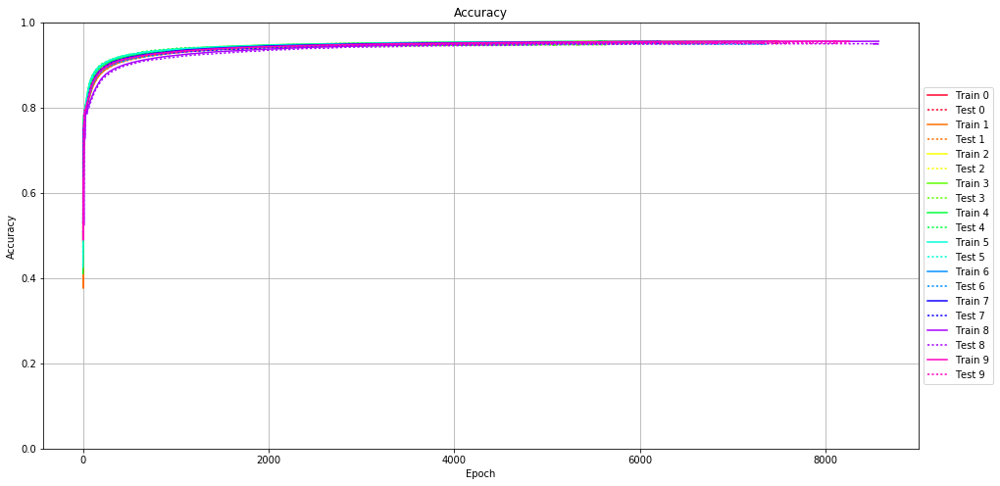

In [14]:
plot_acc(history)

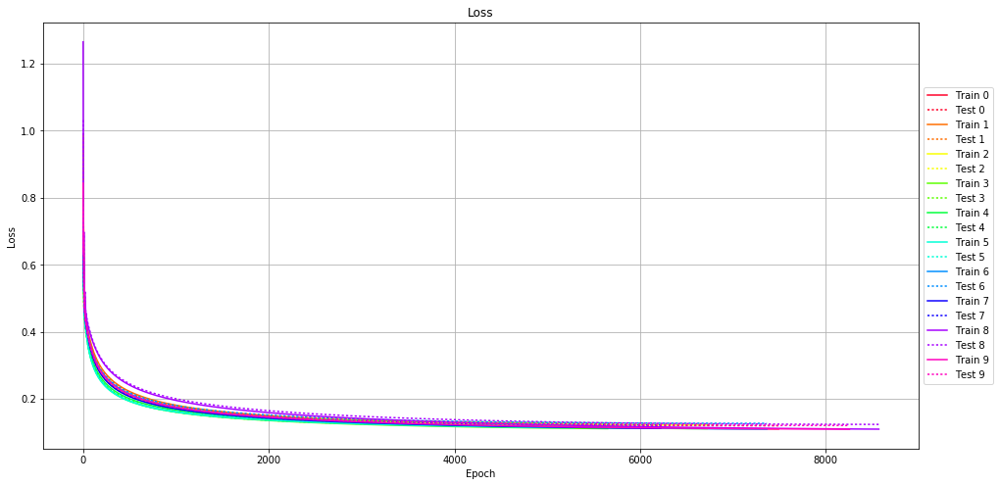

In [15]:
plot_loss(history)

Plotting the confusion matrix


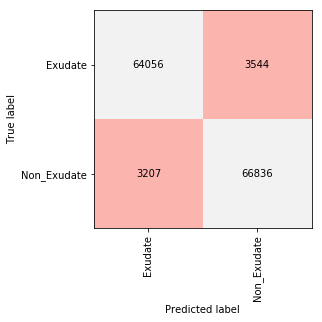

In [16]:
print("Plotting the confusion matrix")
figure = plt.gcf()
figure.set_size_inches(5, 4)
plt.imshow(conf_mat,interpolation='nearest')
for row in range(len(list_fams)):
    for col in range(len(list_fams)):
        plt.annotate(str(int(conf_mat[row][col])),xy=(col,row),ha='center',va='center')
plt.xticks(range(len(list_fams)),list_fams,rotation=90,fontsize=10)
plt.yticks(range(len(list_fams)),list_fams,fontsize=10)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

Plotting the confusion matrix normalized


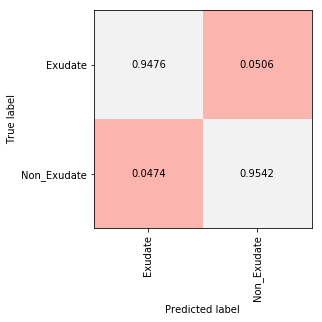

In [17]:
print("Plotting the confusion matrix normalized")
conf_mat_norm = conf_mat/no_imgs  # Normalizing the confusion matrix
conf_mat_norm = np.around(conf_mat_norm,decimals=4)  # rounding to display in figure
figure = plt.gcf()
figure.set_size_inches(5, 4)
plt.imshow(conf_mat_norm,interpolation='nearest')
for row in range(len(list_fams)):
    for col in range(len(list_fams)):
        plt.annotate(str(conf_mat_norm[row][col]),xy=(col,row),ha='center',va='center')
plt.xticks(range(len(list_fams)),list_fams,rotation=90,fontsize=10)
plt.yticks(range(len(list_fams)),list_fams,fontsize=10)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()